In [147]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "3"
import torch
import torch.autograd as autograd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as Data
import math
torch.manual_seed(8)
import time
import numpy as np
import gc
import sys
sys.setrecursionlimit(50000)
import pickle
torch.backends.cudnn.benchmark = True
torch.set_default_tensor_type('torch.cuda.FloatTensor')
# from tensorboardX import SummaryWriter
torch.nn.Module.dump_patches = True
import copy
import pandas as pd
#then import my own modules
from AttentiveFP.AttentiveLayers_Sim_copy import Fingerprint, GRN, AFSE
from AttentiveFP import Fingerprint_viz, save_smiles_dicts, get_smiles_dicts, get_smiles_array, moltosvg_highlight

In [148]:
from rdkit import Chem
# from rdkit.Chem import AllChem
from rdkit.Chem import QED
from rdkit.Chem import rdMolDescriptors, MolSurf
from rdkit.Chem.Draw import SimilarityMaps
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import rdDepictor
from rdkit.Chem.Draw import rdMolDraw2D
%matplotlib inline
from numpy.polynomial.polynomial import polyfit
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib
import seaborn as sns; sns.set()
from IPython.display import SVG, display
import sascorer
from AttentiveFP.utils import EarlyStopping, eval
from AttentiveFP.utils import Meter
from rdkit import RDLogger
RDLogger.DisableLog('rdApp.*')
import AttentiveFP.Featurizer
import scipy

In [149]:
train_filename = "./data/AID_1706_datatable_active.csv"
test_num = 100
val_rate = 0.2
random_seed = 68
batch_size = 10
file_list1 = train_filename.split('/')
file1 = file_list1[-1]
file1 = file1[:-10]
file1 = file1 + 'copy'
model_file = "model_file/G_AFSE_"+file1
log_dir = f'log/{"G_AFSE_"+file1}'
print(file1)
print(model_file)

AID_1706_datatable_copy
model_file/G_AFSE_AID_1706_datatable_copy


In [150]:
# task_name = 'Malaria Bioactivity'
tasks = ['value']

# train_filename = "../data/active_inactive/median_active/EC50/Q99500.csv"
feature_filename = train_filename.replace('.csv','.pickle')
filename = train_filename.replace('.csv','')
prefix_filename = train_filename.split('/')[-1].replace('.csv','')
train_df = pd.read_csv(train_filename, header=0, names = ["value","smiles"],usecols=[4,6])
train_df["value"] = 10*(train_df["value"] - 15)/(100-15)-5
print(train_df[:5])
# print(train_df.iloc(1))
def add_canonical_smiles(train_df):
    smilesList = train_df.smiles.values
    print("number of all smiles: ",len(smilesList))
    atom_num_dist = []
    remained_smiles = []
    canonical_smiles_list = []
    for smiles in smilesList:
        try:        
            mol = Chem.MolFromSmiles(smiles)
            atom_num_dist.append(len(mol.GetAtoms()))
            remained_smiles.append(smiles)
            canonical_smiles_list.append(Chem.MolToSmiles(Chem.MolFromSmiles(smiles), isomericSmiles=True))
        except:
            print(smiles)
            pass
    print("number of successfully processed smiles: ", len(remained_smiles))
    train_df = train_df[train_df["smiles"].isin(remained_smiles)]
    train_df['cano_smiles'] =canonical_smiles_list
    return train_df
# print(train_df)
train_df = add_canonical_smiles(train_df)

print(train_df.head())
# plt.figure(figsize=(5, 3))
# sns.set(font_scale=1.5)
# ax = sns.distplot(atom_num_dist, bins=28, kde=False)
# plt.tight_layout()
# # plt.savefig("atom_num_dist_"+prefix_filename+".png",dpi=200)
# plt.show()
# plt.close()


      value                                             smiles
0 -3.705882  CC1=CC=C(O1)C(C(=O)NCC2=CC=CO2)N(C3=CC=C(C=C3)...
1 -5.000000  CC1=CC=C(C=C1)S(=O)(=O)N2CCN(CC2)S(=O)(=O)C3=C...
2  1.588235  CC1=CC2=C(C=C1)NC(=O)C(=C2)CN(CCC3=CC=CC=C3)CC...
3 -3.117647  CC1=CC=C(C=C1)CN(C(C2=CC=CS2)C(=O)NCC3=CC=CO3)...
4 -4.411765        CCN1C2=NC(=O)N(C(=O)C2=NC(=N1)C3=CC=CC=C3)C
number of all smiles:  444
(C)OC(=O)NCCC(=O)OC1=CC2=C(C=C1)C=CC(=O)O2
Isomeric SMILES:CC1(CC2=C(CO1)SC3=C2C(=O)N(C(=N3)C4=CC5=CC=CC=C5O4)N)C
number of successfully processed smiles:  442
      value                                             smiles  \
0 -3.705882  CC1=CC=C(O1)C(C(=O)NCC2=CC=CO2)N(C3=CC=C(C=C3)...   
1 -5.000000  CC1=CC=C(C=C1)S(=O)(=O)N2CCN(CC2)S(=O)(=O)C3=C...   
2  1.588235  CC1=CC2=C(C=C1)NC(=O)C(=C2)CN(CCC3=CC=CC=C3)CC...   
3 -3.117647  CC1=CC=C(C=C1)CN(C(C2=CC=CS2)C(=O)NCC3=CC=CO3)...   
4 -4.411765        CCN1C2=NC(=O)N(C(=O)C2=NC(=N1)C3=CC=CC=C3)C   

                                      

/data/yinmingyue/anaconda3/envs/env/lib/python3.7/site-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [151]:
start_time = str(time.ctime()).replace(':','-').replace(' ','_')

p_dropout= 0.03
fingerprint_dim = 100

weight_decay = 4.3 # also known as l2_regularization_lambda
learning_rate = 4
radius = 2
T = 1
per_task_output_units_num = 1 # for regression model
output_units_num = len(tasks) * per_task_output_units_num

In [170]:
total_smilesList = train_df['smiles'].values
print(len(total_smilesList))
# if os.path.isfile(feature_filename):
#     feature_dicts = pickle.load(open(feature_filename, "rb" ))
# else:
#     feature_dicts = save_smiles_dicts(smilesList,filename)
feature_dicts = save_smiles_dicts(total_smilesList,filename)
remained_df = train_df[train_df["cano_smiles"].isin(feature_dicts['smiles_to_atom_mask'].keys())]
uncovered_df = train_df.drop(remained_df.index)
train_df = train_df.drop(uncovered_df.index)
train_df = train_df.reset_index(drop=True)

442
feature dicts file saved as ./data/AID_1706_datatable_active.pickle


In [83]:
test_df = train_df.sample(test_num,random_state=random_seed)
train_df = train_df.drop(test_df.index)
train_df = train_df.reset_index(drop=True)
val_df = train_df.sample(frac=val_rate,random_state=random_seed)
train_df = train_df.drop(val_df.index)
train_df = train_df.reset_index(drop=True)
train_df = train_df[train_df["cano_smiles"].isin(feature_dicts['smiles_to_atom_mask'].keys())]
train_df = train_df.reset_index(drop=True)
val_df = val_df[val_df["cano_smiles"].isin(feature_dicts['smiles_to_atom_mask'].keys())]
val_df = val_df.reset_index(drop=True)
test_df = test_df[test_df["cano_smiles"].isin(feature_dicts['smiles_to_atom_mask'].keys())]
test_df = test_df.reset_index(drop=True)
print(train_df.shape,val_df.shape,test_df.shape)

(274, 3) (68, 3) (100, 3)


In [153]:
x_atom, x_bonds, x_atom_index, x_bond_index, x_mask, smiles_to_rdkit_list = get_smiles_array([train_df["cano_smiles"].values[0]],feature_dicts)
num_atom_features = x_atom.shape[-1]
num_bond_features = x_bonds.shape[-1]
loss_function = nn.MSELoss()
model = Fingerprint(radius, T, num_atom_features, num_bond_features,
            fingerprint_dim, output_units_num, p_dropout)
amodel = AFSE(fingerprint_dim, output_units_num, p_dropout)
gmodel = GRN(radius, T, num_atom_features, num_bond_features,
            fingerprint_dim, p_dropout)
model.cuda()
amodel.cuda()
gmodel.cuda()

optimizer = optim.Adam(params=model.parameters(), lr=10**(-learning_rate), weight_decay=10**-weight_decay)

optimizer_AFSE = optim.Adam(params=amodel.parameters(), lr=10**(-learning_rate), weight_decay=10**-weight_decay)

# optimizer_AFSE = optim.SGD(params=amodel.parameters(), lr = 0.01, momentum=0.9)

optimizer_GRN = optim.Adam(params=gmodel.parameters(), lr=10**(-learning_rate), weight_decay=10**-weight_decay)

# tensorboard = SummaryWriter(log_dir="runs/"+start_time+"_"+prefix_filename+"_"+str(fingerprint_dim)+"_"+str(p_dropout))

model_parameters = filter(lambda p: p.requires_grad, model.parameters())
params = sum([np.prod(p.size()) for p in model_parameters])
# print(params)
# for name, param in model.named_parameters():
#     if param.requires_grad:
#         print(name, param.data.shape)
        

In [136]:
import numpy as np
from matplotlib import pyplot as plt

def sorted_show_pik(dataset, p, k, k_predict, i, acc):
    p_value = dataset[tasks[0]].astype(float).tolist()
    x = np.arange(0,len(dataset),1)
#     print('plt',dataset.head(),p[:10],k_predict,k)
#     plt.figure()
#     fig, ax1 = plt.subplots()
#     ax1.grid(False)
#     ax2 = ax1.twinx()
#     plt.grid(False)
    plt.scatter(x,p,marker='.',s=6,color='r',label='predict')
#     plt.ylabel('predict')
    plt.scatter(x,p_value,s=6,marker=',',color='blue',label='p_value')
    plt.axvline(x=k-1,ls="-",c="black")#添加垂直直线
    k_value = np.ones(len(dataset))
# #     print(EC50[k-1])
    k_value = k_value*k_predict
    plt.plot(x,k_value,'-',color='black')
    plt.ylabel('p_value')
    plt.title("epoch: {},  top-k recall: {}".format(i,acc))
    plt.legend(loc=3,fontsize=5)
    plt.show()
    

def topk_acc2(df, predict, k, active_num, show_flag=False, i=0):
    df['predict'] = predict
    df2 = df.sort_values(by='predict',ascending=False) # 拼接预测值后对预测值进行排序
#     print('df2:\n',df2)
    
    df3 = df2[:k]  #取按预测值排完序后的前k个
    
    true_sort = df.sort_values(by=tasks[0],ascending=False) #返回一个新的按真实值排序列表
    k_true = true_sort[tasks[0]].values[k-1]  # 真实排第k个的活性值
#     print('df3:\n',df3['predict'])
#     print('k_true: ',type(k_true),k_true)
#     print('k_true: ',k_true,'min_predict: ',df3['predict'].values[-1],'index: ',df3['predict'].values>=k_true,'acc_num: ',len(df3[df3['predict'].values>=k_true]),
#           'fp_num: ',len(df3[df3['predict'].values>=-4.1]),'k: ',k)
    acc = len(df3[df3[tasks[0]].values>=k_true])/k #预测值前k个中真实排在前k个的个数/k
    fp = len(df3[df3[tasks[0]].values==-4.1])/k  #预测值前k个中为-4.1的个数/k
    if k>active_num:
        min_active = true_sort[tasks[0]].values[active_num-1]
        acc = len(df3[df3[tasks[0]].values>=min_active])/k
    
    if(show_flag):
        #进来的是按实际活性值排好序的
        sorted_show_pik(true_sort,true_sort['predict'],k,k_predict,i,acc)
    return acc,fp

def topk_recall(df, predict, k, active_num, show_flag=False, i=0):
    df['predict'] = predict
    df2 = df.sort_values(by='predict',ascending=False) # 拼接预测值后对预测值进行排序
#     print('df2:\n',df2)
        
    df3 = df2[:k]  #取按预测值排完序后的前k个，因为后面的全是-4.1
    
    true_sort = df.sort_values(by=tasks[0],ascending=False) #返回一个新的按真实值排序列表
    min_active = true_sort[tasks[0]].values[active_num-1]  # 真实排第k个的活性值
#     print('df3:\n',df3['predict'])
#     print('min_active: ',type(min_active),min_active)
#     print('min_active: ',min_active,'min_predict: ',df3['predict'].values[-1],'index: ',df3['predict'].values>=min_active,'acc_num: ',len(df3[df3['predict'].values>=min_active]),
#           'fp_num: ',len(df3[df3['predict'].values>=-4.1]),'k: ',k,'active_num: ',active_num)
    acc = len(df3[df3[tasks[0]].values>-4.1])/active_num #预测值前k个中真实排在前active_num个的个数/active_num
    fp = len(df3[df3[tasks[0]].values==-4.1])/k  #预测值前k个中为-4.1的个数/active_num
    
    if(show_flag):
        #进来的是按实际活性值排好序的
        sorted_show_pik(true_sort,true_sort['predict'],k,k_predict,i,acc)
    return acc,fp

    
def topk_acc_recall(df, predict, k, active_num, show_flag=False, i=0):
    if k>active_num:
        return topk_recall(df, predict, k, active_num, show_flag, i)
    return topk_acc2(df,predict,k, active_num,show_flag,i)

def weighted_top_index(df, predict, active_num):
    weighted_acc_list=[]
    for k in np.arange(1,len(df)+1,1):
        acc, fp = topk_acc_recall(df, predict, k, active_num)
        weight = (len(df)-k)/len(df)
#         print('weight=',weight,'acc=',acc)
        weighted_acc_list.append(acc*weight)#
    weighted_acc_list = np.array(weighted_acc_list)
#     print('weighted_acc_list=',weighted_acc_list)
    return np.sum(weighted_acc_list)/weighted_acc_list.shape[0]

def AP(df, predict, active_num):
    prec = []
    rec = []
    for k in np.arange(1,len(df)+1,1):
        prec_k, fp1 = topk_acc2(df,predict,k, active_num)
        rec_k, fp2 = topk_recall(df, predict, k, active_num)
        prec.append(prec_k)
        rec.append(rec_k)
    # 取所有不同的recall对应的点处的精度值做平均
    # first append sentinel values at the end
    mrec = np.concatenate(([0.], rec, [1.]))
    mpre = np.concatenate(([0.], prec, [0.]))

    # 计算包络线，从后往前取最大保证precise非减
    for i in range(mpre.size - 1, 0, -1):
        mpre[i - 1] = np.maximum(mpre[i - 1], mpre[i])

    # 找出所有检测结果中recall不同的点
    i = np.where(mrec[1:] != mrec[:-1])[0]
#     print(prec)
#     print('prec='+str(prec)+'\n\n'+'rec='+str(rec))

    # and sum (\Delta recall) * prec
    # 用recall的间隔对精度作加权平均
    ap = np.sum((mrec[i + 1] - mrec[i]) * mpre[i + 1])
    return ap

In [137]:
def caculate_r2(y,predict):
#     print(y)
#     print(predict)
    y = torch.FloatTensor(y).reshape(-1,1)
    predict = torch.FloatTensor(predict).reshape(-1,1)
    y_mean = torch.mean(y)
    predict_mean = torch.mean(predict)
    
    y1 = torch.pow(torch.mm((y-y_mean).t(),(predict-predict_mean)),2)
    y2 = torch.mm((y-y_mean).t(),(y-y_mean))*torch.mm((predict-predict_mean).t(),(predict-predict_mean))
#     print(y1,y2)
    return y1/y2

In [138]:
from torch.autograd import Variable
def l2_norm(input, dim):
    norm = torch.norm(input, dim=dim, keepdim=True)
    output = torch.div(input, norm+1e-6)
    return output

def normalize_perturbation(d,dim=-1):
    output = l2_norm(d, dim)
    return output

def tanh(x):
    return (torch.exp(x)-torch.exp(-x))/(torch.exp(x)+torch.exp(-x))

def sigmoid(x):
    return 1/(1+torch.exp(-x))

def perturb_feature(f, model, alpha=1, lamda=10**-learning_rate, output_lr=False, output_plr=False, y=None):
    mol_prediction = model(feature=f, d=0)
    pred = mol_prediction.detach()
#     f = torch.div(f, torch.norm(f, dim=-1, keepdim=True)+1e-9)
    eps = 1e-6 * normalize_perturbation(torch.randn(f.shape))
    eps = Variable(eps, requires_grad=True)
    # Predict on randomly perturbed image
    eps_p = model(feature=f, d=eps.cuda())
    eps_p_ = model(feature=f, d=-eps.cuda())
    p_aux = nn.Sigmoid()(eps_p/(pred+1e-6))
    p_aux_ = nn.Sigmoid()(eps_p_/(pred+1e-6))
#     loss = nn.BCELoss()(abs(p_aux),torch.ones_like(p_aux))+nn.BCELoss()(abs(p_aux_),torch.ones_like(p_aux_))
    loss = loss_function(p_aux,torch.ones_like(p_aux))+loss_function(p_aux_,torch.ones_like(p_aux_))
    loss.backward(retain_graph=True)

    # Based on perturbed image, get direction of greatest error
    eps_adv = eps.grad#/10**-learning_rate
    optimizer_AFSE.zero_grad()
    # Use that direction as adversarial perturbation
    eps_adv_normed = normalize_perturbation(eps_adv)
    d_adv = lamda * eps_adv_normed.cuda()
    if output_lr:
        f_p, max_lr = model(feature=f, d=d_adv, output_lr=output_lr)
    f_p = model(feature=f, d=d_adv)
    f_p_ = model(feature=f, d=-d_adv)
    p = nn.Sigmoid()(f_p/(pred+1e-6))
    p_ = nn.Sigmoid()(f_p_/(pred+1e-6))
    vat_loss = loss_function(p,torch.ones_like(p))+loss_function(p_,torch.ones_like(p_))
    if output_lr:
        if output_plr:
            loss = loss_function(mol_prediction,y)
            loss.backward(retain_graph=True)
            optimizer_AFSE.zero_grad()
            punish_lr = torch.norm(torch.mean(eps.grad,0))
            return eps_adv.detach(), d_adv.detach(), vat_loss, mol_prediction, max_lr, punish_lr
        return eps_adv.detach(), d_adv.detach(), vat_loss, mol_prediction, max_lr
    return eps_adv.detach(), d_adv.detach(), vat_loss, mol_prediction

def mol_with_atom_index( mol ):
    atoms = mol.GetNumAtoms()
    for idx in range( atoms ):
        mol.GetAtomWithIdx( idx ).SetProp( 'molAtomMapNumber', str( mol.GetAtomWithIdx( idx ).GetIdx() ) )
    return mol

def d_loss(f, pred, model, y_val):
    diff_loss = 0
    length = len(pred)
    for i in range(length):
        for j in range(length):
            if j == i:
                continue
            pred_diff = model(feature_only=True, feature1=f[i], feature2=f[j])
            true_diff = y_val[i] - y_val[j]
            diff_loss += loss_function(pred_diff, torch.Tensor([true_diff]).view(-1,1))
    diff_loss = diff_loss/(length*(length-1))
    return diff_loss

In [164]:
def CE(x,y):
    c = 0
    l = len(y)
    for i in range(l):
        if y[i]==1:
            c += 1
    w1 = (l-c)/l
    w0 = c/l
    loss = -w1*y*torch.log(x+1e-6)-w0*(1-y)*torch.log(1-x+1e-6)
    loss = loss.mean(-1)
    return loss

def weighted_CE_loss(x,y):
    weight = 1/(y.detach().float().mean(0)+1e-9)
    weighted_CE = nn.CrossEntropyLoss(weight=weight)
#     atom_weights = (atom_weights-min(atom_weights))/(max(atom_weights)-min(atom_weights))
    return weighted_CE(x, torch.argmax(y,-1))

def ce_loss(x,y):
    ce = nn.CrossEntropyLoss()
    return ce(x, torch.argmax(y,-1))

# def generate_loss_function(refer_atom_list, x_atom, refer_bond_list, bond_neighbor, validity_mask, atom_list, bond_list):
#     [a,b,c] = x_atom.shape
#     [d,e,f,g] = bond_neighbor.shape
    
#     one_hot_loss = 0
#     interger_loss = 0
#     binary_loss = 0
#     counter_i = 0
#     counter_j = 0
#     validity_mask = torch.from_numpy(validity_mask).cuda()
#     for i in range(a):
#         l = (x_atom[i].sum(-1)!=0).sum(-1)
#         one_hot_loss += weighted_CE_loss(refer_atom_list[i,:l,:16], x_atom[i,:l,:16]) - \
#                         ((validity_mask[i,:l]*torch.log(1-atom_list[i,:l,:16]+1e-9)).sum(-1)/(validity_mask[i,:l].sum(-1)+1e-9)).mean(-1).mean(-1)+\
#                          weighted_CE_loss(refer_atom_list[i,:l,16:22], x_atom[i,:l,16:22])+ \
#                          weighted_CE_loss(refer_atom_list[i,:l,24:30], x_atom[i,:l,24:30])+ \
#                          weighted_CE_loss(refer_atom_list[i,:l,31:36], x_atom[i,:l,31:36])
#         interger_loss += loss_function(refer_atom_list[i,:l,23], x_atom[i,:l,23])+ \
#                         loss_function(refer_atom_list[i,:l,24], x_atom[i,:l,24])
#         binary_loss += CE(refer_atom_list[i,:l,30], x_atom[i,:l,30])+ \
#                         CE(refer_atom_list[i,:l,36], x_atom[i,:l,36])+ \
#                         CE(refer_atom_list[i,:l,37], x_atom[i,:l,37])+ \
#                         CE(refer_atom_list[i,:l,38], x_atom[i,:l,38])
#         counter_i += 1
#         for j in range(l):
#             n = (bond_neighbor[i,j].sum(-1)!=0).sum(-1)
#             if n==0:
#                 continue
#             one_hot_loss += weighted_CE_loss(refer_bond_list[i,j,:n,:4], bond_neighbor[i,j,:n,:4])+ \
#                              weighted_CE_loss(refer_bond_list[i,j,:n,6:], bond_neighbor[i,j,:n,6:])
#             binary_loss += CE(refer_bond_list[i,j,:n,4], bond_neighbor[i,j,:n,4])+ \
#                            CE(refer_bond_list[i,j,:n,5], bond_neighbor[i,j,:n,5])
#             counter_j += 1
#     one_hot_loss = one_hot_loss/(5*counter_i+2*counter_j)
#     interger_loss = interger_loss/(2*counter_i)
#     binary_loss = binary_loss/(4*counter_i+2*counter_j)
#     total_loss = (one_hot_loss + interger_loss + binary_loss)/3
#     return total_loss, one_hot_loss, interger_loss, binary_loss


def generate_loss_function(refer_atom_list, x_atom, refer_bond_list, bond_neighbor, validity_mask, atom_list, bond_list):
    [a,b,c] = x_atom.shape
    [d,e,f,g] = bond_neighbor.shape
    ce_loss = nn.CrossEntropyLoss()
    one_hot_loss = 0
    run_times = 0
    validity_mask = torch.from_numpy(validity_mask).cuda()
    for i in range(a):
        l = (x_atom[i].sum(-1)!=0).sum(-1)
        atom_weights = 1/x_atom[i,:l,:16].mean(-2)
#         atom_weights = (atom_weights-min(atom_weights))/max(atom_weights)
#         atom_weights = (atom_weights-min(atom_weights))/(max(atom_weights)-min(atom_weights))
        ce_atom_loss = nn.CrossEntropyLoss(weight=atom_weights)
        one_hot_loss += ce_atom_loss(refer_atom_list[i,:l,:16], torch.argmax(x_atom[i,:l,:16],-1))- \
                         ((validity_mask[i,:l]*torch.log(1-atom_list[i,:l,:16]+1e-9)).sum(-1)/(validity_mask[i,:l].sum(-1)+1e-9)).mean(-1).mean(-1) #+ \
#                          ce_loss(atom_list[i,:l,16:22], torch.argmax(x_atom[i,:l,16:22],-1))+ \
#                          ce_loss(atom_list[i,:l,24:30], torch.argmax(x_atom[i,:l,24:30],-1))+ \
#                          ce_loss(atom_list[i,:l,31:36], torch.argmax(x_atom[i,:l,31:36],-1))+ \
#                          ce_loss(atom_list[i,:l,37:39], torch.argmax(x_atom[i,:l,37:39],-1))
        run_times += 2
#         for j in range(l):
#             n = (bond_neighbor[i,j].sum(-1)!=0).sum(-1)
#             if n==0:
#                 continue
#             bond_weights = 1/bond_neighbor[i,j,:n,:4].mean(-2)
# #             bond_weights = (bond_weights-min(bond_weights))/max(bond_weights)
# #             atom_weights = (bond_weights-min(bond_weights))/(max(bond_weights)-min(bond_weights))
#             ce_bond_loss = nn.CrossEntropyLoss(weight=bond_weights)
#             one_hot_loss += ce_bond_loss(bond_list[i,j,:n,:4], torch.argmax(bond_neighbor[i,j,:n,:4],-1))+ \
#                              ce_loss(bond_list[i,j,:n,6:10], torch.argmax(bond_neighbor[i,j,:n,6:10],-1))
#             run_times += 2
#     interger_loss = loss_function(atom_list[:,:,23], x_atom[:,:,23])+ \
#                     loss_function(atom_list[:,:,24], x_atom[:,:,24])
#     binary_loss = CE(atom_list[:,:,30], x_atom[:,:,30])+ \
#                     CE(atom_list[:,:,36], x_atom[:,:,36])+ \
#                     CE(bond_neighbor[:,:,:,4], bond_list[:,:,:,4])+ \
#                     CE(bond_neighbor[:,:,:,5], bond_list[:,:,:,5])
#     total_loss = one_hot_loss/run_times + interger_loss/2 + binary_loss/4
#     return total_loss, one_hot_loss/run_times, interger_loss/2,binary_loss/4
    total_loss = one_hot_loss/run_times
    return total_loss, 0, 0, 0


def train(model, amodel, gmodel, dataset, test_df, optimizer_list, loss_function, epoch):
    model.train()
    amodel.train()
    gmodel.train()
    optimizer, optimizer_AFSE, optimizer_GRN = optimizer_list
    np.random.seed(epoch)
    max_len = np.max([len(dataset),len(test_df)])
    valList = np.arange(0,max_len)
    #shuffle them
    np.random.shuffle(valList)
    batch_list = []
    for i in range(0, max_len, batch_size):
        batch = valList[i:i+batch_size]
        batch_list.append(batch)
    for counter, batch in enumerate(batch_list):
        batch_df = dataset.loc[batch%len(dataset),:]
        batch_test = test_df.loc[batch%len(test_df),:]
        global_step = epoch * len(batch_list) + counter
        smiles_list = batch_df.cano_smiles.values
        smiles_list_test = batch_test.cano_smiles.values
        y_val = batch_df[tasks[0]].values.astype(float)
        
        x_atom, x_bonds, x_atom_index, x_bond_index, x_mask, smiles_to_rdkit_list = get_smiles_array(smiles_list,feature_dicts)
        x_atom_test, x_bonds_test, x_atom_index_test, x_bond_index_test, x_mask_test, smiles_to_rdkit_list_test = get_smiles_array(smiles_list_test,feature_dicts)
        activated_features, mol_feature = model(torch.Tensor(x_atom),torch.Tensor(x_bonds),torch.cuda.LongTensor(x_atom_index),
                                                torch.cuda.LongTensor(x_bond_index),torch.Tensor(x_mask),output_activated_features=True)
#         mol_feature = torch.div(mol_feature, torch.norm(mol_feature, dim=-1, keepdim=True)+1e-9)
#         activated_features = torch.div(activated_features, torch.norm(activated_features, dim=-1, keepdim=True)+1e-9)
        refer_atom_list, refer_bond_list = gmodel(torch.Tensor(x_atom),torch.Tensor(x_bonds),torch.cuda.LongTensor(x_atom_index),
                                                  torch.cuda.LongTensor(x_bond_index),torch.Tensor(x_mask),
                                                  mol_feature=mol_feature,activated_features=activated_features.detach())
        
        x_atom = torch.Tensor(x_atom)
        x_bonds = torch.Tensor(x_bonds)
        x_bond_index = torch.cuda.LongTensor(x_bond_index)
        
        bond_neighbor = [x_bonds[i][x_bond_index[i]] for i in range(len(batch_df))]
        bond_neighbor = torch.stack(bond_neighbor, dim=0)
        
        eps_adv, d_adv, vat_loss, mol_prediction, conv_lr, punish_lr = perturb_feature(mol_feature, amodel, alpha=1, 
                                                                                       lamda=10**-learning_rate, output_lr=True, 
                                                                                       output_plr=True, y=torch.Tensor(y_val).view(-1,1)) # 10**-learning_rate     
        regression_loss = loss_function(mol_prediction, torch.Tensor(y_val).view(-1,1))
        atom_list, bond_list = gmodel(torch.Tensor(x_atom),torch.Tensor(x_bonds),torch.cuda.LongTensor(x_atom_index),torch.cuda.LongTensor(x_bond_index),
                                      torch.Tensor(x_mask),mol_feature=mol_feature+d_adv/1e-6,activated_features=activated_features.detach())
        success_smiles_batch, modified_smiles, success_batch, total_batch, reconstruction, validity, validity_mask = modify_atoms(smiles_list, x_atom, 
                            bond_neighbor, atom_list, bond_list,smiles_list,smiles_to_rdkit_list,
                                                     refer_atom_list, refer_bond_list,topn=1, global_step=global_step)
        reconstruction_loss, one_hot_loss, interger_loss,binary_loss = generate_loss_function(refer_atom_list, x_atom, refer_bond_list, 
                                                                                              bond_neighbor, validity_mask, atom_list, 
                                                                                              bond_list)
#         x_atom_test = torch.Tensor(x_atom_test)
#         x_bonds_test = torch.Tensor(x_bonds_test)
#         x_bond_index_test = torch.cuda.LongTensor(x_bond_index_test)
        
#         bond_neighbor_test = [x_bonds_test[i][x_bond_index_test[i]] for i in range(len(batch_test))]
#         bond_neighbor_test = torch.stack(bond_neighbor_test, dim=0)
#         activated_features_test, mol_feature_test = model(torch.Tensor(x_atom_test),torch.Tensor(x_bonds_test),
#                                                           torch.cuda.LongTensor(x_atom_index_test),torch.cuda.LongTensor(x_bond_index_test),
#                                                           torch.Tensor(x_mask_test),output_activated_features=True)
#         mol_feature_test = torch.div(mol_feature_test, torch.norm(mol_feature_test, dim=-1, keepdim=True)+1e-9)
#         activated_features_test = torch.div(activated_features_test, torch.norm(activated_features_test, dim=-1, keepdim=True)+1e-9)
#         eps_test, d_test, test_vat_loss, mol_prediction_test = perturb_feature(mol_feature_test, amodel, 
#                                                                                     alpha=1, lamda=10**-learning_rate)
#         atom_list_test, bond_list_test = gmodel(torch.Tensor(x_atom_test),torch.Tensor(x_bonds_test),torch.cuda.LongTensor(x_atom_index_test),
#                                                 torch.cuda.LongTensor(x_bond_index_test),torch.Tensor(x_mask_test),
#                                                 mol_feature=mol_feature_test+d_test/1e-6,activated_features=activated_features_test.detach())
#         refer_atom_list_test, refer_bond_list_test = gmodel(torch.Tensor(x_atom_test),torch.Tensor(x_bonds_test),
#                                                             torch.cuda.LongTensor(x_atom_index_test),torch.cuda.LongTensor(x_bond_index_test),torch.Tensor(x_mask_test),
#                                                             mol_feature=mol_feature_test,activated_features=activated_features_test.detach())
#         success_smiles_batch_test, modified_smiles_test, success_batch_test, total_batch_test, reconstruction_test, validity_test, validity_mask_test = modify_atoms(smiles_list_test, x_atom_test, 
#                             bond_neighbor_test, atom_list_test, bond_list_test,smiles_list_test,smiles_to_rdkit_list_test,
#                                                      refer_atom_list_test, refer_bond_list_test,topn=1)
#         test_reconstruction_loss, test_one_hot_loss, test_interger_loss,test_binary_loss = generate_loss_function(atom_list_test, x_atom_test, bond_list_test, bond_neighbor_test, validity_mask_test, atom_list_test, bond_list_test)
        
        if vat_loss>1:
            vat_loss = 1*(vat_loss/(vat_loss+1e-6).item())
#         if vat_loss>1 or test_vat_loss>1:
#             vat_loss = 1*(vat_loss/(vat_loss+1e-6).item())
#             test_vat_loss = 1*(test_vat_loss/(test_vat_loss+1e-6).item())
        
        max_lr = 1e-3
        conv_lr = conv_lr - conv_lr**2 + 0.1 * punish_lr
        if conv_lr < max_lr:
            for param_group in optimizer_AFSE.param_groups:
                param_group["lr"] = conv_lr.detach()
                AFSE_lr = conv_lr    
        else:
            for param_group in optimizer_AFSE.param_groups:
                param_group["lr"] = max_lr
                AFSE_lr = max_lr
        
        logger.add_scalar('loss/regression', regression_loss, global_step)
        logger.add_scalar('loss/AFSE', vat_loss, global_step)
#         logger.add_scalar('loss/AFSE_test', test_vat_loss, global_step)
        logger.add_scalar('loss/GRN', reconstruction_loss, global_step)
#         logger.add_scalar('loss/GRN_test', test_reconstruction_loss, global_step)
#         logger.add_scalar('loss/GRN_one_hot', one_hot_loss, global_step)
#         logger.add_scalar('loss/GRN_interger', interger_loss, global_step)
#         logger.add_scalar('loss/GRN_binary', binary_loss, global_step)
        logger.add_scalar('lr/max_lr', conv_lr, global_step)
        logger.add_scalar('lr/punish_lr', punish_lr, global_step)
        logger.add_scalar('lr/AFSE_lr', AFSE_lr, global_step)
    
        optimizer.zero_grad()
        optimizer_AFSE.zero_grad()
        optimizer_GRN.zero_grad()
        loss =  regression_loss + vat_loss + reconstruction_loss
        loss.backward()
        optimizer.step()
        optimizer_AFSE.step()
        optimizer_GRN.step()
        
def clear_atom_map(mol):
    [a.ClearProp('molAtomMapNumber') for a  in mol.GetAtoms()]
    return mol

def mol_with_atom_index( mol ):
    atoms = mol.GetNumAtoms()
    for idx in range( atoms ):
        mol.GetAtomWithIdx( idx ).SetProp( 'molAtomMapNumber', str( mol.GetAtomWithIdx( idx ).GetIdx() ) )
    return mol
        
def modify_atoms(smiles, x_atom, bond_neighbor, atom_list, bond_list, y_smiles, smiles_to_rdkit_list,refer_atom_list, 
                 refer_bond_list,topn=1, print_flag=False, global_step=0, c_th = 0.001):
    x_atom = x_atom.cpu().detach().numpy()
    bond_neighbor = bond_neighbor.cpu().detach().numpy()
    atom_list = atom_list.cpu().detach().numpy()
    bond_list = bond_list.cpu().detach().numpy()
    refer_atom_list = refer_atom_list.cpu().detach().numpy()
    refer_bond_list = refer_bond_list.cpu().detach().numpy()
    atom_symbol_sorted = np.argsort(x_atom[:,:,:16], axis=-1)
    atom_symbol_generated_sorted = np.argsort(atom_list[:,:,:16], axis=-1)
    generate_confidence_sorted = np.sort(atom_list[:,:,:16], axis=-1)
    modified_smiles = []
    success_smiles = []
    success_reconstruction = 0
    success_validity = 0
    recon_rate = 0
    total_atom = 0
    success = [0 for i in range(topn)]
    total = [0 for i in range(topn)]
    confidence_threshold = c_th
    validity_mask = np.zeros_like(atom_list[:,:,:16])
    symbol_list = ['B','C','N','O','F','Si','P','S','Cl','As','Se','Br','Te','I','At','other']
    symbol_to_rdkit = [4,6,7,8,9,14,15,16,17,33,34,35,52,53,85,0]
    for i in range(len(atom_list)):
        rank = 0
        top_idx = 0
        flag = 0
        first_run_flag = True
        l = (x_atom[i].sum(-1)!=0).sum(-1)
        cano_smiles = Chem.MolToSmiles(Chem.MolFromSmiles(smiles[i]))
        mol = mol_with_atom_index(Chem.MolFromSmiles(smiles[i]))
        counter = 0
        for j in range(l): 
            if mol.GetAtomWithIdx(int(smiles_to_rdkit_list[cano_smiles][j])).GetAtomicNum() == \
                symbol_to_rdkit[refer_atom_list[i,j,:16].argmax(-1)]:
                counter += 1
            if print_flag:
                print(f'atom#{smiles_to_rdkit_list[cano_smiles][j]}(f):',{symbol_list[k]: np.around(refer_atom_list[i,j,k],3) for k in range(16)},
                      f'\natom#{smiles_to_rdkit_list[cano_smiles][j]}(f+d):',{symbol_list[k]: np.around(atom_list[i,j,k],3) for k in range(16)},
                     '\n------------------------------------------------------------------------------------------------------------')
#         print('预测为每个原子的平均概率：\n',np.around(atom_list[i,:l,:16].mean(1),2))
#         print('预测为每个原子的最大概率：\n',np.around(atom_list[i,:l,:16].max(1),2))
#         print(f'Successful/Total: {counter}/{l}')
        recon_rate += counter
        total_atom += l
        if counter == l:
            success_reconstruction += 1
        while not flag==topn:
            if rank == 16:
                rank = 0
                top_idx += 1
            if top_idx == l:
                if print_flag:
                    print('没有满足条件的分子生成。')
                flag += 1
                continue
#             if np.sum((atom_symbol_sorted[i,:l,-1]!=atom_symbol_generated_sorted[i,:l,-1-rank]).astype(int))==0:
#                 print(f'根据预测的第{rank}大概率的原子构成的分子与原分子一致，原子位重置为0，生成下一个元素……')
#                 rank += 1
#                 top_idx = 0
#                 generate_index = np.argsort((atom_list[i,:l,:16]-refer_atom_list[i,:l,:16] -\
#                                              x_atom[i,:l,:16]).max(-1))[-1-top_idx]
            if print_flag:
                print('i:',i,'top_idx:', top_idx, 'rank:',rank)
            if rank == 0:
                generate_index = np.argsort((atom_list[i,:l,:16]-refer_atom_list[i,:l,:16] -\
                                             x_atom[i,:l,:16]).max(-1))[-1-top_idx]
            atom_symbol_generated = np.argsort(atom_list[i,generate_index,:16]-\
                                                    refer_atom_list[i,generate_index,:16] -\
                                                    x_atom[i,generate_index,:16])[-1-rank]
            if atom_symbol_generated==x_atom[i,generate_index,:16].argmax(-1):
                if print_flag:
                    print('生成了相同元素，生成下一个元素……')
                rank += 1
                continue
            generate_rdkit_index = smiles_to_rdkit_list[cano_smiles][generate_index]
            if np.sort(atom_list[i,generate_index,:16]-\
                refer_atom_list[i,generate_index,:16] -\
                x_atom[i,generate_index,:16])[-1-rank]<confidence_threshold:
                if print_flag:
                    print(f'原子位{generate_rdkit_index}生成{symbol_list[atom_symbol_generated]}元素的置信度小于{confidence_threshold}，寻找下一个原子位……')
                top_idx += 1
                rank = 0
                continue
            if symbol_to_rdkit[atom_symbol_generated]==0:
                if print_flag:
                    print('生成了不推荐的other元素')
                rank += 1
                continue
            mol.GetAtomWithIdx(int(generate_rdkit_index)).SetAtomicNum(symbol_to_rdkit[atom_symbol_generated])
            print_mol = mol
            try:
                Chem.SanitizeMol(mol)
                if first_run_flag == True:
                    success_validity += 1
                total[flag] += 1
                if Chem.MolToSmiles(clear_atom_map(print_mol))==y_smiles[i]:
                    success[flag] +=1
                    if print_flag:
                        print('Congratulations!', success, total)
                    success_smiles.append(Chem.MolToSmiles(clear_atom_map(print_mol)))
                mol_init = mol_with_atom_index(Chem.MolFromSmiles(smiles[i]))
                modified_smiles.append(Chem.MolToSmiles(clear_atom_map(print_mol)))
                if print_flag:
                    print("修改前的分子：", smiles[i])
                    display(mol_init)
                    print(f"将第{generate_rdkit_index}个原子修改为{symbol_list[atom_symbol_generated]}的分子：", Chem.MolToSmiles(clear_atom_map(print_mol)))
                    display(mol_with_atom_index(mol))
                    mol_y = mol_with_atom_index(Chem.MolFromSmiles(y_smiles[i]))
                    print("高活性分子：", y_smiles[i])
                    display(mol_y)
                rank += 1
                flag += 1
            except:
                if print_flag:
                    print(f"第{generate_rdkit_index}个原子符号修改为{symbol_list[atom_symbol_generated]}不符合规范，生成下一个元素……")
                rank += 1
                validity_mask[i,generate_index,atom_symbol_generated] = 1
                first_run_flag = False
    recon_rate = recon_rate/total_atom
    if global_step > 0:
        logger.add_scalar('acc/recon_rate', recon_rate, global_step)
    return success_smiles, modified_smiles, success, total, success_reconstruction, success_validity, validity_mask

def modify_bonds(smiles, x_atom, bond_neighbor, atom_list, bond_list, y_smiles, smiles_to_rdkit_list):
    x_atom = x_atom.cpu().detach().numpy()
    bond_neighbor = bond_neighbor.cpu().detach().numpy()
    atom_list = atom_list.cpu().detach().numpy()
    bond_list = bond_list.cpu().detach().numpy()
    modified_smiles = []
    for i in range(len(bond_neighbor)):
        l = (bond_neighbor[i].sum(-1).sum(-1)!=0).sum(-1)
        bond_type_sorted = np.argsort(bond_list[i,:l,:,:4], axis=-1)
        bond_type_generated_sorted = np.argsort(bond_list[i,:l,:,:4], axis=-1)
        generate_confidence_sorted = np.sort(bond_list[i,:l,:,:4], axis=-1)
        rank = 0
        top_idx = 0
        flag = 0
        while not flag==3:
            cano_smiles = Chem.MolToSmiles(Chem.MolFromSmiles(smiles[i]))
            if np.sum((bond_type_sorted[i,:,-1]!=bond_type_generated_sorted[:,:,-1-rank]).astype(int))==0:
                rank += 1
                top_idx = 0
            print('i:',i,'top_idx:', top_idx, 'rank:',rank)
            bond_type = bond_type_sorted[i,:,-1]
            bond_type_generated = bond_type_generated_sorted[:,:,-1-rank]
            generate_confidence = generate_confidence_sorted[:,:,-1-rank]
#             print(np.sort(generate_confidence + \
#                                     (atom_symbol!=atom_symbol_generated).astype(int), axis=-1))
            generate_index = np.argsort(generate_confidence + 
                                (bond_type!=bond_type_generated).astype(int), axis=-1)[-1-top_idx]
            bond_type_generated_one = bond_type_generated[generate_index]
            mol = mol_with_atom_index(Chem.MolFromSmiles(smiles[i]))
            if generate_index >= len(smiles_to_rdkit_list[cano_smiles]):
                top_idx += 1
                continue
            generate_rdkit_index = smiles_to_rdkit_list[cano_smiles][generate_index]
            mol.GetBondWithIdx(int(generate_rdkit_index)).SetBondType(bond_type_generated_one)
            try:
                Chem.SanitizeMol(mol)
                mol_init = mol_with_atom_index(Chem.MolFromSmiles(smiles[i]))
                print("修改前的分子：")
                display(mol_init)
                modified_smiles.append(mol)
                print(f"将第{generate_rdkit_index}个键修改为{atom_symbol_generated}的分子：")
                display(mol)
                mol = mol_with_atom_index(Chem.MolFromSmiles(y_smiles[i]))
                print("高活性分子：")
                display(mol)
                rank += 1
                flag += 1
            except:
                print(f"第{generate_rdkit_index}个原子符号修改为{atom_symbol_generated}不符合规范")
                top_idx += 1
    return modified_smiles
        
def eval(model, amodel, gmodel, dataset, topn=1, output_feature=False, generate=False, modify_atom=True,return_GRN_loss=False, c_th = 0.001):
    model.eval()
    predict_list = []
    test_MSE_list = []
    r2_list = []
    valList = np.arange(0,dataset.shape[0])
    batch_list = []
    feature_list = []
    d_list = []
    success = [0 for i in range(topn)]
    total = [0 for i in range(topn)]
    generated_smiles = []
    success_smiles = []
    success_reconstruction = 0
    success_validity = 0
    
# #     取dataset中排序后的第k个
#     sorted_dataset = dataset.sort_values(by=tasks[0],ascending=False)
#     k_df = sorted_dataset.iloc[[k-1]]
#     k_smiles = k_df['cano_smiles'].values
#     k_value = k_df[tasks[0]].values.astype(float)    
    
    for i in range(0, dataset.shape[0], batch_size):
        batch = valList[i:i+batch_size]
        batch_list.append(batch) 
#     print(batch_list)
    for counter, batch in enumerate(batch_list):
#         print(type(batch))
        batch_df = dataset.loc[batch,:]
        smiles_list = batch_df.cano_smiles.values
        matched_smiles_list = smiles_list
#         print(batch_df)
        y_val = batch_df[tasks[0]].values.astype(float)
#         print(type(y_val))
        
        x_atom, x_bonds, x_atom_index, x_bond_index, x_mask, smiles_to_rdkit_list = get_smiles_array(matched_smiles_list,feature_dicts)
        x_atom = torch.Tensor(x_atom)
        x_bonds = torch.Tensor(x_bonds)
        x_bond_index = torch.cuda.LongTensor(x_bond_index)
        bond_neighbor = [x_bonds[i][x_bond_index[i]] for i in range(len(batch_df))]
        bond_neighbor = torch.stack(bond_neighbor, dim=0)
        
        lamda=10**-learning_rate
        activated_features, mol_feature = model(torch.Tensor(x_atom),torch.Tensor(x_bonds),torch.cuda.LongTensor(x_atom_index),torch.cuda.LongTensor(x_bond_index),torch.Tensor(x_mask),output_activated_features=True)
        eps_adv, d_adv, vat_loss, mol_prediction = perturb_feature(mol_feature, amodel, alpha=1, lamda=lamda)
#         print(mol_feature,d_adv)
        atom_list, bond_list = gmodel(torch.Tensor(x_atom),torch.Tensor(x_bonds),
                                      torch.cuda.LongTensor(x_atom_index),torch.cuda.LongTensor(x_bond_index),
                                      torch.Tensor(x_mask),mol_feature=mol_feature+d_adv/(1e-6),activated_features=activated_features)
        refer_atom_list, refer_bond_list = gmodel(torch.Tensor(x_atom),torch.Tensor(x_bonds),torch.cuda.LongTensor(x_atom_index),torch.cuda.LongTensor(x_bond_index),torch.Tensor(x_mask),mol_feature=mol_feature,activated_features=activated_features)
        if generate:
            if modify_atom:  
                success_smiles_batch, modified_smiles, success_batch, total_batch, reconstruction, validity, validity_mask = modify_atoms(matched_smiles_list, x_atom, 
                            bond_neighbor, atom_list, bond_list,smiles_list,smiles_to_rdkit_list,
                                                     refer_atom_list, refer_bond_list,topn=topn, c_th = c_th)
            else:
                modified_smiles = modify_bonds(matched_smiles_list, x_atom, bond_neighbor, atom_list, bond_list,smiles_list,smiles_to_rdkit_list)
            generated_smiles.extend(modified_smiles)
            success_smiles.extend(success_smiles_batch)
#             for n in range(topn):
#                 success[n] += success_batch[n]
#                 total[n] += total_batch[n]
#                 print('congratulations:',success,total)
            success_reconstruction += reconstruction
            success_validity += validity
        reconstruction_loss, one_hot_loss, interger_loss, binary_loss = generate_loss_function(refer_atom_list, x_atom, refer_bond_list, bond_neighbor, validity_mask, atom_list, bond_list)
        d = d_adv.cpu().detach().numpy().tolist()
        d_list.extend(d)
        mol_feature_output = mol_feature.cpu().detach().numpy().tolist()
        feature_list.extend(mol_feature_output)
#         MAE = F.l1_loss(mol_prediction, torch.Tensor(y_val).view(-1,1), reduction='none')   
#         print(type(mol_prediction))
        
        MSE = F.mse_loss(mol_prediction, torch.Tensor(y_val).view(-1,1), reduction='none')
#         r2 = caculate_r2(mol_prediction, torch.Tensor(y_val).view(-1,1))
# #         r2_list.extend(r2.cpu().detach().numpy())
#         if r2!=r2:
#             r2 = torch.tensor(0)
#         r2_list.append(r2.item())
#         predict_list.extend(mol_prediction.cpu().detach().numpy())
#         print(x_mask[:2],atoms_prediction.shape, mol_prediction,MSE)
        predict_list.extend(mol_prediction.cpu().detach().numpy())
#         test_MAE_list.extend(MAE.data.squeeze().cpu().numpy())
        test_MSE_list.extend(MSE.data.view(-1,1).cpu().numpy())
#     print(r2_list)
    if generate:
        generated_num = len(generated_smiles)
        eval_num = len(dataset)
        unique = generated_num
        novelty = generated_num
        for i in range(generated_num):
            for j in range(generated_num-i-1):
                if generated_smiles[i]==generated_smiles[i+j+1]:
                    unique -= 1
            for k in range(eval_num):
                if generated_smiles[i]==dataset['smiles'].values[k]:
                    novelty -= 1
        unique_rate = unique/(generated_num+1e-9)
        novelty_rate = novelty/(generated_num+1e-9)
#         print(f'successfully/total generated molecules =', {f'Top-{i+1}': f'{success[i]}/{total[i]}' for i in range(topn)})
        return success_reconstruction/len(dataset), success_validity/len(dataset), unique_rate, novelty_rate, success_smiles, generated_smiles, caculate_r2(predict_list,dataset[tasks[0]].values.astype(float).tolist()),np.array(test_MSE_list).mean(),predict_list
    if return_GRN_loss:
        return d_list, feature_list,caculate_r2(predict_list,dataset[tasks[0]].values.astype(float).tolist()),np.array(test_MSE_list).mean(),predict_list,reconstruction_loss, one_hot_loss, interger_loss,binary_loss
    if output_feature:
        return d_list, feature_list,caculate_r2(predict_list,dataset[tasks[0]].values.astype(float).tolist()),np.array(test_MSE_list).mean(),predict_list
    return caculate_r2(predict_list,dataset[tasks[0]].values.astype(float).tolist()),np.array(test_MSE_list).mean(),predict_list

epoch = 0
max_epoch = 1000
batch_size = 10
patience = 1000
stopper = EarlyStopping(mode='higher', patience=patience, filename=model_file + '_model.pth')
stopper_afse = EarlyStopping(mode='higher', patience=patience, filename=model_file + '_amodel.pth')
stopper_generate = EarlyStopping(mode='higher', patience=patience, filename=model_file + '_gmodel.pth')

In [13]:
import datetime
from tensorboardX import SummaryWriter
now = datetime.datetime.now().strftime('%b%d_%H-%M-%S')
if os.path.isdir(log_dir):
    for files in os.listdir(log_dir):
        os.remove(log_dir+"/"+files)
    os.rmdir(log_dir)
logger = SummaryWriter(log_dir)
print(log_dir)

log/G_AFSE_AID_1706_datatable_copy


In [14]:
optimizer_list = [optimizer, optimizer_AFSE, optimizer_GRN]
while epoch < max_epoch:
    train(model, amodel, gmodel, train_df, test_df, optimizer_list, loss_function, epoch)
#     print(train_df.shape,test_df.shape)
    train_recon, train_validity, train_unique, train_novelty, _, _, train_r2, train_MSE, train_predict = eval(model, amodel, gmodel, train_df, topn=1, generate=True)
    val_recon, val_validity, val_unique, val_novelty, _, _, val_r2, val_MSE, val_predict = eval(model, amodel, gmodel, val_df, topn=1, generate=True)
    
    test_recon, test_validity, test_unique, test_novelty, _, _, test_r2, test_MSE, test_predict = eval(model, amodel, gmodel, test_df, topn=1, generate=True)

    val_average = (val_recon+val_validity+val_unique+val_novelty)/4
    test_average = (test_recon+test_validity+test_unique+test_novelty)/4
    epoch = epoch + 1
    global_step = epoch * int(np.max([len(train_df),len(test_df)])/batch_size)
    
    logger.add_scalar('val/recon', val_recon, global_step)
    logger.add_scalar('val/validity', val_validity, global_step)
    logger.add_scalar('val/unique', val_unique, global_step)
    logger.add_scalar('val/novelty', val_novelty, global_step)
    logger.add_scalar('test/recon', test_recon, global_step)
    logger.add_scalar('test/validity', test_validity, global_step)
    logger.add_scalar('test/unique', test_unique, global_step)
    logger.add_scalar('test/novelty', test_novelty, global_step)
    
    early_stop = stopper.step(val_average, model)
    early_stop = stopper_afse.step(val_average, amodel, if_print=False)
    early_stop = stopper_generate.step(val_average, gmodel, if_print=False)
#     print('epoch {:d}/{:d}, validation {} {:.4f}, {} {:.4f},best validation {r2} {:.4f}'.format(epoch, total_epoch, 'r2', val_r2, 'mse:',val_MSE, stopper.best_score))
    print(epoch, 'Rec: %.4f'%train_recon,'%.4f'%val_recon,'%.4f'%test_recon, 'Vali: %.4f'%val_validity,'%.4f'%test_validity,
         'Uni: %.2f'%val_unique,'%.2f'%test_unique, 'Nov: %.2f'%val_novelty,'%.2f'%test_novelty,
         'Avg: %.4f'%val_average,'%.4f'%test_average)
    if early_stop:
        break


1 Rec: 0.0000 0.0000 0.0000 Vali: 0.7059 0.7000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.6765 0.6750
EarlyStopping counter: 1 out of 1000
2 Rec: 0.0000 0.0000 0.0000 Vali: 0.6176 0.6000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.6544 0.6500
EarlyStopping counter: 2 out of 1000
3 Rec: 0.0000 0.0000 0.0000 Vali: 0.7059 0.6400 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.6765 0.6600
EarlyStopping counter: 3 out of 1000
4 Rec: 0.0000 0.0000 0.0000 Vali: 0.5441 0.5100 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.6360 0.6275
EarlyStopping counter: 4 out of 1000
5 Rec: 0.0000 0.0000 0.0000 Vali: 0.5588 0.5600 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.6397 0.6400
EarlyStopping counter: 5 out of 1000
6 Rec: 0.0000 0.0000 0.0000 Vali: 0.6324 0.6000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.6581 0.6500
EarlyStopping counter: 6 out of 1000
7 Rec: 0.0000 0.0000 0.0000 Vali: 0.6176 0.6000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.6544 0.6500
EarlyStopping counter: 7 out of 1000
8 Rec: 0.0000 0.0000 0.0000 Vali: 0.6618 0.5900 Uni: 1.00 1.00

EarlyStopping counter: 1 out of 1000
66 Rec: 0.2263 0.2059 0.2400 Vali: 0.8235 0.9000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.7574 0.7850
EarlyStopping counter: 2 out of 1000
67 Rec: 0.2372 0.2353 0.2700 Vali: 0.7647 0.8700 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.7500 0.7850
EarlyStopping counter: 3 out of 1000
68 Rec: 0.2482 0.2206 0.2400 Vali: 0.8088 0.9400 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.7574 0.7950
EarlyStopping counter: 4 out of 1000
69 Rec: 0.2409 0.2206 0.2600 Vali: 0.8235 0.9100 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.7610 0.7925
EarlyStopping counter: 5 out of 1000
70 Rec: 0.2482 0.2059 0.2800 Vali: 0.8676 0.8300 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.7684 0.7775
EarlyStopping counter: 6 out of 1000
71 Rec: 0.2299 0.2500 0.2600 Vali: 0.7647 0.8200 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.7537 0.7700
EarlyStopping counter: 7 out of 1000
72 Rec: 0.2445 0.2206 0.2600 Vali: 0.7794 0.8200 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.7500 0.7700
EarlyStopping counter: 8 out of 1000
73 Rec: 0.2445 0.2

EarlyStopping counter: 3 out of 1000
128 Rec: 0.2701 0.2794 0.3000 Vali: 0.8824 0.9300 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.7904 0.8075
EarlyStopping counter: 4 out of 1000
129 Rec: 0.2664 0.2647 0.2800 Vali: 0.8971 0.9600 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.7904 0.8100
130 Rec: 0.2555 0.2794 0.2900 Vali: 0.9265 0.9100 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.8015 0.8000
131 Rec: 0.2701 0.2647 0.3000 Vali: 0.9706 0.9600 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.8088 0.8150
EarlyStopping counter: 1 out of 1000
132 Rec: 0.2445 0.2353 0.3000 Vali: 0.9853 0.9300 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.8051 0.8075
EarlyStopping counter: 2 out of 1000
133 Rec: 0.2701 0.2647 0.3100 Vali: 0.9265 0.9300 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.7978 0.8100
EarlyStopping counter: 3 out of 1000
134 Rec: 0.2482 0.2353 0.3000 Vali: 0.8971 0.9400 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.7831 0.8100
EarlyStopping counter: 4 out of 1000
135 Rec: 0.2737 0.2794 0.2900 Vali: 0.9559 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 

EarlyStopping counter: 5 out of 1000
190 Rec: 0.2847 0.2794 0.3300 Vali: 0.9853 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.8162 0.8300
EarlyStopping counter: 6 out of 1000
191 Rec: 0.2810 0.2941 0.3000 Vali: 1.0000 0.9800 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.8235 0.8200
EarlyStopping counter: 7 out of 1000
192 Rec: 0.2737 0.2794 0.3200 Vali: 0.9706 0.9600 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.8125 0.8200
EarlyStopping counter: 8 out of 1000
193 Rec: 0.2810 0.2941 0.3200 Vali: 0.8971 0.9600 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.7978 0.8200
EarlyStopping counter: 9 out of 1000
194 Rec: 0.2810 0.2647 0.3300 Vali: 0.9853 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.8125 0.8325
EarlyStopping counter: 10 out of 1000
195 Rec: 0.2847 0.2941 0.3300 Vali: 1.0000 0.9800 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.8235 0.8275
EarlyStopping counter: 11 out of 1000
196 Rec: 0.2810 0.2941 0.3300 Vali: 0.9706 0.9800 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.8162 0.8275
EarlyStopping counter: 12 out of 1000
197 Rec:

EarlyStopping counter: 22 out of 1000
252 Rec: 0.5036 0.5294 0.5800 Vali: 0.9853 0.9800 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.8787 0.8900
EarlyStopping counter: 23 out of 1000
253 Rec: 0.5146 0.5441 0.6000 Vali: 0.9412 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.8713 0.8975
EarlyStopping counter: 24 out of 1000
254 Rec: 0.5000 0.5294 0.5700 Vali: 0.9853 0.9800 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.8787 0.8875
EarlyStopping counter: 25 out of 1000
255 Rec: 0.5292 0.4853 0.6000 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.8713 0.9000
EarlyStopping counter: 26 out of 1000
256 Rec: 0.5219 0.5441 0.6100 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.8860 0.9025
EarlyStopping counter: 27 out of 1000
257 Rec: 0.5073 0.5588 0.6200 Vali: 0.9853 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.8860 0.9025
258 Rec: 0.6204 0.6176 0.6800 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9044 0.9200
259 Rec: 0.6752 0.7500 0.7100 Vali: 0.9706 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00

EarlyStopping counter: 41 out of 1000
314 Rec: 0.7555 0.7500 0.7400 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9375 0.9350
EarlyStopping counter: 42 out of 1000
315 Rec: 0.7372 0.7206 0.7300 Vali: 0.9853 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9265 0.9325
EarlyStopping counter: 43 out of 1000
316 Rec: 0.7518 0.7206 0.7200 Vali: 1.0000 0.9700 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9301 0.9225
EarlyStopping counter: 44 out of 1000
317 Rec: 0.7445 0.7353 0.7200 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9338 0.9300
EarlyStopping counter: 45 out of 1000
318 Rec: 0.7482 0.7353 0.7400 Vali: 0.9853 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9301 0.9325
EarlyStopping counter: 46 out of 1000
319 Rec: 0.7591 0.7647 0.7300 Vali: 0.9853 0.9800 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9375 0.9275
EarlyStopping counter: 47 out of 1000
320 Rec: 0.7372 0.7500 0.7100 Vali: 0.9853 0.9800 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9338 0.9225
EarlyStopping counter: 48 out of 1000
321

EarlyStopping counter: 2 out of 1000
376 Rec: 0.8759 0.9265 0.8400 Vali: 1.0000 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9816 0.9575
EarlyStopping counter: 3 out of 1000
377 Rec: 0.8796 0.9412 0.8300 Vali: 1.0000 0.9700 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9853 0.9500
EarlyStopping counter: 4 out of 1000
378 Rec: 0.8759 0.9559 0.8500 Vali: 0.9559 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9779 0.9600
EarlyStopping counter: 5 out of 1000
379 Rec: 0.8796 0.9412 0.8500 Vali: 0.9706 0.9600 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9779 0.9525
EarlyStopping counter: 6 out of 1000
380 Rec: 0.8869 0.9412 0.8500 Vali: 0.9706 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9779 0.9600
EarlyStopping counter: 7 out of 1000
381 Rec: 0.8723 0.8824 0.8500 Vali: 0.9853 0.9800 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9669 0.9575
EarlyStopping counter: 8 out of 1000
382 Rec: 0.8796 0.9559 0.8500 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9890 0.9625
EarlyStopping counter: 9 out of 1000
383 Rec: 0.

EarlyStopping counter: 54 out of 1000
441 Rec: 0.9489 0.9559 0.9200 Vali: 0.9559 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9779 0.9800
EarlyStopping counter: 55 out of 1000
442 Rec: 0.9599 0.9412 0.9400 Vali: 0.9853 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9816 0.9825
EarlyStopping counter: 56 out of 1000
443 Rec: 0.9781 0.9853 0.9100 Vali: 0.9559 0.9600 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9853 0.9675
EarlyStopping counter: 57 out of 1000
444 Rec: 0.9635 0.9559 0.9400 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9890 0.9850
EarlyStopping counter: 58 out of 1000
445 Rec: 0.9562 0.9412 0.9600 Vali: 0.9412 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9706 0.9875
EarlyStopping counter: 59 out of 1000
446 Rec: 0.9708 0.9559 0.9200 Vali: 0.9706 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9816 0.9800
EarlyStopping counter: 60 out of 1000
447 Rec: 0.9599 0.9412 0.9300 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9853 0.9825
EarlyStopping counter: 61 out of 1000
448

EarlyStopping counter: 9 out of 1000
502 Rec: 0.9672 0.9853 0.9600 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9900
EarlyStopping counter: 10 out of 1000
503 Rec: 0.9781 0.9853 0.9500 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9875
EarlyStopping counter: 11 out of 1000
504 Rec: 0.9635 0.9853 0.9300 Vali: 1.0000 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9800
EarlyStopping counter: 12 out of 1000
505 Rec: 0.9708 0.9706 0.9400 Vali: 0.9559 0.9800 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9816 0.9800
EarlyStopping counter: 13 out of 1000
506 Rec: 0.9745 0.9706 0.9500 Vali: 1.0000 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9850
EarlyStopping counter: 14 out of 1000
507 Rec: 0.9818 0.9412 0.9400 Vali: 0.9853 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9816 0.9850
EarlyStopping counter: 15 out of 1000
508 Rec: 0.9489 0.9559 0.9300 Vali: 1.0000 0.9700 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9890 0.9750
EarlyStopping counter: 16 out of 1000
509 

EarlyStopping counter: 6 out of 1000
563 Rec: 0.9635 0.9265 0.9500 Vali: 0.9853 0.9800 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9779 0.9825
EarlyStopping counter: 7 out of 1000
564 Rec: 0.9781 0.9706 0.9100 Vali: 0.9853 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9890 0.9750
EarlyStopping counter: 8 out of 1000
565 Rec: 0.9781 0.9706 0.9200 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9800
EarlyStopping counter: 9 out of 1000
566 Rec: 0.9599 0.9412 0.9500 Vali: 1.0000 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9853 0.9850
EarlyStopping counter: 10 out of 1000
567 Rec: 0.9708 0.9853 0.9400 Vali: 1.0000 0.9700 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9775
EarlyStopping counter: 11 out of 1000
568 Rec: 0.9672 0.9412 0.9200 Vali: 1.0000 0.9800 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9853 0.9750
EarlyStopping counter: 12 out of 1000
569 Rec: 0.9672 0.9853 0.9500 Vali: 0.9853 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9875
EarlyStopping counter: 13 out of 1000
570 Rec

EarlyStopping counter: 66 out of 1000
623 Rec: 0.9781 0.9853 0.9600 Vali: 1.0000 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9875
EarlyStopping counter: 67 out of 1000
624 Rec: 0.9635 0.9559 0.9300 Vali: 1.0000 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9890 0.9800
EarlyStopping counter: 68 out of 1000
625 Rec: 0.9781 0.9706 0.9500 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9875
EarlyStopping counter: 69 out of 1000
626 Rec: 0.9818 0.9412 0.9600 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9853 0.9900
EarlyStopping counter: 70 out of 1000
627 Rec: 0.9781 0.9853 0.9500 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9875
EarlyStopping counter: 71 out of 1000
628 Rec: 0.9854 1.0000 0.9300 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 1.0000 0.9825
EarlyStopping counter: 72 out of 1000
629 Rec: 0.9635 0.9265 0.9500 Vali: 0.9853 0.9800 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9779 0.9825
EarlyStopping counter: 73 out of 1000
630

EarlyStopping counter: 126 out of 1000
683 Rec: 0.9818 0.9559 0.9700 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9890 0.9925
EarlyStopping counter: 127 out of 1000
684 Rec: 0.9672 0.9559 0.9400 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9890 0.9850
EarlyStopping counter: 128 out of 1000
685 Rec: 0.9672 0.9853 0.9400 Vali: 1.0000 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9825
EarlyStopping counter: 129 out of 1000
686 Rec: 0.9708 0.9706 0.9500 Vali: 1.0000 0.9800 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9825
EarlyStopping counter: 130 out of 1000
687 Rec: 0.9708 1.0000 0.9600 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 1.0000 0.9900
EarlyStopping counter: 131 out of 1000
688 Rec: 0.9708 0.9853 0.9600 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9900
EarlyStopping counter: 132 out of 1000
689 Rec: 0.9781 1.0000 0.9600 Vali: 1.0000 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 1.0000 0.9875
EarlyStopping counter: 133 out of 

EarlyStopping counter: 186 out of 1000
743 Rec: 0.9781 0.9706 0.9400 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9850
EarlyStopping counter: 187 out of 1000
744 Rec: 0.9854 0.9853 0.9300 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9825
EarlyStopping counter: 188 out of 1000
745 Rec: 0.9781 0.9706 0.9400 Vali: 1.0000 0.9800 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9800
EarlyStopping counter: 189 out of 1000
746 Rec: 0.9818 0.9706 0.9500 Vali: 1.0000 0.9800 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9825
EarlyStopping counter: 190 out of 1000
747 Rec: 0.9927 0.9853 0.9500 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9875
EarlyStopping counter: 191 out of 1000
748 Rec: 0.9708 0.9853 0.9400 Vali: 1.0000 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9825
EarlyStopping counter: 192 out of 1000
749 Rec: 0.9781 0.9559 0.9500 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9890 0.9875
EarlyStopping counter: 193 out of 

EarlyStopping counter: 246 out of 1000
803 Rec: 0.9781 0.9853 0.9300 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9825
EarlyStopping counter: 247 out of 1000
804 Rec: 0.9745 0.9706 0.9600 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9900
EarlyStopping counter: 248 out of 1000
805 Rec: 0.9781 0.9559 0.9300 Vali: 0.9853 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9853 0.9800
EarlyStopping counter: 249 out of 1000
806 Rec: 0.9781 0.9706 0.9600 Vali: 0.9853 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9890 0.9900
EarlyStopping counter: 250 out of 1000
807 Rec: 0.9818 0.9706 0.9500 Vali: 0.9853 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9890 0.9850
EarlyStopping counter: 251 out of 1000
808 Rec: 0.9818 0.9853 0.9300 Vali: 1.0000 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9800
EarlyStopping counter: 252 out of 1000
809 Rec: 0.9745 1.0000 0.9400 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 1.0000 0.9850
EarlyStopping counter: 253 out of 

EarlyStopping counter: 306 out of 1000
863 Rec: 0.9818 0.9853 0.9400 Vali: 0.9853 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9825
EarlyStopping counter: 307 out of 1000
864 Rec: 0.9818 0.9706 0.9600 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9900
EarlyStopping counter: 308 out of 1000
865 Rec: 0.9854 0.9559 0.9500 Vali: 0.9853 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9853 0.9875
EarlyStopping counter: 309 out of 1000
866 Rec: 0.9781 0.9853 0.9200 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9800
EarlyStopping counter: 310 out of 1000
867 Rec: 0.9745 0.9853 0.9200 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9800
EarlyStopping counter: 311 out of 1000
868 Rec: 0.9891 0.9853 0.9600 Vali: 0.9853 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9900
EarlyStopping counter: 312 out of 1000
869 Rec: 0.9818 0.9706 0.9400 Vali: 1.0000 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9825
EarlyStopping counter: 313 out of 

EarlyStopping counter: 366 out of 1000
923 Rec: 0.9854 0.9853 0.9600 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9900
EarlyStopping counter: 367 out of 1000
924 Rec: 0.9818 0.9853 0.9600 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9900
EarlyStopping counter: 368 out of 1000
925 Rec: 0.9818 0.9706 0.9500 Vali: 1.0000 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9850
EarlyStopping counter: 369 out of 1000
926 Rec: 0.9781 1.0000 0.9500 Vali: 0.9853 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9875
EarlyStopping counter: 370 out of 1000
927 Rec: 0.9745 0.9853 0.9500 Vali: 1.0000 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9850
EarlyStopping counter: 371 out of 1000
928 Rec: 0.9745 0.9853 0.9600 Vali: 0.9853 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9900
EarlyStopping counter: 372 out of 1000
929 Rec: 0.9781 0.9706 0.9500 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9875
EarlyStopping counter: 373 out of 

EarlyStopping counter: 426 out of 1000
983 Rec: 0.9854 0.9853 0.9600 Vali: 1.0000 0.9700 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9825
EarlyStopping counter: 427 out of 1000
984 Rec: 0.9854 1.0000 0.9500 Vali: 0.9853 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9850
EarlyStopping counter: 428 out of 1000
985 Rec: 0.9854 0.9853 0.9400 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9963 0.9850
EarlyStopping counter: 429 out of 1000
986 Rec: 0.9854 0.9706 0.9500 Vali: 0.9853 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9890 0.9875
EarlyStopping counter: 430 out of 1000
987 Rec: 0.9708 0.9265 0.9300 Vali: 1.0000 1.0000 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9816 0.9825
EarlyStopping counter: 431 out of 1000
988 Rec: 0.9818 0.9706 0.9500 Vali: 1.0000 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9926 0.9850
EarlyStopping counter: 432 out of 1000
989 Rec: 0.9854 0.9265 0.9300 Vali: 1.0000 0.9900 Uni: 1.00 1.00 Nov: 1.00 1.00 Avg: 0.9816 0.9800
EarlyStopping counter: 433 out of 

In [15]:
stopper.load_checkpoint(model)
stopper_afse.load_checkpoint(amodel)
stopper_generate.load_checkpoint(gmodel)
    
reconstruction_rate, success_validity, unique_rate, novelty_rate, success_smiles, generated_smiles, test_r2, test_MSE, test_predict = eval(model, amodel, gmodel, test_df, topn=1, generate=True)
test_predict = np.array(test_predict)

print("----------")
print('Reconstruction: %.4f'%reconstruction_rate,'\nValidity: %.4f'%success_validity)

print('Unique: %.4f'%unique_rate,'\nNovelty: %.4f'%novelty_rate, 
      '\nAverage: %.4f'%((reconstruction_rate+success_validity+unique_rate+novelty_rate)/4))

----------
Reconstruction: 0.9400 
Validity: 1.0000
Unique: 1.0000 
Novelty: 1.0000 
Average: 0.9850


In [61]:
import math
import pickle
from rdkit import Chem
from rdkit.Chem import rdMolDescriptors
import os
import os.path as op
 
#get_sa_score start
_fscores = None
 
def readFragmentScores(name='fpscores'):
    import gzip
    global _fscores
    # generate the full path filename:
    if name == "fpscores":
        name = op.join(os.getcwd(), name)
        # name = op.join(op.dirname(__file__), name)
    data = pickle.load(gzip.open('%s.pkl.gz' % name))
    outDict = {}
    for i in data:
        for j in range(1, len(i)):
            outDict[i[j]] = float(i[0])
    _fscores = outDict
 
 
def numBridgeheadsAndSpiro(mol, ri=None):
    nSpiro = rdMolDescriptors.CalcNumSpiroAtoms(mol)
    nBridgehead = rdMolDescriptors.CalcNumBridgeheadAtoms(mol)
    return nBridgehead, nSpiro
 
def calculateScore(m):
    if _fscores is None:
        readFragmentScores()
 
    # fragment score
    fp = rdMolDescriptors.GetMorganFingerprint(m,
                                            2)  # <- 2 is the *radius* of the circular fingerprint
    fps = fp.GetNonzeroElements()
    score1 = 0.
    nf = 0
    for bitId, v in fps.items():
        nf += v
        sfp = bitId
        score1 += _fscores.get(sfp, -4) * v
    score1 /= nf
 
    # features score
    nAtoms = m.GetNumAtoms()
    nChiralCenters = len(Chem.FindMolChiralCenters(m, includeUnassigned=True))
    ri = m.GetRingInfo()
    nBridgeheads, nSpiro = numBridgeheadsAndSpiro(m, ri)
    nMacrocycles = 0
    for x in ri.AtomRings():
        if len(x) > 8:
            nMacrocycles += 1
 
    sizePenalty = nAtoms**1.005 - nAtoms
    stereoPenalty = math.log10(nChiralCenters + 1)
    spiroPenalty = math.log10(nSpiro + 1)
    bridgePenalty = math.log10(nBridgeheads + 1)
    macrocyclePenalty = 0.
    # ---------------------------------------
    # This differs from the paper, which defines:
    # macrocyclePenalty = math.log10(nMacrocycles+1)
    # This form generates better results when 2 or more macrocycles are present
    if nMacrocycles > 0:
        macrocyclePenalty = math.log10(2)
 
    score2 = 0. - sizePenalty - stereoPenalty - spiroPenalty - bridgePenalty - macrocyclePenalty
 
    # correction for the fingerprint density
    # not in the original publication, added in version 1.1
    # to make highly symmetrical molecules easier to synthetise
    score3 = 0.
    if nAtoms > len(fps):
        score3 = math.log(float(nAtoms) / len(fps)) * .5
 
    sascore = score1 + score2 + score3
 
    # need to transform "raw" value into scale between 1 and 10
    min = -4.0
    max = 2.5
    sascore = 11. - (sascore - min + 1) / (max - min) * 9.
    # smooth the 10-end
    if sascore > 8.:
        sascore = 8. + math.log(sascore + 1. - 9.)
    if sascore > 10.:
        sascore = 10.0
    elif sascore < 1.:
        sascore = 1.0
 
    return sascore

def SA_score(mols:list):
    ss = []
    readFragmentScores("fpscores")
#     print('smiles\tsa_score')
    for m in mols:
        s = calculateScore(m)
        smiles = Chem.MolToSmiles(m)
        ss.append(s)
#         print(smiles + "\t" + "\t%3f" % s)
    return ss

In [199]:
total_step = 3
test_predict = []
generated_smiles = []
stopper.load_checkpoint(model)
stopper_afse.load_checkpoint(amodel)
stopper_generate.load_checkpoint(gmodel)
total_smilesList = train_df['smiles'].values
feature_dicts = save_smiles_dicts(total_smilesList,filename)
generated_df = train_df
for step in range(total_step):
    _, _, _, _, _, generated_smiles_step, _, _, test_predict_step = eval(model, amodel, gmodel, generated_df, topn=3, generate=True, c_th = 0.002)
    test_predict.extend(test_predict_step)
    generated_df = pd.DataFrame([])
    generated_df['smiles'] = generated_smiles_step
    generated_df['value'] = 0
    generated_df = add_canonical_smiles(generated_df)
    feature_dicts = save_smiles_dicts(generated_df['cano_smiles'],filename)
    generated_df = generated_df[generated_df["cano_smiles"].isin(feature_dicts['smiles_to_atom_mask'].keys())]
    generated_df = generated_df.reset_index(drop=True)
    generated_smiles.extend(generated_df['cano_smiles'])
test_predict = np.array(test_predict)
print(len(test_predict),len(generated_smiles))
QED_scores = []
logP_scores = []
generated_mols = []
smiles_num = len(generated_smiles)
for i in range(smiles_num):
    mol = Chem.MolFromSmiles(generated_smiles[i])
    if mol is not None:
        generated_mols.append(mol)
        QED = Chem.QED.default(mol)
        QED_scores.append(QED)
        logP = Chem.Crippen.MolLogP(mol)
        logP_scores.append(logP)
SA_scores = np.array(SA_score(generated_mols))
QED_scores = np.array(QED_scores)
QED_scores_ranked = np.sort(QED_scores)
logP_scores = np.array(logP_scores)
print('QED Rank:', QED_scores_ranked[-5:],
      '\nQED（越大类药性越高）: %.4f'%max(QED_scores), '%.4f'%(sum(QED_scores)/smiles_num),'%.4f'%min(QED_scores),
      '\nSA（越小可合成性越高）: %.4f'%max(SA_scores), '%.4f'%(sum(SA_scores)/smiles_num),'%.4f'%min(SA_scores),
      '\nlogP（越大疏水性越好）: %.4f'%max(logP_scores), '%.4f'%(sum(logP_scores)/smiles_num),'%.4f'%min(logP_scores),
      )

feature dicts file saved as ./data/AID_1706_datatable_active.pickle
number of all smiles:  376
C[Be]1CNC2CC(NC(=O)c3ccc(Cl)cc3)CCC12
COC(=O)c1cc(N2CCCCF2)sc1N
O=C(O)c1cc(NN=C2C3CCCCC3C3FCOCC23)ccc1Cl
COc1cccc(CNC(=O)CN(c2ccc(C(C)C)cc2)S(=O)(=O)C2C(C)OFC2C)c1
NC(=O)COO1[SH](C(=O)N2NCCC([N+](=O)[O-])N2)N2NCCNN2[Br+]1[O-]
number of successfully processed smiles:  371


/data/yinmingyue/anaconda3/envs/env/lib/python3.7/site-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


feature dicts file saved as ./data/AID_1706_datatable_active.pickle
number of all smiles:  271
COC(=O)C1CC(N2CCCCO2)ClC1N
CC1NC(c2cccc(Br)c2)C2NC(c3cccs3)FC(C(=O)O)C12
O.[O-]C1CCO(Br)O2OCC[F+](Cl)N12
[C-][N+](=O)C1NClNC1NC(=O)CSc1ccccn1
number of successfully processed smiles:  267
feature dicts file saved as ./data/AID_1706_datatable_active.pickle
number of all smiles:  258
CN(C)CC1ClC(NC(=O)CCl)C(C(=O)[Se]CCl)C1c1ccccc1.Cl
C=C(CCl)C(CC1C[Br+]([O-])NC2CCCCC12)c1ccc(ON)cc1
CCc1cccc(/C=N/NC(=O)c2nnn(C3FCNC3F)c2CN(Br)c2ccccc2)c1
number of successfully processed smiles:  255
feature dicts file saved as ./data/AID_1706_datatable_active.pickle
1080 893
QED Rank: [0.92411537 0.93511617 0.93630992 0.94479128 0.9460623 ] 
QED（越大类药性越高）: 0.9461 0.4690 0.0997 
SA（越小可合成性越高）: 6.6320 3.5166 1.6801 
logP（越大疏水性越好）: 7.1523 3.4624 -1.5083


number of all smiles:  893
number of successfully processed smiles:  893
feature dicts file saved as ./data/AID_1706_datatable_active.pickle
1080 893


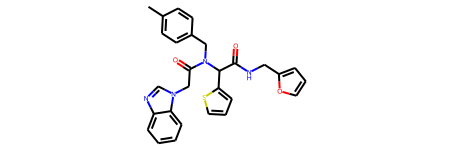

成功生成的高活性分子： Cc1ccc(CN(C(=O)Cn2cnc3ccccc32)C(C(=O)NCc2ccco2)c2cccs2)cc1 
Activity（越大药效越好）: 3.2749 
QED（越大类药性越高）: 0.3072 
SA（越小可合成性越高）: 2.9632 
logP（越大疏水性越好）: 5.0857 
------------------------------------------------------------------------------------------------------------


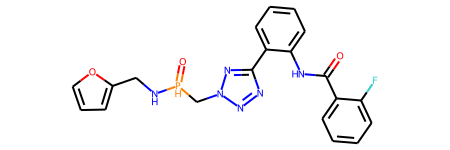

成功生成的高活性分子： O=C(Nc1ccccc1-c1nnn(C[PH](=O)NCc2ccco2)n1)c1ccccc1F 
Activity（越大药效越好）: 31.2088 
QED（越大类药性越高）: 0.4028 
SA（越小可合成性越高）: 3.4240 
logP（越大疏水性越好）: 3.5465 
------------------------------------------------------------------------------------------------------------


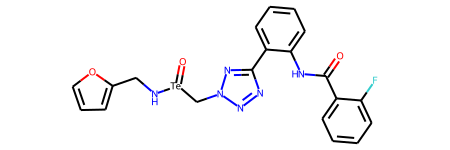

成功生成的高活性分子： O=C(Nc1ccccc1-c1nnn(C[Te](=O)NCc2ccco2)n1)c1ccccc1F 
Activity（越大药效越好）: 35.7359 
QED（越大类药性越高）: 0.3332 
SA（越小可合成性越高）: 3.0777 
logP（越大疏水性越好）: 2.5722 
------------------------------------------------------------------------------------------------------------


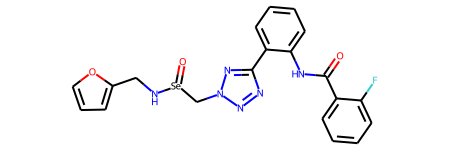

成功生成的高活性分子： O=C(Nc1ccccc1-c1nnn(C[Se](=O)NCc2ccco2)n1)c1ccccc1F 
Activity（越大药效越好）: 29.1448 
QED（越大类药性越高）: 0.3674 
SA（越小可合成性越高）: 3.4298 
logP（越大疏水性越好）: 2.5722 
------------------------------------------------------------------------------------------------------------


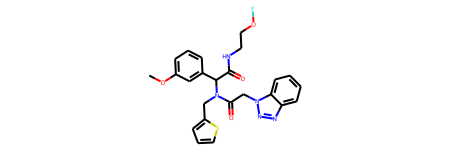

成功生成的高活性分子： COc1cccc(C(C(=O)NCCOF)N(Cc2cccs2)C(=O)Cn2nnc3ccccc32)c1 
Activity（越大药效越好）: 26.9818 
QED（越大类药性越高）: 0.3195 
SA（越小可合成性越高）: 3.1512 
logP（越大疏水性越好）: 3.2888 
------------------------------------------------------------------------------------------------------------


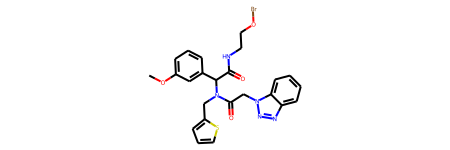

成功生成的高活性分子： COc1cccc(C(C(=O)NCCOBr)N(Cc2cccs2)C(=O)Cn2nnc3ccccc32)c1 
Activity（越大药效越好）: 28.0671 
QED（越大类药性越高）: 0.2821 
SA（越小可合成性越高）: 3.1820 
logP（越大疏水性越好）: 3.7142 
------------------------------------------------------------------------------------------------------------


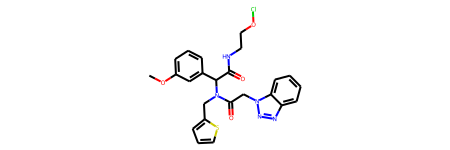

成功生成的高活性分子： COc1cccc(C(C(=O)NCCOCl)N(Cc2cccs2)C(=O)Cn2nnc3ccccc32)c1 
Activity（越大药效越好）: 31.9851 
QED（越大类药性越高）: 0.3079 
SA（越小可合成性越高）: 3.1502 
logP（越大疏水性越好）: 3.5581 
------------------------------------------------------------------------------------------------------------


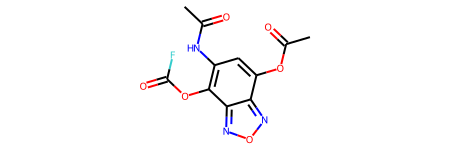

成功生成的高活性分子： CC(=O)Nc1cc(OC(C)=O)c2nonc2c1OC(=O)F 
Activity（越大药效越好）: 17.2039 
QED（越大类药性越高）: 0.5145 
SA（越小可合成性越高）: 3.0847 
logP（越大疏水性越好）: 1.5748 
------------------------------------------------------------------------------------------------------------


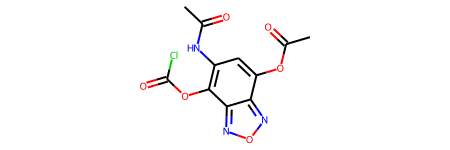

成功生成的高活性分子： CC(=O)Nc1cc(OC(C)=O)c2nonc2c1OC(=O)Cl 
Activity（越大药效越好）: 12.2483 
QED（越大类药性越高）: 0.5173 
SA（越小可合成性越高）: 2.9976 
logP（越大疏水性越好）: 1.8441 
------------------------------------------------------------------------------------------------------------


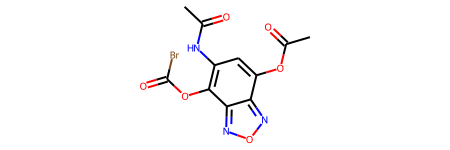

成功生成的高活性分子： CC(=O)Nc1cc(OC(C)=O)c2nonc2c1OC(=O)Br 
Activity（越大药效越好）: 18.2470 
QED（越大类药性越高）: 0.5024 
SA（越小可合成性越高）: 3.1298 
logP（越大疏水性越好）: 2.0002 
------------------------------------------------------------------------------------------------------------


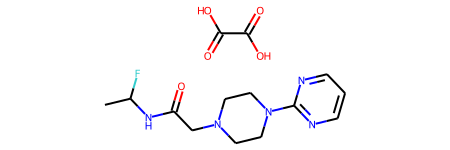

成功生成的高活性分子： CC(F)NC(=O)CN1CCN(c2ncccn2)CC1.O=C(O)C(=O)O 
Activity（越大药效越好）: -6.5558 
QED（越大类药性越高）: 0.4665 
SA（越小可合成性越高）: 2.8888 
logP（越大疏水性越好）: -0.8141 
------------------------------------------------------------------------------------------------------------


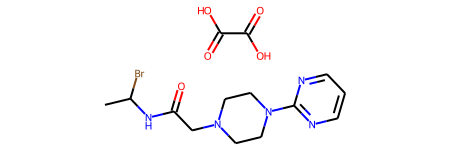

成功生成的高活性分子： CC(Br)NC(=O)CN1CCN(c2ncccn2)CC1.O=C(O)C(=O)O 
Activity（越大药效越好）: -8.3394 
QED（越大类药性越高）: 0.3394 
SA（越小可合成性越高）: 2.8957 
logP（越大疏水性越好）: -0.3887 
------------------------------------------------------------------------------------------------------------


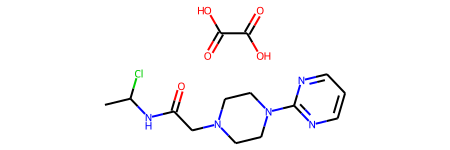

成功生成的高活性分子： CC(Cl)NC(=O)CN1CCN(c2ncccn2)CC1.O=C(O)C(=O)O 
Activity（越大药效越好）: 16.5284 
QED（越大类药性越高）: 0.3606 
SA（越小可合成性越高）: 2.8337 
logP（越大疏水性越好）: -0.5448 
------------------------------------------------------------------------------------------------------------


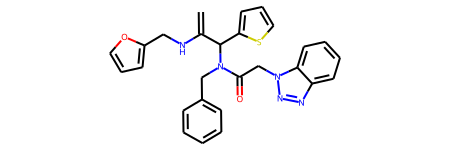

成功生成的高活性分子： C=C(NCc1ccco1)C(c1cccs1)N(Cc1ccccc1)C(=O)Cn1nnc2ccccc21 
Activity（越大药效越好）: 11.7537 
QED（越大类药性越高）: 0.2970 
SA（越小可合成性越高）: 3.1572 
logP（越大疏水性越好）: 5.1594 
------------------------------------------------------------------------------------------------------------


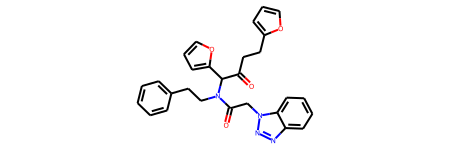

成功生成的高活性分子： O=C(CCc1ccco1)C(c1ccco1)N(CCc1ccccc1)C(=O)Cn1nnc2ccccc21 
Activity（越大药效越好）: 31.9085 
QED（越大类药性越高）: 0.2724 
SA（越小可合成性越高）: 3.1309 
logP（越大疏水性越好）: 4.6318 
------------------------------------------------------------------------------------------------------------


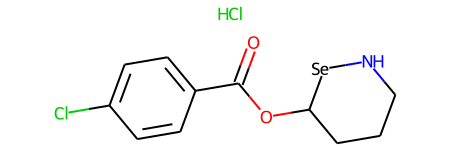

成功生成的高活性分子： Cl.O=C(OC1CCCN[Se]1)c1ccc(Cl)cc1 
Activity（越大药效越好）: 40.0906 
QED（越大类药性越高）: 0.6625 
SA（越小可合成性越高）: 3.6983 
logP（越大疏水性越好）: 2.2473 
------------------------------------------------------------------------------------------------------------


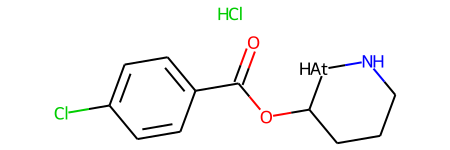

成功生成的高活性分子： Cl.O=C(OC1CCCN[AtH]1)c1ccc(Cl)cc1 
Activity（越大药效越好）: 41.3049 
QED（越大类药性越高）: 0.6713 
SA（越小可合成性越高）: 3.7904 
logP（越大疏水性越好）: 2.3604 
------------------------------------------------------------------------------------------------------------


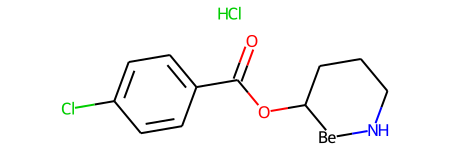

成功生成的高活性分子： Cl.O=C(OC1[Be]NCCC1)c1ccc(Cl)cc1 
Activity（越大药效越好）: 45.1416 
QED（越大类药性越高）: 0.6619 
SA（越小可合成性越高）: 3.7904 
logP（越大疏水性越好）: 2.2473 
------------------------------------------------------------------------------------------------------------


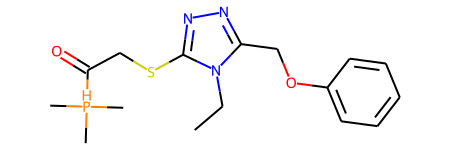

成功生成的高活性分子： CCn1c(COc2ccccc2)nnc1SCC(=O)[PH](C)(C)C 
Activity（越大药效越好）: 18.0699 
QED（越大类药性越高）: 0.5390 
SA（越小可合成性越高）: 3.0167 
logP（越大疏水性越好）: 3.1350 
------------------------------------------------------------------------------------------------------------


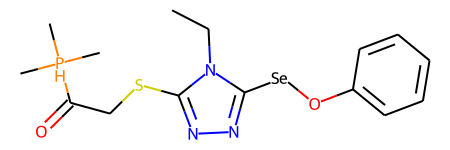

成功生成的高活性分子： CCn1c(SCC(=O)[PH](C)(C)C)nnc1[Se]Oc1ccccc1 
Activity（越大药效越好）: 23.1760 
QED（越大类药性越高）: 0.3724 
SA（越小可合成性越高）: 3.9764 
logP（越大疏水性越好）: 1.8795 
------------------------------------------------------------------------------------------------------------


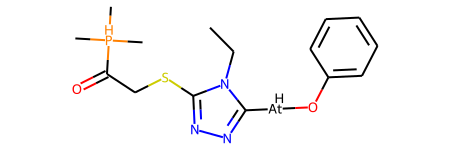

成功生成的高活性分子： CCn1c(SCC(=O)[PH](C)(C)C)nnc1[AtH]Oc1ccccc1 
Activity（越大药效越好）: 22.4087 
QED（越大类药性越高）: 0.3721 
SA（越小可合成性越高）: 4.0751 
logP（越大疏水性越好）: 1.9926 
------------------------------------------------------------------------------------------------------------


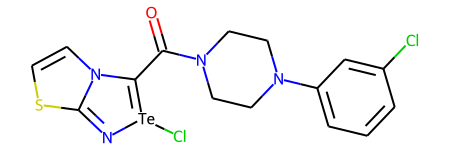

成功生成的高活性分子： O=C(C1=[Te](Cl)N=C2SC=CN21)N1CCN(c2cccc(Cl)c2)CC1 
Activity（越大药效越好）: 48.3108 
QED（越大类药性越高）: 0.5893 
SA（越小可合成性越高）: 3.4958 
logP（越大疏水性越好）: 2.3168 
------------------------------------------------------------------------------------------------------------


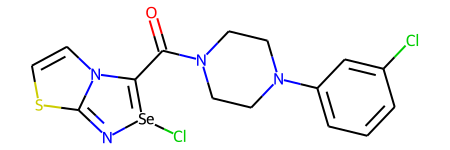

成功生成的高活性分子： O=C(C1=[Se](Cl)N=C2SC=CN21)N1CCN(c2cccc(Cl)c2)CC1 
Activity（越大药效越好）: 55.7741 
QED（越大类药性越高）: 0.6518 
SA（越小可合成性越高）: 3.8795 
logP（越大疏水性越好）: 2.3168 
------------------------------------------------------------------------------------------------------------


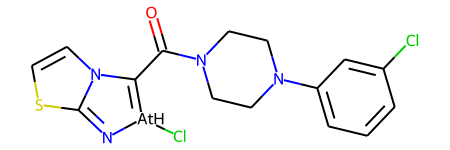

成功生成的高活性分子： O=C(C1=[AtH](Cl)N=C2SC=CN21)N1CCN(c2cccc(Cl)c2)CC1 
Activity（越大药效越好）: 67.5890 
QED（越大类药性越高）: 0.5396 
SA（越小可合成性越高）: 3.9127 
logP（越大疏水性越好）: 2.4299 
------------------------------------------------------------------------------------------------------------


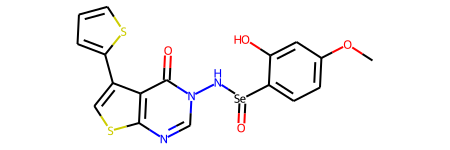

成功生成的高活性分子： COc1ccc([Se](=O)Nn2cnc3scc(-c4cccs4)c3c2=O)c(O)c1 
Activity（越大药效越好）: 2.4960 
QED（越大类药性越高）: 0.4387 
SA（越小可合成性越高）: 3.8034 
logP（越大疏水性越好）: 2.2701 
------------------------------------------------------------------------------------------------------------


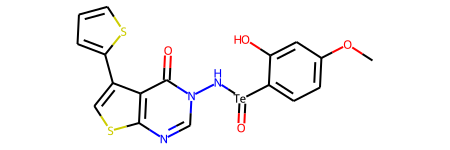

成功生成的高活性分子： COc1ccc([Te](=O)Nn2cnc3scc(-c4cccs4)c3c2=O)c(O)c1 
Activity（越大药效越好）: 9.7208 
QED（越大类药性越高）: 0.3968 
SA（越小可合成性越高）: 3.4780 
logP（越大疏水性越好）: 2.2701 
------------------------------------------------------------------------------------------------------------


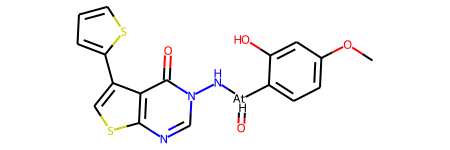

成功生成的高活性分子： COc1ccc([AtH](=O)Nn2cnc3scc(-c4cccs4)c3c2=O)c(O)c1 
Activity（越大药效越好）: 17.1867 
QED（越大类药性越高）: 0.3669 
SA（越小可合成性越高）: 3.8948 
logP（越大疏水性越好）: 2.3832 
------------------------------------------------------------------------------------------------------------


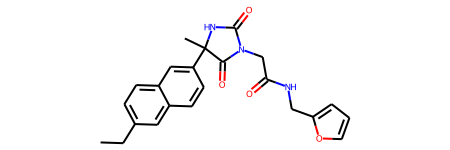

成功生成的高活性分子： CCc1ccc2cc(C3(C)NC(=O)N(CC(=O)NCc4ccco4)C3=O)ccc2c1 
Activity（越大药效越好）: 13.2478 
QED（越大类药性越高）: 0.6168 
SA（越小可合成性越高）: 2.7883 
logP（越大疏水性越好）: 3.0786 
------------------------------------------------------------------------------------------------------------


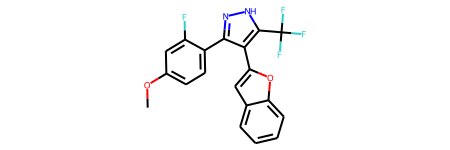

成功生成的高活性分子： COc1ccc(-c2n[nH]c(C(F)(F)F)c2-c2cc3ccccc3o2)c(F)c1 
Activity（越大药效越好）: 16.7775 
QED（越大类药性越高）: 0.4698 
SA（越小可合成性越高）: 2.5690 
logP（越大疏水性越好）: 5.6564 
------------------------------------------------------------------------------------------------------------


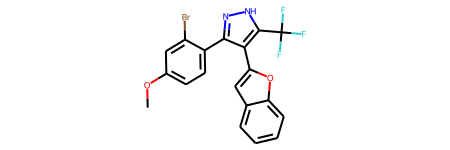

成功生成的高活性分子： COc1ccc(-c2n[nH]c(C(F)(F)F)c2-c2cc3ccccc3o2)c(Br)c1 
Activity（越大药效越好）: 20.7509 
QED（越大类药性越高）: 0.4106 
SA（越小可合成性越高）: 2.6521 
logP（越大疏水性越好）: 6.2798 
------------------------------------------------------------------------------------------------------------


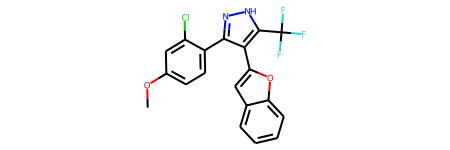

成功生成的高活性分子： COc1ccc(-c2n[nH]c(C(F)(F)F)c2-c2cc3ccccc3o2)c(Cl)c1 
Activity（越大药效越好）: 22.2008 
QED（越大类药性越高）: 0.4532 
SA（越小可合成性越高）: 2.5605 
logP（越大疏水性越好）: 6.1707 
------------------------------------------------------------------------------------------------------------


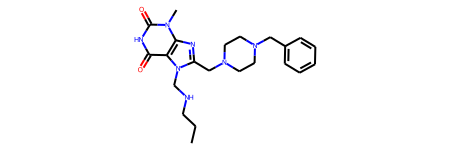

成功生成的高活性分子： CCCNCn1c(CN2CCN(Cc3ccccc3)CC2)nc2c1c(=O)[nH]c(=O)n2C 
Activity（越大药效越好）: 79.6066 
QED（越大类药性越高）: 0.5165 
SA（越小可合成性越高）: 2.5458 
logP（越大疏水性越好）: 0.6982 
------------------------------------------------------------------------------------------------------------


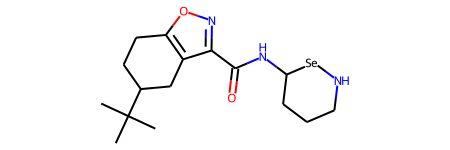

成功生成的高活性分子： CC(C)(C)C1CCc2onc(C(=O)NC3CCCN[Se]3)c2C1 
Activity（越大药效越好）: 25.4306 
QED（越大类药性越高）: 0.7806 
SA（越小可合成性越高）: 4.4256 
logP（越大疏水性越好）: 1.8841 
------------------------------------------------------------------------------------------------------------


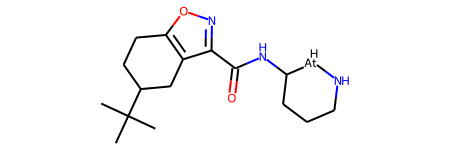

成功生成的高活性分子： CC(C)(C)C1CCc2onc(C(=O)NC3CCCN[AtH]3)c2C1 
Activity（越大药效越好）: 21.3979 
QED（越大类药性越高）: 0.6498 
SA（越小可合成性越高）: 4.4954 
logP（越大疏水性越好）: 1.9972 
------------------------------------------------------------------------------------------------------------


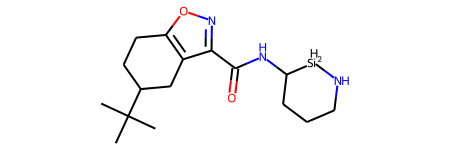

成功生成的高活性分子： CC(C)(C)C1CCc2onc(C(=O)NC3CCCN[SiH2]3)c2C1 
Activity（越大药效越好）: 23.8097 
QED（越大类药性越高）: 0.8070 
SA（越小可合成性越高）: 4.4202 
logP（越大疏水性越好）: 1.3487 
------------------------------------------------------------------------------------------------------------


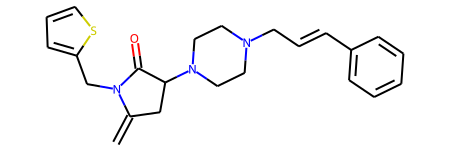

成功生成的高活性分子： C=C1CC(N2CCN(C/C=C/c3ccccc3)CC2)C(=O)N1Cc1cccs1 
Activity（越大药效越好）: 18.5849 
QED（越大类药性越高）: 0.7488 
SA（越小可合成性越高）: 3.1539 
logP（越大疏水性越好）: 3.6937 
------------------------------------------------------------------------------------------------------------


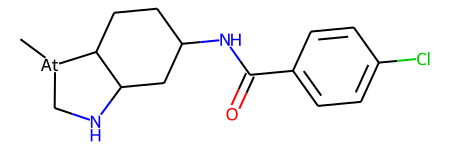

成功生成的高活性分子： C[At]1CNC2CC(NC(=O)c3ccc(Cl)cc3)CCC21 
Activity（越大药效越好）: 24.4226 
QED（越大类药性越高）: 0.6706 
SA（越小可合成性越高）: 4.2547 
logP（越大疏水性越好）: 3.0089 
------------------------------------------------------------------------------------------------------------


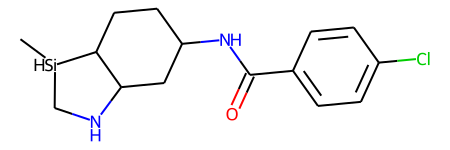

成功生成的高活性分子： C[SiH]1CNC2CC(NC(=O)c3ccc(Cl)cc3)CCC21 
Activity（越大药效越好）: 3.5086 
QED（越大类药性越高）: 0.8236 
SA（越小可合成性越高）: 4.2843 
logP（越大疏水性越好）: 2.3604 
------------------------------------------------------------------------------------------------------------


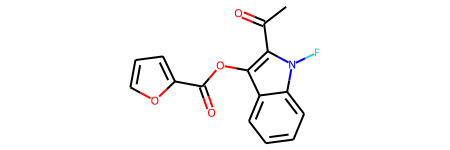

成功生成的高活性分子： CC(=O)c1c(OC(=O)c2ccco2)c2ccccc2n1F 
Activity（越大药效越好）: 29.0696 
QED（越大类药性越高）: 0.5469 
SA（越小可合成性越高）: 2.6981 
logP（越大疏水性越好）: 3.3887 
------------------------------------------------------------------------------------------------------------


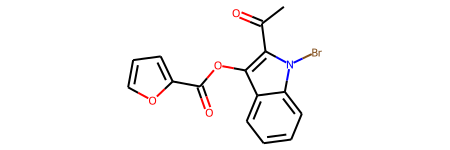

成功生成的高活性分子： CC(=O)c1c(OC(=O)c2ccco2)c2ccccc2n1Br 
Activity（越大药效越好）: 28.9450 
QED（越大类药性越高）: 0.5334 
SA（越小可合成性越高）: 2.7240 
logP（越大疏水性越好）: 3.8141 
------------------------------------------------------------------------------------------------------------


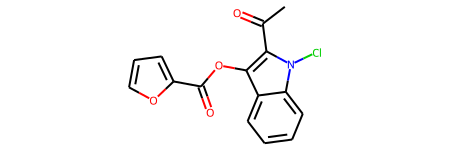

成功生成的高活性分子： CC(=O)c1c(OC(=O)c2ccco2)c2ccccc2n1Cl 
Activity（越大药效越好）: 25.6452 
QED（越大类药性越高）: 0.5470 
SA（越小可合成性越高）: 2.6523 
logP（越大疏水性越好）: 3.6580 
------------------------------------------------------------------------------------------------------------


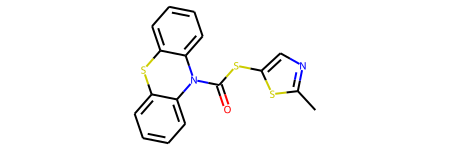

成功生成的高活性分子： Cc1ncc(SC(=O)N2c3ccccc3Sc3ccccc32)s1 
Activity（越大药效越好）: 25.8990 
QED（越大类药性越高）: 0.5032 
SA（越小可合成性越高）: 2.7898 
logP（越大疏水性越好）: 5.9665 
------------------------------------------------------------------------------------------------------------


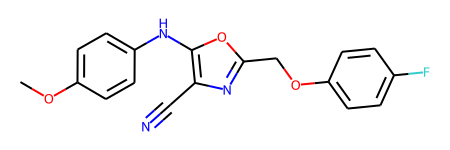

成功生成的高活性分子： COc1ccc(Nc2oc(COc3ccc(F)cc3)nc2C#N)cc1 
Activity（越大药效越好）: 16.1230 
QED（越大类药性越高）: 0.7305 
SA（越小可合成性越高）: 2.2315 
logP（越大疏水性越好）: 4.0166 
------------------------------------------------------------------------------------------------------------


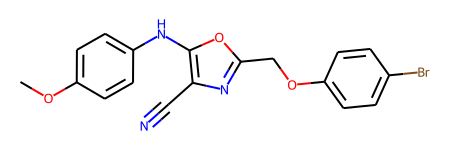

成功生成的高活性分子： COc1ccc(Nc2oc(COc3ccc(Br)cc3)nc2C#N)cc1 
Activity（越大药效越好）: 19.9117 
QED（越大类药性越高）: 0.6495 
SA（越小可合成性越高）: 2.2781 
logP（越大疏水性越好）: 4.6400 
------------------------------------------------------------------------------------------------------------


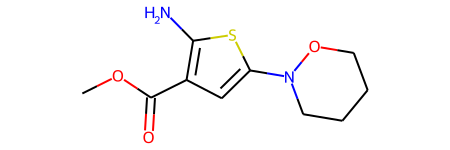

成功生成的高活性分子： COC(=O)c1cc(N2CCCCO2)sc1N 
Activity（越大药效越好）: 38.4388 
QED（越大类药性越高）: 0.7987 
SA（越小可合成性越高）: 3.1913 
logP（越大疏水性越好）: 1.6487 
------------------------------------------------------------------------------------------------------------


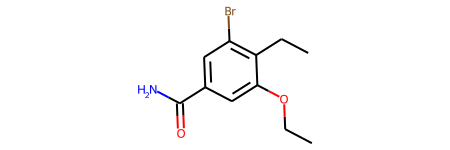

成功生成的高活性分子： CCOc1cc(C(N)=O)cc(Br)c1CC 
Activity（越大药效越好）: 18.5210 
QED（越大类药性越高）: 0.9151 
SA（越小可合成性越高）: 2.2249 
logP（越大疏水性越好）: 2.5091 
------------------------------------------------------------------------------------------------------------


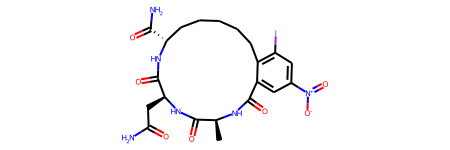

成功生成的高活性分子： C[C@@H]1NC(=O)c2cc([N+](=O)[O-])cc(I)c2CCCCC[C@@H](C(N)=O)NC(=O)[C@H](CC(N)=O)NC1=O 
Activity（越大药效越好）: -23.8288 
QED（越大类药性越高）: 0.1770 
SA（越小可合成性越高）: 4.4099 
logP（越大疏水性越好）: -0.2355 
------------------------------------------------------------------------------------------------------------


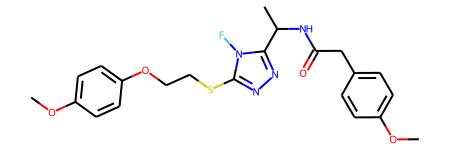

成功生成的高活性分子： COc1ccc(CC(=O)NC(C)c2nnc(SCCOc3ccc(OC)cc3)n2F)cc1 
Activity（越大药效越好）: 15.3637 
QED（越大类药性越高）: 0.3454 
SA（越小可合成性越高）: 2.9038 
logP（越大疏水性越好）: 3.6189 
------------------------------------------------------------------------------------------------------------


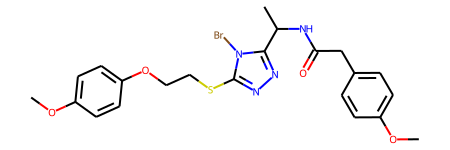

成功生成的高活性分子： COc1ccc(CC(=O)NC(C)c2nnc(SCCOc3ccc(OC)cc3)n2Br)cc1 
Activity（越大药效越好）: 17.1617 
QED（越大类药性越高）: 0.3011 
SA（越小可合成性越高）: 2.9206 
logP（越大疏水性越好）: 4.0443 
------------------------------------------------------------------------------------------------------------


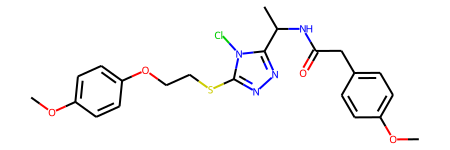

成功生成的高活性分子： COc1ccc(CC(=O)NC(C)c2nnc(SCCOc3ccc(OC)cc3)n2Cl)cc1 
Activity（越大药效越好）: 20.8906 
QED（越大类药性越高）: 0.3316 
SA（越小可合成性越高）: 2.8920 
logP（越大疏水性越好）: 3.8882 
------------------------------------------------------------------------------------------------------------


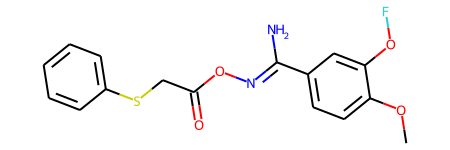

成功生成的高活性分子： COc1ccc(/C(N)=N/OC(=O)CSc2ccccc2)cc1OF 
Activity（越大药效越好）: 14.3384 
QED（越大类药性越高）: 0.2718 
SA（越小可合成性越高）: 2.5317 
logP（越大疏水性越好）: 2.9143 
------------------------------------------------------------------------------------------------------------


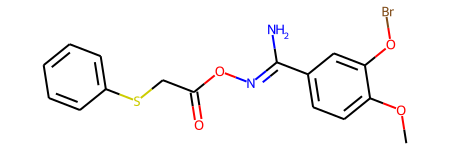

成功生成的高活性分子： COc1ccc(/C(N)=N/OC(=O)CSc2ccccc2)cc1OBr 
Activity（越大药效越好）: 17.9138 
QED（越大类药性越高）: 0.2475 
SA（越小可合成性越高）: 2.6014 
logP（越大疏水性越好）: 3.3397 
------------------------------------------------------------------------------------------------------------


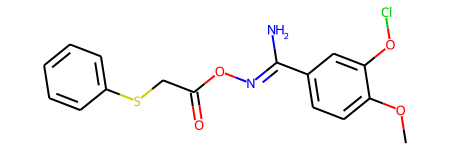

成功生成的高活性分子： COc1ccc(/C(N)=N/OC(=O)CSc2ccccc2)cc1OCl 
Activity（越大药效越好）: 10.2281 
QED（越大类药性越高）: 0.2662 
SA（越小可合成性越高）: 2.5149 
logP（越大疏水性越好）: 3.1836 
------------------------------------------------------------------------------------------------------------


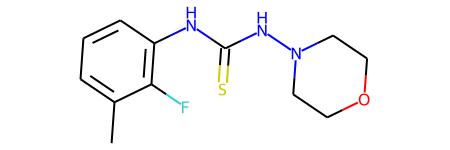

成功生成的高活性分子： Cc1cccc(NC(=S)NN2CCOCC2)c1F 
Activity（越大药效越好）: 13.4618 
QED（越大类药性越高）: 0.7988 
SA（越小可合成性越高）: 2.4381 
logP（越大疏水性越好）: 1.6677 
------------------------------------------------------------------------------------------------------------


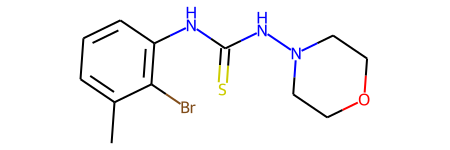

成功生成的高活性分子： Cc1cccc(NC(=S)NN2CCOCC2)c1Br 
Activity（越大药效越好）: 13.6204 
QED（越大类药性越高）: 0.8141 
SA（越小可合成性越高）: 2.5831 
logP（越大疏水性越好）: 2.2911 
------------------------------------------------------------------------------------------------------------


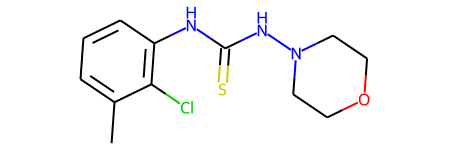

成功生成的高活性分子： Cc1cccc(NC(=S)NN2CCOCC2)c1Cl 
Activity（越大药效越好）: 16.4561 
QED（越大类药性越高）: 0.8149 
SA（越小可合成性越高）: 2.4173 
logP（越大疏水性越好）: 2.1820 
------------------------------------------------------------------------------------------------------------


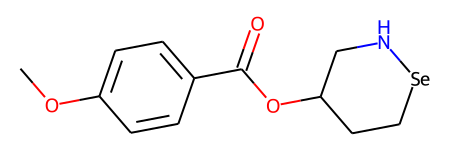

成功生成的高活性分子： COc1ccc(C(=O)OC2CC[Se]NC2)cc1 
Activity（越大药效越好）: 31.0921 
QED（越大类药性越高）: 0.6741 
SA（越小可合成性越高）: 3.4411 
logP（越大疏水性越好）: 1.2514 
------------------------------------------------------------------------------------------------------------


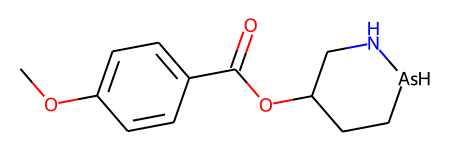

成功生成的高活性分子： COc1ccc(C(=O)OC2CC[AsH]NC2)cc1 
Activity（越大药效越好）: 31.9754 
QED（越大类药性越高）: 0.6674 
SA（越小可合成性越高）: 3.7988 
logP（越大疏水性越好）: 0.9837 
------------------------------------------------------------------------------------------------------------


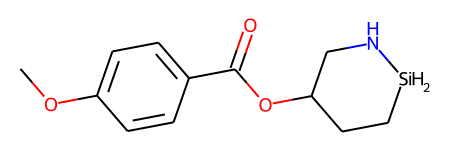

成功生成的高活性分子： COc1ccc(C(=O)OC2CC[SiH2]NC2)cc1 
Activity（越大药效越好）: 34.4328 
QED（越大类药性越高）: 0.6349 
SA（越小可合成性越高）: 3.4378 
logP（越大疏水性越好）: 0.7160 
------------------------------------------------------------------------------------------------------------


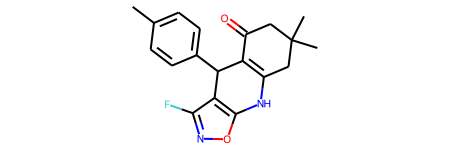

成功生成的高活性分子： Cc1ccc(C2C3=C(CC(C)(C)CC3=O)Nc3onc(F)c32)cc1 
Activity（越大药效越好）: 21.4476 
QED（越大类药性越高）: 0.8476 
SA（越小可合成性越高）: 3.4847 
logP（越大疏水性越好）: 4.3227 
------------------------------------------------------------------------------------------------------------


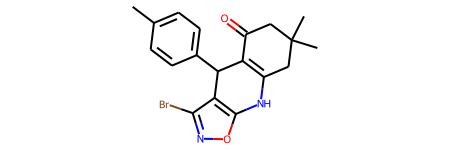

成功生成的高活性分子： Cc1ccc(C2C3=C(CC(C)(C)CC3=O)Nc3onc(Br)c32)cc1 
Activity（越大药效越好）: 19.1082 
QED（越大类药性越高）: 0.7527 
SA（越小可合成性越高）: 3.5054 
logP（越大疏水性越好）: 4.9461 
------------------------------------------------------------------------------------------------------------


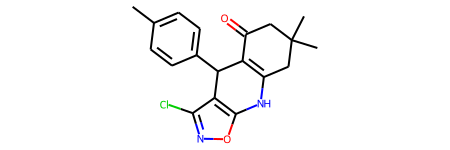

成功生成的高活性分子： Cc1ccc(C2C3=C(CC(C)(C)CC3=O)Nc3onc(Cl)c32)cc1 
Activity（越大药效越好）: 26.4982 
QED（越大类药性越高）: 0.8055 
SA（越小可合成性越高）: 3.4625 
logP（越大疏水性越好）: 4.8370 
------------------------------------------------------------------------------------------------------------


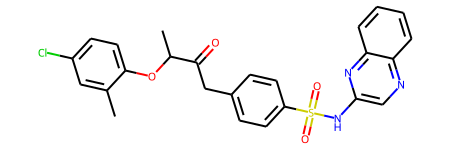

成功生成的高活性分子： Cc1cc(Cl)ccc1OC(C)C(=O)Cc1ccc(S(=O)(=O)Nc2cnc3ccccc3n2)cc1 
Activity（越大药效越好）: 7.2774 
QED（越大类药性越高）: 0.3703 
SA（越小可合成性越高）: 2.8404 
logP（越大疏水性越好）: 4.9715 
------------------------------------------------------------------------------------------------------------


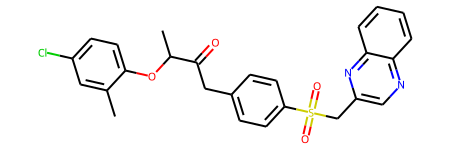

成功生成的高活性分子： Cc1cc(Cl)ccc1OC(C)C(=O)Cc1ccc(S(=O)(=O)Cc2cnc3ccccc3n2)cc1 
Activity（越大药效越好）: 8.7434 
QED（越大类药性越高）: 0.3367 
SA（越小可合成性越高）: 2.9294 
logP（越大疏水性越好）: 5.1446 
------------------------------------------------------------------------------------------------------------


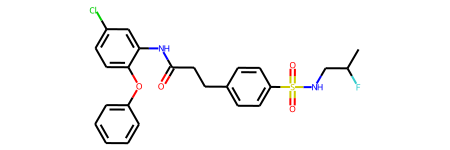

成功生成的高活性分子： CC(F)CNS(=O)(=O)c1ccc(CCC(=O)Nc2cc(Cl)ccc2Oc2ccccc2)cc1 
Activity（越大药效越好）: -3.0696 
QED（越大类药性越高）: 0.4015 
SA（越小可合成性越高）: 2.6634 
logP（越大疏水性越好）: 5.3399 
------------------------------------------------------------------------------------------------------------


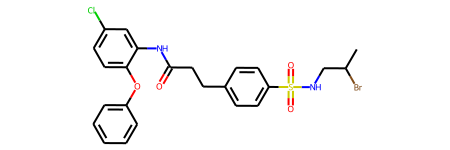

成功生成的高活性分子： CC(Br)CNS(=O)(=O)c1ccc(CCC(=O)Nc2cc(Cl)ccc2Oc2ccccc2)cc1 
Activity（越大药效越好）: -6.1613 
QED（越大类药性越高）: 0.3136 
SA（越小可合成性越高）: 2.6939 
logP（越大疏水性越好）: 5.7653 
------------------------------------------------------------------------------------------------------------


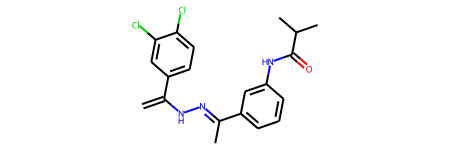

成功生成的高活性分子： C=C(N/N=C(\C)c1cccc(NC(=O)C(C)C)c1)c1ccc(Cl)c(Cl)c1 
Activity（越大药效越好）: 28.7458 
QED（越大类药性越高）: 0.5003 
SA（越小可合成性越高）: 2.3221 
logP（越大疏水性越好）: 5.5724 
------------------------------------------------------------------------------------------------------------


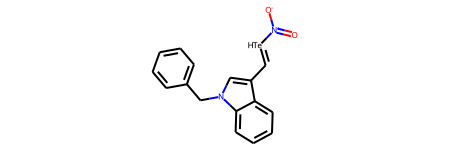

成功生成的高活性分子： O=[N+]([O-])/[TeH]=C/c1cn(Cc2ccccc2)c2ccccc12 
Activity（越大药效越好）: 14.7968 
QED（越大类药性越高）: 0.3882 
SA（越小可合成性越高）: 2.7667 
logP（越大疏水性越好）: 2.4681 
------------------------------------------------------------------------------------------------------------


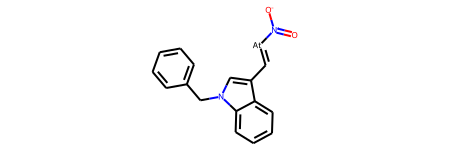

成功生成的高活性分子： O=[N+]([O-])/[At]=C/c1cn(Cc2ccccc2)c2ccccc12 
Activity（越大药效越好）: 14.8353 
QED（越大类药性越高）: 0.4304 
SA（越小可合成性越高）: 2.7667 
logP（越大疏水性越好）: 3.1166 
------------------------------------------------------------------------------------------------------------


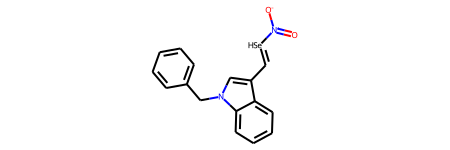

成功生成的高活性分子： O=[N+]([O-])/[SeH]=C/c1cn(Cc2ccccc2)c2ccccc12 
Activity（越大药效越好）: 17.0744 
QED（越大类药性越高）: 0.4143 
SA（越小可合成性越高）: 2.7667 
logP（越大疏水性越好）: 2.4681 
------------------------------------------------------------------------------------------------------------


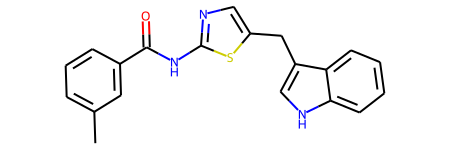

成功生成的高活性分子： Cc1cccc(C(=O)Nc2ncc(Cc3c[nH]c4ccccc34)s2)c1 
Activity（越大药效越好）: 15.0987 
QED（越大类药性越高）: 0.5582 
SA（越小可合成性越高）: 2.1060 
logP（越大疏水性越好）: 4.7759 
------------------------------------------------------------------------------------------------------------


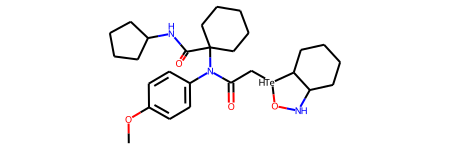

成功生成的高活性分子： COc1ccc(N(C(=O)C[TeH]2ONC3CCCCC32)C2(C(=O)NC3CCCC3)CCCCC2)cc1 
Activity（越大药效越好）: -4.4046 
QED（越大类药性越高）: 0.4561 
SA（越小可合成性越高）: 4.4751 
logP（越大疏水性越好）: 4.3613 
------------------------------------------------------------------------------------------------------------


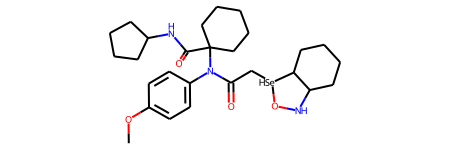

成功生成的高活性分子： COc1ccc(N(C(=O)C[SeH]2ONC3CCCCC32)C2(C(=O)NC3CCCC3)CCCCC2)cc1 
Activity（越大药效越好）: -3.0240 
QED（越大类药性越高）: 0.4936 
SA（越小可合成性越高）: 4.4751 
logP（越大疏水性越好）: 4.3613 
------------------------------------------------------------------------------------------------------------


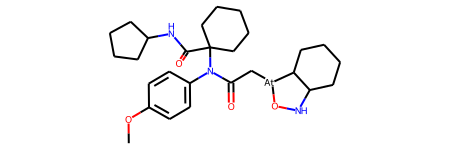

成功生成的高活性分子： COc1ccc(N(C(=O)C[At]2ONC3CCCCC32)C2(C(=O)NC3CCCC3)CCCCC2)cc1 
Activity（越大药效越好）: -1.0244 
QED（越大类药性越高）: 0.4239 
SA（越小可合成性越高）: 4.3021 
logP（越大疏水性越好）: 5.0098 
------------------------------------------------------------------------------------------------------------


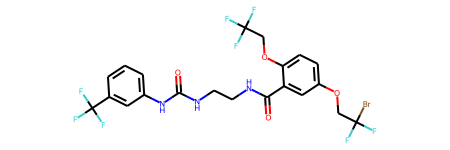

成功生成的高活性分子： O=C(NCCNC(=O)c1cc(OCC(F)(F)Br)ccc1OCC(F)(F)F)Nc1cccc(C(F)(F)F)c1 
Activity（越大药效越好）: 24.4407 
QED（越大类药性越高）: 0.1873 
SA（越小可合成性越高）: 2.7501 
logP（越大疏水性越好）: 5.5645 
------------------------------------------------------------------------------------------------------------


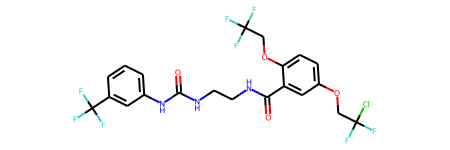

成功生成的高活性分子： O=C(NCCNC(=O)c1cc(OCC(F)(F)Cl)ccc1OCC(F)(F)F)Nc1cccc(C(F)(F)F)c1 
Activity（越大药效越好）: 28.2854 
QED（越大类药性越高）: 0.2050 
SA（越小可合成性越高）: 2.7331 
logP（越大疏水性越好）: 5.4084 
------------------------------------------------------------------------------------------------------------


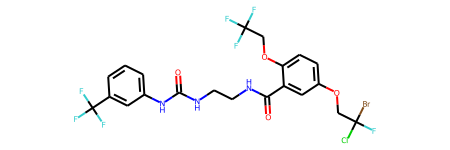

成功生成的高活性分子： O=C(NCCNC(=O)c1cc(OCC(F)(Cl)Br)ccc1OCC(F)(F)F)Nc1cccc(C(F)(F)F)c1 
Activity（越大药效越好）: 16.0842 
QED（越大类药性越高）: 0.1763 
SA（越小可合成性越高）: 3.2102 
logP（越大疏水性越好）: 5.8338 
------------------------------------------------------------------------------------------------------------


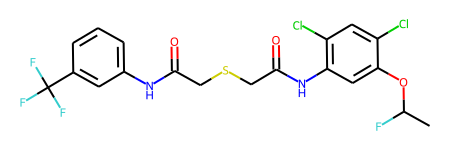

成功生成的高活性分子： CC(F)Oc1cc(NC(=O)CSCC(=O)Nc2cccc(C(F)(F)F)c2)c(Cl)cc1Cl 
Activity（越大药效越好）: 32.5000 
QED（越大类药性越高）: 0.4365 
SA（越小可合成性越高）: 2.9109 
logP（越大疏水性越好）: 6.0169 
------------------------------------------------------------------------------------------------------------


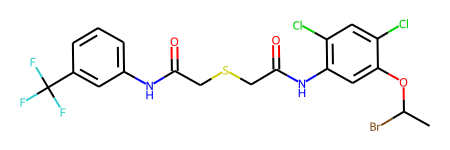

成功生成的高活性分子： CC(Br)Oc1cc(NC(=O)CSCC(=O)Nc2cccc(C(F)(F)F)c2)c(Cl)cc1Cl 
Activity（越大药效越好）: 30.5441 
QED（越大类药性越高）: 0.3651 
SA（越小可合成性越高）: 2.9423 
logP（越大疏水性越好）: 6.4423 
------------------------------------------------------------------------------------------------------------


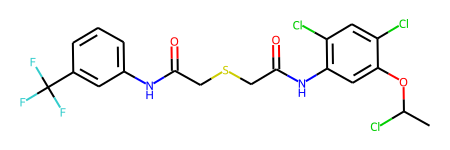

成功生成的高活性分子： CC(Cl)Oc1cc(NC(=O)CSCC(=O)Nc2cccc(C(F)(F)F)c2)c(Cl)cc1Cl 
Activity（越大药效越好）: 47.1652 
QED（越大类药性越高）: 0.4058 
SA（越小可合成性越高）: 2.8979 
logP（越大疏水性越好）: 6.2862 
------------------------------------------------------------------------------------------------------------


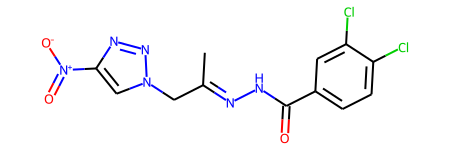

成功生成的高活性分子： C/C(Cn1cc([N+](=O)[O-])nn1)=N\NC(=O)c1ccc(Cl)c(Cl)c1 
Activity（越大药效越好）: 17.1710 
QED（越大类药性越高）: 0.5008 
SA（越小可合成性越高）: 2.7822 
logP（越大疏水性越好）: 2.2990 
------------------------------------------------------------------------------------------------------------


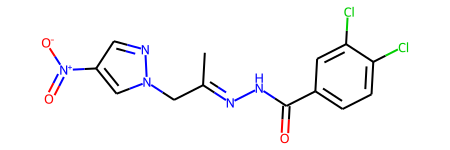

成功生成的高活性分子： C/C(Cn1cc([N+](=O)[O-])cn1)=N\NC(=O)c1ccc(Cl)c(Cl)c1 
Activity（越大药效越好）: 5.8388 
QED（越大类药性越高）: 0.5054 
SA（越小可合成性越高）: 2.4652 
logP（越大疏水性越好）: 2.9040 
------------------------------------------------------------------------------------------------------------


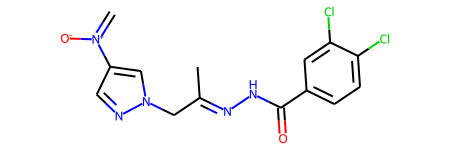

成功生成的高活性分子： C=[N+]([O-])c1cnn(C/C(C)=N/NC(=O)c2ccc(Cl)c(Cl)c2)c1 
Activity（越大药效越好）: 4.3462 
QED（越大类药性越高）: 0.3878 
SA（越小可合成性越高）: 2.8461 
logP（越大疏水性越好）: 2.8382 
------------------------------------------------------------------------------------------------------------


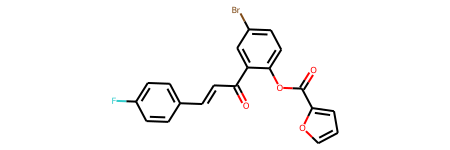

成功生成的高活性分子： O=C(Oc1ccc(Br)cc1C(=O)/C=C/c1ccc(F)cc1)c1ccco1 
Activity（越大药效越好）: 27.0268 
QED（越大类药性越高）: 0.2458 
SA（越小可合成性越高）: 2.2182 
logP（越大疏水性越好）: 5.2965 
------------------------------------------------------------------------------------------------------------


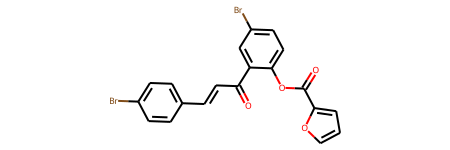

成功生成的高活性分子： O=C(Oc1ccc(Br)cc1C(=O)/C=C/c1ccc(Br)cc1)c1ccco1 
Activity（越大药效越好）: 33.6616 
QED（越大类药性越高）: 0.1987 
SA（越小可合成性越高）: 2.2635 
logP（越大疏水性越好）: 5.9199 
------------------------------------------------------------------------------------------------------------


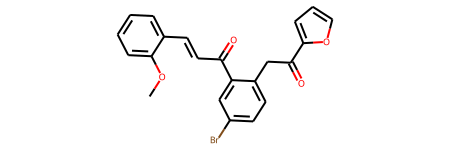

成功生成的高活性分子： COc1ccccc1/C=C/C(=O)c1cc(Br)ccc1CC(=O)c1ccco1 
Activity（越大药效越好）: 32.0656 
QED（越大类药性越高）: 0.3773 
SA（越小可合成性越高）: 2.3626 
logP（越大疏水性越好）: 5.3722 
------------------------------------------------------------------------------------------------------------


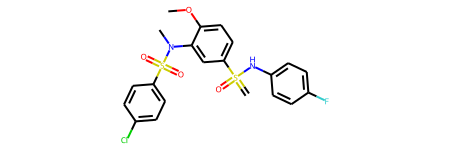

成功生成的高活性分子： C=S(=O)(Nc1ccc(F)cc1)c1ccc(OC)c(N(C)S(=O)(=O)c2ccc(Cl)cc2)c1 
Activity（越大药效越好）: 11.6757 
QED（越大类药性越高）: 0.5058 
SA（越小可合成性越高）: 2.9547 
logP（越大疏水性越好）: 4.4152 
------------------------------------------------------------------------------------------------------------


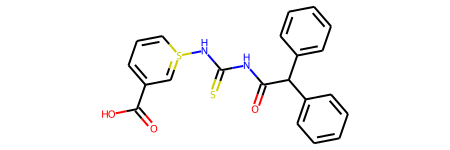

成功生成的高活性分子： O=C(O)C1=CC=CS(NC(=S)NC(=O)C(c2ccccc2)c2ccccc2)=C1 
Activity（越大药效越好）: 26.8672 
QED（越大类药性越高）: 0.6593 
SA（越小可合成性越高）: 3.6753 
logP（越大疏水性越好）: 3.3336 
------------------------------------------------------------------------------------------------------------


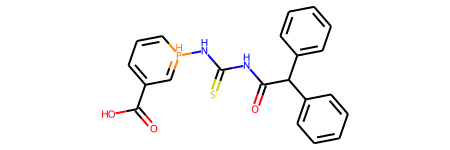

成功生成的高活性分子： O=C(O)C1=CC=C[PH](NC(=S)NC(=O)C(c2ccccc2)c2ccccc2)=C1 
Activity（越大药效越好）: 25.6048 
QED（越大类药性越高）: 0.5209 
SA（越小可合成性越高）: 3.7803 
logP（越大疏水性越好）: 3.2789 
------------------------------------------------------------------------------------------------------------


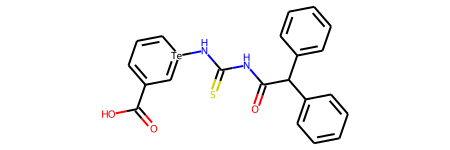

成功生成的高活性分子： O=C(O)C1=CC=C[Te](NC(=S)NC(=O)C(c2ccccc2)c2ccccc2)=C1 
Activity（越大药效越好）: 26.4115 
QED（越大类药性越高）: 0.4292 
SA（越小可合成性越高）: 3.3787 
logP（越大疏水性越好）: 2.3046 
------------------------------------------------------------------------------------------------------------


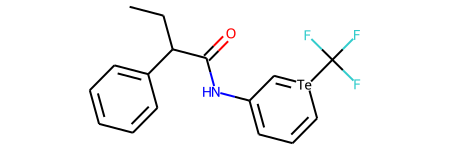

成功生成的高活性分子： CCC(C(=O)NC1=CC=C[Te](C(F)(F)F)=C1)c1ccccc1 
Activity（越大药效越好）: 11.7856 
QED（越大类药性越高）: 0.7413 
SA（越小可合成性越高）: 3.9594 
logP（越大疏水性越好）: 3.2695 
------------------------------------------------------------------------------------------------------------


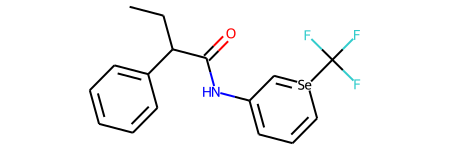

成功生成的高活性分子： CCC(C(=O)NC1=CC=C[Se](C(F)(F)F)=C1)c1ccccc1 
Activity（越大药效越好）: 14.3381 
QED（越大类药性越高）: 0.8058 
SA（越小可合成性越高）: 4.1657 
logP（越大疏水性越好）: 3.2695 
------------------------------------------------------------------------------------------------------------


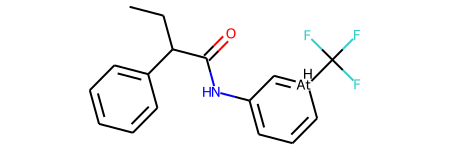

成功生成的高活性分子： CCC(C(=O)NC1=CC=C[AtH](C(F)(F)F)=C1)c1ccccc1 
Activity（越大药效越好）: 16.9524 
QED（越大类药性越高）: 0.6673 
SA（越小可合成性越高）: 4.2032 
logP（越大疏水性越好）: 3.3826 
------------------------------------------------------------------------------------------------------------


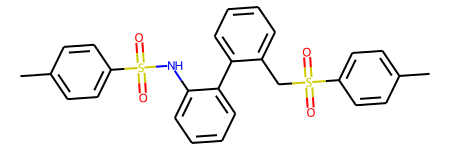

成功生成的高活性分子： Cc1ccc(S(=O)(=O)Cc2ccccc2-c2ccccc2NS(=O)(=O)c2ccc(C)cc2)cc1 
Activity（越大药效越好）: 12.3591 
QED（越大类药性越高）: 0.3572 
SA（越小可合成性越高）: 2.1427 
logP（越大疏水性越好）: 5.7451 
------------------------------------------------------------------------------------------------------------


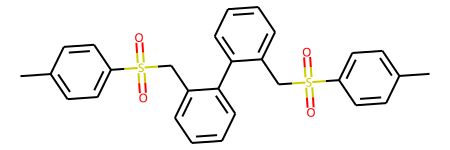

成功生成的高活性分子： Cc1ccc(S(=O)(=O)Cc2ccccc2-c2ccccc2CS(=O)(=O)c2ccc(C)cc2)cc1 
Activity（越大药效越好）: 10.2599 
QED（越大类药性越高）: 0.3225 
SA（越小可合成性越高）: 2.0639 
logP（越大疏水性越好）: 5.9182 
------------------------------------------------------------------------------------------------------------


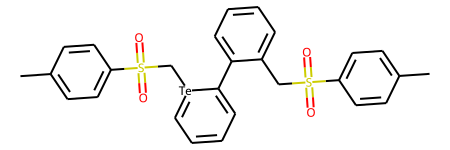

成功生成的高活性分子： Cc1ccc(S(=O)(=O)Cc2ccccc2C2=CC=CC=[Te]2CS(=O)(=O)c2ccc(C)cc2)cc1 
Activity（越大药效越好）: 8.0178 
QED（越大类药性越高）: 0.3675 
SA（越小可合成性越高）: 3.2516 
logP（越大疏水性越好）: 4.6615 
------------------------------------------------------------------------------------------------------------


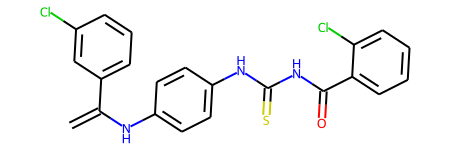

成功生成的高活性分子： C=C(Nc1ccc(NC(=S)NC(=O)c2ccccc2Cl)cc1)c1cccc(Cl)c1 
Activity（越大药效越好）: 21.6221 
QED（越大类药性越高）: 0.4119 
SA（越小可合成性越高）: 2.1405 
logP（越大疏水性越好）: 6.2030 
------------------------------------------------------------------------------------------------------------


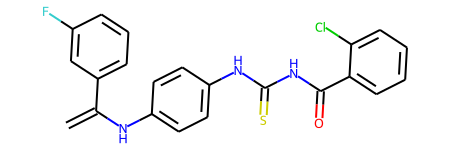

成功生成的高活性分子： C=C(Nc1ccc(NC(=S)NC(=O)c2ccccc2Cl)cc1)c1cccc(F)c1 
Activity（越大药效越好）: 13.8064 
QED（越大类药性越高）: 0.4596 
SA（越小可合成性越高）: 2.1476 
logP（越大疏水性越好）: 5.6887 
------------------------------------------------------------------------------------------------------------


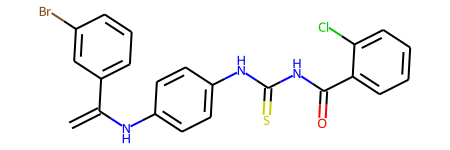

成功生成的高活性分子： C=C(Nc1ccc(NC(=S)NC(=O)c2ccccc2Cl)cc1)c1cccc(Br)c1 
Activity（越大药效越好）: 22.1222 
QED（越大类药性越高）: 0.3698 
SA（越小可合成性越高）: 2.1800 
logP（越大疏水性越好）: 6.3121 
------------------------------------------------------------------------------------------------------------


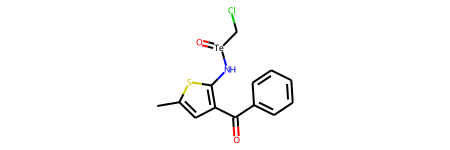

成功生成的高活性分子： Cc1cc(C(=O)c2ccccc2)c(N[Te](=O)CCl)s1 
Activity（越大药效越好）: 10.8664 
QED（越大类药性越高）: 0.4679 
SA（越小可合成性越高）: 3.2113 
logP（越大疏水性越好）: 3.3961 
------------------------------------------------------------------------------------------------------------


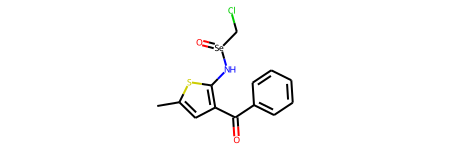

成功生成的高活性分子： Cc1cc(C(=O)c2ccccc2)c(N[Se](=O)CCl)s1 
Activity（越大药效越好）: 3.3167 
QED（越大类药性越高）: 0.5048 
SA（越小可合成性越高）: 3.5183 
logP（越大疏水性越好）: 3.3961 
------------------------------------------------------------------------------------------------------------


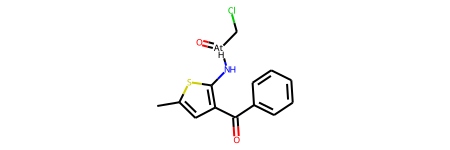

成功生成的高活性分子： Cc1cc(C(=O)c2ccccc2)c(N[AtH](=O)CCl)s1 
Activity（越大药效越好）: 30.5809 
QED（越大类药性越高）: 0.5133 
SA（越小可合成性越高）: 3.6281 
logP（越大疏水性越好）: 3.5092 
------------------------------------------------------------------------------------------------------------


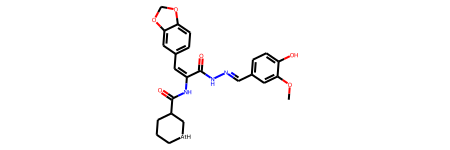

成功生成的高活性分子： COc1cc(/C=N/NC(=O)/C(=C\c2ccc3c(c2)OCO3)NC(=O)C2CCC[AtH]C2)ccc1O 
Activity（越大药效越好）: 9.8493 
QED（越大类药性越高）: 0.2387 
SA（越小可合成性越高）: 3.7514 
logP（越大疏水性越好）: 2.8008 
------------------------------------------------------------------------------------------------------------


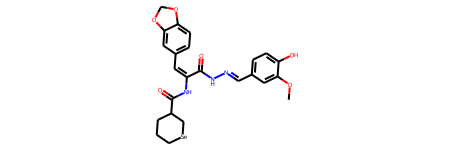

成功生成的高活性分子： COc1cc(/C=N/NC(=O)/C(=C\c2ccc3c(c2)OCO3)NC(=O)C2CCC[Se]C2)ccc1O 
Activity（越大药效越好）: 9.1310 
QED（越大类药性越高）: 0.2194 
SA（越小可合成性越高）: 3.6289 
logP（越大疏水性越好）: 2.6877 
------------------------------------------------------------------------------------------------------------


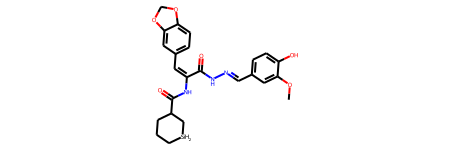

成功生成的高活性分子： COc1cc(/C=N/NC(=O)/C(=C\c2ccc3c(c2)OCO3)NC(=O)C2CCC[SiH2]C2)ccc1O 
Activity（越大药效越好）: 7.2230 
QED（越大类药性越高）: 0.2414 
SA（越小可合成性越高）: 3.6719 
logP（越大疏水性越好）: 2.1523 
------------------------------------------------------------------------------------------------------------


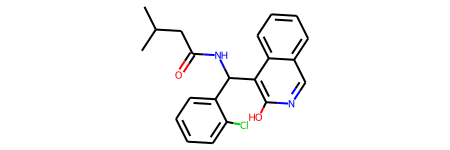

成功生成的高活性分子： CC(C)CC(=O)NC(c1ccccc1Cl)c1c(O)ncc2ccccc12 
Activity（越大药效越好）: 11.0848 
QED（越大类药性越高）: 0.6765 
SA（越小可合成性越高）: 2.8836 
logP（越大疏水性越好）: 4.8455 
------------------------------------------------------------------------------------------------------------


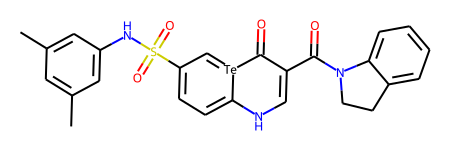

成功生成的高活性分子： Cc1cc(C)cc(NS(=O)(=O)C2=CC=C3NC=C(C(=O)N4CCc5ccccc54)C(=O)[Te]3=C2)c1 
Activity（越大药效越好）: 14.0259 
QED（越大类药性越高）: 0.4226 
SA（越小可合成性越高）: 3.7098 
logP（越大疏水性越好）: 2.4291 
------------------------------------------------------------------------------------------------------------


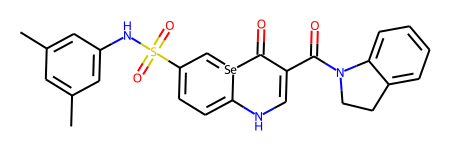

成功生成的高活性分子： Cc1cc(C)cc(NS(=O)(=O)C2=CC=C3NC=C(C(=O)N4CCc5ccccc54)C(=O)[Se]3=C2)c1 
Activity（越大药效越好）: 16.8067 
QED（越大类药性越高）: 0.4591 
SA（越小可合成性越高）: 4.1028 
logP（越大疏水性越好）: 2.4291 
------------------------------------------------------------------------------------------------------------


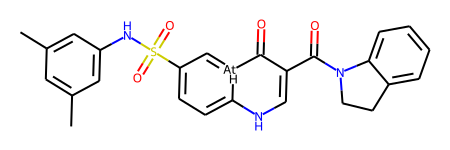

成功生成的高活性分子： Cc1cc(C)cc(NS(=O)(=O)C2=CC=C3NC=C(C(=O)N4CCc5ccccc54)C(=O)[AtH]3=C2)c1 
Activity（越大药效越好）: 16.0738 
QED（越大类药性越高）: 0.4877 
SA（越小可合成性越高）: 4.1266 
logP（越大疏水性越好）: 2.5422 
------------------------------------------------------------------------------------------------------------


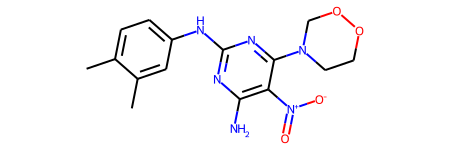

成功生成的高活性分子： Cc1ccc(Nc2nc(N)c([N+](=O)[O-])c(N3CCOOC3)n2)cc1C 
Activity（越大药效越好）: 4.5924 
QED（越大类药性越高）: 0.4851 
SA（越小可合成性越高）: 3.0576 
logP（越大疏水性越好）: 2.0531 
------------------------------------------------------------------------------------------------------------


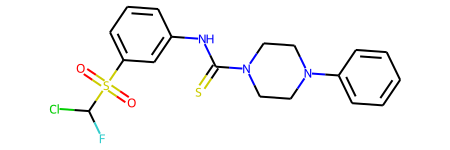

成功生成的高活性分子： O=S(=O)(c1cccc(NC(=S)N2CCN(c3ccccc3)CC2)c1)C(F)Cl 
Activity（越大药效越好）: 20.5020 
QED（越大类药性越高）: 0.5953 
SA（越小可合成性越高）: 2.7898 
logP（越大疏水性越好）: 3.4712 
------------------------------------------------------------------------------------------------------------


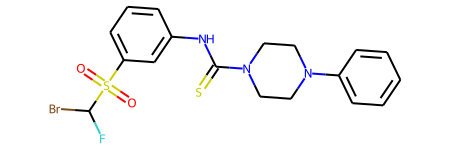

成功生成的高活性分子： O=S(=O)(c1cccc(NC(=S)N2CCN(c3ccccc3)CC2)c1)C(F)Br 
Activity（越大药效越好）: 4.4230 
QED（越大类药性越高）: 0.5422 
SA（越小可合成性越高）: 2.8016 
logP（越大疏水性越好）: 3.6273 
------------------------------------------------------------------------------------------------------------


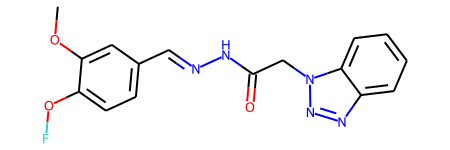

成功生成的高活性分子： COc1cc(/C=N/NC(=O)Cn2nnc3ccccc32)ccc1OF 
Activity（越大药效越好）: 19.6139 
QED（越大类药性越高）: 0.5448 
SA（越小可合成性越高）: 2.4433 
logP（越大疏水性越好）: 1.8535 
------------------------------------------------------------------------------------------------------------


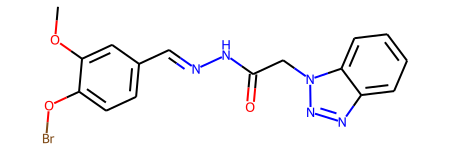

成功生成的高活性分子： COc1cc(/C=N/NC(=O)Cn2nnc3ccccc32)ccc1OBr 
Activity（越大药效越好）: 22.9955 
QED（越大类药性越高）: 0.5030 
SA（越小可合成性越高）: 2.5092 
logP（越大疏水性越好）: 2.2789 
------------------------------------------------------------------------------------------------------------


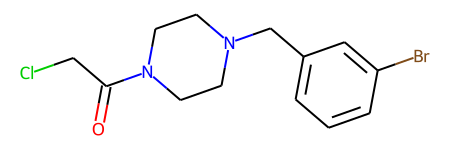

成功生成的高活性分子： O=C(CCl)N1CCN(Cc2cccc(Br)c2)CC1 
Activity（越大药效越好）: 16.1314 
QED（越大类药性越高）: 0.7938 
SA（越小可合成性越高）: 1.9134 
logP（越大疏水性越好）: 2.3321 
------------------------------------------------------------------------------------------------------------


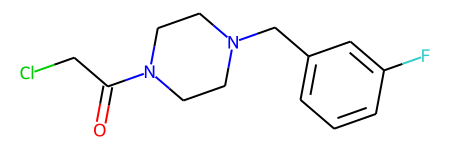

成功生成的高活性分子： O=C(CCl)N1CCN(Cc2cccc(F)c2)CC1 
Activity（越大药效越好）: 8.5279 
QED（越大类药性越高）: 0.7810 
SA（越小可合成性越高）: 1.8495 
logP（越大疏水性越好）: 1.7087 
------------------------------------------------------------------------------------------------------------


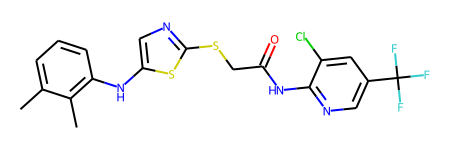

成功生成的高活性分子： Cc1cccc(Nc2cnc(SCC(=O)Nc3ncc(C(F)(F)F)cc3Cl)s2)c1C 
Activity（越大药效越好）: 20.8108 
QED（越大类药性越高）: 0.4119 
SA（越小可合成性越高）: 2.7437 
logP（越大疏水性越好）: 6.3015 
------------------------------------------------------------------------------------------------------------


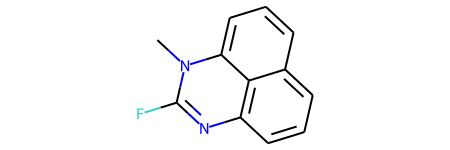

成功生成的高活性分子： CN1C(F)=Nc2cccc3cccc1c23 
Activity（越大药效越好）: 30.2497 
QED（越大类药性越高）: 0.5959 
SA（越小可合成性越高）: 2.7246 
logP（越大疏水性越好）: 3.2466 
------------------------------------------------------------------------------------------------------------


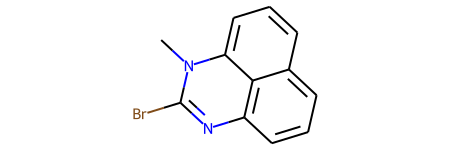

成功生成的高活性分子： CN1C(Br)=Nc2cccc3cccc1c23 
Activity（越大药效越好）: 32.4596 
QED（越大类药性越高）: 0.6604 
SA（越小可合成性越高）: 2.7125 
logP（越大疏水性越好）: 3.6720 
------------------------------------------------------------------------------------------------------------


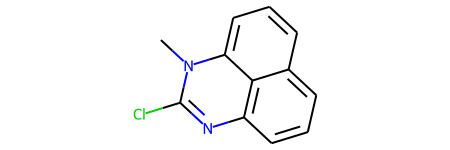

成功生成的高活性分子： CN1C(Cl)=Nc2cccc3cccc1c23 
Activity（越大药效越好）: 28.0971 
QED（越大类药性越高）: 0.6156 
SA（越小可合成性越高）: 2.6770 
logP（越大疏水性越好）: 3.5159 
------------------------------------------------------------------------------------------------------------


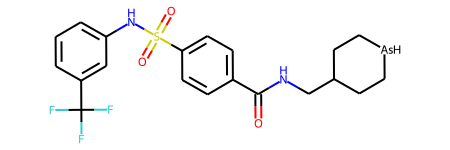

成功生成的高活性分子： O=C(NCC1CC[AsH]CC1)c1ccc(S(=O)(=O)Nc2cccc(C(F)(F)F)c2)cc1 
Activity（越大药效越好）: 11.5218 
QED（越大类药性越高）: 0.5886 
SA（越小可合成性越高）: 2.8963 
logP（越大疏水性越好）: 3.9191 
------------------------------------------------------------------------------------------------------------


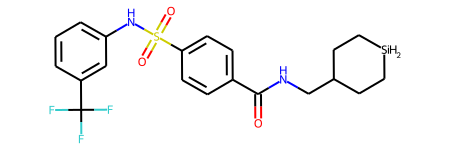

成功生成的高活性分子： O=C(NCC1CC[SiH2]CC1)c1ccc(S(=O)(=O)Nc2cccc(C(F)(F)F)c2)cc1 
Activity（越大药效越好）: 7.8367 
QED（越大类药性越高）: 0.6519 
SA（越小可合成性越高）: 2.7763 
logP（越大疏水性越好）: 3.6514 
------------------------------------------------------------------------------------------------------------


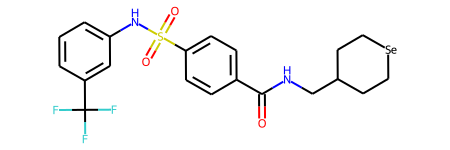

成功生成的高活性分子： O=C(NCC1CC[Se]CC1)c1ccc(S(=O)(=O)Nc2cccc(C(F)(F)F)c2)cc1 
Activity（越大药效越好）: 13.8986 
QED（越大类药性越高）: 0.5788 
SA（越小可合成性越高）: 2.7529 
logP（越大疏水性越好）: 4.1868 
------------------------------------------------------------------------------------------------------------


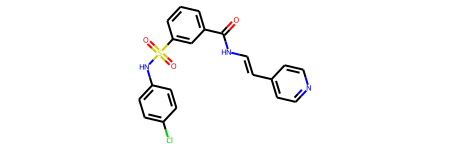

成功生成的高活性分子： O=C(N/C=C/c1ccncc1)c1cccc(S(=O)(=O)Nc2ccc(Cl)cc2)c1 
Activity（越大药效越好）: 57.6658 
QED（越大类药性越高）: 0.6403 
SA（越小可合成性越高）: 2.2921 
logP（越大疏水性越好）: 3.9365 
------------------------------------------------------------------------------------------------------------


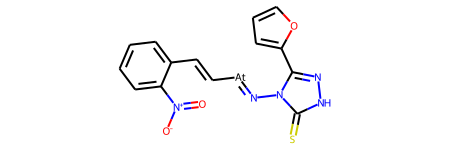

成功生成的高活性分子： O=[N+]([O-])c1ccccc1/C=C/[At]=N/n1c(-c2ccco2)n[nH]c1=S 
Activity（越大药效越好）: 11.4296 
QED（越大类药性越高）: 0.3026 
SA（越小可合成性越高）: 3.4658 
logP（越大疏水性越好）: 3.8115 
------------------------------------------------------------------------------------------------------------


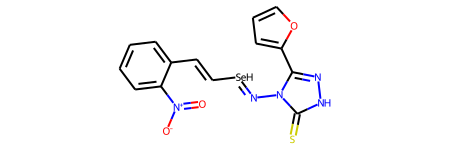

成功生成的高活性分子： O=[N+]([O-])c1ccccc1/C=C/[SeH]=N/n1c(-c2ccco2)n[nH]c1=S 
Activity（越大药效越好）: 17.9344 
QED（越大类药性越高）: 0.3024 
SA（越小可合成性越高）: 3.4658 
logP（越大疏水性越好）: 3.1630 
------------------------------------------------------------------------------------------------------------


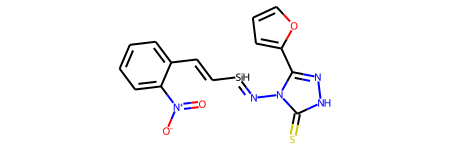

成功生成的高活性分子： O=[N+]([O-])c1ccccc1/C=C/[SiH]=N/n1c(-c2ccco2)n[nH]c1=S 
Activity（越大药效越好）: 16.8566 
QED（越大类药性越高）: 0.3269 
SA（越小可合成性越高）: 3.4387 
logP（越大疏水性越好）: 3.1630 
------------------------------------------------------------------------------------------------------------


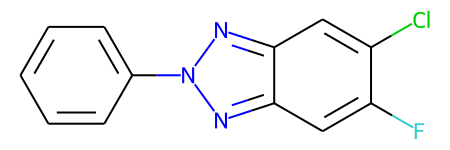

成功生成的高活性分子： Fc1cc2nn(-c3ccccc3)nc2cc1Cl 
Activity（越大药效越好）: 22.9837 
QED（越大类药性越高）: 0.6611 
SA（越小可合成性越高）: 2.0422 
logP（越大疏水性越好）: 3.2130 
------------------------------------------------------------------------------------------------------------


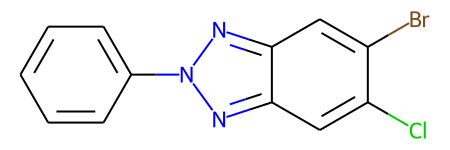

成功生成的高活性分子： Clc1cc2nn(-c3ccccc3)nc2cc1Br 
Activity（越大药效越好）: 29.8537 
QED（越大类药性越高）: 0.6837 
SA（越小可合成性越高）: 2.1646 
logP（越大疏水性越好）: 3.8364 
------------------------------------------------------------------------------------------------------------


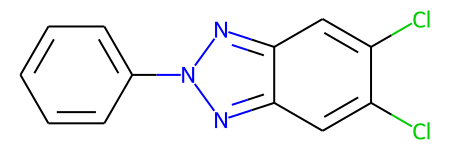

成功生成的高活性分子： Clc1cc2nn(-c3ccccc3)nc2cc1Cl 
Activity（越大药效越好）: 22.8475 
QED（越大类药性越高）: 0.6701 
SA（越小可合成性越高）: 1.9919 
logP（越大疏水性越好）: 3.7273 
------------------------------------------------------------------------------------------------------------


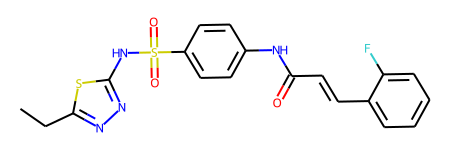

成功生成的高活性分子： CCc1nnc(NS(=O)(=O)c2ccc(NC(=O)/C=C/c3ccccc3F)cc2)s1 
Activity（越大药效越好）: 13.7663 
QED（越大类药性越高）: 0.5547 
SA（越小可合成性越高）: 2.3080 
logP（越大疏水性越好）: 3.6923 
------------------------------------------------------------------------------------------------------------


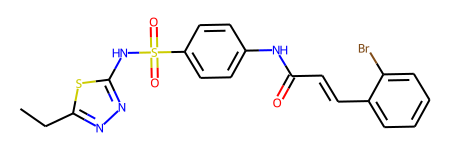

成功生成的高活性分子： CCc1nnc(NS(=O)(=O)c2ccc(NC(=O)/C=C/c3ccccc3Br)cc2)s1 
Activity（越大药效越好）: 18.7582 
QED（越大类药性越高）: 0.4779 
SA（越小可合成性越高）: 2.3556 
logP（越大疏水性越好）: 4.3157 
------------------------------------------------------------------------------------------------------------


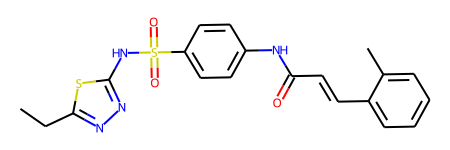

成功生成的高活性分子： CCc1nnc(NS(=O)(=O)c2ccc(NC(=O)/C=C/c3ccccc3C)cc2)s1 
Activity（越大药效越好）: 13.8424 
QED（越大类药性越高）: 0.5566 
SA（越小可合成性越高）: 2.2941 
logP（越大疏水性越好）: 3.8616 
------------------------------------------------------------------------------------------------------------


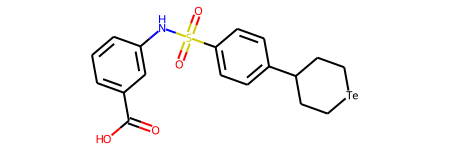

成功生成的高活性分子： O=C(O)c1cccc(NS(=O)(=O)c2ccc(C3CC[Te]CC3)cc2)c1 
Activity（越大药效越好）: 10.8105 
QED（越大类药性越高）: 0.6511 
SA（越小可合成性越高）: 2.8029 
logP（越大疏水性越好）: 3.6038 
------------------------------------------------------------------------------------------------------------


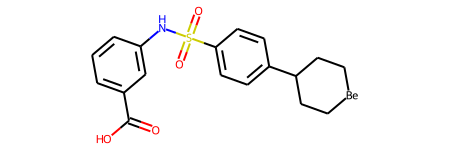

成功生成的高活性分子： O=C(O)c1cccc(NS(=O)(=O)c2ccc(C3CC[Be]CC3)cc2)c1 
Activity（越大药效越好）: 13.1309 
QED（越大类药性越高）: 0.8037 
SA（越小可合成性越高）: 2.8658 
logP（越大疏水性越好）: 3.6038 
------------------------------------------------------------------------------------------------------------


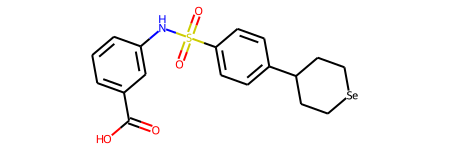

成功生成的高活性分子： O=C(O)c1cccc(NS(=O)(=O)c2ccc(C3CC[Se]CC3)cc2)c1 
Activity（越大药效越好）: 15.3065 
QED（越大类药性越高）: 0.7188 
SA（越小可合成性越高）: 2.6791 
logP（越大疏水性越好）: 3.6038 
------------------------------------------------------------------------------------------------------------


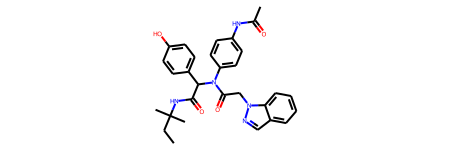

成功生成的高活性分子： CCC(C)(C)NC(=O)C(c1ccc(O)cc1)N(C(=O)Cn1ncc2ccccc21)c1ccc(NC(C)=O)cc1 
Activity（越大药效越好）: 26.9050 
QED（越大类药性越高）: 0.2897 
SA（越小可合成性越高）: 3.0580 
logP（越大疏水性越好）: 4.7796 
------------------------------------------------------------------------------------------------------------


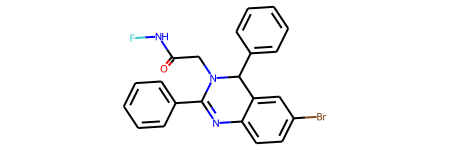

成功生成的高活性分子： O=C(CN1C(c2ccccc2)=Nc2ccc(Br)cc2C1c1ccccc1)NF 
Activity（越大药效越好）: 11.9071 
QED（越大类药性越高）: 0.5874 
SA（越小可合成性越高）: 3.0610 
logP（越大疏水性越好）: 4.9331 
------------------------------------------------------------------------------------------------------------


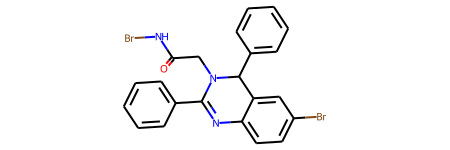

成功生成的高活性分子： O=C(CN1C(c2ccccc2)=Nc2ccc(Br)cc2C1c1ccccc1)NBr 
Activity（越大药效越好）: 16.2725 
QED（越大类药性越高）: 0.4920 
SA（越小可合成性越高）: 3.0484 
logP（越大疏水性越好）: 5.3585 
------------------------------------------------------------------------------------------------------------


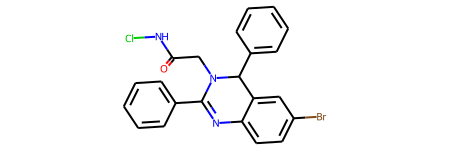

成功生成的高活性分子： O=C(CN1C(c2ccccc2)=Nc2ccc(Br)cc2C1c1ccccc1)NCl 
Activity（越大药效越好）: 25.3249 
QED（越大类药性越高）: 0.5506 
SA（越小可合成性越高）: 3.0229 
logP（越大疏水性越好）: 5.2024 
------------------------------------------------------------------------------------------------------------


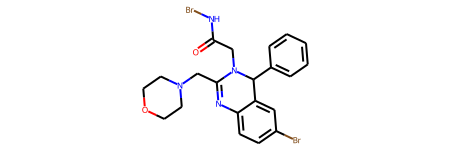

成功生成的高活性分子： O=C(CN1C(CN2CCOCC2)=Nc2ccc(Br)cc2C1c1ccccc1)NBr 
Activity（越大药效越好）: 15.9453 
QED（越大类药性越高）: 0.6102 
SA（越小可合成性越高）: 3.3352 
logP（越大疏水性越好）: 3.6424 
------------------------------------------------------------------------------------------------------------


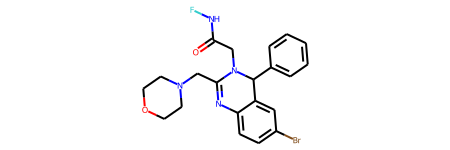

成功生成的高活性分子： O=C(CN1C(CN2CCOCC2)=Nc2ccc(Br)cc2C1c1ccccc1)NF 
Activity（越大药效越好）: 15.2540 
QED（越大类药性越高）: 0.6955 
SA（越小可合成性越高）: 3.3473 
logP（越大疏水性越好）: 3.2170 
------------------------------------------------------------------------------------------------------------


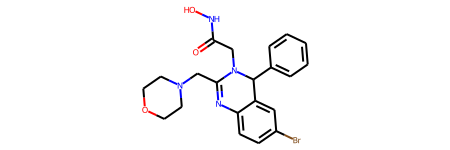

成功生成的高活性分子： O=C(CN1C(CN2CCOCC2)=Nc2ccc(Br)cc2C1c1ccccc1)NO 
Activity（越大药效越好）: 17.4688 
QED（越大类药性越高）: 0.5314 
SA（越小可合成性越高）: 3.1710 
logP（越大疏水性越好）: 2.7217 
------------------------------------------------------------------------------------------------------------


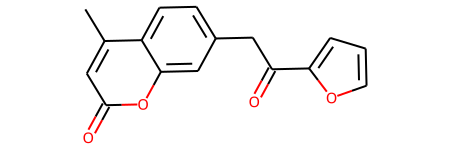

成功生成的高活性分子： Cc1cc(=O)oc2cc(CC(=O)c3ccco3)ccc12 
Activity（越大药效越好）: 68.0370 
QED（越大类药性越高）: 0.5406 
SA（越小可合成性越高）: 2.2187 
logP（越大疏水性越好）: 3.1198 
------------------------------------------------------------------------------------------------------------


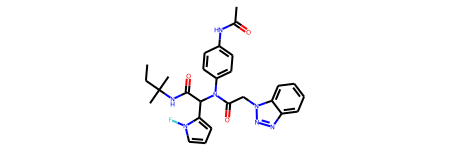

成功生成的高活性分子： CCC(C)(C)NC(=O)C(c1cccn1F)N(C(=O)Cn1nnc2ccccc21)c1ccc(NC(C)=O)cc1 
Activity（越大药效越好）: 43.5897 
QED（越大类药性越高）: 0.3470 
SA（越小可合成性越高）: 3.4189 
logP（越大疏水性越好）: 4.0031 
------------------------------------------------------------------------------------------------------------


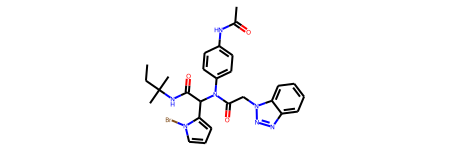

成功生成的高活性分子： CCC(C)(C)NC(=O)C(c1cccn1Br)N(C(=O)Cn1nnc2ccccc21)c1ccc(NC(C)=O)cc1 
Activity（越大药效越好）: 46.6289 
QED（越大类药性越高）: 0.3043 
SA（越小可合成性越高）: 3.4231 
logP（越大疏水性越好）: 4.4285 
------------------------------------------------------------------------------------------------------------


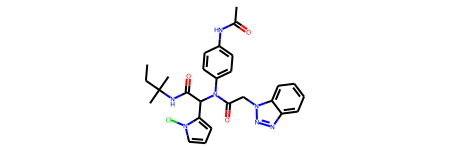

成功生成的高活性分子： CCC(C)(C)NC(=O)C(c1cccn1Cl)N(C(=O)Cn1nnc2ccccc21)c1ccc(NC(C)=O)cc1 
Activity（越大药效越好）: 39.5465 
QED（越大类药性越高）: 0.3320 
SA（越小可合成性越高）: 3.4000 
logP（越大疏水性越好）: 4.2724 
------------------------------------------------------------------------------------------------------------


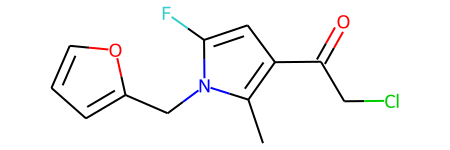

成功生成的高活性分子： Cc1c(C(=O)CCl)cc(F)n1Cc1ccco1 
Activity（越大药效越好）: 19.7135 
QED（越大类药性越高）: 0.6218 
SA（越小可合成性越高）: 2.7205 
logP（越大疏水性越好）: 2.9984 
------------------------------------------------------------------------------------------------------------


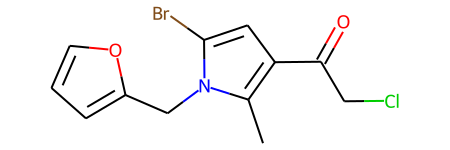

成功生成的高活性分子： Cc1c(C(=O)CCl)cc(Br)n1Cc1ccco1 
Activity（越大药效越好）: 26.9609 
QED（越大类药性越高）: 0.6377 
SA（越小可合成性越高）: 2.7056 
logP（越大疏水性越好）: 3.6218 
------------------------------------------------------------------------------------------------------------


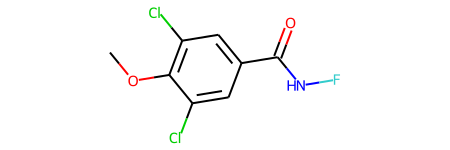

成功生成的高活性分子： COc1c(Cl)cc(C(=O)NF)cc1Cl 
Activity（越大药效越好）: 11.2839 
QED（越大类药性越高）: 0.8039 
SA（越小可合成性越高）: 2.4639 
logP（越大疏水性越好）: 2.6163 
------------------------------------------------------------------------------------------------------------


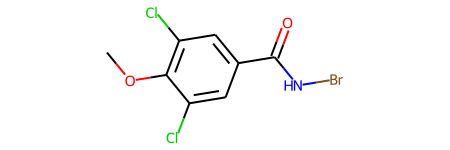

成功生成的高活性分子： COc1c(Cl)cc(C(=O)NBr)cc1Cl 
Activity（越大药效越好）: 14.5198 
QED（越大类药性越高）: 0.8524 
SA（越小可合成性越高）: 2.4692 
logP（越大疏水性越好）: 3.0417 
------------------------------------------------------------------------------------------------------------


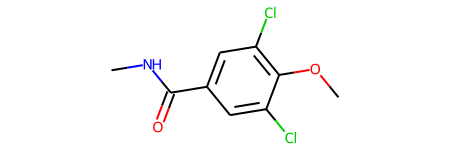

成功生成的高活性分子： CNC(=O)c1cc(Cl)c(OC)c(Cl)c1 
Activity（越大药效越好）: 7.6696 
QED（越大类药性越高）: 0.8524 
SA（越小可合成性越高）: 1.8594 
logP（越大疏水性越好）: 2.3616 
------------------------------------------------------------------------------------------------------------


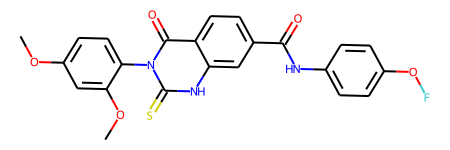

成功生成的高活性分子： COc1ccc(-n2c(=S)[nH]c3cc(C(=O)Nc4ccc(OF)cc4)ccc3c2=O)c(OC)c1 
Activity（越大药效越好）: 13.9288 
QED（越大类药性越高）: 0.4033 
SA（越小可合成性越高）: 2.4774 
logP（越大疏水性越好）: 4.5811 
------------------------------------------------------------------------------------------------------------


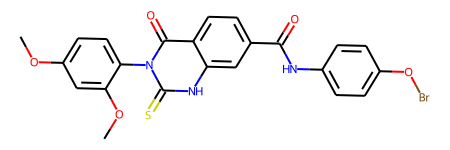

成功生成的高活性分子： COc1ccc(-n2c(=S)[nH]c3cc(C(=O)Nc4ccc(OBr)cc4)ccc3c2=O)c(OC)c1 
Activity（越大药效越好）: 12.6440 
QED（越大类药性越高）: 0.3422 
SA（越小可合成性越高）: 2.5284 
logP（越大疏水性越好）: 5.0065 
------------------------------------------------------------------------------------------------------------


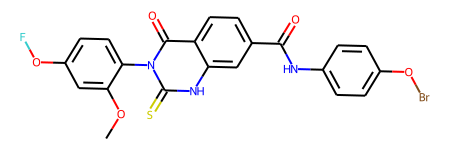

成功生成的高活性分子： COc1cc(OF)ccc1-n1c(=S)[nH]c2cc(C(=O)Nc3ccc(OBr)cc3)ccc2c1=O 
Activity（越大药效越好）: 18.5403 
QED（越大类药性越高）: 0.3293 
SA（越小可合成性越高）: 2.7962 
logP（越大疏水性越好）: 5.2612 
------------------------------------------------------------------------------------------------------------


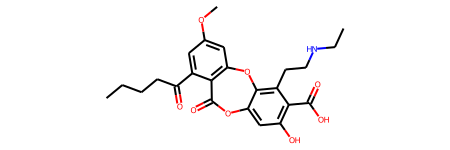

成功生成的高活性分子： CCCCC(=O)c1cc(OC)cc2c1C(=O)Oc1cc(O)c(C(=O)O)c(CCNCC)c1O2 
Activity（越大药效越好）: 36.3108 
QED（越大类药性越高）: 0.2099 
SA（越小可合成性越高）: 3.0782 
logP（越大疏水性越好）: 3.9488 
------------------------------------------------------------------------------------------------------------


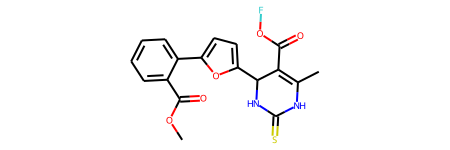

成功生成的高活性分子： COC(=O)c1ccccc1-c1ccc(C2NC(=S)NC(C)=C2C(=O)OF)o1 
Activity（越大药效越好）: 12.1010 
QED（越大类药性越高）: 0.6085 
SA（越小可合成性越高）: 3.2541 
logP（越大疏水性越好）: 2.9537 
------------------------------------------------------------------------------------------------------------


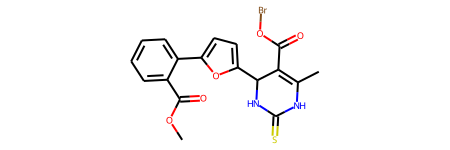

成功生成的高活性分子： COC(=O)c1ccccc1-c1ccc(C2NC(=S)NC(C)=C2C(=O)OBr)o1 
Activity（越大药效越好）: 12.7530 
QED（越大类药性越高）: 0.5405 
SA（越小可合成性越高）: 3.2731 
logP（越大疏水性越好）: 3.3791 
------------------------------------------------------------------------------------------------------------


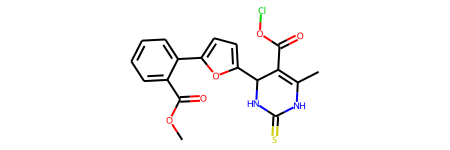

成功生成的高活性分子： COC(=O)c1ccccc1-c1ccc(C2NC(=S)NC(C)=C2C(=O)OCl)o1 
Activity（越大药效越好）: 10.7074 
QED（越大类药性越高）: 0.5906 
SA（越小可合成性越高）: 3.2425 
logP（越大疏水性越好）: 3.2230 
------------------------------------------------------------------------------------------------------------


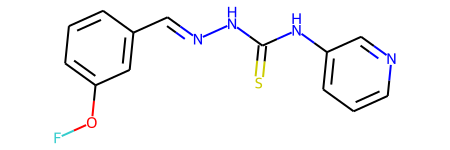

成功生成的高活性分子： FOc1cccc(/C=N/NC(=S)Nc2cccnc2)c1 
Activity（越大药效越好）: 32.4730 
QED（越大类药性越高）: 0.5149 
SA（越小可合成性越高）: 2.4802 
logP（越大疏水性越好）: 2.6654 
------------------------------------------------------------------------------------------------------------


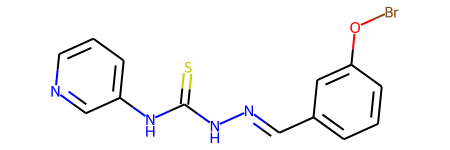

成功生成的高活性分子： S=C(N/N=C/c1cccc(OBr)c1)Nc1cccnc1 
Activity（越大药效越好）: 33.4109 
QED（越大类药性越高）: 0.5037 
SA（越小可合成性越高）: 2.5828 
logP（越大疏水性越好）: 3.0908 
------------------------------------------------------------------------------------------------------------


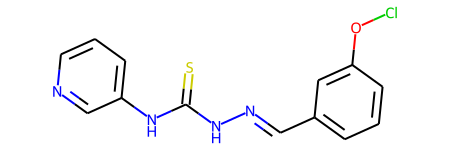

成功生成的高活性分子： S=C(N/N=C/c1cccc(OCl)c1)Nc1cccnc1 
Activity（越大药效越好）: 28.0546 
QED（越大类药性越高）: 0.5166 
SA（越小可合成性越高）: 2.4750 
logP（越大疏水性越好）: 2.9347 
------------------------------------------------------------------------------------------------------------


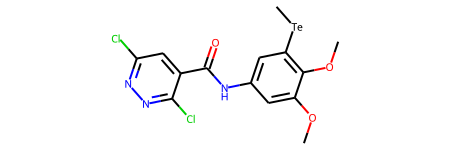

成功生成的高活性分子： COc1cc(NC(=O)c2cc(Cl)nnc2Cl)cc([Te]C)c1OC 
Activity（越大药效越好）: 22.7900 
QED（越大类药性越高）: 0.6810 
SA（越小可合成性越高）: 3.0769 
logP（越大疏水性越好）: 2.4305 
------------------------------------------------------------------------------------------------------------


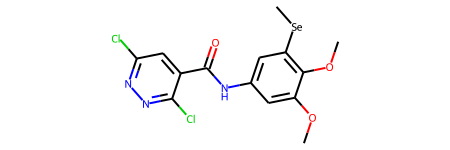

成功生成的高活性分子： COc1cc(NC(=O)c2cc(Cl)nnc2Cl)cc([Se]C)c1OC 
Activity（越大药效越好）: 19.1644 
QED（越大类药性越高）: 0.7516 
SA（越小可合成性越高）: 2.9473 
logP（越大疏水性越好）: 2.4305 
------------------------------------------------------------------------------------------------------------


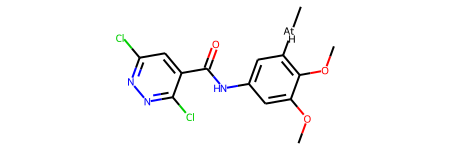

成功生成的高活性分子： COc1cc(NC(=O)c2cc(Cl)nnc2Cl)cc([AtH]C)c1OC 
Activity（越大药效越好）: 18.5462 
QED（越大类药性越高）: 0.6170 
SA（越小可合成性越高）: 3.1935 
logP（越大疏水性越好）: 2.5436 
------------------------------------------------------------------------------------------------------------


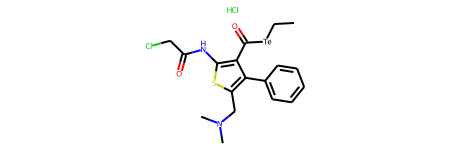

成功生成的高活性分子： CC[Te]C(=O)c1c(NC(=O)CCl)sc(CN(C)C)c1-c1ccccc1.Cl 
Activity（越大药效越好）: 38.0349 
QED（越大类药性越高）: 0.4091 
SA（越小可合成性越高）: 3.2397 
logP（越大疏水性越好）: 4.3584 
------------------------------------------------------------------------------------------------------------


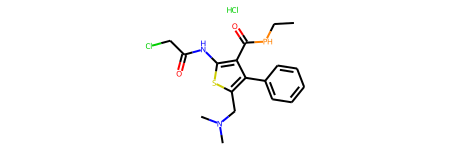

成功生成的高活性分子： CCPC(=O)c1c(NC(=O)CCl)sc(CN(C)C)c1-c1ccccc1.Cl 
Activity（越大药效越好）: 42.4924 
QED（越大类药性越高）: 0.4754 
SA（越小可合成性越高）: 3.5300 
logP（越大疏水性越好）: 4.9144 
------------------------------------------------------------------------------------------------------------


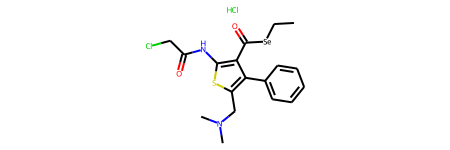

成功生成的高活性分子： CC[Se]C(=O)c1c(NC(=O)CCl)sc(CN(C)C)c1-c1ccccc1.Cl 
Activity（越大药效越好）: 38.3888 
QED（越大类药性越高）: 0.4516 
SA（越小可合成性越高）: 3.1559 
logP（越大疏水性越好）: 4.3584 
------------------------------------------------------------------------------------------------------------


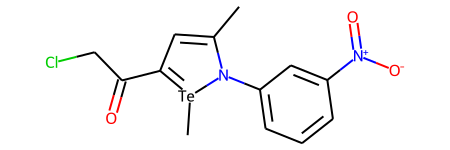

成功生成的高活性分子： CC1=CC(C(=O)CCl)=[Te](C)N1c1cccc([N+](=O)[O-])c1 
Activity（越大药效越好）: 12.5363 
QED（越大类药性越高）: 0.3325 
SA（越小可合成性越高）: 3.7074 
logP（越大疏水性越好）: 2.5019 
------------------------------------------------------------------------------------------------------------


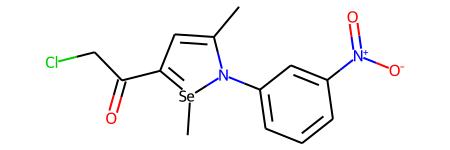

成功生成的高活性分子： CC1=CC(C(=O)CCl)=[Se](C)N1c1cccc([N+](=O)[O-])c1 
Activity（越大药效越好）: 13.4138 
QED（越大类药性越高）: 0.3585 
SA（越小可合成性越高）: 4.0595 
logP（越大疏水性越好）: 2.5019 
------------------------------------------------------------------------------------------------------------


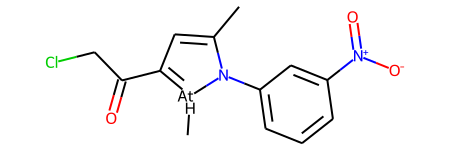

成功生成的高活性分子： CC1=CC(C(=O)CCl)=[AtH](C)N1c1cccc([N+](=O)[O-])c1 
Activity（越大药效越好）: 28.0490 
QED（越大类药性越高）: 0.3691 
SA（越小可合成性越高）: 4.1242 
logP（越大疏水性越好）: 2.6150 
------------------------------------------------------------------------------------------------------------


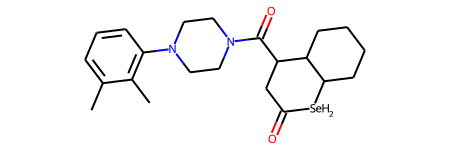

成功生成的高活性分子： Cc1cccc(N2CCN(C(=O)C3CC(=O)[SeH2]C4CCCCC43)CC2)c1C 
Activity（越大药效越好）: 18.0134 
QED（越大类药性越高）: 0.6711 
SA（越小可合成性越高）: 4.0028 
logP（越大疏水性越好）: 2.6460 
------------------------------------------------------------------------------------------------------------


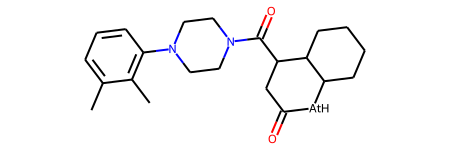

成功生成的高活性分子： Cc1cccc(N2CCN(C(=O)C3CC(=O)[AtH]C4CCCCC43)CC2)c1C 
Activity（越大药效越好）: 14.6170 
QED（越大类药性越高）: 0.5532 
SA（越小可合成性越高）: 4.0028 
logP（越大疏水性越好）: 3.2945 
------------------------------------------------------------------------------------------------------------


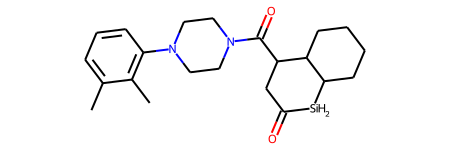

成功生成的高活性分子： Cc1cccc(N2CCN(C(=O)C3CC(=O)[SiH2]C4CCCCC43)CC2)c1C 
Activity（越大药效越好）: 13.5968 
QED（越大类药性越高）: 0.7362 
SA（越小可合成性越高）: 3.9579 
logP（越大疏水性越好）: 2.6460 
------------------------------------------------------------------------------------------------------------


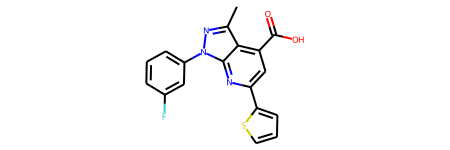

成功生成的高活性分子： Cc1nn(-c2cccc(F)c2)c2nc(-c3cccs3)cc(C(=O)O)c12 
Activity（越大药效越好）: 18.9178 
QED（越大类药性越高）: 0.5963 
SA（越小可合成性越高）: 2.2839 
logP（越大疏水性越好）: 4.2947 
------------------------------------------------------------------------------------------------------------


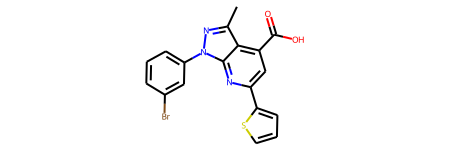

成功生成的高活性分子： Cc1nn(-c2cccc(Br)c2)c2nc(-c3cccs3)cc(C(=O)O)c12 
Activity（越大药效越好）: 23.3927 
QED（越大类药性越高）: 0.5170 
SA（越小可合成性越高）: 2.3263 
logP（越大疏水性越好）: 4.9181 
------------------------------------------------------------------------------------------------------------


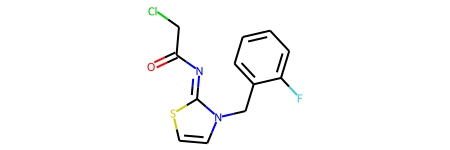

成功生成的高活性分子： O=C(CCl)N=c1sccn1Cc1ccccc1F 
Activity（越大药效越好）: 32.6566 
QED（越大类药性越高）: 0.7972 
SA（越小可合成性越高）: 2.5112 
logP（越大疏水性越好）: 2.4031 
------------------------------------------------------------------------------------------------------------


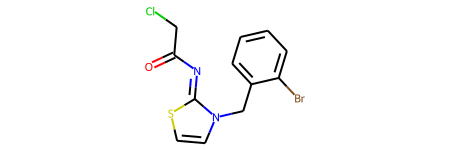

成功生成的高活性分子： O=C(CCl)N=c1sccn1Cc1ccccc1Br 
Activity（越大药效越好）: 40.4746 
QED（越大类药性越高）: 0.7874 
SA（越小可合成性越高）: 2.6051 
logP（越大疏水性越好）: 3.0265 
------------------------------------------------------------------------------------------------------------


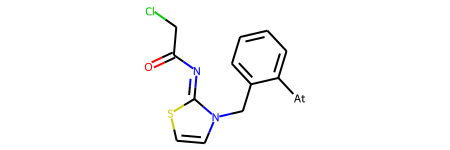

成功生成的高活性分子： O=C(CCl)N=c1sccn1Cc1ccccc1[At] 
Activity（越大药效越好）: 33.3681 
QED（越大类药性越高）: 0.6189 
SA（越小可合成性越高）: 3.3668 
logP（越大疏水性越好）: 1.4386 
------------------------------------------------------------------------------------------------------------


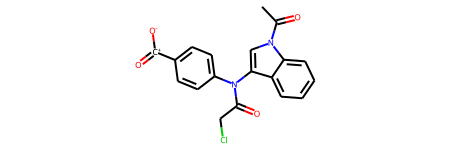

成功生成的高活性分子： CC(=O)n1cc(N(C(=O)CCl)c2ccc([C+](=O)[O-])cc2)c2ccccc21 
Activity（越大药效越好）: 13.4725 
QED（越大类药性越高）: 0.5224 
SA（越小可合成性越高）: 3.4768 
logP（越大疏水性越好）: 2.5684 
------------------------------------------------------------------------------------------------------------


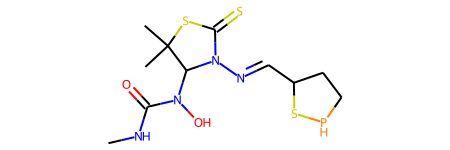

成功生成的高活性分子： CNC(=O)N(O)C1N(/N=C/C2CCPS2)C(=S)SC1(C)C 
Activity（越大药效越好）: 28.4620 
QED（越大类药性越高）: 0.2630 
SA（越小可合成性越高）: 5.4701 
logP（越大疏水性越好）: 2.5402 
------------------------------------------------------------------------------------------------------------


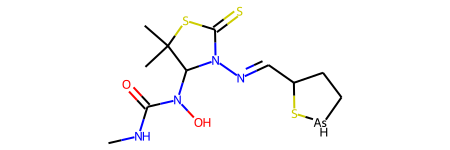

成功生成的高活性分子： CNC(=O)N(O)C1N(/N=C/C2CC[AsH]S2)C(=S)SC1(C)C 
Activity（越大药效越好）: 42.0020 
QED（越大类药性越高）: 0.2429 
SA（越小可合成性越高）: 5.5755 
logP（越大疏水性越好）: 1.7165 
------------------------------------------------------------------------------------------------------------


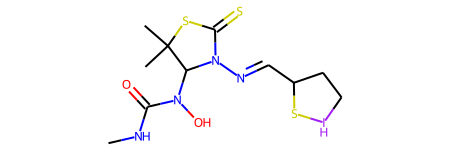

成功生成的高活性分子： CNC(=O)N(O)C1N(/N=C/C2CC[IH]S2)C(=S)SC1(C)C 
Activity（越大药效越好）: 43.4869 
QED（越大类药性越高）: 0.1679 
SA（越小可合成性越高）: 5.4237 
logP（越大疏水性越好）: 2.5647 
------------------------------------------------------------------------------------------------------------


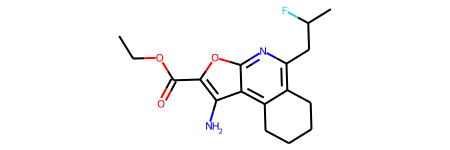

成功生成的高活性分子： CCOC(=O)c1oc2nc(CC(C)F)c3c(c2c1N)CCCC3 
Activity（越大药效越好）: -8.3917 
QED（越大类药性越高）: 0.8739 
SA（越小可合成性越高）: 3.4703 
logP（越大疏水性越好）: 3.3660 
------------------------------------------------------------------------------------------------------------


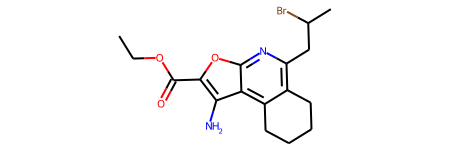

成功生成的高活性分子： CCOC(=O)c1oc2nc(CC(C)Br)c3c(c2c1N)CCCC3 
Activity（越大药效越好）: -4.1302 
QED（越大类药性越高）: 0.6441 
SA（越小可合成性越高）: 3.4573 
logP（越大疏水性越好）: 3.7914 
------------------------------------------------------------------------------------------------------------


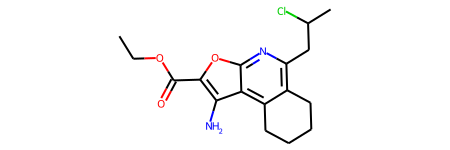

成功生成的高活性分子： CCOC(=O)c1oc2nc(CC(C)Cl)c3c(c2c1N)CCCC3 
Activity（越大药效越好）: 6.7635 
QED（越大类药性越高）: 0.6809 
SA（越小可合成性越高）: 3.4325 
logP（越大疏水性越好）: 3.6353 
------------------------------------------------------------------------------------------------------------


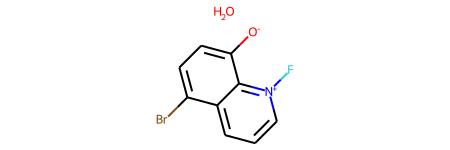

成功生成的高活性分子： O.[O-]c1ccc(Br)c2ccc[n+](F)c12 
Activity（越大药效越好）: 46.5140 
QED（越大类药性越高）: 0.6929 
SA（越小可合成性越高）: 3.9636 
logP（越大疏水性越好）: 0.8713 
------------------------------------------------------------------------------------------------------------


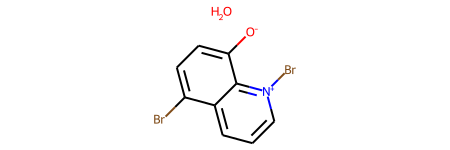

成功生成的高活性分子： O.[O-]c1ccc(Br)c2ccc[n+](Br)c12 
Activity（越大药效越好）: 51.9560 
QED（越大类药性越高）: 0.7214 
SA（越小可合成性越高）: 4.1162 
logP（越大疏水性越好）: 1.2967 
------------------------------------------------------------------------------------------------------------


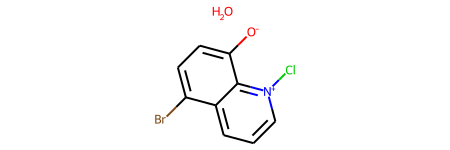

成功生成的高活性分子： O.[O-]c1ccc(Br)c2ccc[n+](Cl)c12 
Activity（越大药效越好）: 43.5747 
QED（越大类药性越高）: 0.7117 
SA（越小可合成性越高）: 4.0990 
logP（越大疏水性越好）: 1.1406 
------------------------------------------------------------------------------------------------------------


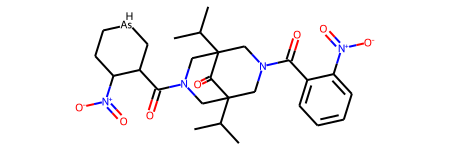

成功生成的高活性分子： CC(C)C12CN(C(=O)c3ccccc3[N+](=O)[O-])CC(C(C)C)(CN(C(=O)C3C[AsH]CCC3[N+](=O)[O-])C1)C2=O 
Activity（越大药效越好）: 17.3781 
QED（越大类药性越高）: 0.2815 
SA（越小可合成性越高）: 5.7813 
logP（越大疏水性越好）: 2.6850 
------------------------------------------------------------------------------------------------------------


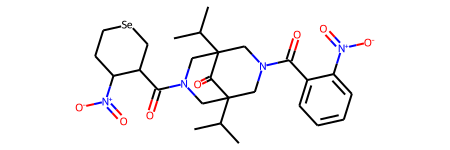

成功生成的高活性分子： CC(C)C12CN(C(=O)c3ccccc3[N+](=O)[O-])CC(C(C)C)(CN(C(=O)C3C[Se]CCC3[N+](=O)[O-])C1)C2=O 
Activity（越大药效越好）: 25.9371 
QED（越大类药性越高）: 0.2803 
SA（越小可合成性越高）: 5.5786 
logP（越大疏水性越好）: 2.9527 
------------------------------------------------------------------------------------------------------------


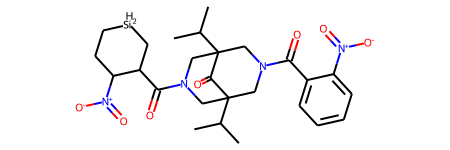

成功生成的高活性分子： CC(C)C12CN(C(=O)c3ccccc3[N+](=O)[O-])CC(C(C)C)(CN(C(=O)C3C[SiH2]CCC3[N+](=O)[O-])C1)C2=O 
Activity（越大药效越好）: 26.2533 
QED（越大类药性越高）: 0.3038 
SA（越小可合成性越高）: 5.6078 
logP（越大疏水性越好）: 2.4173 
------------------------------------------------------------------------------------------------------------


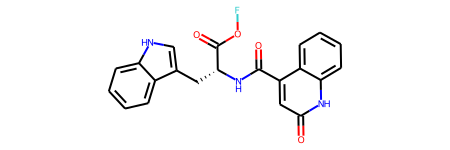

成功生成的高活性分子： O=C(N[C@H](Cc1c[nH]c2ccccc12)C(=O)OF)c1cc(=O)[nH]c2ccccc12 
Activity（越大药效越好）: 31.6692 
QED（越大类药性越高）: 0.4850 
SA（越小可合成性越高）: 2.8800 
logP（越大疏水性越好）: 2.7782 
------------------------------------------------------------------------------------------------------------


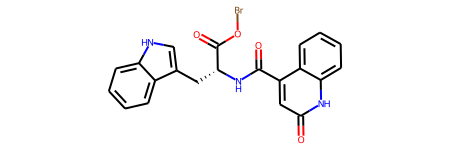

成功生成的高活性分子： O=C(N[C@H](Cc1c[nH]c2ccccc12)C(=O)OBr)c1cc(=O)[nH]c2ccccc12 
Activity（越大药效越好）: 37.5772 
QED（越大类药性越高）: 0.4310 
SA（越小可合成性越高）: 2.9050 
logP（越大疏水性越好）: 3.2036 
------------------------------------------------------------------------------------------------------------


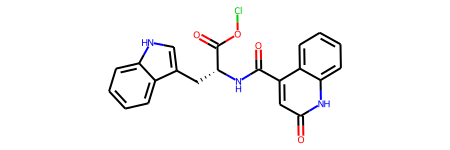

成功生成的高活性分子： O=C(N[C@H](Cc1c[nH]c2ccccc12)C(=O)OCl)c1cc(=O)[nH]c2ccccc12 
Activity（越大药效越好）: 29.3037 
QED（越大类药性越高）: 0.4709 
SA（越小可合成性越高）: 2.8716 
logP（越大疏水性越好）: 3.0475 
------------------------------------------------------------------------------------------------------------


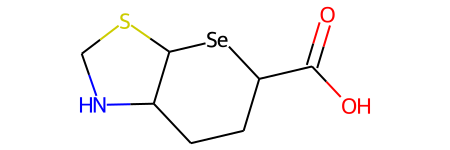

成功生成的高活性分子： O=C(O)C1CCC2NCSC2[Se]1 
Activity（越大药效越好）: -12.1008 
QED（越大类药性越高）: 0.6610 
SA（越小可合成性越高）: 5.5547 
logP（越大疏水性越好）: 0.3461 
------------------------------------------------------------------------------------------------------------


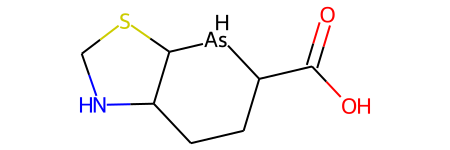

成功生成的高活性分子： O=C(O)C1CCC2NCSC2[AsH]1 
Activity（越大药效越好）: -28.1221 
QED（越大类药性越高）: 0.6460 
SA（越小可合成性越高）: 5.8763 
logP（越大疏水性越好）: 0.0784 
------------------------------------------------------------------------------------------------------------


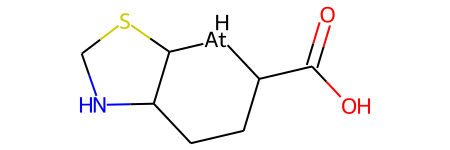

成功生成的高活性分子： O=C(O)C1CCC2NCSC2[AtH]1 
Activity（越大药效越好）: -23.1429 
QED（越大类药性越高）: 0.6901 
SA（越小可合成性越高）: 5.7776 
logP（越大疏水性越好）: 0.4592 
------------------------------------------------------------------------------------------------------------


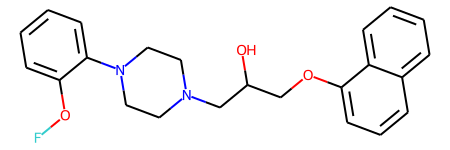

成功生成的高活性分子： OC(COc1cccc2ccccc12)CN1CCN(c2ccccc2OF)CC1 
Activity（越大药效越好）: 9.9246 
QED（越大类药性越高）: 0.6604 
SA（越小可合成性越高）: 2.7086 
logP（越大疏水性越好）: 3.6650 
------------------------------------------------------------------------------------------------------------


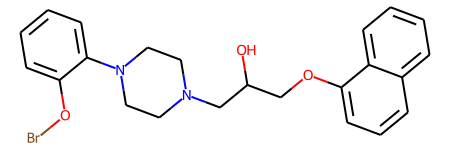

成功生成的高活性分子： OC(COc1cccc2ccccc12)CN1CCN(c2ccccc2OBr)CC1 
Activity（越大药效越好）: 11.7091 
QED（越大类药性越高）: 0.5794 
SA（越小可合成性越高）: 2.7644 
logP（越大疏水性越好）: 4.0904 
------------------------------------------------------------------------------------------------------------


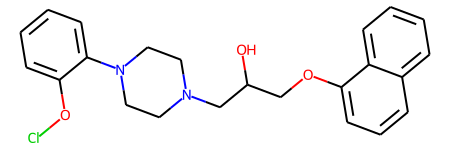

成功生成的高活性分子： OC(COc1cccc2ccccc12)CN1CCN(c2ccccc2OCl)CC1 
Activity（越大药效越好）: 7.3585 
QED（越大类药性越高）: 0.6366 
SA（越小可合成性越高）: 2.6952 
logP（越大疏水性越好）: 3.9343 
------------------------------------------------------------------------------------------------------------


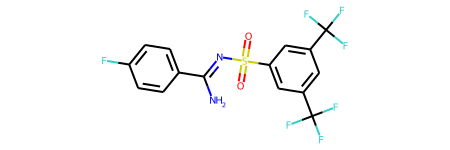

成功生成的高活性分子： N/C(=N\S(=O)(=O)c1cc(C(F)(F)F)cc(C(F)(F)F)c1)c1ccc(F)cc1 
Activity（越大药效越好）: 1.2181 
QED（越大类药性越高）: 0.4696 
SA（越小可合成性越高）: 2.4855 
logP（越大疏水性越好）: 3.9575 
------------------------------------------------------------------------------------------------------------


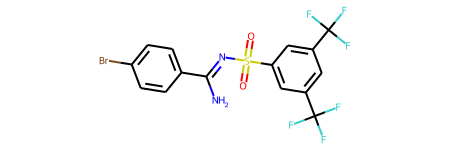

成功生成的高活性分子： N/C(=N\S(=O)(=O)c1cc(C(F)(F)F)cc(C(F)(F)F)c1)c1ccc(Br)cc1 
Activity（越大药效越好）: 4.2981 
QED（越大类药性越高）: 0.4016 
SA（越小可合成性越高）: 2.5328 
logP（越大疏水性越好）: 4.5809 
------------------------------------------------------------------------------------------------------------


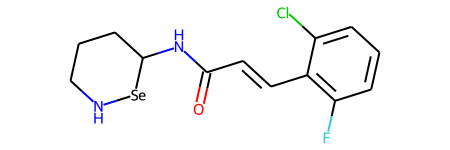

成功生成的高活性分子： O=C(/C=C/c1c(F)cccc1Cl)NC1CCCN[Se]1 
Activity（越大药效越好）: 8.8212 
QED（越大类药性越高）: 0.6479 
SA（越小可合成性越高）: 3.8673 
logP（越大疏水性越好）: 1.9372 
------------------------------------------------------------------------------------------------------------


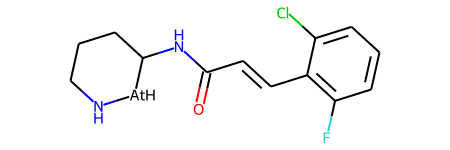

成功生成的高活性分子： O=C(/C=C/c1c(F)cccc1Cl)NC1CCCN[AtH]1 
Activity（越大药效越好）: 7.8424 
QED（越大类药性越高）: 0.6519 
SA（越小可合成性越高）: 3.9474 
logP（越大疏水性越好）: 2.0503 
------------------------------------------------------------------------------------------------------------


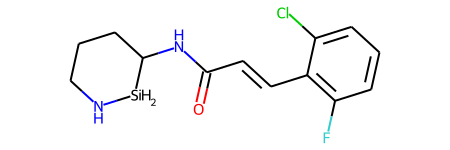

成功生成的高活性分子： O=C(/C=C/c1c(F)cccc1Cl)NC1CCCN[SiH2]1 
Activity（越大药效越好）: 11.0807 
QED（越大类药性越高）: 0.6542 
SA（越小可合成性越高）: 3.8610 
logP（越大疏水性越好）: 1.4018 
------------------------------------------------------------------------------------------------------------


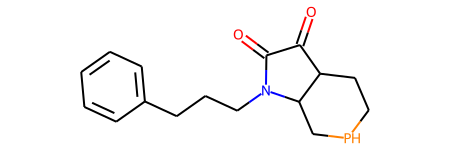

成功生成的高活性分子： O=C1C(=O)N(CCCc2ccccc2)C2CPCCC12 
Activity（越大药效越好）: 5.6007 
QED（越大类药性越高）: 0.6286 
SA（越小可合成性越高）: 3.9623 
logP（越大疏水性越好）: 2.0975 
------------------------------------------------------------------------------------------------------------


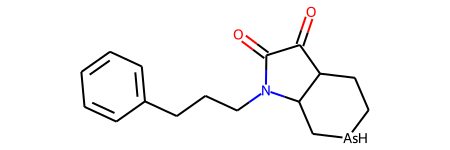

成功生成的高活性分子： O=C1C(=O)N(CCCc2ccccc2)C2C[AsH]CCC12 
Activity（越大药效越好）: 13.2781 
QED（越大类药性越高）: 0.6212 
SA（越小可合成性越高）: 4.1083 
logP（越大疏水性越好）: 1.6921 
------------------------------------------------------------------------------------------------------------


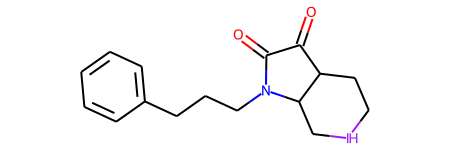

成功生成的高活性分子： O=C1C(=O)N(CCCc2ccccc2)C2C[IH]CCC12 
Activity（越大药效越好）: 15.8688 
QED（越大类药性越高）: 0.4525 
SA（越小可合成性越高）: 3.9562 
logP（越大疏水性越好）: 2.1220 
------------------------------------------------------------------------------------------------------------


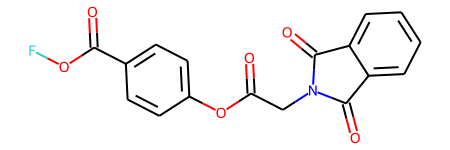

成功生成的高活性分子： O=C(CN1C(=O)c2ccccc2C1=O)Oc1ccc(C(=O)OF)cc1 
Activity（越大药效越好）: 10.3027 
QED（越大类药性越高）: 0.4786 
SA（越小可合成性越高）: 2.2080 
logP（越大疏水性越好）: 1.9295 
------------------------------------------------------------------------------------------------------------


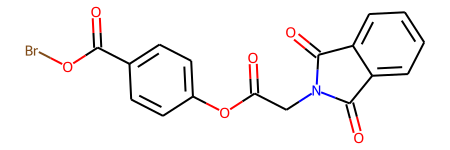

成功生成的高活性分子： O=C(CN1C(=O)c2ccccc2C1=O)Oc1ccc(C(=O)OBr)cc1 
Activity（越大药效越好）: 14.5413 
QED（越大类药性越高）: 0.4417 
SA（越小可合成性越高）: 2.2051 
logP（越大疏水性越好）: 2.3549 
------------------------------------------------------------------------------------------------------------


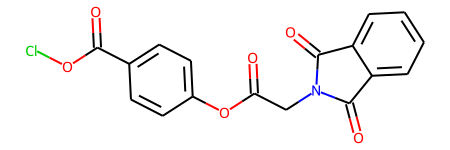

成功生成的高活性分子： O=C(CN1C(=O)c2ccccc2C1=O)Oc1ccc(C(=O)OCl)cc1 
Activity（越大药效越好）: 10.7822 
QED（越大类药性越高）: 0.4720 
SA（越小可合成性越高）: 2.1956 
logP（越大疏水性越好）: 2.1988 
------------------------------------------------------------------------------------------------------------


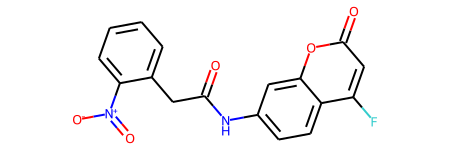

成功生成的高活性分子： O=C(Cc1ccccc1[N+](=O)[O-])Nc1ccc2c(F)cc(=O)oc2c1 
Activity（越大药效越好）: 20.8590 
QED（越大类药性越高）: 0.4459 
SA（越小可合成性越高）: 2.2412 
logP（越大疏水性越好）: 3.0215 
------------------------------------------------------------------------------------------------------------


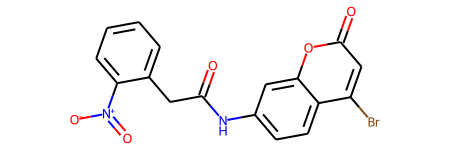

成功生成的高活性分子： O=C(Cc1ccccc1[N+](=O)[O-])Nc1ccc2c(Br)cc(=O)oc2c1 
Activity（越大药效越好）: 28.8004 
QED（越大类药性越高）: 0.4071 
SA（越小可合成性越高）: 2.2996 
logP（越大疏水性越好）: 3.6449 
------------------------------------------------------------------------------------------------------------


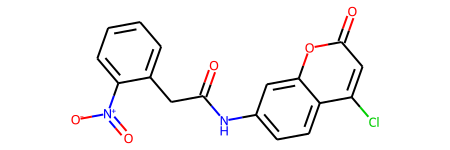

成功生成的高活性分子： O=C(Cc1ccccc1[N+](=O)[O-])Nc1ccc2c(Cl)cc(=O)oc2c1 
Activity（越大药效越好）: 25.9929 
QED（越大类药性越高）: 0.4363 
SA（越小可合成性越高）: 2.2592 
logP（越大疏水性越好）: 3.5358 
------------------------------------------------------------------------------------------------------------


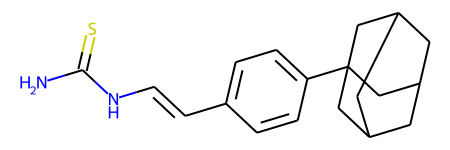

成功生成的高活性分子： NC(=S)N/C=C/c1ccc(C23CC4CC(CC(C4)C2)C3)cc1 
Activity（越大药效越好）: 5.4350 
QED（越大类药性越高）: 0.8298 
SA（越小可合成性越高）: 3.9442 
logP（越大疏水性越好）: 3.9583 
------------------------------------------------------------------------------------------------------------


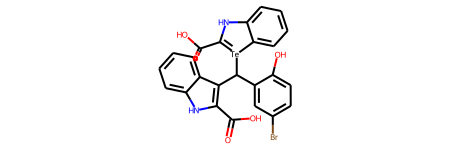

成功生成的高活性分子： O=C(O)C1=[Te](C(c2cc(Br)ccc2O)c2c(C(=O)O)[nH]c3ccccc23)c2ccccc2N1 
Activity（越大药效越好）: 5.8658 
QED（越大类药性越高）: 0.2174 
SA（越小可合成性越高）: 3.9348 
logP（越大疏水性越好）: 3.6290 
------------------------------------------------------------------------------------------------------------


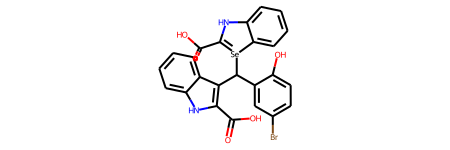

成功生成的高活性分子： O=C(O)C1=[Se](C(c2cc(Br)ccc2O)c2c(C(=O)O)[nH]c3ccccc23)c2ccccc2N1 
Activity（越大药效越好）: 7.8000 
QED（越大类药性越高）: 0.2331 
SA（越小可合成性越高）: 4.1280 
logP（越大疏水性越好）: 3.6290 
------------------------------------------------------------------------------------------------------------


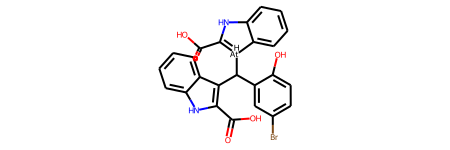

成功生成的高活性分子： O=C(O)C1=[AtH](C(c2cc(Br)ccc2O)c2c(C(=O)O)[nH]c3ccccc23)c2ccccc2N1 
Activity（越大药效越好）: 10.3777 
QED（越大类药性越高）: 0.2161 
SA（越小可合成性越高）: 4.1786 
logP（越大疏水性越好）: 3.7421 
------------------------------------------------------------------------------------------------------------


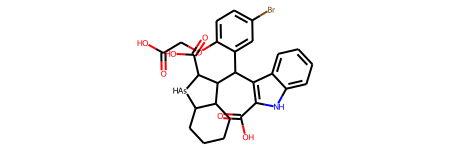

成功生成的高活性分子： O=C(O)COc1ccc(Br)cc1C(c1c(C(=O)O)[nH]c2ccccc12)C1C(C(=O)O)[AsH]C2CCCCC21 
Activity（越大药效越好）: -3.5075 
QED（越大类药性越高）: 0.2526 
SA（越小可合成性越高）: 4.7291 
logP（越大疏水性越好）: 5.1420 
------------------------------------------------------------------------------------------------------------


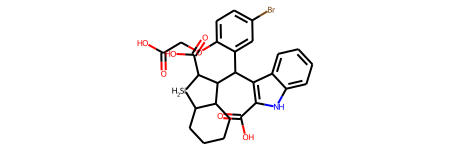

成功生成的高活性分子： O=C(O)COc1ccc(Br)cc1C(c1c(C(=O)O)[nH]c2ccccc12)C1C(C(=O)O)[SiH2]C2CCCCC21 
Activity（越大药效越好）: 0.8996 
QED（越大类药性越高）: 0.2765 
SA（越小可合成性越高）: 4.6031 
logP（越大疏水性越好）: 4.8743 
------------------------------------------------------------------------------------------------------------


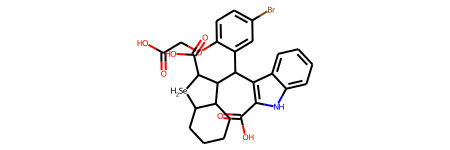

成功生成的高活性分子： O=C(O)COc1ccc(Br)cc1C(c1c(C(=O)O)[nH]c2ccccc12)C1C(C(=O)O)[SeH2]C2CCCCC21 
Activity（越大药效越好）: 8.4617 
QED（越大类药性越高）: 0.2589 
SA（越小可合成性越高）: 4.6480 
logP（越大疏水性越好）: 4.8743 
------------------------------------------------------------------------------------------------------------


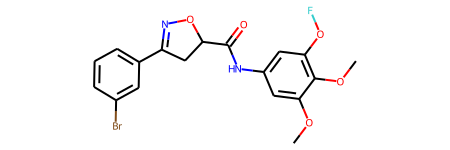

成功生成的高活性分子： COc1cc(NC(=O)C2CC(c3cccc(Br)c3)=NO2)cc(OF)c1OC 
Activity（越大药效越好）: 37.9499 
QED（越大类药性越高）: 0.7400 
SA（越小可合成性越高）: 3.0873 
logP（越大疏水性越好）: 3.8613 
------------------------------------------------------------------------------------------------------------


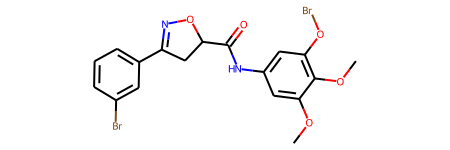

成功生成的高活性分子： COc1cc(NC(=O)C2CC(c3cccc(Br)c3)=NO2)cc(OBr)c1OC 
Activity（越大药效越好）: 41.1284 
QED（越大类药性越高）: 0.6411 
SA（越小可合成性越高）: 3.1497 
logP（越大疏水性越好）: 4.2867 
------------------------------------------------------------------------------------------------------------


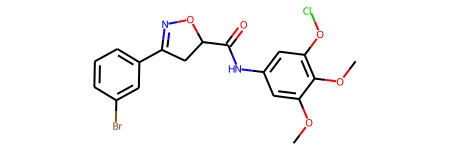

成功生成的高活性分子： COc1cc(NC(=O)C2CC(c3cccc(Br)c3)=NO2)cc(OCl)c1OC 
Activity（越大药效越好）: 33.4490 
QED（越大类药性越高）: 0.7085 
SA（越小可合成性越高）: 3.0724 
logP（越大疏水性越好）: 4.1306 
------------------------------------------------------------------------------------------------------------


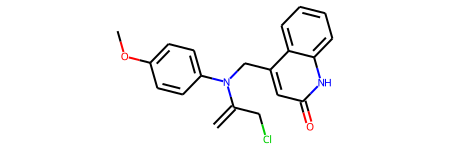

成功生成的高活性分子： C=C(CCl)N(Cc1cc(=O)[nH]c2ccccc12)c1ccc(OC)cc1 
Activity（越大药效越好）: 28.7145 
QED（越大类药性越高）: 0.6713 
SA（越小可合成性越高）: 2.5062 
logP（越大疏水性越好）: 4.2958 
------------------------------------------------------------------------------------------------------------


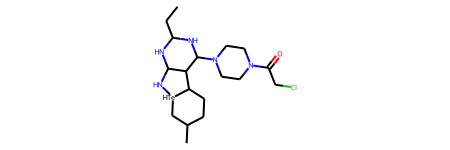

成功生成的高活性分子： CCC1NC2N[TeH]3CC(C)CCC3C2C(N2CCN(C(=O)CCl)CC2)N1 
Activity（越大药效越好）: 29.8557 
QED（越大类药性越高）: 0.3944 
SA（越小可合成性越高）: 5.6783 
logP（越大疏水性越好）: 0.6938 
------------------------------------------------------------------------------------------------------------


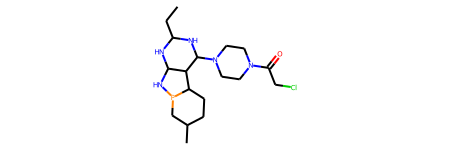

成功生成的高活性分子： CCC1NC2NP3CC(C)CCC3C2C(N2CCN(C(=O)CCl)CC2)N1 
Activity（越大药效越好）: 14.5355 
QED（越大类药性越高）: 0.4923 
SA（越小可合成性越高）: 5.5200 
logP（越大疏水性越好）: 1.3653 
------------------------------------------------------------------------------------------------------------


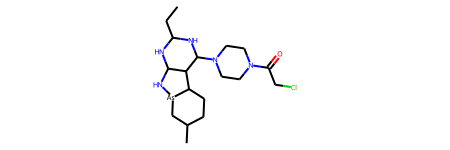

成功生成的高活性分子： CCC1NC2N[As]3CC(C)CCC3C2C(N2CCN(C(=O)CCl)CC2)N1 
Activity（越大药效越好）: 23.4663 
QED（越大类药性越高）: 0.4462 
SA（越小可合成性越高）: 5.6489 
logP（越大疏水性越好）: 0.9615 
------------------------------------------------------------------------------------------------------------


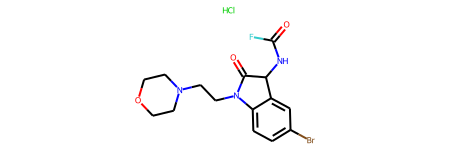

成功生成的高活性分子： Cl.O=C(F)NC1C(=O)N(CCN2CCOCC2)c2ccc(Br)cc21 
Activity（越大药效越好）: 10.1943 
QED（越大类药性越高）: 0.5972 
SA（越小可合成性越高）: 3.2220 
logP（越大疏水性越好）: 2.2699 
------------------------------------------------------------------------------------------------------------


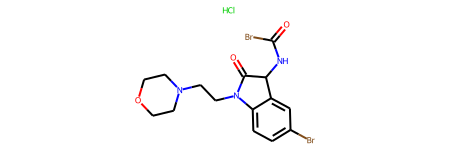

成功生成的高活性分子： Cl.O=C(Br)NC1C(=O)N(CCN2CCOCC2)c2ccc(Br)cc21 
Activity（越大药效越好）: 10.7318 
QED（越大类药性越高）: 0.5286 
SA（越小可合成性越高）: 3.2610 
logP（越大疏水性越好）: 2.6953 
------------------------------------------------------------------------------------------------------------


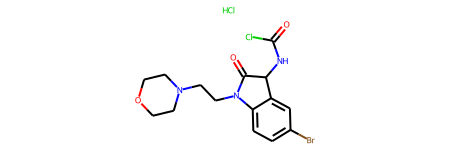

成功生成的高活性分子： Cl.O=C(Cl)NC1C(=O)N(CCN2CCOCC2)c2ccc(Br)cc21 
Activity（越大药效越好）: 16.9565 
QED（越大类药性越高）: 0.5791 
SA（越小可合成性越高）: 3.1822 
logP（越大疏水性越好）: 2.5392 
------------------------------------------------------------------------------------------------------------


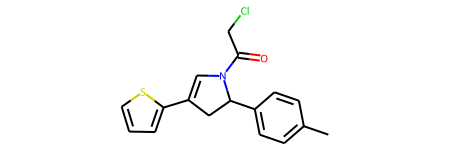

成功生成的高活性分子： Cc1ccc(C2CC(c3cccs3)=CN2C(=O)CCl)cc1 
Activity（越大药效越好）: 45.9791 
QED（越大类药性越高）: 0.7570 
SA（越小可合成性越高）: 3.2084 
logP（越大疏水性越好）: 4.6098 
------------------------------------------------------------------------------------------------------------


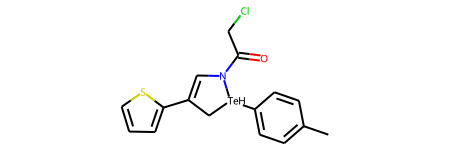

成功生成的高活性分子： Cc1ccc([TeH]2CC(c3cccs3)=CN2C(=O)CCl)cc1 
Activity（越大药效越好）: 49.8806 
QED（越大类药性越高）: 0.5383 
SA（越小可合成性越高）: 4.1961 
logP（越大疏水性越好）: 3.1094 
------------------------------------------------------------------------------------------------------------


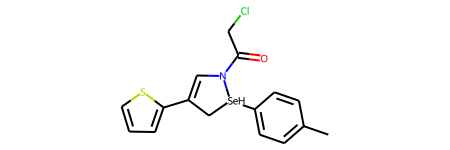

成功生成的高活性分子： Cc1ccc([SeH]2CC(c3cccs3)=CN2C(=O)CCl)cc1 
Activity（越大药效越好）: 48.4132 
QED（越大类药性越高）: 0.5880 
SA（越小可合成性越高）: 4.1961 
logP（越大疏水性越好）: 3.1094 
------------------------------------------------------------------------------------------------------------


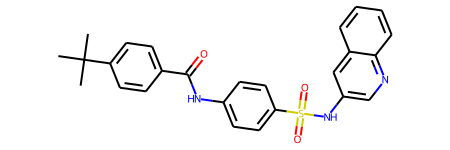

成功生成的高活性分子： CC(C)(C)c1ccc(C(=O)Nc2ccc(S(=O)(=O)Nc3cnc4ccccc4c3)cc2)cc1 
Activity（越大药效越好）: 25.8437 
QED（越大类药性越高）: 0.4074 
SA（越小可合成性越高）: 2.0604 
logP（越大疏水性越好）: 5.5854 
------------------------------------------------------------------------------------------------------------


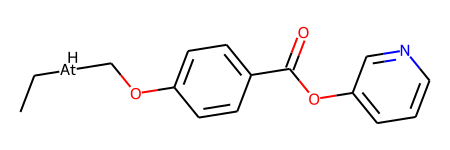

成功生成的高活性分子： CC[AtH]COc1ccc(C(=O)Oc2cccnc2)cc1 
Activity（越大药效越好）: 30.6084 
QED（越大类药性越高）: 0.4836 
SA（越小可合成性越高）: 2.8013 
logP（越大疏水性越好）: 2.8926 
------------------------------------------------------------------------------------------------------------


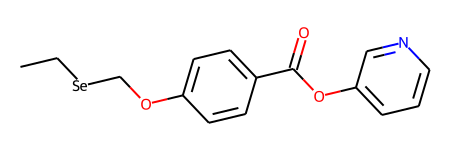

成功生成的高活性分子： CC[Se]COc1ccc(C(=O)Oc2cccnc2)cc1 
Activity（越大药效越好）: 17.9907 
QED（越大类药性越高）: 0.4624 
SA（越小可合成性越高）: 2.5805 
logP（越大疏水性越好）: 2.7795 
------------------------------------------------------------------------------------------------------------


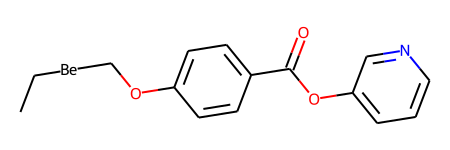

成功生成的高活性分子： CC[Be]COc1ccc(C(=O)Oc2cccnc2)cc1 
Activity（越大药效越好）: 16.7400 
QED（越大类药性越高）: 0.4581 
SA（越小可合成性越高）: 2.8013 
logP（越大疏水性越好）: 2.7795 
------------------------------------------------------------------------------------------------------------


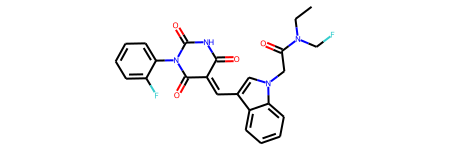

成功生成的高活性分子： CCN(CF)C(=O)Cn1cc(/C=C2\C(=O)NC(=O)N(c3ccccc3F)C2=O)c2ccccc21 
Activity（越大药效越好）: 12.0670 
QED（越大类药性越高）: 0.3431 
SA（越小可合成性越高）: 2.7521 
logP（越大疏水性越好）: 3.2223 
------------------------------------------------------------------------------------------------------------


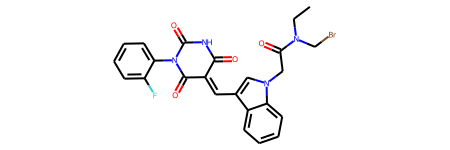

成功生成的高活性分子： CCN(CBr)C(=O)Cn1cc(/C=C2\C(=O)NC(=O)N(c3ccccc3F)C2=O)c2ccccc21 
Activity（越大药效越好）: 12.8476 
QED（越大类药性越高）: 0.2295 
SA（越小可合成性越高）: 2.7741 
logP（越大疏水性越好）: 3.6477 
------------------------------------------------------------------------------------------------------------


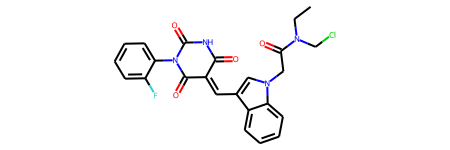

成功生成的高活性分子： CCN(CCl)C(=O)Cn1cc(/C=C2\C(=O)NC(=O)N(c3ccccc3F)C2=O)c2ccccc21 
Activity（越大药效越好）: 19.0687 
QED（越大类药性越高）: 0.2518 
SA（越小可合成性越高）: 2.7303 
logP（越大疏水性越好）: 3.4916 
------------------------------------------------------------------------------------------------------------


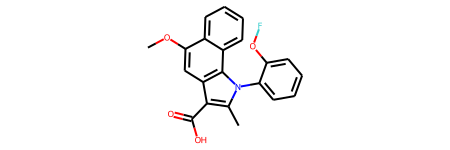

成功生成的高活性分子： COc1cc2c(C(=O)O)c(C)n(-c3ccccc3OF)c2c2ccccc12 
Activity（越大药效越好）: 9.9688 
QED（越大类药性越高）: 0.5489 
SA（越小可合成性越高）: 2.5231 
logP（越大疏水性越好）: 5.0622 
------------------------------------------------------------------------------------------------------------


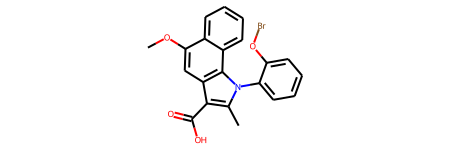

成功生成的高活性分子： COc1cc2c(C(=O)O)c(C)n(-c3ccccc3OBr)c2c2ccccc12 
Activity（越大药效越好）: 15.6873 
QED（越大类药性越高）: 0.4691 
SA（越小可合成性越高）: 2.5855 
logP（越大疏水性越好）: 5.4876 
------------------------------------------------------------------------------------------------------------


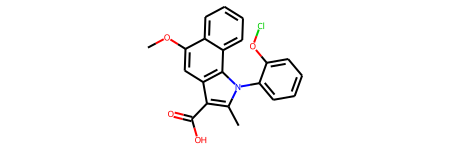

成功生成的高活性分子： COc1cc2c(C(=O)O)c(C)n(-c3ccccc3OCl)c2c2ccccc12 
Activity（越大药效越好）: 8.1216 
QED（越大类药性越高）: 0.5186 
SA（越小可合成性越高）: 2.5081 
logP（越大疏水性越好）: 5.3315 
------------------------------------------------------------------------------------------------------------


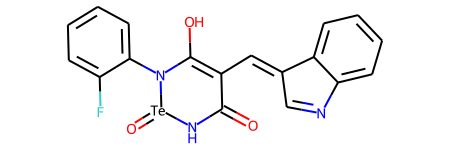

成功生成的高活性分子： O=C1N[Te](=O)N(c2ccccc2F)C(O)=C1/C=C1\C=Nc2ccccc21 
Activity（越大药效越好）: 16.3548 
QED（越大类药性越高）: 0.6695 
SA（越小可合成性越高）: 3.5947 
logP（越大疏水性越好）: 2.7464 
------------------------------------------------------------------------------------------------------------


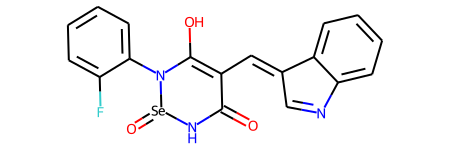

成功生成的高活性分子： O=C1N[Se](=O)N(c2ccccc2F)C(O)=C1/C=C1\C=Nc2ccccc21 
Activity（越大药效越好）: 17.0809 
QED（越大类药性越高）: 0.7382 
SA（越小可合成性越高）: 3.9586 
logP（越大疏水性越好）: 2.7464 
------------------------------------------------------------------------------------------------------------


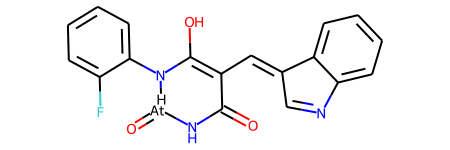

成功生成的高活性分子： O=C1N[AtH](=O)N(c2ccccc2F)C(O)=C1/C=C1\C=Nc2ccccc21 
Activity（越大药效越好）: 38.9484 
QED（越大类药性越高）: 0.6054 
SA（越小可合成性越高）: 4.0115 
logP（越大疏水性越好）: 2.8595 
------------------------------------------------------------------------------------------------------------


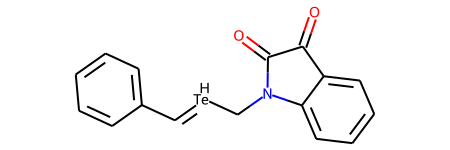

成功生成的高活性分子： O=C1C(=O)N(C/[TeH]=C/c2ccccc2)c2ccccc21 
Activity（越大药效越好）: 35.5114 
QED（越大类药性越高）: 0.5987 
SA（越小可合成性越高）: 2.8861 
logP（越大疏水性越好）: 1.4604 
------------------------------------------------------------------------------------------------------------


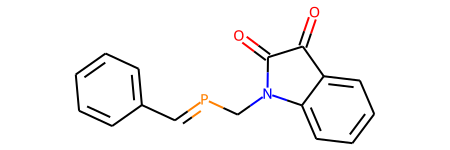

成功生成的高活性分子： O=C1C(=O)N(C/P=C/c2ccccc2)c2ccccc21 
Activity（越大药效越好）: 23.6423 
QED（越大类药性越高）: 0.6404 
SA（越小可合成性越高）: 2.8159 
logP（越大疏水性越好）: 2.9701 
------------------------------------------------------------------------------------------------------------


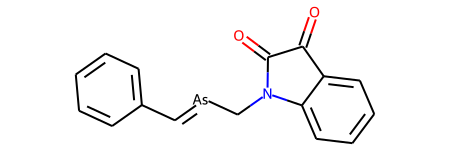

成功生成的高活性分子： O=C1C(=O)N(C/[As]=C/c2ccccc2)c2ccccc21 
Activity（越大药效越好）: 20.0363 
QED（越大类药性越高）: 0.6366 
SA（越小可合成性越高）: 2.8451 
logP（越大疏水性越好）: 1.7281 
------------------------------------------------------------------------------------------------------------


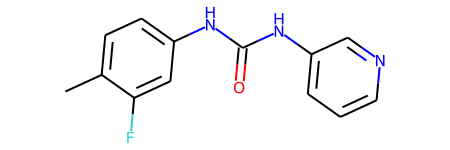

成功生成的高活性分子： Cc1ccc(NC(=O)Nc2cccnc2)cc1F 
Activity（越大药效越好）: 15.4895 
QED（越大类药性越高）: 0.8533 
SA（越小可合成性越高）: 1.7362 
logP（越大疏水性越好）: 3.1731 
------------------------------------------------------------------------------------------------------------


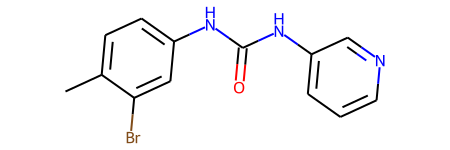

成功生成的高活性分子： Cc1ccc(NC(=O)Nc2cccnc2)cc1Br 
Activity（越大药效越好）: 18.6695 
QED（越大类药性越高）: 0.8865 
SA（越小可合成性越高）: 1.8481 
logP（越大疏水性越好）: 3.7965 
------------------------------------------------------------------------------------------------------------


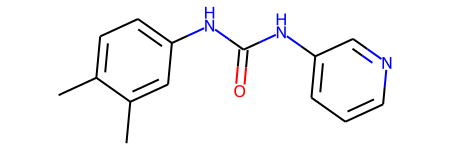

成功生成的高活性分子： Cc1ccc(NC(=O)Nc2cccnc2)cc1C 
Activity（越大药效越好）: 13.0548 
QED（越大类药性越高）: 0.8468 
SA（越小可合成性越高）: 1.6801 
logP（越大疏水性越好）: 3.3424 
------------------------------------------------------------------------------------------------------------


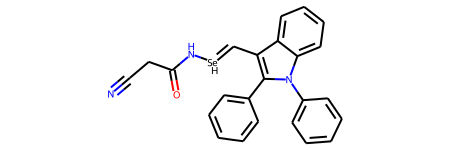

成功生成的高活性分子： N#CCC(=O)N/[SeH]=C/c1c(-c2ccccc2)n(-c2ccccc2)c2ccccc12 
Activity（越大药效越好）: 11.5903 
QED（越大类药性越高）: 0.4760 
SA（越小可合成性越高）: 2.9186 
logP（越大疏水性越好）: 3.8292 
------------------------------------------------------------------------------------------------------------


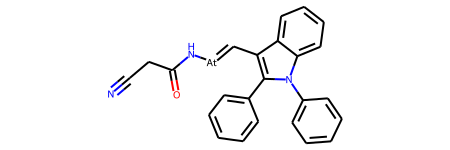

成功生成的高活性分子： N#CCC(=O)N/[At]=C/c1c(-c2ccccc2)n(-c2ccccc2)c2ccccc12 
Activity（越大药效越好）: 14.8515 
QED（越大类药性越高）: 0.3826 
SA（越小可合成性越高）: 2.9186 
logP（越大疏水性越好）: 4.4777 
------------------------------------------------------------------------------------------------------------


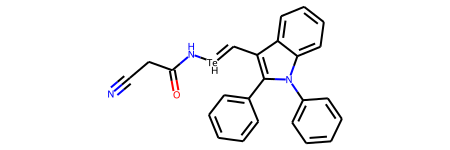

成功生成的高活性分子： N#CCC(=O)N/[TeH]=C/c1c(-c2ccccc2)n(-c2ccccc2)c2ccccc12 
Activity（越大药效越好）: 13.6467 
QED（越大类药性越高）: 0.4304 
SA（越小可合成性越高）: 2.9186 
logP（越大疏水性越好）: 3.8292 
------------------------------------------------------------------------------------------------------------


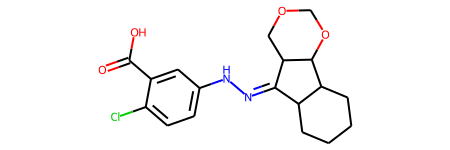

成功生成的高活性分子： O=C(O)c1cc(NN=C2C3CCCCC3C3OCOCC23)ccc1Cl 
Activity（越大药效越好）: -3.3940 
QED（越大类药性越高）: 0.8006 
SA（越小可合成性越高）: 4.0247 
logP（越大疏水性越好）: 3.6152 
------------------------------------------------------------------------------------------------------------


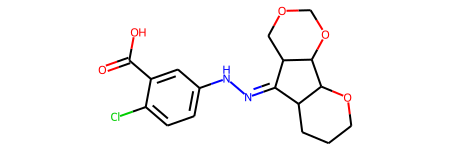

成功生成的高活性分子： O=C(O)c1cc(NN=C2C3CCCOC3C3OCOCC23)ccc1Cl 
Activity（越大药效越好）: 3.1028 
QED（越大类药性越高）: 0.7992 
SA（越小可合成性越高）: 4.1533 
logP（越大疏水性越好）: 2.6040 
------------------------------------------------------------------------------------------------------------


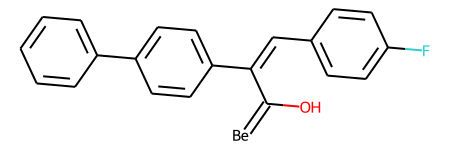

成功生成的高活性分子： [Be]=C(O)/C(=C\c1ccc(F)cc1)c1ccc(-c2ccccc2)cc1 
Activity（越大药效越好）: 17.4550 
QED（越大类药性越高）: 0.5466 
SA（越小可合成性越高）: 2.2650 
logP（越大疏水性越好）: 4.7042 
------------------------------------------------------------------------------------------------------------


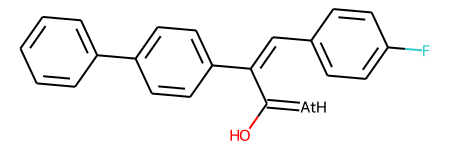

成功生成的高活性分子： OC(=[AtH])/C(=C\c1ccc(F)cc1)c1ccc(-c2ccccc2)cc1 
Activity（越大药效越好）: 17.4885 
QED（越大类药性越高）: 0.4968 
SA（越小可合成性越高）: 2.2650 
logP（越大疏水性越好）: 4.8173 
------------------------------------------------------------------------------------------------------------


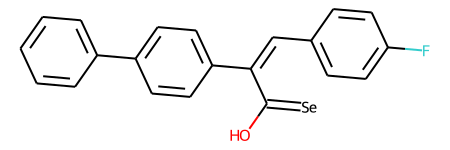

成功生成的高活性分子： OC(=[Se])/C(=C\c1ccc(F)cc1)c1ccc(-c2ccccc2)cc1 
Activity（越大药效越好）: 19.0149 
QED（越大类药性越高）: 0.5130 
SA（越小可合成性越高）: 2.1741 
logP（越大疏水性越好）: 4.7042 
------------------------------------------------------------------------------------------------------------


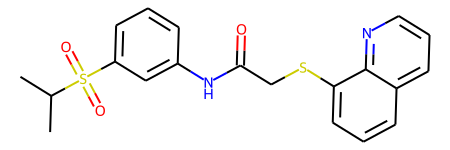

成功生成的高活性分子： CC(C)S(=O)(=O)c1cccc(NC(=O)CSc2cccc3cccnc23)c1 
Activity（越大药效越好）: 15.2677 
QED（越大类药性越高）: 0.6293 
SA（越小可合成性越高）: 2.2011 
logP（越大疏水性越好）: 4.1477 
------------------------------------------------------------------------------------------------------------


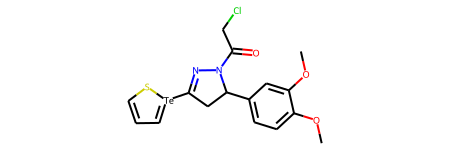

成功生成的高活性分子： COc1ccc(C2CC([Te]3=CC=CS3)=NN2C(=O)CCl)cc1OC 
Activity（越大药效越好）: 62.9562 
QED（越大类药性越高）: 0.4807 
SA（越小可合成性越高）: 4.1447 
logP（越大疏水性越好）: 2.7471 
------------------------------------------------------------------------------------------------------------


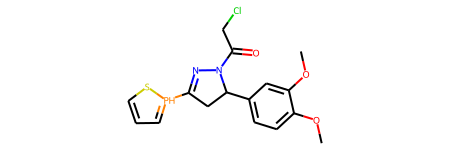

成功生成的高活性分子： COc1ccc(C2CC([PH]3=CC=CS3)=NN2C(=O)CCl)cc1OC 
Activity（越大药效越好）: 50.6323 
QED（越大类药性越高）: 0.5732 
SA（越小可合成性越高）: 4.3707 
logP（越大疏水性越好）: 3.7214 
------------------------------------------------------------------------------------------------------------


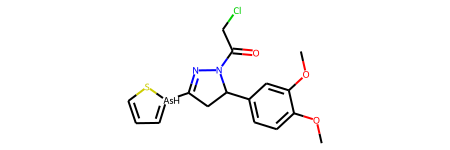

成功生成的高活性分子： COc1ccc(C2CC([AsH]3=CC=CS3)=NN2C(=O)CCl)cc1OC 
Activity（越大药效越好）: 55.2244 
QED（越大类药性越高）: 0.5340 
SA（越小可合成性越高）: 4.3885 
logP（越大疏水性越好）: 2.4794 
------------------------------------------------------------------------------------------------------------


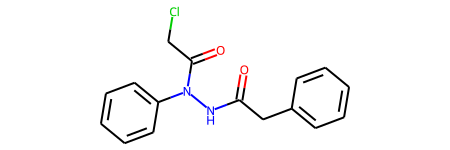

成功生成的高活性分子： O=C(Cc1ccccc1)NN(C(=O)CCl)c1ccccc1 
Activity（越大药效越好）: 20.1559 
QED（越大类药性越高）: 0.6968 
SA（越小可合成性越高）: 2.1025 
logP（越大疏水性越好）: 2.5323 
------------------------------------------------------------------------------------------------------------


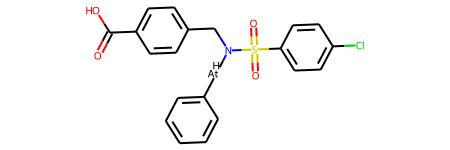

成功生成的高活性分子： O=C(O)c1ccc(CN([AtH]c2ccccc2)S(=O)(=O)c2ccc(Cl)cc2)cc1 
Activity（越大药效越好）: 19.2757 
QED（越大类药性越高）: 0.4447 
SA（越小可合成性越高）: 2.7739 
logP（越大疏水性越好）: 3.2869 
------------------------------------------------------------------------------------------------------------


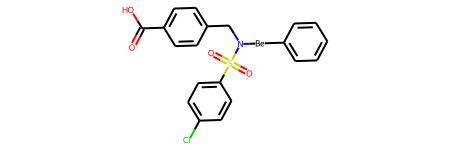

成功生成的高活性分子： O=C(O)c1ccc(CN([Be]c2ccccc2)S(=O)(=O)c2ccc(Cl)cc2)cc1 
Activity（越大药效越好）: 16.0947 
QED（越大类药性越高）: 0.6069 
SA（越小可合成性越高）: 2.7739 
logP（越大疏水性越好）: 3.1738 
------------------------------------------------------------------------------------------------------------


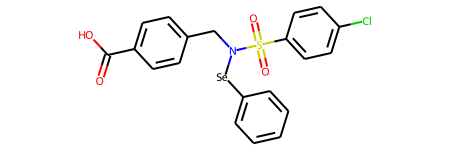

成功生成的高活性分子： O=C(O)c1ccc(CN([Se]c2ccccc2)S(=O)(=O)c2ccc(Cl)cc2)cc1 
Activity（越大药效越好）: 13.2907 
QED（越大类药性越高）: 0.5272 
SA（越小可合成性越高）: 2.5521 
logP（越大疏水性越好）: 3.1738 
------------------------------------------------------------------------------------------------------------


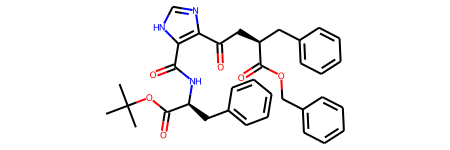

成功生成的高活性分子： CC(C)(C)OC(=O)[C@H](Cc1ccccc1)NC(=O)c1[nH]cnc1C(=O)C[C@@H](Cc1ccccc1)C(=O)OCc1ccccc1 
Activity（越大药效越好）: 15.7242 
QED（越大类药性越高）: 0.1593 
SA（越小可合成性越高）: 3.4149 
logP（越大疏水性越好）: 5.2676 
------------------------------------------------------------------------------------------------------------


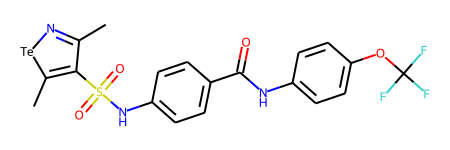

成功生成的高活性分子： Cc1n[te]c(C)c1S(=O)(=O)Nc1ccc(C(=O)Nc2ccc(OC(F)(F)F)cc2)cc1 
Activity（越大药效越好）: 24.6707 
QED（越大类药性越高）: 0.4435 
SA（越小可合成性越高）: 2.8210 
logP（越大疏水性越好）: 3.7071 
------------------------------------------------------------------------------------------------------------


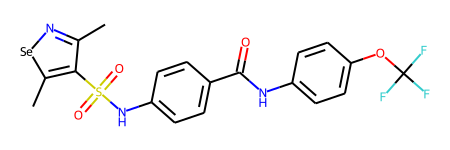

成功生成的高活性分子： Cc1n[se]c(C)c1S(=O)(=O)Nc1ccc(C(=O)Nc2ccc(OC(F)(F)F)cc2)cc1 
Activity（越大药效越好）: 25.3463 
QED（越大类药性越高）: 0.4855 
SA（越小可合成性越高）: 2.7216 
logP（越大疏水性越好）: 3.7071 
------------------------------------------------------------------------------------------------------------


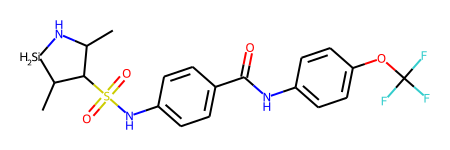

成功生成的高活性分子： CC1N[SiH2]C(C)C1S(=O)(=O)Nc1ccc(C(=O)Nc2ccc(OC(F)(F)F)cc2)cc1 
Activity（越大药效越好）: 4.8260 
QED（越大类药性越高）: 0.5610 
SA（越小可合成性越高）: 3.8652 
logP（越大疏水性越好）: 2.8317 
------------------------------------------------------------------------------------------------------------


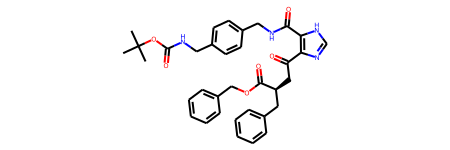

成功生成的高活性分子： CC(C)(C)OC(=O)NCc1ccc(CNC(=O)c2[nH]cnc2C(=O)C[C@@H](Cc2ccccc2)C(=O)OCc2ccccc2)cc1 
Activity（越大药效越好）: 10.7055 
QED（越大类药性越高）: 0.1334 
SA（越小可合成性越高）: 3.1778 
logP（越大疏水性越好）: 5.5395 
------------------------------------------------------------------------------------------------------------


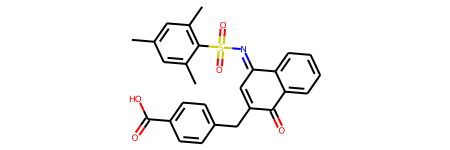

成功生成的高活性分子： Cc1cc(C)c(S(=O)(=O)/N=C2\C=C(Cc3ccc(C(=O)O)cc3)C(=O)c3ccccc32)c(C)c1 
Activity（越大药效越好）: 7.4496 
QED（越大类药性越高）: 0.5707 
SA（越小可合成性越高）: 2.6440 
logP（越大疏水性越好）: 4.8535 
------------------------------------------------------------------------------------------------------------


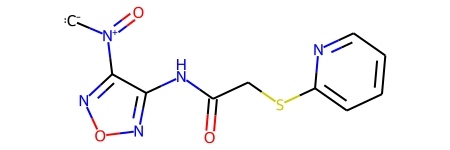

成功生成的高活性分子： [C-][N+](=O)c1nonc1NC(=O)CSc1ccccn1 
Activity（越大药效越好）: 43.0305 
QED（越大类药性越高）: 0.4966 
SA（越小可合成性越高）: 3.1164 
logP（越大疏水性越好）: 1.1514 
------------------------------------------------------------------------------------------------------------


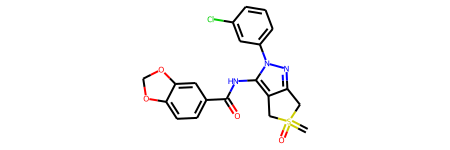

成功生成的高活性分子： C=S1(=O)Cc2nn(-c3cccc(Cl)c3)c(NC(=O)c3ccc4c(c3)OCO4)c2C1 
Activity（越大药效越好）: 0.1804 
QED（越大类药性越高）: 0.6462 
SA（越小可合成性越高）: 3.3114 
logP（越大疏水性越好）: 3.2367 
------------------------------------------------------------------------------------------------------------


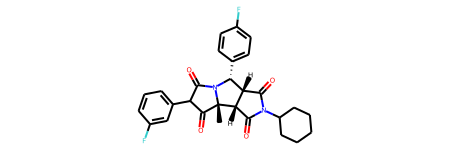

成功生成的高活性分子： C[C@@]12C(=O)C(c3cccc(F)c3)C(=O)N1[C@H](c1ccc(F)cc1)[C@@H]1C(=O)N(C3CCCCC3)C(=O)[C@@H]12 
Activity（越大药效越好）: 19.4396 
QED（越大类药性越高）: 0.4812 
SA（越小可合成性越高）: 4.0878 
logP（越大疏水性越好）: 3.9072 
------------------------------------------------------------------------------------------------------------


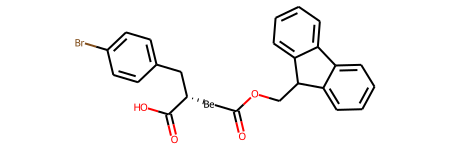

成功生成的高活性分子： O=C([Be][C@@H](Cc1ccc(Br)cc1)C(=O)O)OCC1c2ccccc2-c2ccccc21 
Activity（越大药效越好）: 26.0500 
QED（越大类药性越高）: 0.4721 
SA（越小可合成性越高）: 3.3307 
logP（越大疏水性越好）: 5.5180 
------------------------------------------------------------------------------------------------------------


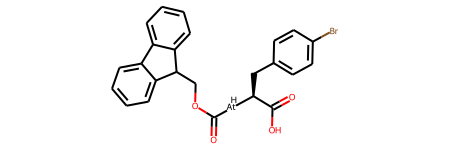

成功生成的高活性分子： O=C(OCC1c2ccccc2-c2ccccc21)[AtH][C@@H](Cc1ccc(Br)cc1)C(=O)O 
Activity（越大药效越好）: 13.8947 
QED（越大类药性越高）: 0.3567 
SA（越小可合成性越高）: 3.3307 
logP（越大疏水性越好）: 5.6311 
------------------------------------------------------------------------------------------------------------


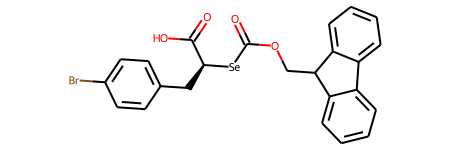

成功生成的高活性分子： O=C(OCC1c2ccccc2-c2ccccc21)[Se][C@@H](Cc1ccc(Br)cc1)C(=O)O 
Activity（越大药效越好）: 21.6403 
QED（越大类药性越高）: 0.4092 
SA（越小可合成性越高）: 3.2355 
logP（越大疏水性越好）: 5.5180 
------------------------------------------------------------------------------------------------------------


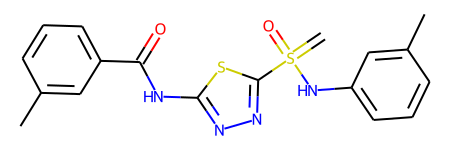

成功生成的高活性分子： C=S(=O)(Nc1cccc(C)c1)c1nnc(NC(=O)c2cccc(C)c2)s1 
Activity（越大药效越好）: 9.2157 
QED（越大类药性越高）: 0.5191 
SA（越小可合成性越高）: 2.9146 
logP（越大疏水性越好）: 3.5096 
------------------------------------------------------------------------------------------------------------


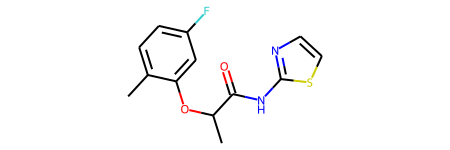

成功生成的高活性分子： Cc1ccc(F)cc1OC(C)C(=O)Nc1nccs1 
Activity（越大药效越好）: 24.0367 
QED（越大类药性越高）: 0.9363 
SA（越小可合成性越高）: 2.5038 
logP（越大疏水性越好）: 2.9966 
------------------------------------------------------------------------------------------------------------


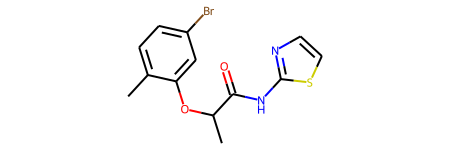

成功生成的高活性分子： Cc1ccc(Br)cc1OC(C)C(=O)Nc1nccs1 
Activity（越大药效越好）: 30.5860 
QED（越大类药性越高）: 0.9241 
SA（越小可合成性越高）: 2.5552 
logP（越大疏水性越好）: 3.6200 
------------------------------------------------------------------------------------------------------------


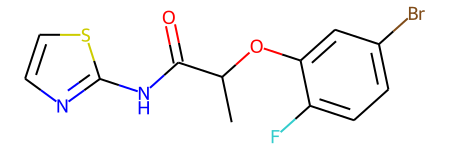

成功生成的高活性分子： CC(Oc1cc(Br)ccc1F)C(=O)Nc1nccs1 
Activity（越大药效越好）: 35.0429 
QED（越大类药性越高）: 0.9235 
SA（越小可合成性越高）: 2.5980 
logP（越大疏水性越好）: 3.4507 
------------------------------------------------------------------------------------------------------------


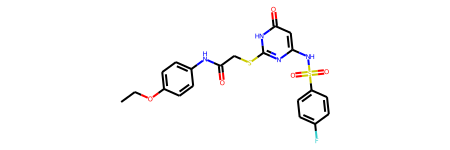

成功生成的高活性分子： CCOc1ccc(NC(=O)CSc2nc(NS(=O)(=O)c3ccc(F)cc3)cc(=O)[nH]2)cc1 
Activity（越大药效越好）: 13.5157 
QED（越大类药性越高）: 0.3184 
SA（越小可合成性越高）: 2.3553 
logP（越大疏水性越好）: 2.8393 
------------------------------------------------------------------------------------------------------------


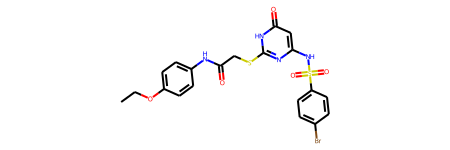

成功生成的高活性分子： CCOc1ccc(NC(=O)CSc2nc(NS(=O)(=O)c3ccc(Br)cc3)cc(=O)[nH]2)cc1 
Activity（越大药效越好）: 18.4421 
QED（越大类药性越高）: 0.2805 
SA（越小可合成性越高）: 2.3926 
logP（越大疏水性越好）: 3.4627 
------------------------------------------------------------------------------------------------------------


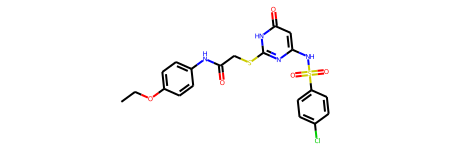

成功生成的高活性分子： CCOc1ccc(NC(=O)CSc2nc(NS(=O)(=O)c3ccc(Cl)cc3)cc(=O)[nH]2)cc1 
Activity（越大药效越好）: 19.8570 
QED（越大类药性越高）: 0.3069 
SA（越小可合成性越高）: 2.3513 
logP（越大疏水性越好）: 3.3536 
------------------------------------------------------------------------------------------------------------


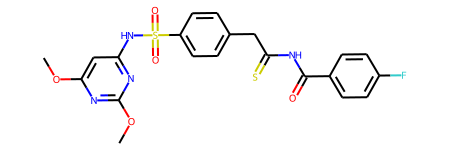

成功生成的高活性分子： COc1cc(NS(=O)(=O)c2ccc(CC(=S)NC(=O)c3ccc(F)cc3)cc2)nc(OC)n1 
Activity（越大药效越好）: 5.5957 
QED（越大类药性越高）: 0.4628 
SA（越小可合成性越高）: 2.5949 
logP（越大疏水性越好）: 2.7336 
------------------------------------------------------------------------------------------------------------


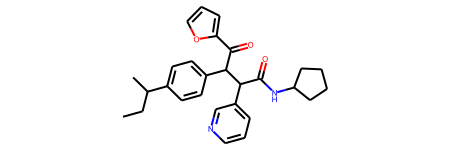

成功生成的高活性分子： CCC(C)c1ccc(C(C(=O)c2ccco2)C(C(=O)NC2CCCC2)c2cccnc2)cc1 
Activity（越大药效越好）: 40.7774 
QED（越大类药性越高）: 0.4111 
SA（越小可合成性越高）: 3.5643 
logP（越大疏水性越好）: 5.9972 
------------------------------------------------------------------------------------------------------------


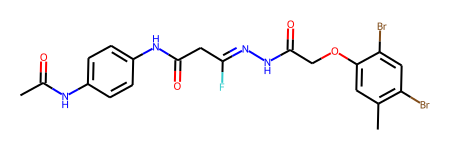

成功生成的高活性分子： CC(=O)Nc1ccc(NC(=O)C/C(F)=N/NC(=O)COc2cc(C)c(Br)cc2Br)cc1 
Activity（越大药效越好）: 17.0652 
QED（越大类药性越高）: 0.3322 
SA（越小可合成性越高）: 2.6763 
logP（越大疏水性越好）: 4.2852 
------------------------------------------------------------------------------------------------------------


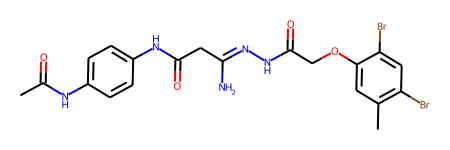

成功生成的高活性分子： CC(=O)Nc1ccc(NC(=O)C/C(N)=N/NC(=O)COc2cc(C)c(Br)cc2Br)cc1 
Activity（越大药效越好）: 15.5108 
QED（越大类药性越高）: 0.2255 
SA（越小可合成性越高）: 2.5027 
logP（越大疏水性越好）: 3.2744 
------------------------------------------------------------------------------------------------------------


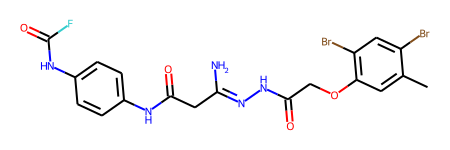

成功生成的高活性分子： Cc1cc(OCC(=O)N/N=C(\N)CC(=O)Nc2ccc(NC(=O)F)cc2)c(Br)cc1Br 
Activity（越大药效越好）: 15.2935 
QED（越大类药性越高）: 0.1284 
SA（越小可合成性越高）: 2.7267 
logP（越大疏水性越好）: 3.8174 
------------------------------------------------------------------------------------------------------------


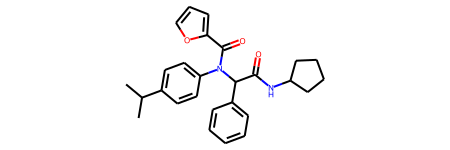

成功生成的高活性分子： CC(C)c1ccc(N(C(=O)c2ccco2)C(C(=O)NC2CCCC2)c2ccccc2)cc1 
Activity（越大药效越好）: 40.8204 
QED（越大类药性越高）: 0.5114 
SA（越小可合成性越高）: 2.6901 
logP（越大疏水性越好）: 5.8499 
------------------------------------------------------------------------------------------------------------


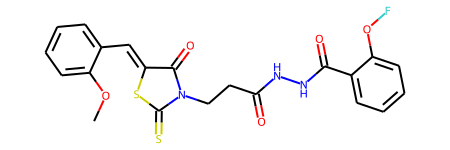

成功生成的高活性分子： COc1ccccc1/C=C1\SC(=S)N(CCC(=O)NNC(=O)c2ccccc2OF)C1=O 
Activity（越大药效越好）: 12.6437 
QED（越大类药性越高）: 0.3610 
SA（越小可合成性越高）: 2.5643 
logP（越大疏水性越好）: 3.0110 
------------------------------------------------------------------------------------------------------------


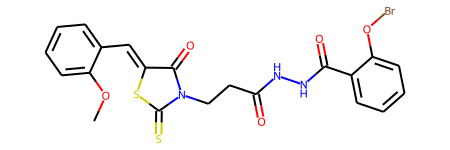

成功生成的高活性分子： COc1ccccc1/C=C1\SC(=S)N(CCC(=O)NNC(=O)c2ccccc2OBr)C1=O 
Activity（越大药效越好）: 18.3329 
QED（越大类药性越高）: 0.3181 
SA（越小可合成性越高）: 2.6170 
logP（越大疏水性越好）: 3.4364 
------------------------------------------------------------------------------------------------------------


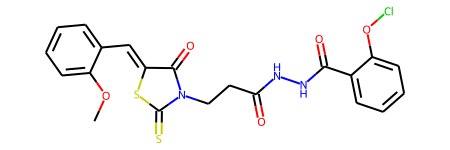

成功生成的高活性分子： COc1ccccc1/C=C1\SC(=S)N(CCC(=O)NNC(=O)c2ccccc2OCl)C1=O 
Activity（越大药效越好）: 13.4631 
QED（越大类药性越高）: 0.3483 
SA（越小可合成性越高）: 2.5336 
logP（越大疏水性越好）: 3.2803 
------------------------------------------------------------------------------------------------------------


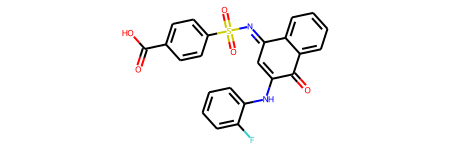

成功生成的高活性分子： O=C(O)c1ccc(S(=O)(=O)/N=C2\C=C(Nc3ccccc3F)C(=O)c3ccccc32)cc1 
Activity（越大药效越好）: 18.2962 
QED（越大类药性越高）: 0.6098 
SA（越小可合成性越高）: 2.4366 
logP（越大疏水性越好）: 3.8942 
------------------------------------------------------------------------------------------------------------


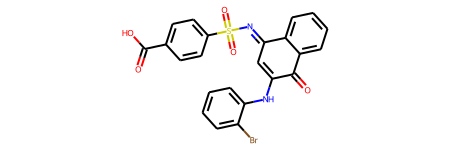

成功生成的高活性分子： O=C(O)c1ccc(S(=O)(=O)/N=C2\C=C(Nc3ccccc3Br)C(=O)c3ccccc32)cc1 
Activity（越大药效越好）: 26.0123 
QED（越大类药性越高）: 0.5212 
SA（越小可合成性越高）: 2.4924 
logP（越大疏水性越好）: 4.5176 
------------------------------------------------------------------------------------------------------------


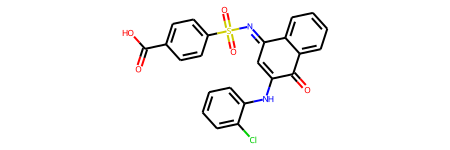

成功生成的高活性分子： O=C(O)c1ccc(S(=O)(=O)/N=C2\C=C(Nc3ccccc3Cl)C(=O)c3ccccc32)cc1 
Activity（越大药效越好）: 22.0155 
QED（越大类药性越高）: 0.5755 
SA（越小可合成性越高）: 2.4328 
logP（越大疏水性越好）: 4.4085 
------------------------------------------------------------------------------------------------------------


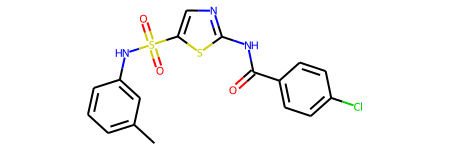

成功生成的高活性分子： Cc1cccc(NS(=O)(=O)c2cnc(NC(=O)c3ccc(Cl)cc3)s2)c1 
Activity（越大药效越好）: 22.3118 
QED（越大类药性越高）: 0.6643 
SA（越小可合成性越高）: 2.0597 
logP（越大疏水性越好）: 4.1580 
------------------------------------------------------------------------------------------------------------


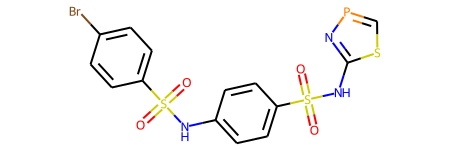

成功生成的高活性分子： O=S(=O)(Nc1ccc(S(=O)(=O)Nc2npcs2)cc1)c1ccc(Br)cc1 
Activity（越大药效越好）: 42.1325 
QED（越大类药性越高）: 0.5396 
SA（越小可合成性越高）: 2.8466 
logP（越大疏水性越好）: 4.0873 
------------------------------------------------------------------------------------------------------------


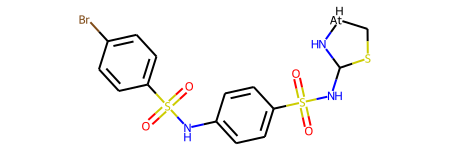

成功生成的高活性分子： O=S(=O)(Nc1ccc(S(=O)(=O)NC2N[AtH]CS2)cc1)c1ccc(Br)cc1 
Activity（越大药效越好）: 28.3319 
QED（越大类药性越高）: 0.4324 
SA（越小可合成性越高）: 3.5350 
logP（越大疏水性越好）: 1.8380 
------------------------------------------------------------------------------------------------------------


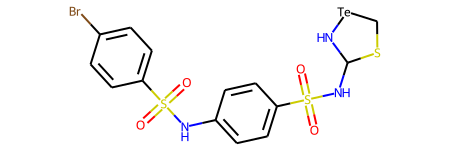

成功生成的高活性分子： O=S(=O)(Nc1ccc(S(=O)(=O)NC2N[Te]CS2)cc1)c1ccc(Br)cc1 
Activity（越大药效越好）: 10.8159 
QED（越大类药性越高）: 0.4423 
SA（越小可合成性越高）: 3.4961 
logP（越大疏水性越好）: 1.7249 
------------------------------------------------------------------------------------------------------------


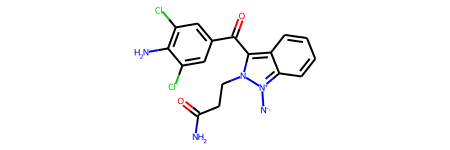

成功生成的高活性分子： [N-][n+]1c2ccccc2c(C(=O)c2cc(Cl)c(N)c(Cl)c2)n1CCC(N)=O 
Activity（越大药效越好）: 29.4587 
QED（越大类药性越高）: 0.3953 
SA（越小可合成性越高）: 3.2349 
logP（越大疏水性越好）: 2.5253 
------------------------------------------------------------------------------------------------------------


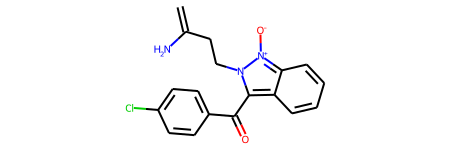

成功生成的高活性分子： C=C(N)CCn1c(C(=O)c2ccc(Cl)cc2)c2ccccc2[n+]1[O-] 
Activity（越大药效越好）: 43.8156 
QED（越大类药性越高）: 0.4401 
SA（越小可合成性越高）: 3.0504 
logP（越大疏水性越好）: 3.0216 
------------------------------------------------------------------------------------------------------------


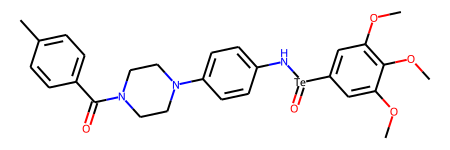

成功生成的高活性分子： COc1cc([Te](=O)Nc2ccc(N3CCN(C(=O)c4ccc(C)cc4)CC3)cc2)cc(OC)c1OC 
Activity（越大药效越好）: 23.7710 
QED（越大类药性越高）: 0.3957 
SA（越小可合成性越高）: 2.8890 
logP（越大疏水性越好）: 3.2210 
------------------------------------------------------------------------------------------------------------


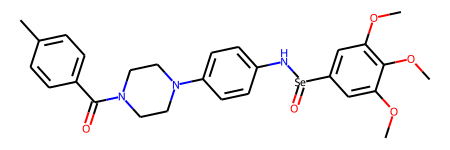

成功生成的高活性分子： COc1cc([Se](=O)Nc2ccc(N3CCN(C(=O)c4ccc(C)cc4)CC3)cc2)cc(OC)c1OC 
Activity（越大药效越好）: 14.4112 
QED（越大类药性越高）: 0.4272 
SA（越小可合成性越高）: 3.2233 
logP（越大疏水性越好）: 3.2210 
------------------------------------------------------------------------------------------------------------


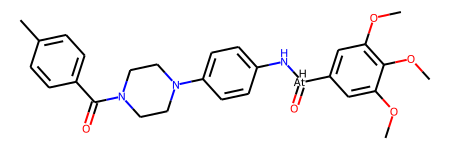

成功生成的高活性分子： COc1cc([AtH](=O)Nc2ccc(N3CCN(C(=O)c4ccc(C)cc4)CC3)cc2)cc(OC)c1OC 
Activity（越大药效越好）: 38.4299 
QED（越大类药性越高）: 0.3894 
SA（越小可合成性越高）: 3.3058 
logP（越大疏水性越好）: 3.3341 
------------------------------------------------------------------------------------------------------------


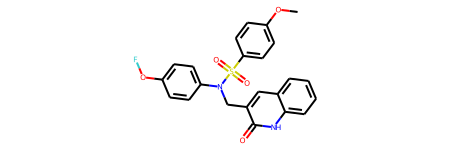

成功生成的高活性分子： COc1ccc(S(=O)(=O)N(Cc2cc3ccccc3[nH]c2=O)c2ccc(OF)cc2)cc1 
Activity（越大药效越好）: 18.9489 
QED（越大类药性越高）: 0.4523 
SA（越小可合成性越高）: 2.4218 
logP（越大疏水性越好）: 4.1955 
------------------------------------------------------------------------------------------------------------


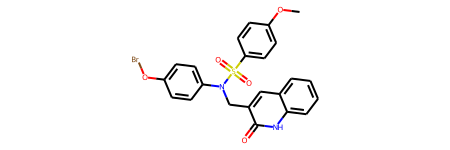

成功生成的高活性分子： COc1ccc(S(=O)(=O)N(Cc2cc3ccccc3[nH]c2=O)c2ccc(OBr)cc2)cc1 
Activity（越大药效越好）: 19.3595 
QED（越大类药性越高）: 0.3882 
SA（越小可合成性越高）: 2.4739 
logP（越大疏水性越好）: 4.6209 
------------------------------------------------------------------------------------------------------------


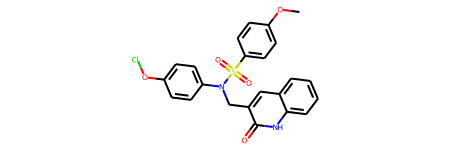

成功生成的高活性分子： COc1ccc(S(=O)(=O)N(Cc2cc3ccccc3[nH]c2=O)c2ccc(OCl)cc2)cc1 
Activity（越大药效越好）: 12.6601 
QED（越大类药性越高）: 0.4304 
SA（越小可合成性越高）: 2.4184 
logP（越大疏水性越好）: 4.4648 
------------------------------------------------------------------------------------------------------------


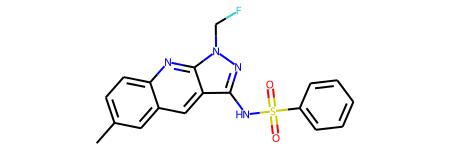

成功生成的高活性分子： Cc1ccc2nc3c(cc2c1)c(NS(=O)(=O)c1ccccc1)nn3CF 
Activity（越大药效越好）: 12.9303 
QED（越大类药性越高）: 0.5952 
SA（越小可合成性越高）: 2.4980 
logP（越大疏水性越好）: 3.6207 
------------------------------------------------------------------------------------------------------------


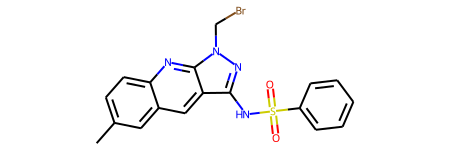

成功生成的高活性分子： Cc1ccc2nc3c(cc2c1)c(NS(=O)(=O)c1ccccc1)nn3CBr 
Activity（越大药效越好）: 18.3614 
QED（越大类药性越高）: 0.4950 
SA（越小可合成性越高）: 2.4981 
logP（越大疏水性越好）: 4.0461 
------------------------------------------------------------------------------------------------------------


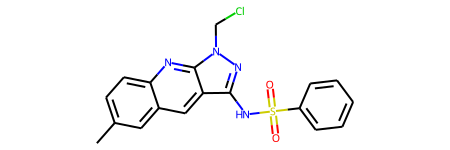

成功生成的高活性分子： Cc1ccc2nc3c(cc2c1)c(NS(=O)(=O)c1ccccc1)nn3CCl 
Activity（越大药效越好）: 18.3364 
QED（越大类药性越高）: 0.5396 
SA（越小可合成性越高）: 2.4680 
logP（越大疏水性越好）: 3.8900 
------------------------------------------------------------------------------------------------------------


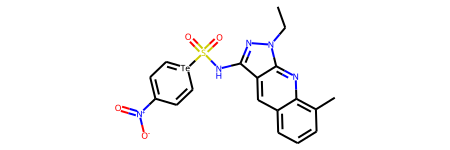

成功生成的高活性分子： CCn1nc(NS(=O)(=O)[Te]2=CC=C([N+](=O)[O-])C=C2)c2cc3cccc(C)c3nc21 
Activity（越大药效越好）: 7.3779 
QED（越大类药性越高）: 0.3093 
SA（越小可合成性越高）: 3.8244 
logP（越大疏水性越好）: 2.2995 
------------------------------------------------------------------------------------------------------------


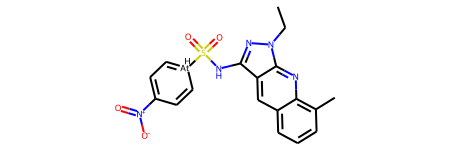

成功生成的高活性分子： CCn1nc(NS(=O)(=O)[AtH]2=CC=C([N+](=O)[O-])C=C2)c2cc3cccc(C)c3nc21 
Activity（越大药效越好）: 10.7442 
QED（越大类药性越高）: 0.3503 
SA（越小可合成性越高）: 4.2412 
logP（越大疏水性越好）: 2.4126 
------------------------------------------------------------------------------------------------------------


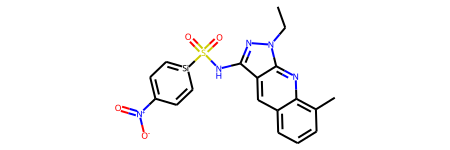

成功生成的高活性分子： CCn1nc(NS(=O)(=O)[si]2ccc([N+](=O)[O-])cc2)c2cc3cccc(C)c3nc21 
Activity（越大药效越好）: 11.5180 
QED（越大类药性越高）: 0.2969 
SA（越小可合成性越高）: 3.5193 
logP（越大疏水性越好）: 3.0517 
------------------------------------------------------------------------------------------------------------


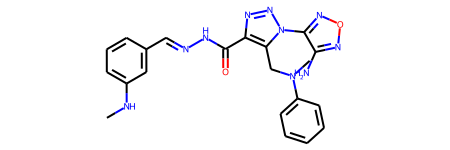

成功生成的高活性分子： CNc1cccc(/C=N/NC(=O)c2nnn(-c3nonc3N)c2CN(C)c2ccccc2)c1 
Activity（越大药效越好）: -0.4183 
QED（越大类药性越高）: 0.2709 
SA（越小可合成性越高）: 2.8346 
logP（越大疏水性越好）: 1.6745 
------------------------------------------------------------------------------------------------------------


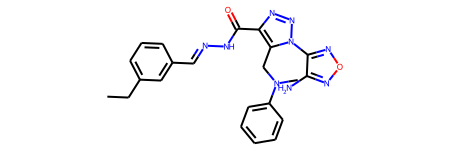

成功生成的高活性分子： CCc1cccc(/C=N/NC(=O)c2nnn(-c3nonc3N)c2CN(C)c2ccccc2)c1 
Activity（越大药效越好）: 0.8399 
QED（越大类药性越高）: 0.3106 
SA（越小可合成性越高）: 2.7626 
logP（越大疏水性越好）: 2.1952 
------------------------------------------------------------------------------------------------------------


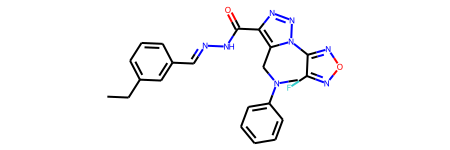

成功生成的高活性分子： CCc1cccc(/C=N/NC(=O)c2nnn(-c3nonc3F)c2CN(C)c2ccccc2)c1 
Activity（越大药效越好）: 15.6381 
QED（越大类药性越高）: 0.3256 
SA（越小可合成性越高）: 2.9199 
logP（越大疏水性越好）: 2.7521 
------------------------------------------------------------------------------------------------------------


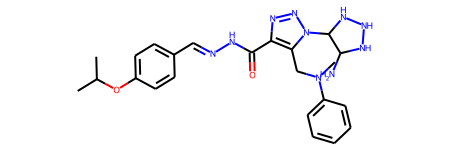

成功生成的高活性分子： CC(C)Oc1ccc(/C=N/NC(=O)c2nnn(C3NNNC3N)c2CN(C)c2ccccc2)cc1 
Activity（越大药效越好）: 51.9981 
QED（越大类药性越高）: 0.2231 
SA（越小可合成性越高）: 3.9461 
logP（越大疏水性越好）: 0.8614 
------------------------------------------------------------------------------------------------------------


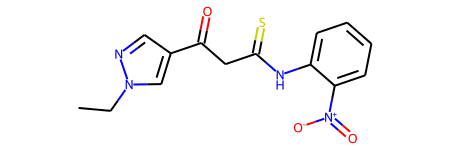

成功生成的高活性分子： CCn1cc(C(=O)CC(=S)Nc2ccccc2[N+](=O)[O-])cn1 
Activity（越大药效越好）: 11.3297 
QED（越大类药性越高）: 0.3811 
SA（越小可合成性越高）: 2.5804 
logP（越大疏水性越好）: 2.8235 
------------------------------------------------------------------------------------------------------------


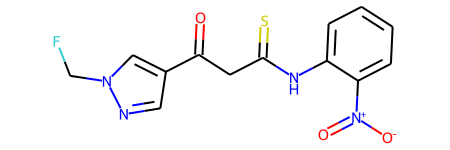

成功生成的高活性分子： O=C(CC(=S)Nc1ccccc1[N+](=O)[O-])c1cnn(CF)c1 
Activity（越大药效越好）: 12.3663 
QED（越大类药性越高）: 0.3805 
SA（越小可合成性越高）: 2.8934 
logP（越大疏水性越好）: 2.7306 
------------------------------------------------------------------------------------------------------------


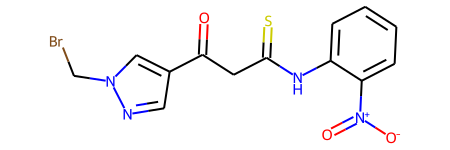

成功生成的高活性分子： O=C(CC(=S)Nc1ccccc1[N+](=O)[O-])c1cnn(CBr)c1 
Activity（越大药效越好）: 17.1759 
QED（越大类药性越高）: 0.2710 
SA（越小可合成性越高）: 2.8538 
logP（越大疏水性越好）: 3.1560 
------------------------------------------------------------------------------------------------------------


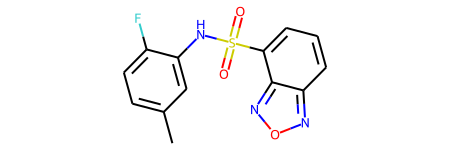

成功生成的高活性分子： Cc1ccc(F)c(NS(=O)(=O)c2cccc3nonc23)c1 
Activity（越大药效越好）: 30.8860 
QED（越大类药性越高）: 0.8031 
SA（越小可合成性越高）: 2.2207 
logP（越大疏水性越好）: 2.4711 
------------------------------------------------------------------------------------------------------------


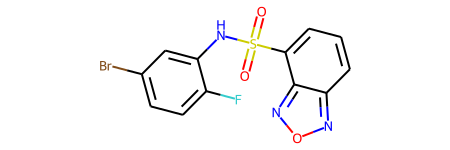

成功生成的高活性分子： O=S(=O)(Nc1cc(Br)ccc1F)c1cccc2nonc12 
Activity（越大药效越好）: 38.7938 
QED（越大类药性越高）: 0.7643 
SA（越小可合成性越高）: 2.3030 
logP（越大疏水性越好）: 2.9252 
------------------------------------------------------------------------------------------------------------


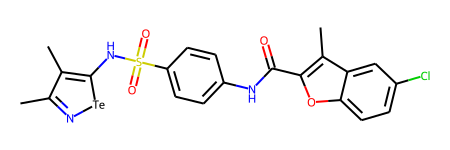

成功生成的高活性分子： Cc1n[te]c(NS(=O)(=O)c2ccc(NC(=O)c3oc4ccc(Cl)cc4c3C)cc2)c1C 
Activity（越大药效越好）: 6.5677 
QED（越大类药性越高）: 0.3435 
SA（越小可合成性越高）: 3.0042 
logP（越大疏水性越好）: 4.5166 
------------------------------------------------------------------------------------------------------------


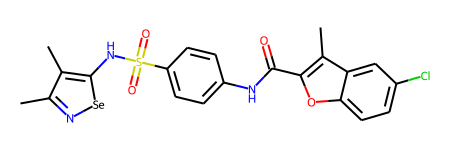

成功生成的高活性分子： Cc1n[se]c(NS(=O)(=O)c2ccc(NC(=O)c3oc4ccc(Cl)cc4c3C)cc2)c1C 
Activity（越大药效越好）: 14.7808 
QED（越大类药性越高）: 0.3754 
SA（越小可合成性越高）: 2.9297 
logP（越大疏水性越好）: 4.5166 
------------------------------------------------------------------------------------------------------------


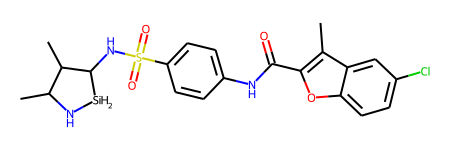

成功生成的高活性分子： Cc1c(C(=O)Nc2ccc(S(=O)(=O)NC3[SiH2]NC(C)C3C)cc2)oc2ccc(Cl)cc12 
Activity（越大药效越好）: -2.4213 
QED（越大类药性越高）: 0.4904 
SA（越小可合成性越高）: 3.9496 
logP（越大疏水性越好）: 2.9629 
------------------------------------------------------------------------------------------------------------


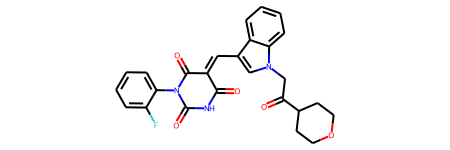

成功生成的高活性分子： O=C1NC(=O)N(c2ccccc2F)C(=O)/C1=C/c1cn(CC(=O)C2CCOCC2)c2ccccc12 
Activity（越大药效越好）: 11.7618 
QED（越大类药性越高）: 0.4504 
SA（越小可合成性越高）: 2.7102 
logP（越大疏水性越好）: 3.4425 
------------------------------------------------------------------------------------------------------------


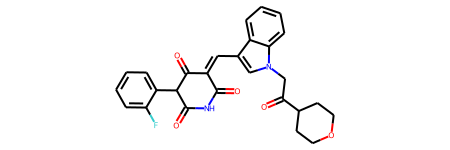

成功生成的高活性分子： O=C1NC(=O)C(c2ccccc2F)C(=O)/C1=C/c1cn(CC(=O)C2CCOCC2)c2ccccc12 
Activity（越大药效越好）: -3.6241 
QED（越大类药性越高）: 0.2654 
SA（越小可合成性越高）: 3.3425 
logP（越大疏水性越好）: 3.1688 
------------------------------------------------------------------------------------------------------------


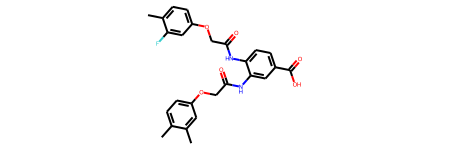

成功生成的高活性分子： Cc1ccc(OCC(=O)Nc2cc(C(=O)O)ccc2NC(=O)COc2ccc(C)c(F)c2)cc1C 
Activity（越大药效越好）: 11.4859 
QED（越大类药性越高）: 0.4161 
SA（越小可合成性越高）: 2.1632 
logP（越大疏水性越好）: 4.4842 
------------------------------------------------------------------------------------------------------------


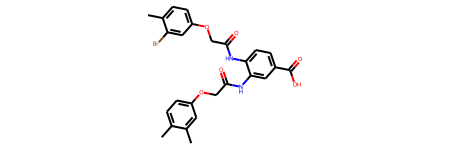

成功生成的高活性分子： Cc1ccc(OCC(=O)Nc2cc(C(=O)O)ccc2NC(=O)COc2ccc(C)c(Br)c2)cc1C 
Activity（越大药效越好）: 12.1992 
QED（越大类药性越高）: 0.3472 
SA（越小可合成性越高）: 2.2187 
logP（越大疏水性越好）: 5.1076 
------------------------------------------------------------------------------------------------------------


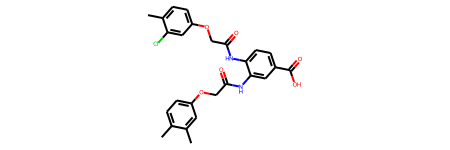

成功生成的高活性分子： Cc1ccc(OCC(=O)Nc2cc(C(=O)O)ccc2NC(=O)COc2ccc(C)c(Cl)c2)cc1C 
Activity（越大药效越好）: 11.6882 
QED（越大类药性越高）: 0.3839 
SA（越小可合成性越高）: 2.1604 
logP（越大疏水性越好）: 4.9985 
------------------------------------------------------------------------------------------------------------


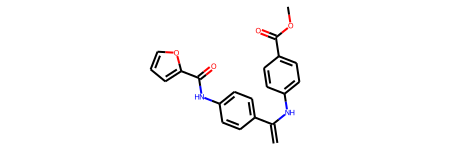

成功生成的高活性分子： C=C(Nc1ccc(C(=O)OC)cc1)c1ccc(NC(=O)c2ccco2)cc1 
Activity（越大药效越好）: 17.6796 
QED（越大类药性越高）: 0.6354 
SA（越小可合成性越高）: 2.0500 
logP（越大疏水性越好）: 4.4013 
------------------------------------------------------------------------------------------------------------


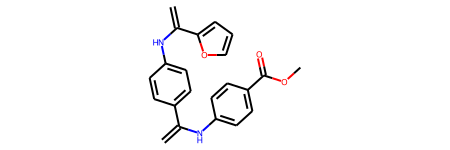

成功生成的高活性分子： C=C(Nc1ccc(C(=O)OC)cc1)c1ccc(NC(=C)c2ccco2)cc1 
Activity（越大药效越好）: 16.3791 
QED（越大类药性越高）: 0.5648 
SA（越小可合成性越高）: 2.3681 
logP（越大疏水性越好）: 5.2318 
------------------------------------------------------------------------------------------------------------


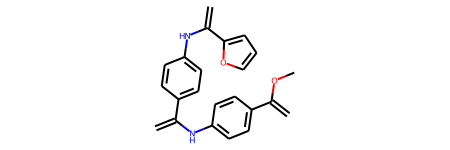

成功生成的高活性分子： C=C(Nc1ccc(C(=C)OC)cc1)c1ccc(NC(=C)c2ccco2)cc1 
Activity（越大药效越好）: 10.7246 
QED（越大类药性越高）: 0.4803 
SA（越小可合成性越高）: 2.6587 
logP（越大疏水性越好）: 6.0623 
------------------------------------------------------------------------------------------------------------


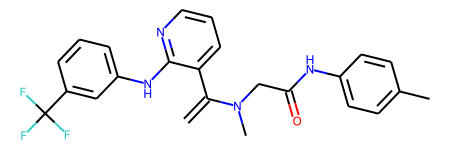

成功生成的高活性分子： C=C(c1cccnc1Nc1cccc(C(F)(F)F)c1)N(C)CC(=O)Nc1ccc(C)cc1 
Activity（越大药效越好）: 16.4272 
QED（越大类药性越高）: 0.4954 
SA（越小可合成性越高）: 2.4250 
logP（越大疏水性越好）: 5.6936 
------------------------------------------------------------------------------------------------------------


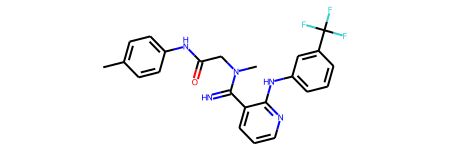

成功生成的高活性分子： Cc1ccc(NC(=O)CN(C)C(=N)c2cccnc2Nc2cccc(C(F)(F)F)c2)cc1 
Activity（越大药效越好）: 20.0259 
QED（越大类药性越高）: 0.3695 
SA（越小可合成性越高）: 2.4578 
logP（越大疏水性越好）: 5.0483 
------------------------------------------------------------------------------------------------------------


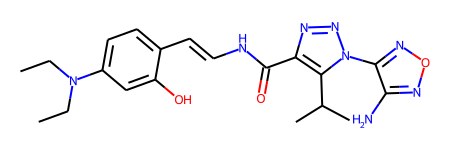

成功生成的高活性分子： CCN(CC)c1ccc(/C=C/NC(=O)c2nnn(-c3nonc3N)c2C(C)C)c(O)c1 
Activity（越大药效越好）: 11.9324 
QED（越大类药性越高）: 0.4931 
SA（越小可合成性越高）: 3.2448 
logP（越大疏水性越好）: 2.3084 
------------------------------------------------------------------------------------------------------------


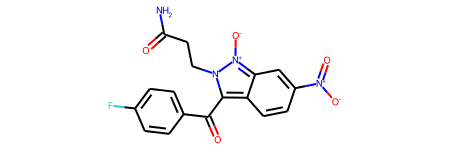

成功生成的高活性分子： NC(=O)CCn1c(C(=O)c2ccc(F)cc2)c2ccc([N+](=O)[O-])cc2[n+]1[O-] 
Activity（越大药效越好）: 32.3423 
QED（越大类药性越高）: 0.2295 
SA（越小可合成性越高）: 2.9591 
logP（越大疏水性越好）: 1.4284 
------------------------------------------------------------------------------------------------------------


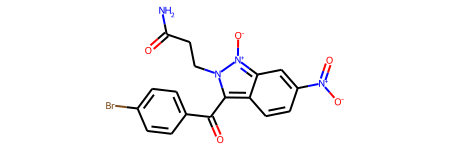

成功生成的高活性分子： NC(=O)CCn1c(C(=O)c2ccc(Br)cc2)c2ccc([N+](=O)[O-])cc2[n+]1[O-] 
Activity（越大药效越好）: 39.4365 
QED（越大类药性越高）: 0.2087 
SA（越小可合成性越高）: 3.0044 
logP（越大疏水性越好）: 2.0518 
------------------------------------------------------------------------------------------------------------


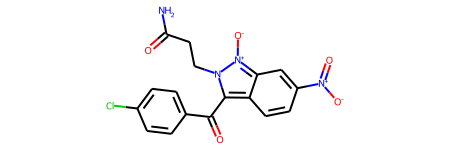

成功生成的高活性分子： NC(=O)CCn1c(C(=O)c2ccc(Cl)cc2)c2ccc([N+](=O)[O-])cc2[n+]1[O-] 
Activity（越大药效越好）: 37.8244 
QED（越大类药性越高）: 0.2261 
SA（越小可合成性越高）: 2.9542 
logP（越大疏水性越好）: 1.9427 
------------------------------------------------------------------------------------------------------------


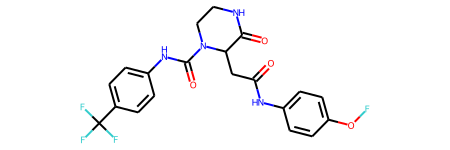

成功生成的高活性分子： O=C(CC1C(=O)NCCN1C(=O)Nc1ccc(C(F)(F)F)cc1)Nc1ccc(OF)cc1 
Activity（越大药效越好）: 29.6418 
QED（越大类药性越高）: 0.6038 
SA（越小可合成性越高）: 2.9816 
logP（越大疏水性越好）: 3.3298 
------------------------------------------------------------------------------------------------------------


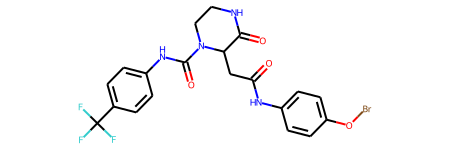

成功生成的高活性分子： O=C(CC1C(=O)NCCN1C(=O)Nc1ccc(C(F)(F)F)cc1)Nc1ccc(OBr)cc1 
Activity（越大药效越好）: 34.1694 
QED（越大类药性越高）: 0.5651 
SA（越小可合成性越高）: 3.0349 
logP（越大疏水性越好）: 3.7552 
------------------------------------------------------------------------------------------------------------


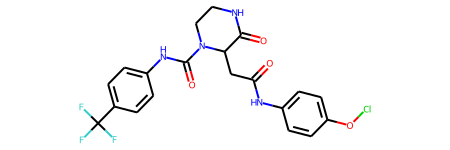

成功生成的高活性分子： O=C(CC1C(=O)NCCN1C(=O)Nc1ccc(C(F)(F)F)cc1)Nc1ccc(OCl)cc1 
Activity（越大药效越好）: 31.8597 
QED（越大类药性越高）: 0.6214 
SA（越小可合成性越高）: 2.9782 
logP（越大疏水性越好）: 3.5991 
------------------------------------------------------------------------------------------------------------


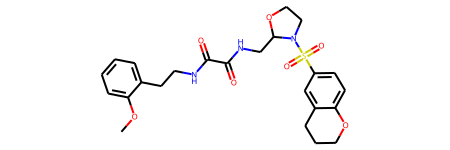

成功生成的高活性分子： COc1ccccc1CCNC(=O)C(=O)NCC1OCCN1S(=O)(=O)c1ccc2c(c1)CCCO2 
Activity（越大药效越好）: 9.7413 
QED（越大类药性越高）: 0.5120 
SA（越小可合成性越高）: 3.0817 
logP（越大疏水性越好）: 0.8423 
------------------------------------------------------------------------------------------------------------


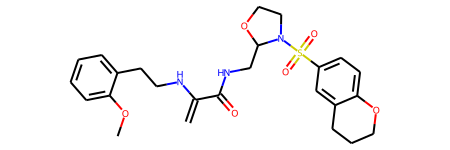

成功生成的高活性分子： C=C(NCCc1ccccc1OC)C(=O)NCC1OCCN1S(=O)(=O)c1ccc2c(c1)CCCO2 
Activity（越大药效越好）: 4.8973 
QED（越大类药性越高）: 0.4786 
SA（越小可合成性越高）: 3.3187 
logP（越大疏水性越好）: 1.8294 
------------------------------------------------------------------------------------------------------------


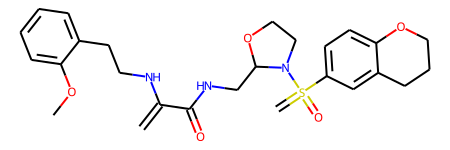

成功生成的高活性分子： C=C(NCCc1ccccc1OC)C(=O)NCC1OCCN1S(=C)(=O)c1ccc2c(c1)CCCO2 
Activity（越大药效越好）: -1.3048 
QED（越大类药性越高）: 0.3847 
SA（越小可合成性越高）: 3.8427 
logP（越大疏水性越好）: 2.1310 
------------------------------------------------------------------------------------------------------------


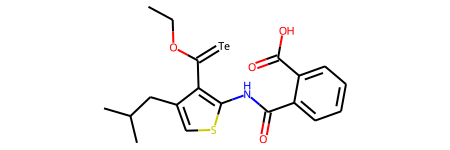

成功生成的高活性分子： CCOC(=[Te])c1c(CC(C)C)csc1NC(=O)c1ccccc1C(=O)O 
Activity（越大药效越好）: 15.2777 
QED（越大类药性越高）: 0.5591 
SA（越小可合成性越高）: 2.7494 
logP（越大疏水性越好）: 3.5801 
------------------------------------------------------------------------------------------------------------


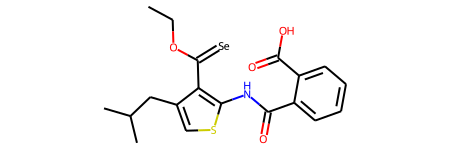

成功生成的高活性分子： CCOC(=[Se])c1c(CC(C)C)csc1NC(=O)c1ccccc1C(=O)O 
Activity（越大药效越好）: 15.2624 
QED（越大类药性越高）: 0.6182 
SA（越小可合成性越高）: 2.7127 
logP（越大疏水性越好）: 3.5801 
------------------------------------------------------------------------------------------------------------


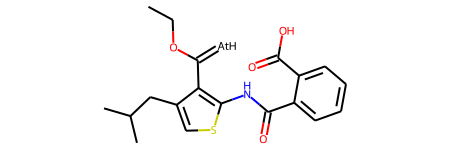

成功生成的高活性分子： CCOC(=[AtH])c1c(CC(C)C)csc1NC(=O)c1ccccc1C(=O)O 
Activity（越大药效越好）: 17.8125 
QED（越大类药性越高）: 0.5081 
SA（越小可合成性越高）: 2.8011 
logP（越大疏水性越好）: 3.6932 
------------------------------------------------------------------------------------------------------------


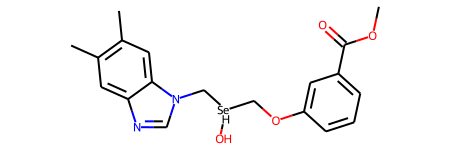

成功生成的高活性分子： COC(=O)c1cccc(OC[SeH](O)Cn2cnc3cc(C)c(C)cc32)c1 
Activity（越大药效越好）: 27.0801 
QED（越大类药性越高）: 0.4886 
SA（越小可合成性越高）: 3.5241 
logP（越大疏水性越好）: 2.3132 
------------------------------------------------------------------------------------------------------------


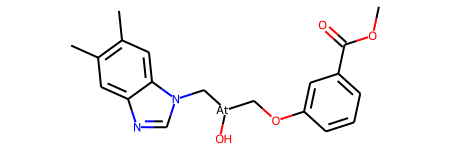

成功生成的高活性分子： COC(=O)c1cccc(OC[At](O)Cn2cnc3cc(C)c(C)cc32)c1 
Activity（越大药效越好）: 15.3953 
QED（越大类药性越高）: 0.4776 
SA（越小可合成性越高）: 3.1073 
logP（越大疏水性越好）: 2.9617 
------------------------------------------------------------------------------------------------------------


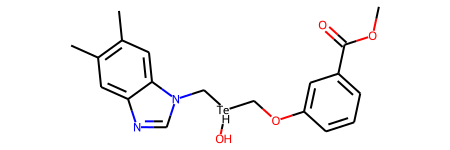

成功生成的高活性分子： COC(=O)c1cccc(OC[TeH](O)Cn2cnc3cc(C)c(C)cc32)c1 
Activity（越大药效越好）: 23.7928 
QED（越大类药性越高）: 0.4428 
SA（越小可合成性越高）: 3.5241 
logP（越大疏水性越好）: 2.3132 
------------------------------------------------------------------------------------------------------------


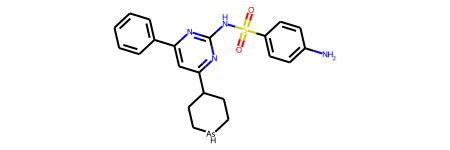

成功生成的高活性分子： Nc1ccc(S(=O)(=O)Nc2nc(-c3ccccc3)cc(C3CC[AsH]CC3)n2)cc1 
Activity（越大药效越好）: 8.2822 
QED（越大类药性越高）: 0.4381 
SA（越小可合成性越高）: 3.0718 
logP（越大疏水性越好）: 3.6771 
------------------------------------------------------------------------------------------------------------


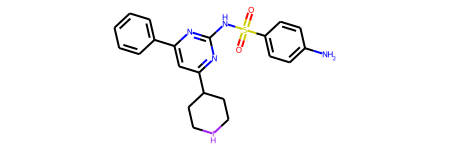

成功生成的高活性分子： Nc1ccc(S(=O)(=O)Nc2nc(-c3ccccc3)cc(C3CC[IH]CC3)n2)cc1 
Activity（越大药效越好）: 6.2948 
QED（越大类药性越高）: 0.2988 
SA（越小可合成性越高）: 3.0862 
logP（越大疏水性越好）: 4.1070 
------------------------------------------------------------------------------------------------------------


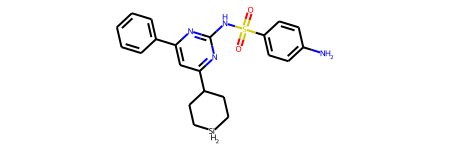

成功生成的高活性分子： Nc1ccc(S(=O)(=O)Nc2nc(-c3ccccc3)cc(C3CC[SiH2]CC3)n2)cc1 
Activity（越大药效越好）: 4.0308 
QED（越大类药性越高）: 0.4831 
SA（越小可合成性越高）: 2.9519 
logP（越大疏水性越好）: 3.4094 
------------------------------------------------------------------------------------------------------------


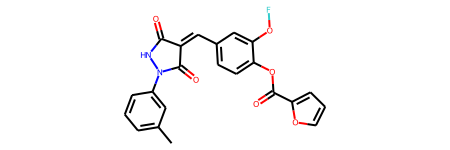

成功生成的高活性分子： Cc1cccc(N2NC(=O)/C(=C/c3ccc(OC(=O)c4ccco4)c(OF)c3)C2=O)c1 
Activity（越大药效越好）: 6.6256 
QED（越大类药性越高）: 0.2924 
SA（越小可合成性越高）: 2.7561 
logP（越大疏水性越好）: 3.5319 
------------------------------------------------------------------------------------------------------------


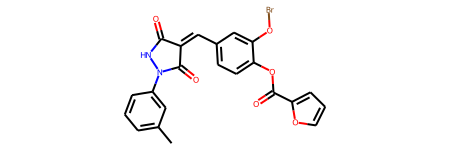

成功生成的高活性分子： Cc1cccc(N2NC(=O)/C(=C/c3ccc(OC(=O)c4ccco4)c(OBr)c3)C2=O)c1 
Activity（越大药效越好）: 8.8451 
QED（越大类药性越高）: 0.2555 
SA（越小可合成性越高）: 2.8100 
logP（越大疏水性越好）: 3.9573 
------------------------------------------------------------------------------------------------------------


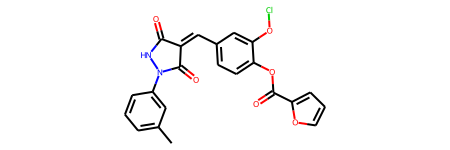

成功生成的高活性分子： Cc1cccc(N2NC(=O)/C(=C/c3ccc(OC(=O)c4ccco4)c(OCl)c3)C2=O)c1 
Activity（越大药效越好）: -0.9335 
QED（越大类药性越高）: 0.2814 
SA（越小可合成性越高）: 2.7432 
logP（越大疏水性越好）: 3.8012 
------------------------------------------------------------------------------------------------------------


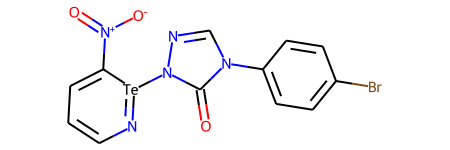

成功生成的高活性分子： O=c1n(-c2ccc(Br)cc2)cnn1[Te]1=NC=CC=C1[N+](=O)[O-] 
Activity（越大药效越好）: 31.9733 
QED（越大类药性越高）: 0.3813 
SA（越小可合成性越高）: 3.9720 
logP（越大疏水性越好）: 1.6285 
------------------------------------------------------------------------------------------------------------


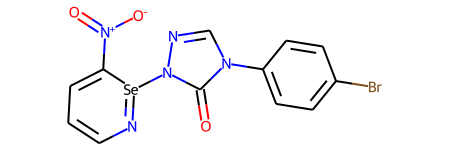

成功生成的高活性分子： O=c1n(-c2ccc(Br)cc2)cnn1[Se]1=NC=CC=C1[N+](=O)[O-] 
Activity（越大药效越好）: 34.8995 
QED（越大类药性越高）: 0.4213 
SA（越小可合成性越高）: 4.3519 
logP（越大疏水性越好）: 1.6285 
------------------------------------------------------------------------------------------------------------


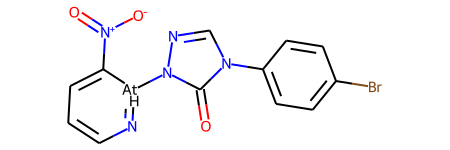

成功生成的高活性分子： O=c1n(-c2ccc(Br)cc2)cnn1[AtH]1=NC=CC=C1[N+](=O)[O-] 
Activity（越大药效越好）: 43.4480 
QED（越大类药性越高）: 0.4219 
SA（越小可合成性越高）: 4.3888 
logP（越大疏水性越好）: 1.7416 
------------------------------------------------------------------------------------------------------------


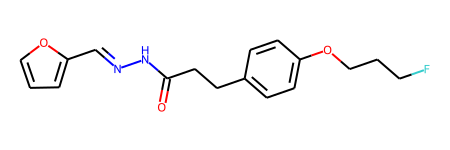

成功生成的高活性分子： O=C(CCc1ccc(OCCCF)cc1)N/N=C/c1ccco1 
Activity（越大药效越好）: 8.8558 
QED（越大类药性越高）: 0.4388 
SA（越小可合成性越高）: 2.2566 
logP（越大疏水性越好）: 3.1009 
------------------------------------------------------------------------------------------------------------


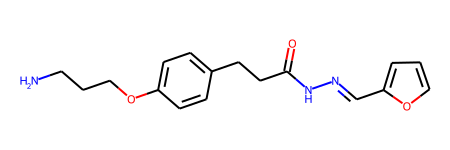

成功生成的高活性分子： NCCCOc1ccc(CCC(=O)N/N=C/c2ccco2)cc1 
Activity（越大药效越好）: 15.6804 
QED（越大类药性越高）: 0.4211 
SA（越小可合成性越高）: 2.1626 
logP（越大疏水性越好）: 2.0901 
------------------------------------------------------------------------------------------------------------


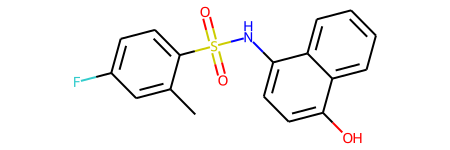

成功生成的高活性分子： Cc1cc(F)ccc1S(=O)(=O)Nc1ccc(O)c2ccccc12 
Activity（越大药效越好）: 16.7265 
QED（越大类药性越高）: 0.7176 
SA（越小可合成性越高）: 1.9755 
logP（越大疏水性越好）: 3.7937 
------------------------------------------------------------------------------------------------------------


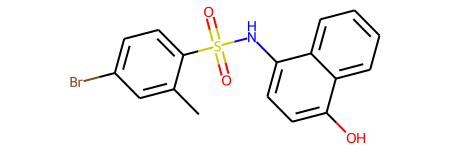

成功生成的高活性分子： Cc1cc(Br)ccc1S(=O)(=O)Nc1ccc(O)c2ccccc12 
Activity（越大药效越好）: 24.2680 
QED（越大类药性越高）: 0.6490 
SA（越小可合成性越高）: 2.0167 
logP（越大疏水性越好）: 4.4171 
------------------------------------------------------------------------------------------------------------


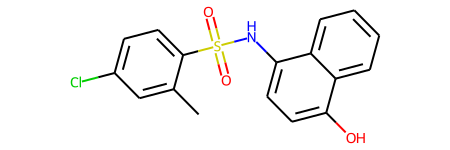

成功生成的高活性分子： Cc1cc(Cl)ccc1S(=O)(=O)Nc1ccc(O)c2ccccc12 
Activity（越大药效越好）: 16.9635 
QED（越大类药性越高）: 0.6937 
SA（越小可合成性越高）: 1.9666 
logP（越大疏水性越好）: 4.3080 
------------------------------------------------------------------------------------------------------------


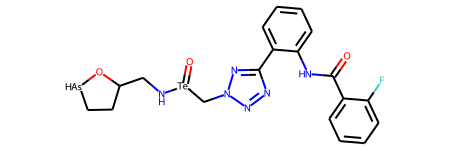

成功生成的高活性分子： O=C(Nc1ccccc1-c1nnn(C[Te](=O)NCC2CC[AsH]O2)n1)c1ccccc1F 
Activity（越大药效越好）: 24.9829 
QED（越大类药性越高）: 0.3751 
SA（越小可合成性越高）: 4.4933 
logP（越大疏水性越好）: 1.3377 
------------------------------------------------------------------------------------------------------------


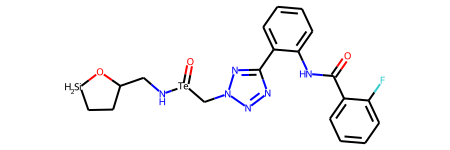

成功生成的高活性分子： O=C(Nc1ccccc1-c1nnn(C[Te](=O)NCC2CC[SiH2]O2)n1)c1ccccc1F 
Activity（越大药效越好）: 19.1437 
QED（越大类药性越高）: 0.4000 
SA（越小可合成性越高）: 4.1749 
logP（越大疏水性越好）: 1.0700 
------------------------------------------------------------------------------------------------------------


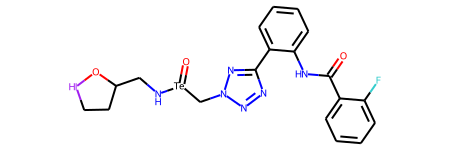

成功生成的高活性分子： O=C(Nc1ccccc1-c1nnn(C[Te](=O)NCC2CC[IH]O2)n1)c1ccccc1F 
Activity（越大药效越好）: 24.9231 
QED（越大类药性越高）: 0.2180 
SA（越小可合成性越高）: 4.2630 
logP（越大疏水性越好）: 2.1859 
------------------------------------------------------------------------------------------------------------


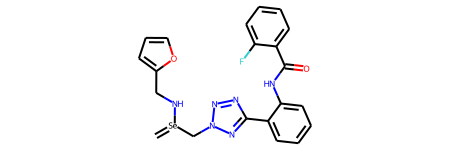

成功生成的高活性分子： C=[Se](Cn1nnc(-c2ccccc2NC(=O)c2ccccc2F)n1)NCc1ccco1 
Activity（越大药效越好）: 28.4826 
QED（越大类药性越高）: 0.3728 
SA（越小可合成性越高）: 3.4841 
logP（越大疏水性越好）: 2.6587 
------------------------------------------------------------------------------------------------------------


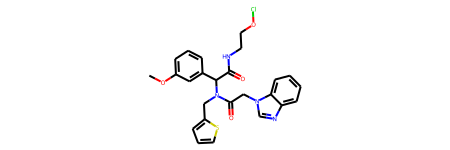

成功生成的高活性分子： COc1cccc(C(C(=O)NCCOCl)N(Cc2cccs2)C(=O)Cn2cnc3ccccc32)c1 
Activity（越大药效越好）: 27.7129 
QED（越大类药性越高）: 0.3049 
SA（越小可合成性越高）: 3.1488 
logP（越大疏水性越好）: 4.1631 
------------------------------------------------------------------------------------------------------------


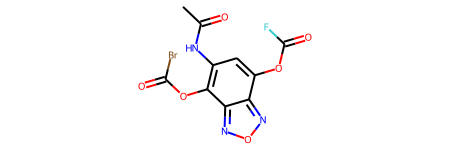

成功生成的高活性分子： CC(=O)Nc1cc(OC(=O)F)c2nonc2c1OC(=O)Br 
Activity（越大药效越好）: 19.5401 
QED（越大类药性越高）: 0.8273 
SA（越小可合成性越高）: 3.4425 
logP（越大疏水性越好）: 2.5432 
------------------------------------------------------------------------------------------------------------


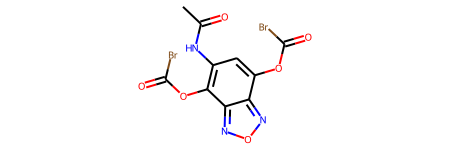

成功生成的高活性分子： CC(=O)Nc1cc(OC(=O)Br)c2nonc2c1OC(=O)Br 
Activity（越大药效越好）: 20.8080 
QED（越大类药性越高）: 0.7489 
SA（越小可合成性越高）: 3.4876 
logP（越大疏水性越好）: 2.9686 
------------------------------------------------------------------------------------------------------------


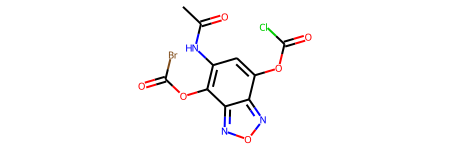

成功生成的高活性分子： CC(=O)Nc1cc(OC(=O)Cl)c2nonc2c1OC(=O)Br 
Activity（越大药效越好）: 21.0867 
QED（越大类药性越高）: 0.8093 
SA（越小可合成性越高）: 3.3554 
logP（越大疏水性越好）: 2.8125 
------------------------------------------------------------------------------------------------------------


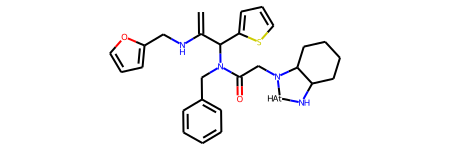

成功生成的高活性分子： C=C(NCc1ccco1)C(c1cccs1)N(Cc1ccccc1)C(=O)CN1[AtH]NC2CCCCC21 
Activity（越大药效越好）: -2.2535 
QED（越大类药性越高）: 0.3273 
SA（越小可合成性越高）: 4.3256 
logP（越大疏水性越好）: 4.5782 
------------------------------------------------------------------------------------------------------------


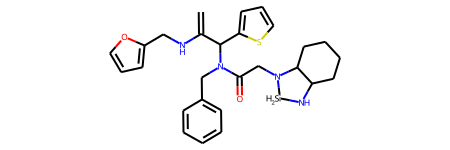

成功生成的高活性分子： C=C(NCc1ccco1)C(c1cccs1)N(Cc1ccccc1)C(=O)CN1[SiH2]NC2CCCCC21 
Activity（越大药效越好）: -1.2966 
QED（越大类药性越高）: 0.4082 
SA（越小可合成性越高）: 4.2762 
logP（越大疏水性越好）: 3.9297 
------------------------------------------------------------------------------------------------------------


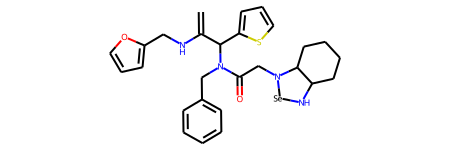

成功生成的高活性分子： C=C(NCc1ccco1)C(c1cccs1)N(Cc1ccccc1)C(=O)CN1[Se]NC2CCCCC21 
Activity（越大药效越好）: -3.5490 
QED（越大类药性越高）: 0.3620 
SA（越小可合成性越高）: 4.2835 
logP（越大疏水性越好）: 4.4651 
------------------------------------------------------------------------------------------------------------


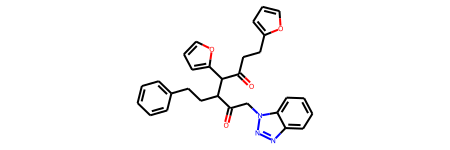

成功生成的高活性分子： O=C(Cn1nnc2ccccc21)C(CCc1ccccc1)C(C(=O)CCc1ccco1)c1ccco1 
Activity（越大药效越好）: 20.7212 
QED（越大类药性越高）: 0.2363 
SA（越小可合成性越高）: 3.5436 
logP（越大疏水性越好）: 5.4211 
------------------------------------------------------------------------------------------------------------


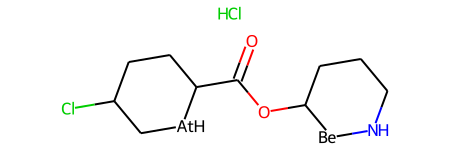

成功生成的高活性分子： Cl.O=C(OC1[Be]NCCC1)C1CCC(Cl)C[AtH]1 
Activity（越大药效越好）: 27.8230 
QED（越大类药性越高）: 0.3767 
SA（越小可合成性越高）: 6.2462 
logP（越大疏水性越好）: 1.7054 
------------------------------------------------------------------------------------------------------------


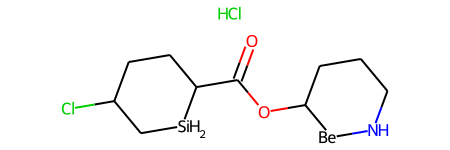

成功生成的高活性分子： Cl.O=C(OC1[Be]NCCC1)C1CCC(Cl)C[SiH2]1 
Activity（越大药效越好）: 28.7095 
QED（越大类药性越高）: 0.4699 
SA（越小可合成性越高）: 6.1726 
logP（越大疏水性越好）: 1.0569 
------------------------------------------------------------------------------------------------------------


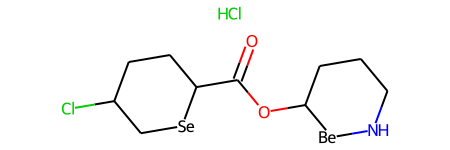

成功生成的高活性分子： Cl.O=C(OC1[Be]NCCC1)C1CCC(Cl)C[Se]1 
Activity（越大药效越好）: 30.8976 
QED（越大类药性越高）: 0.4707 
SA（越小可合成性越高）: 6.0451 
logP（越大疏水性越好）: 1.5923 
------------------------------------------------------------------------------------------------------------


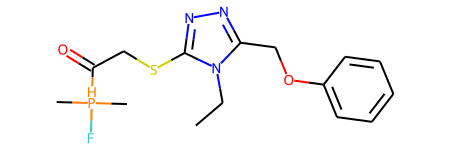

成功生成的高活性分子： CCn1c(COc2ccccc2)nnc1SCC(=O)[PH](C)(C)F 
Activity（越大药效越好）: 13.5641 
QED（越大类药性越高）: 0.5354 
SA（越小可合成性越高）: 3.0307 
logP（越大疏水性越好）: 3.3897 
------------------------------------------------------------------------------------------------------------


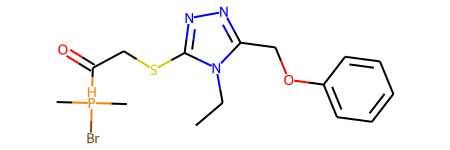

成功生成的高活性分子： CCn1c(COc2ccccc2)nnc1SCC(=O)[PH](C)(C)Br 
Activity（越大药效越好）: 18.0077 
QED（越大类药性越高）: 0.4821 
SA（越小可合成性越高）: 3.0406 
logP（越大疏水性越好）: 3.8151 
------------------------------------------------------------------------------------------------------------


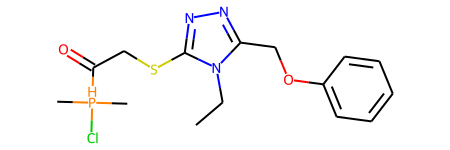

成功生成的高活性分子： CCn1c(COc2ccccc2)nnc1SCC(=O)[PH](C)(C)Cl 
Activity（越大药效越好）: 20.2177 
QED（越大类药性越高）: 0.5218 
SA（越小可合成性越高）: 3.0307 
logP（越大疏水性越好）: 3.6590 
------------------------------------------------------------------------------------------------------------


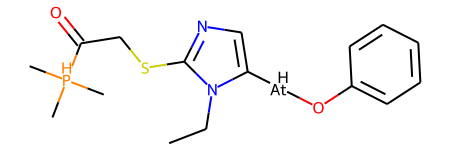

成功生成的高活性分子： CCn1c([AtH]Oc2ccccc2)cnc1SCC(=O)[PH](C)(C)C 
Activity（越大药效越好）: 15.5133 
QED（越大类药性越高）: 0.3755 
SA（越小可合成性越高）: 4.1214 
logP（越大疏水性越好）: 2.5976 
------------------------------------------------------------------------------------------------------------


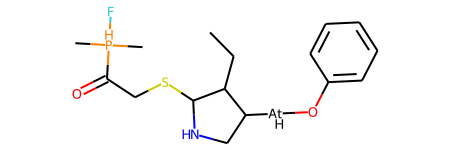

成功生成的高活性分子： CCC1C(SCC(=O)[PH](C)(C)F)NCC1[AtH]Oc1ccccc1 
Activity（越大药效越好）: -21.9261 
QED（越大类药性越高）: 0.4964 
SA（越小可合成性越高）: 5.4494 
logP（越大疏水性越好）: 3.6955 
------------------------------------------------------------------------------------------------------------


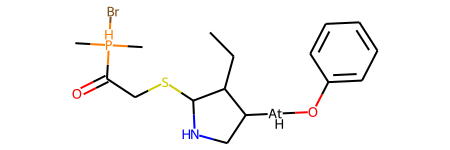

成功生成的高活性分子： CCC1C(SCC(=O)[PH](C)(C)Br)NCC1[AtH]Oc1ccccc1 
Activity（越大药效越好）: -24.1553 
QED（越大类药性越高）: 0.4463 
SA（越小可合成性越高）: 5.4593 
logP（越大疏水性越好）: 4.1209 
------------------------------------------------------------------------------------------------------------


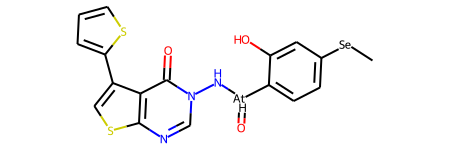

成功生成的高活性分子： C[Se]c1ccc([AtH](=O)Nn2cnc3scc(-c4cccs4)c3c2=O)c(O)c1 
Activity（越大药效越好）: 14.2959 
QED（越大类药性越高）: 0.3191 
SA（越小可合成性越高）: 4.4463 
logP（越大疏水性越好）: 1.7522 
------------------------------------------------------------------------------------------------------------


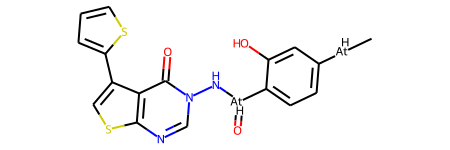

成功生成的高活性分子： C[AtH]c1ccc([AtH](=O)Nn2cnc3scc(-c4cccs4)c3c2=O)c(O)c1 
Activity（越大药效越好）: 15.1110 
QED（越大类药性越高）: 0.3230 
SA（越小可合成性越高）: 4.7092 
logP（越大疏水性越好）: 1.8653 
------------------------------------------------------------------------------------------------------------


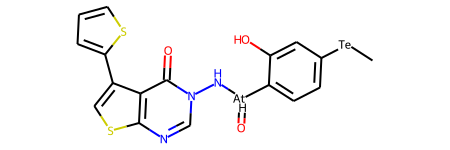

成功生成的高活性分子： C[Te]c1ccc([AtH](=O)Nn2cnc3scc(-c4cccs4)c3c2=O)c(O)c1 
Activity（越大药效越好）: 13.4869 
QED（越大类药性越高）: 0.3091 
SA（越小可合成性越高）: 4.5847 
logP（越大疏水性越好）: 1.7522 
------------------------------------------------------------------------------------------------------------


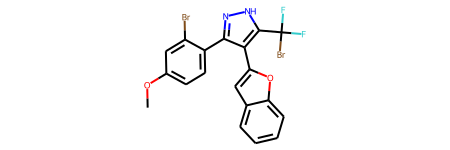

成功生成的高活性分子： COc1ccc(-c2n[nH]c(C(F)(F)Br)c2-c2cc3ccccc3o2)c(Br)c1 
Activity（越大药效越好）: 23.7278 
QED（越大类药性越高）: 0.3188 
SA（越小可合成性越高）: 2.8500 
logP（越大疏水性越好）: 6.7052 
------------------------------------------------------------------------------------------------------------


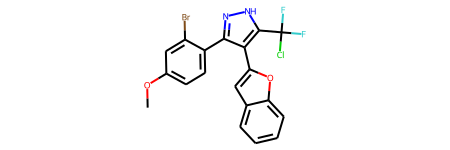

成功生成的高活性分子： COc1ccc(-c2n[nH]c(C(F)(F)Cl)c2-c2cc3ccccc3o2)c(Br)c1 
Activity（越大药效越好）: 18.4919 
QED（越大类药性越高）: 0.3565 
SA（越小可合成性越高）: 2.7816 
logP（越大疏水性越好）: 6.5491 
------------------------------------------------------------------------------------------------------------


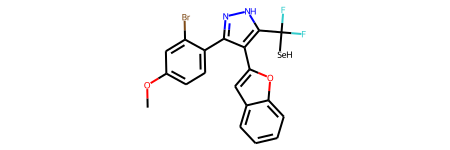

成功生成的高活性分子： COc1ccc(-c2n[nH]c(C(F)(F)[SeH])c2-c2cc3ccccc3o2)c(Br)c1 
Activity（越大药效越好）: 16.9293 
QED（越大类药性越高）: 0.3935 
SA（越小可合成性越高）: 3.0225 
logP（越大疏水性越好）: 5.2111 
------------------------------------------------------------------------------------------------------------


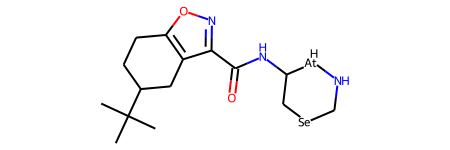

成功生成的高活性分子： CC(C)(C)C1CCc2onc(C(=O)NC3C[Se]CN[AtH]3)c2C1 
Activity（越大药效越好）: 22.7360 
QED（越大类药性越高）: 0.5296 
SA（越小可合成性越高）: 4.9972 
logP（越大疏水性越好）: 1.2970 
------------------------------------------------------------------------------------------------------------


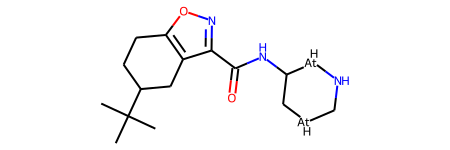

成功生成的高活性分子： CC(C)(C)C1CCc2onc(C(=O)NC3C[AtH]CN[AtH]3)c2C1 
Activity（越大药效越好）: 26.1680 
QED（越大类药性越高）: 0.4909 
SA（越小可合成性越高）: 5.1316 
logP（越大疏水性越好）: 1.4101 
------------------------------------------------------------------------------------------------------------


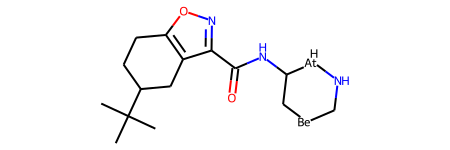

成功生成的高活性分子： CC(C)(C)C1CCc2onc(C(=O)NC3C[Be]CN[AtH]3)c2C1 
Activity（越大药效越好）: 24.7635 
QED（越大类药性越高）: 0.6052 
SA（越小可合成性越高）: 5.1316 
logP（越大疏水性越好）: 1.2970 
------------------------------------------------------------------------------------------------------------


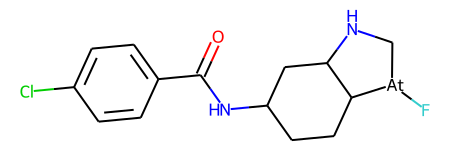

成功生成的高活性分子： O=C(NC1CCC2C(C1)NC[At]2F)c1ccc(Cl)cc1 
Activity（越大药效越好）: 10.1699 
QED（越大类药性越高）: 0.6654 
SA（越小可合成性越高）: 4.2704 
logP（越大疏水性越好）: 2.8453 
------------------------------------------------------------------------------------------------------------


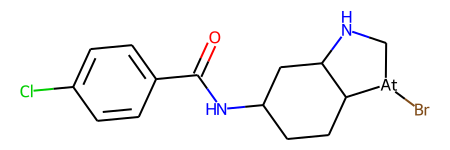

成功生成的高活性分子： O=C(NC1CCC2C(C1)NC[At]2Br)c1ccc(Cl)cc1 
Activity（越大药效越好）: 16.0471 
QED（越大类药性越高）: 0.5897 
SA（越小可合成性越高）: 4.2815 
logP（越大疏水性越好）: 3.2707 
------------------------------------------------------------------------------------------------------------


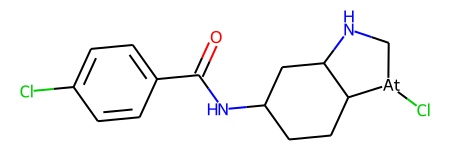

成功生成的高活性分子： O=C(NC1CCC2C(C1)NC[At]2Cl)c1ccc(Cl)cc1 
Activity（越大药效越好）: 17.3633 
QED（越大类药性越高）: 0.6428 
SA（越小可合成性越高）: 4.2704 
logP（越大疏水性越好）: 3.1146 
------------------------------------------------------------------------------------------------------------


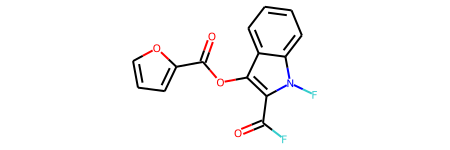

成功生成的高活性分子： O=C(Oc1c(C(=O)F)n(F)c2ccccc12)c1ccco1 
Activity（越大药效越好）: 31.2999 
QED（越大类药性越高）: 0.5485 
SA（越小可合成性越高）: 2.8837 
logP（越大疏水性越好）: 3.2958 
------------------------------------------------------------------------------------------------------------


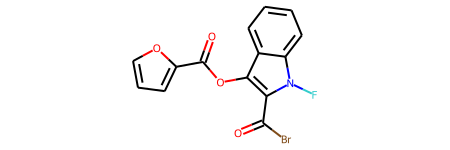

成功生成的高活性分子： O=C(Oc1c(C(=O)Br)n(F)c2ccccc12)c1ccco1 
Activity（越大药效越好）: 31.4367 
QED（越大类药性越高）: 0.5325 
SA（越小可合成性越高）: 2.9045 
logP（越大疏水性越好）: 3.7212 
------------------------------------------------------------------------------------------------------------


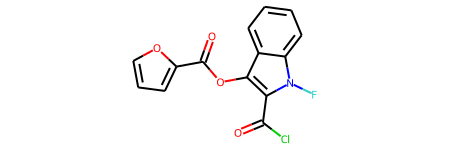

成功生成的高活性分子： O=C(Oc1c(C(=O)Cl)n(F)c2ccccc12)c1ccco1 
Activity（越大药效越好）: 26.8692 
QED（越大类药性越高）: 0.5480 
SA（越小可合成性越高）: 2.8066 
logP（越大疏水性越好）: 3.5651 
------------------------------------------------------------------------------------------------------------


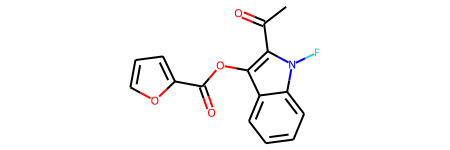

成功生成的高活性分子： CC(=O)c1c(OC(=O)c2ccco2)c2ccccc2n1F 
Activity（越大药效越好）: 28.6033 
QED（越大类药性越高）: 0.5469 
SA（越小可合成性越高）: 2.6981 
logP（越大疏水性越好）: 3.3887 
------------------------------------------------------------------------------------------------------------


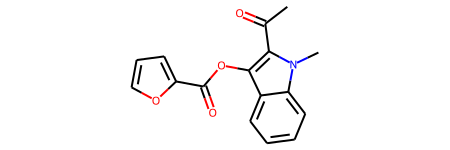

成功生成的高活性分子： CC(=O)c1c(OC(=O)c2ccco2)c2ccccc2n1C 
Activity（越大药效越好）: 21.6852 
QED（越大类药性越高）: 0.5468 
SA（越小可合成性越高）: 2.3637 
logP（越大疏水性越好）: 3.1931 
------------------------------------------------------------------------------------------------------------


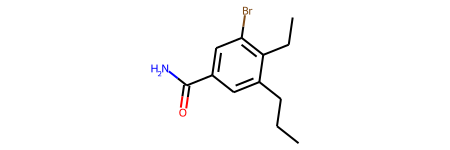

成功生成的高活性分子： CCCc1cc(C(N)=O)cc(Br)c1CC 
Activity（越大药效越好）: 6.2854 
QED（越大类药性越高）: 0.8973 
SA（越小可合成性越高）: 2.3312 
logP（越大疏水性越好）: 3.0629 
------------------------------------------------------------------------------------------------------------


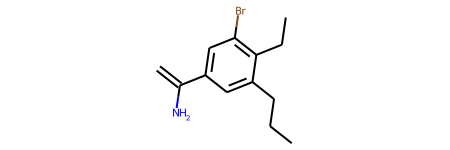

成功生成的高活性分子： C=C(N)c1cc(Br)c(CC)c(CCC)c1 
Activity（越大药效越好）: 7.9759 
QED（越大类药性越高）: 0.8803 
SA（越小可合成性越高）: 2.7507 
logP（越大疏水性越好）: 3.8934 
------------------------------------------------------------------------------------------------------------


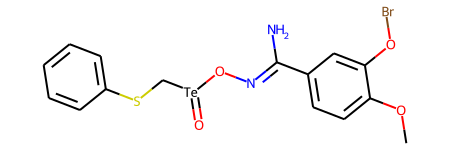

成功生成的高活性分子： COc1ccc(/C(N)=N/O[Te](=O)CSc2ccccc2)cc1OBr 
Activity（越大药效越好）: 9.5745 
QED（越大类药性越高）: 0.1869 
SA（越小可合成性越高）: 3.4778 
logP（越大疏水性越好）: 3.2710 
------------------------------------------------------------------------------------------------------------


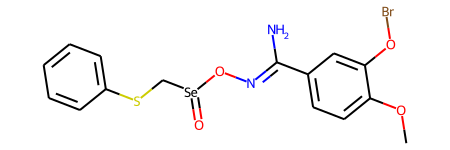

成功生成的高活性分子： COc1ccc(/C(N)=N/O[Se](=O)CSc2ccccc2)cc1OBr 
Activity（越大药效越好）: 9.2970 
QED（越大类药性越高）: 0.2063 
SA（越小可合成性越高）: 3.8090 
logP（越大疏水性越好）: 3.2710 
------------------------------------------------------------------------------------------------------------


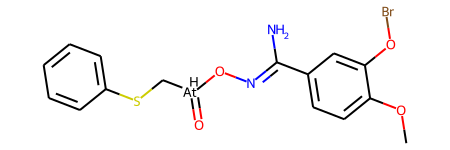

成功生成的高活性分子： COc1ccc(/C(N)=N/O[AtH](=O)CSc2ccccc2)cc1OBr 
Activity（越大药效越好）: 36.9481 
QED（越大类药性越高）: 0.2139 
SA（越小可合成性越高）: 3.8946 
logP（越大疏水性越好）: 3.3841 
------------------------------------------------------------------------------------------------------------


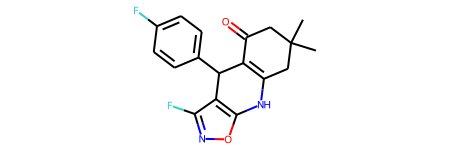

成功生成的高活性分子： CC1(C)CC(=O)C2=C(C1)Nc1onc(F)c1C2c1ccc(F)cc1 
Activity（越大药效越好）: 19.3771 
QED（越大类药性越高）: 0.8531 
SA（越小可合成性越高）: 3.5046 
logP（越大疏水性越好）: 4.1534 
------------------------------------------------------------------------------------------------------------


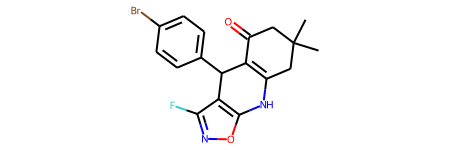

成功生成的高活性分子： CC1(C)CC(=O)C2=C(C1)Nc1onc(F)c1C2c1ccc(Br)cc1 
Activity（越大药效越好）: 23.1869 
QED（越大类药性越高）: 0.7606 
SA（越小可合成性越高）: 3.5547 
logP（越大疏水性越好）: 4.7768 
------------------------------------------------------------------------------------------------------------


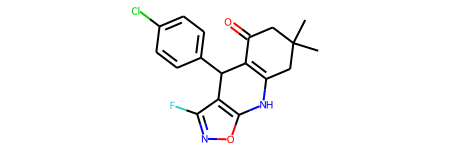

成功生成的高活性分子： CC1(C)CC(=O)C2=C(C1)Nc1onc(F)c1C2c1ccc(Cl)cc1 
Activity（越大药效越好）: 20.4635 
QED（越大类药性越高）: 0.8150 
SA（越小可合成性越高）: 3.4993 
logP（越大疏水性越好）: 4.6677 
------------------------------------------------------------------------------------------------------------


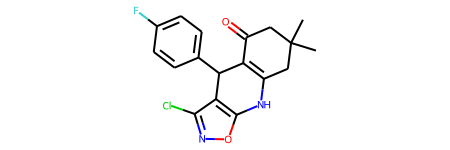

成功生成的高活性分子： CC1(C)CC(=O)C2=C(C1)Nc1onc(Cl)c1C2c1ccc(F)cc1 
Activity（越大药效越好）: 23.0180 
QED（越大类药性越高）: 0.8150 
SA（越小可合成性越高）: 3.4825 
logP（越大疏水性越好）: 4.6677 
------------------------------------------------------------------------------------------------------------


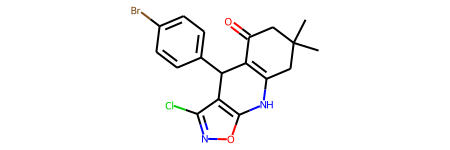

成功生成的高活性分子： CC1(C)CC(=O)C2=C(C1)Nc1onc(Cl)c1C2c1ccc(Br)cc1 
Activity（越大药效越好）: 29.0614 
QED（越大类药性越高）: 0.6975 
SA（越小可合成性越高）: 3.5325 
logP（越大疏水性越好）: 5.2911 
------------------------------------------------------------------------------------------------------------


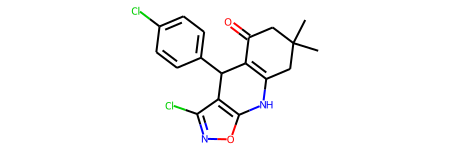

成功生成的高活性分子： CC1(C)CC(=O)C2=C(C1)Nc1onc(Cl)c1C2c1ccc(Cl)cc1 
Activity（越大药效越好）: 29.7830 
QED（越大类药性越高）: 0.7584 
SA（越小可合成性越高）: 3.4771 
logP（越大疏水性越好）: 5.1820 
------------------------------------------------------------------------------------------------------------


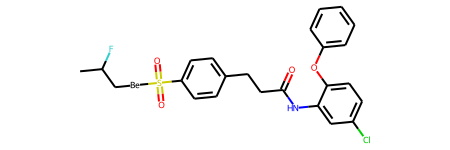

成功生成的高活性分子： CC(F)C[Be]S(=O)(=O)c1ccc(CCC(=O)Nc2cc(Cl)ccc2Oc2ccccc2)cc1 
Activity（越大药效越好）: -8.4156 
QED（越大类药性越高）: 0.3650 
SA（越小可合成性越高）: 3.2006 
logP（越大疏水性越好）: 5.8728 
------------------------------------------------------------------------------------------------------------


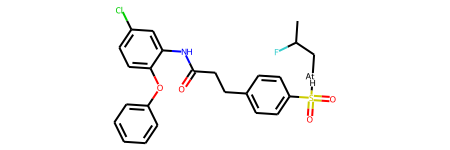

成功生成的高活性分子： CC(F)C[AtH]S(=O)(=O)c1ccc(CCC(=O)Nc2cc(Cl)ccc2Oc2ccccc2)cc1 
Activity（越大药效越好）: -10.4928 
QED（越大类药性越高）: 0.2849 
SA（越小可合成性越高）: 3.2006 
logP（越大疏水性越好）: 5.9859 
------------------------------------------------------------------------------------------------------------


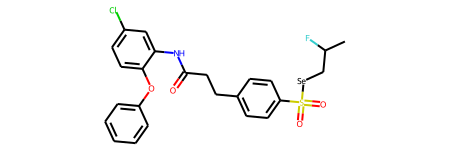

成功生成的高活性分子： CC(F)C[Se]S(=O)(=O)c1ccc(CCC(=O)Nc2cc(Cl)ccc2Oc2ccccc2)cc1 
Activity（越大药效越好）: -12.0163 
QED（越大类药性越高）: 0.3181 
SA（越小可合成性越高）: 3.1048 
logP（越大疏水性越好）: 5.8728 
------------------------------------------------------------------------------------------------------------


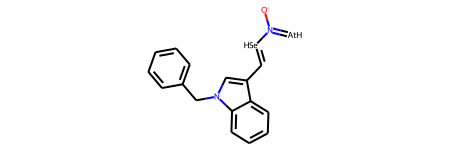

成功生成的高活性分子： [O-][N+](=[AtH])/[SeH]=C/c1cn(Cc2ccccc2)c2ccccc12 
Activity（越大药效越好）: 18.0197 
QED（越大类药性越高）: 0.3691 
SA（越小可合成性越高）: 3.0463 
logP（越大疏水性越好）: 2.1669 
------------------------------------------------------------------------------------------------------------


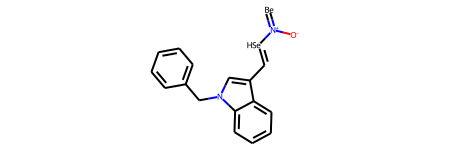

成功生成的高活性分子： [Be]=[N+]([O-])/[SeH]=C/c1cn(Cc2ccccc2)c2ccccc12 
Activity（越大药效越好）: 18.4154 
QED（越大类药性越高）: 0.5292 
SA（越小可合成性越高）: 3.0463 
logP（越大疏水性越好）: 2.0538 
------------------------------------------------------------------------------------------------------------


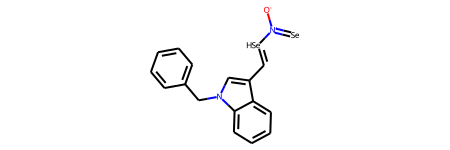

成功生成的高活性分子： [O-][N+](=[Se])/[SeH]=C/c1cn(Cc2ccccc2)c2ccccc12 
Activity（越大药效越好）: 15.0287 
QED（越大类药性越高）: 0.4805 
SA（越小可合成性越高）: 2.9838 
logP（越大疏水性越好）: 2.0538 
------------------------------------------------------------------------------------------------------------


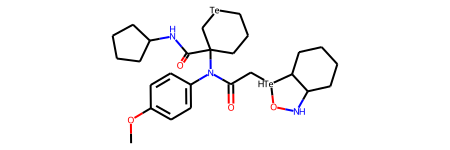

成功生成的高活性分子： COc1ccc(N(C(=O)C[TeH]2ONC3CCCCC32)C2(C(=O)NC3CCCC3)CCC[Te]C2)cc1 
Activity（越大药效越好）: -2.7942 
QED（越大类药性越高）: 0.4220 
SA（越小可合成性越高）: 5.1626 
logP（越大疏水性越好）: 3.7318 
------------------------------------------------------------------------------------------------------------


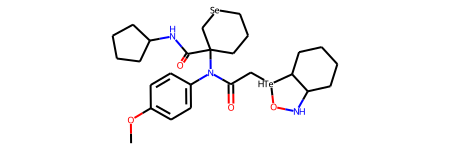

成功生成的高活性分子： COc1ccc(N(C(=O)C[TeH]2ONC3CCCCC32)C2(C(=O)NC3CCCC3)CCC[Se]C2)cc1 
Activity（越大药效越好）: -4.7065 
QED（越大类药性越高）: 0.4352 
SA（越小可合成性越高）: 5.1047 
logP（越大疏水性越好）: 3.7318 
------------------------------------------------------------------------------------------------------------


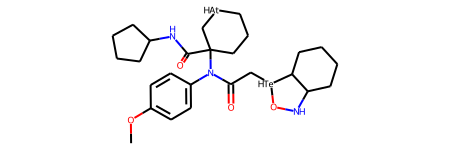

成功生成的高活性分子： COc1ccc(N(C(=O)C[TeH]2ONC3CCCCC32)C2(C(=O)NC3CCCC3)CCC[AtH]C2)cc1 
Activity（越大药效越好）: 1.7266 
QED（越大类药性越高）: 0.4109 
SA（越小可合成性越高）: 5.2064 
logP（越大疏水性越好）: 3.8449 
------------------------------------------------------------------------------------------------------------


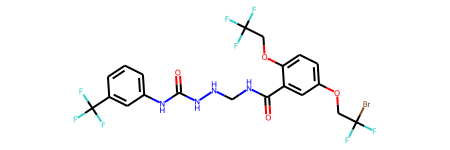

成功生成的高活性分子： O=C(NNCNC(=O)c1cc(OCC(F)(F)Br)ccc1OCC(F)(F)F)Nc1cccc(C(F)(F)F)c1 
Activity（越大药效越好）: 40.5885 
QED（越大类药性越高）: 0.0997 
SA（越小可合成性越高）: 3.0602 
logP（越大疏水性越好）: 5.0266 
------------------------------------------------------------------------------------------------------------


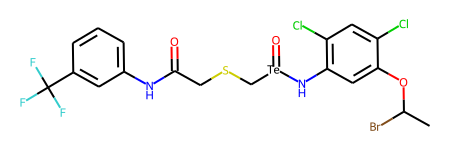

成功生成的高活性分子： CC(Br)Oc1cc(N[Te](=O)CSCC(=O)Nc2cccc(C(F)(F)F)c2)c(Cl)cc1Cl 
Activity（越大药效越好）: 27.7532 
QED（越大类药性越高）: 0.2390 
SA（越小可合成性越高）: 3.8185 
logP（越大疏水性越好）: 6.3736 
------------------------------------------------------------------------------------------------------------


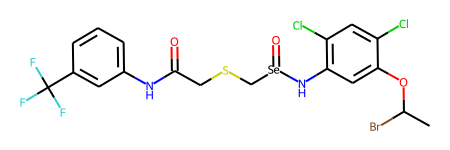

成功生成的高活性分子： CC(Br)Oc1cc(N[Se](=O)CSCC(=O)Nc2cccc(C(F)(F)F)c2)c(Cl)cc1Cl 
Activity（越大药效越好）: 15.3136 
QED（越大类药性越高）: 0.2500 
SA（越小可合成性越高）: 3.9930 
logP（越大疏水性越好）: 6.3736 
------------------------------------------------------------------------------------------------------------


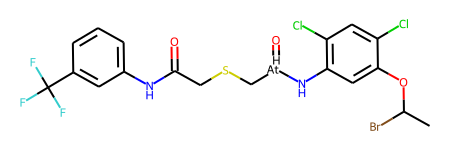

成功生成的高活性分子： CC(Br)Oc1cc(N[AtH](=O)CSCC(=O)Nc2cccc(C(F)(F)F)c2)c(Cl)cc1Cl 
Activity（越大药效越好）: 33.0163 
QED（越大类药性越高）: 0.2868 
SA（越小可合成性越高）: 4.0624 
logP（越大疏水性越好）: 6.4867 
------------------------------------------------------------------------------------------------------------


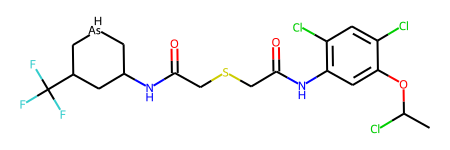

成功生成的高活性分子： CC(Cl)Oc1cc(NC(=O)CSCC(=O)NC2C[AsH]CC(C(F)(F)F)C2)c(Cl)cc1Cl 
Activity（越大药效越好）: 31.1892 
QED（越大类药性越高）: 0.3352 
SA（越小可合成性越高）: 4.5115 
logP（越大疏水性越好）: 4.9688 
------------------------------------------------------------------------------------------------------------


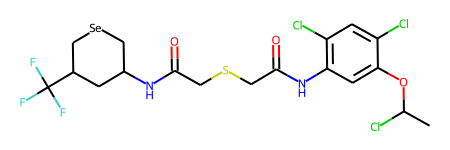

成功生成的高活性分子： CC(Cl)Oc1cc(NC(=O)CSCC(=O)NC2C[Se]CC(C(F)(F)F)C2)c(Cl)cc1Cl 
Activity（越大药效越好）: 39.4518 
QED（越大类药性越高）: 0.3233 
SA（越小可合成性越高）: 4.2443 
logP（越大疏水性越好）: 5.2365 
------------------------------------------------------------------------------------------------------------


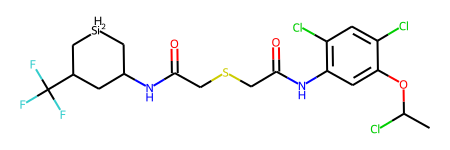

成功生成的高活性分子： CC(Cl)Oc1cc(NC(=O)CSCC(=O)NC2C[SiH2]CC(C(F)(F)F)C2)c(Cl)cc1Cl 
Activity（越大药效越好）: 34.5964 
QED（越大类药性越高）: 0.3726 
SA（越小可合成性越高）: 4.3262 
logP（越大疏水性越好）: 4.7011 
------------------------------------------------------------------------------------------------------------


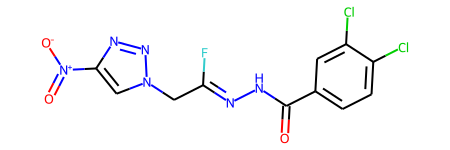

成功生成的高活性分子： O=C(N/N=C(\F)Cn1cc([N+](=O)[O-])nn1)c1ccc(Cl)c(Cl)c1 
Activity（越大药效越好）: 22.8117 
QED（越大类药性越高）: 0.4980 
SA（越小可合成性越高）: 3.0720 
logP（越大疏水性越好）: 2.2061 
------------------------------------------------------------------------------------------------------------


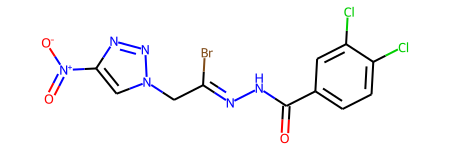

成功生成的高活性分子： O=C(N/N=C(\Br)Cn1cc([N+](=O)[O-])nn1)c1ccc(Cl)c(Cl)c1 
Activity（越大药效越好）: 24.2771 
QED（越大类药性越高）: 0.4522 
SA（越小可合成性越高）: 3.0678 
logP（越大疏水性越好）: 2.6315 
------------------------------------------------------------------------------------------------------------


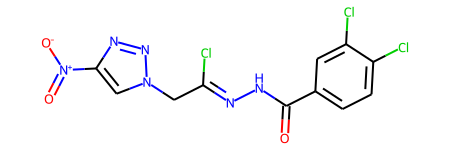

成功生成的高活性分子： O=C(N/N=C(\Cl)Cn1cc([N+](=O)[O-])nn1)c1ccc(Cl)c(Cl)c1 
Activity（越大药效越好）: 25.4765 
QED（越大类药性越高）: 0.4880 
SA（越小可合成性越高）: 3.0264 
logP（越大疏水性越好）: 2.4754 
------------------------------------------------------------------------------------------------------------


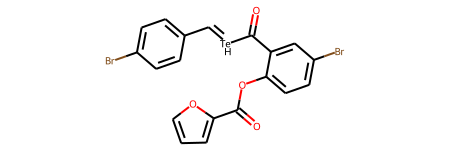

成功生成的高活性分子： O=C(Oc1ccc(Br)cc1C(=O)/[TeH]=C/c1ccc(Br)cc1)c1ccco1 
Activity（越大药效越好）: 33.9638 
QED（越大类药性越高）: 0.2501 
SA（越小可合成性越高）: 3.0231 
logP（越大疏水性越好）: 4.4510 
------------------------------------------------------------------------------------------------------------


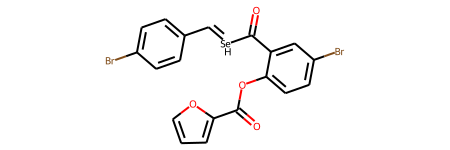

成功生成的高活性分子： O=C(Oc1ccc(Br)cc1C(=O)/[SeH]=C/c1ccc(Br)cc1)c1ccco1 
Activity（越大药效越好）: 34.5570 
QED（越大类药性越高）: 0.2715 
SA（越小可合成性越高）: 3.0231 
logP（越大疏水性越好）: 4.4510 
------------------------------------------------------------------------------------------------------------


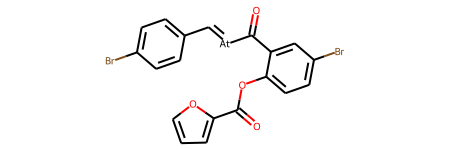

成功生成的高活性分子： O=C(Oc1ccc(Br)cc1C(=O)/[At]=C/c1ccc(Br)cc1)c1ccco1 
Activity（越大药效越好）: 35.6863 
QED（越大类药性越高）: 0.2799 
SA（越小可合成性越高）: 3.0231 
logP（越大疏水性越好）: 5.0995 
------------------------------------------------------------------------------------------------------------


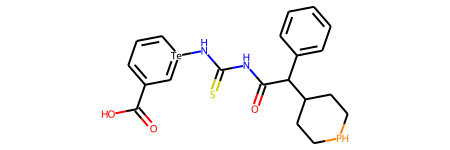

成功生成的高活性分子： O=C(O)C1=CC=C[Te](NC(=S)NC(=O)C(c2ccccc2)C2CCPCC2)=C1 
Activity（越大药效越好）: 16.1464 
QED（越大类药性越高）: 0.3100 
SA（越小可合成性越高）: 4.7878 
logP（越大疏水性越好）: 2.3448 
------------------------------------------------------------------------------------------------------------


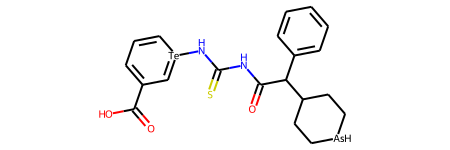

成功生成的高活性分子： O=C(O)C1=CC=C[Te](NC(=S)NC(=O)C(c2ccccc2)C2CC[AsH]CC2)=C1 
Activity（越大药效越好）: 17.2783 
QED（越大类药性越高）: 0.3708 
SA（越小可合成性越高）: 4.9041 
logP（越大疏水性越好）: 1.9394 
------------------------------------------------------------------------------------------------------------


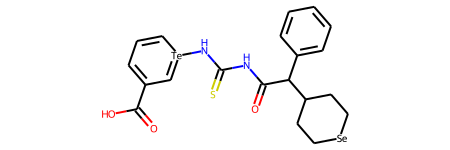

成功生成的高活性分子： O=C(O)C1=CC=C[Te](NC(=S)NC(=O)C(c2ccccc2)C2CC[Se]CC2)=C1 
Activity（越大药效越好）: 11.6386 
QED（越大类药性越高）: 0.3702 
SA（越小可合成性越高）: 4.7535 
logP（越大疏水性越好）: 2.2071 
------------------------------------------------------------------------------------------------------------


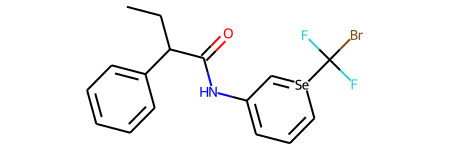

成功生成的高活性分子： CCC(C(=O)NC1=CC=C[Se](C(F)(F)Br)=C1)c1ccccc1 
Activity（越大药效越好）: 13.6493 
QED（越大类药性越高）: 0.5552 
SA（越小可合成性越高）: 4.2271 
logP（越大疏水性越好）: 3.6949 
------------------------------------------------------------------------------------------------------------


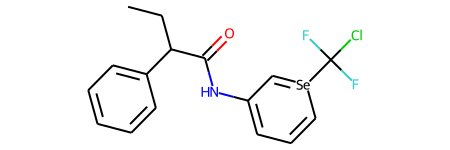

成功生成的高活性分子： CCC(C(=O)NC1=CC=C[Se](C(F)(F)Cl)=C1)c1ccccc1 
Activity（越大药效越好）: 16.8484 
QED（越大类药性越高）: 0.6046 
SA（越小可合成性越高）: 4.1992 
logP（越大疏水性越好）: 3.5388 
------------------------------------------------------------------------------------------------------------


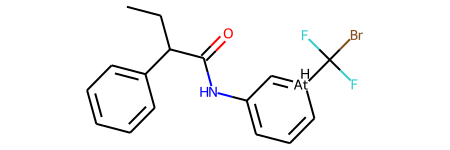

成功生成的高活性分子： CCC(C(=O)NC1=CC=C[AtH](C(F)(F)Br)=C1)c1ccccc1 
Activity（越大药效越好）: 24.8254 
QED（越大类药性越高）: 0.5398 
SA（越小可合成性越高）: 4.2646 
logP（越大疏水性越好）: 3.8080 
------------------------------------------------------------------------------------------------------------


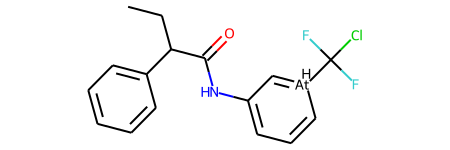

成功生成的高活性分子： CCC(C(=O)NC1=CC=C[AtH](C(F)(F)Cl)=C1)c1ccccc1 
Activity（越大药效越好）: 18.7306 
QED（越大类药性越高）: 0.5881 
SA（越小可合成性越高）: 4.2367 
logP（越大疏水性越好）: 3.6519 
------------------------------------------------------------------------------------------------------------


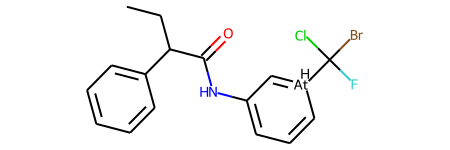

成功生成的高活性分子： CCC(C(=O)NC1=CC=C[AtH](C(F)(Cl)Br)=C1)c1ccccc1 
Activity（越大药效越好）: 7.6636 
QED（越大类药性越高）: 0.5208 
SA（越小可合成性越高）: 4.4710 
logP（越大疏水性越好）: 4.0773 
------------------------------------------------------------------------------------------------------------


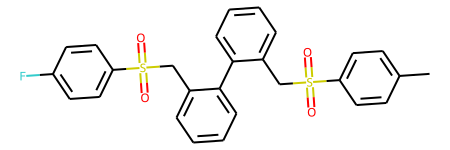

成功生成的高活性分子： Cc1ccc(S(=O)(=O)Cc2ccccc2-c2ccccc2CS(=O)(=O)c2ccc(F)cc2)cc1 
Activity（越大药效越好）: 7.7700 
QED（越大类药性越高）: 0.3070 
SA（越小可合成性越高）: 2.1954 
logP（越大疏水性越好）: 5.7489 
------------------------------------------------------------------------------------------------------------


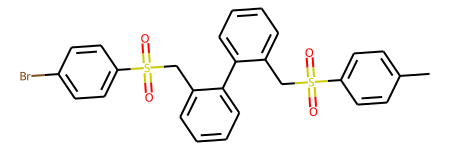

成功生成的高活性分子： Cc1ccc(S(=O)(=O)Cc2ccccc2-c2ccccc2CS(=O)(=O)c2ccc(Br)cc2)cc1 
Activity（越大药效越好）: 12.5034 
QED（越大类药性越高）: 0.2658 
SA（越小可合成性越高）: 2.2304 
logP（越大疏水性越好）: 6.3723 
------------------------------------------------------------------------------------------------------------


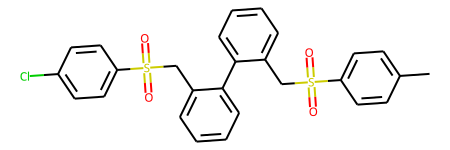

成功生成的高活性分子： Cc1ccc(S(=O)(=O)Cc2ccccc2-c2ccccc2CS(=O)(=O)c2ccc(Cl)cc2)cc1 
Activity（越大药效越好）: 13.5578 
QED（越大类药性越高）: 0.2939 
SA（越小可合成性越高）: 2.1917 
logP（越大疏水性越好）: 6.2632 
------------------------------------------------------------------------------------------------------------


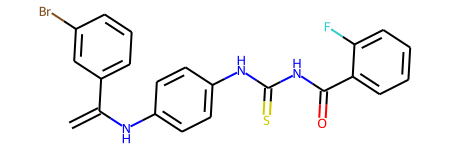

成功生成的高活性分子： C=C(Nc1ccc(NC(=S)NC(=O)c2ccccc2F)cc1)c1cccc(Br)c1 
Activity（越大药效越好）: 16.5482 
QED（越大类药性越高）: 0.4130 
SA（越小可合成性越高）: 2.1961 
logP（越大疏水性越好）: 5.7978 
------------------------------------------------------------------------------------------------------------


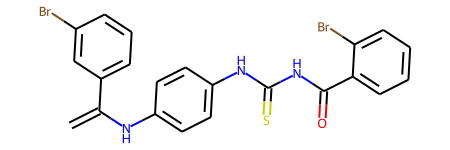

成功生成的高活性分子： C=C(Nc1ccc(NC(=S)NC(=O)c2ccccc2Br)cc1)c1cccc(Br)c1 
Activity（越大药效越好）: 21.4026 
QED（越大类药性越高）: 0.3330 
SA（越小可合成性越高）: 2.2431 
logP（越大疏水性越好）: 6.4212 
------------------------------------------------------------------------------------------------------------


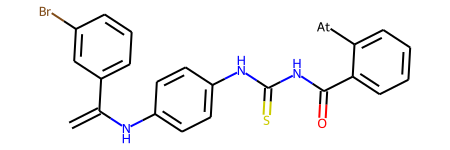

成功生成的高活性分子： C=C(Nc1ccc(NC(=S)NC(=O)c2ccccc2[At])cc1)c1cccc(Br)c1 
Activity（越大药效越好）: 16.4508 
QED（越大类药性越高）: 0.3435 
SA（越小可合成性越高）: 2.7261 
logP（越大疏水性越好）: 4.8333 
------------------------------------------------------------------------------------------------------------


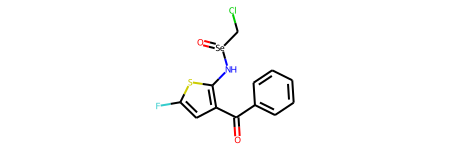

成功生成的高活性分子： O=C(c1ccccc1)c1cc(F)sc1N[Se](=O)CCl 
Activity（越大药效越好）: 4.5971 
QED（越大类药性越高）: 0.5032 
SA（越小可合成性越高）: 3.8066 
logP（越大疏水性越好）: 3.2268 
------------------------------------------------------------------------------------------------------------


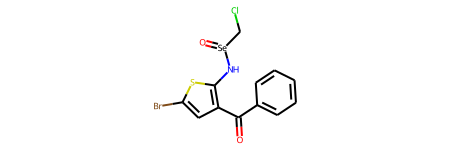

成功生成的高活性分子： O=C(c1ccccc1)c1cc(Br)sc1N[Se](=O)CCl 
Activity（越大药效越好）: 10.6033 
QED（越大类药性越高）: 0.4497 
SA（越小可合成性越高）: 3.6660 
logP（越大疏水性越好）: 3.8502 
------------------------------------------------------------------------------------------------------------


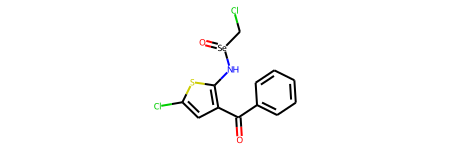

成功生成的高活性分子： O=C(c1ccccc1)c1cc(Cl)sc1N[Se](=O)CCl 
Activity（越大药效越好）: 12.3038 
QED（越大类药性越高）: 0.4878 
SA（越小可合成性越高）: 3.6020 
logP（越大疏水性越好）: 3.7411 
------------------------------------------------------------------------------------------------------------


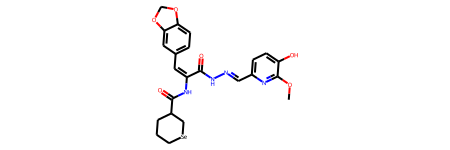

成功生成的高活性分子： COc1nc(/C=N/NC(=O)/C(=C\c2ccc3c(c2)OCO3)NC(=O)C2CCC[Se]C2)ccc1O 
Activity（越大药效越好）: 1.7182 
QED（越大类药性越高）: 0.2159 
SA（越小可合成性越高）: 3.9285 
logP（越大疏水性越好）: 2.0827 
------------------------------------------------------------------------------------------------------------


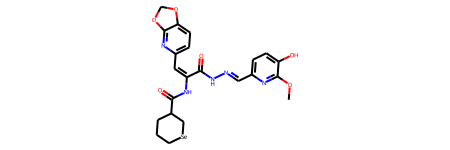

成功生成的高活性分子： COc1nc(/C=N/NC(=O)/C(=C\c2ccc3c(n2)OCO3)NC(=O)C2CCC[Se]C2)ccc1O 
Activity（越大药效越好）: -8.8884 
QED（越大类药性越高）: 0.2106 
SA（越小可合成性越高）: 4.2826 
logP（越大疏水性越好）: 1.4777 
------------------------------------------------------------------------------------------------------------


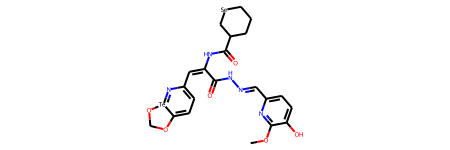

成功生成的高活性分子： COc1nc(/C=N/NC(=O)/C(=C\C2=CC=C3OCO[Te]3=N2)NC(=O)C2CCC[Se]C2)ccc1O 
Activity（越大药效越好）: 2.1379 
QED（越大类药性越高）: 0.1751 
SA（越小可合成性越高）: 5.1417 
logP（越大疏水性越好）: 1.2785 
------------------------------------------------------------------------------------------------------------


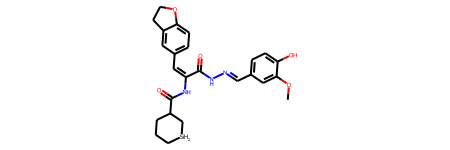

成功生成的高活性分子： COc1cc(/C=N/NC(=O)/C(=C\c2ccc3c(c2)CCO3)NC(=O)C2CCC[SiH2]C2)ccc1O 
Activity（越大药效越好）: 13.7647 
QED（越大类药性越高）: 0.2445 
SA（越小可合成性越高）: 3.7211 
logP（越大疏水性越好）: 2.3585 
------------------------------------------------------------------------------------------------------------


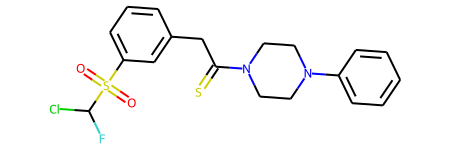

成功生成的高活性分子： O=S(=O)(c1cccc(CC(=S)N2CCN(c3ccccc3)CC2)c1)C(F)Cl 
Activity（越大药效越好）: 11.9754 
QED（越大类药性越高）: 0.5389 
SA（越小可合成性越高）: 2.9675 
logP（越大疏水性越好）: 3.6443 
------------------------------------------------------------------------------------------------------------


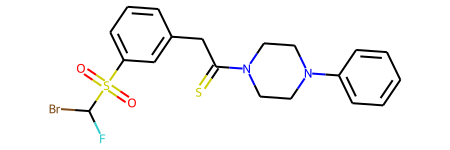

成功生成的高活性分子： O=S(=O)(c1cccc(CC(=S)N2CCN(c3ccccc3)CC2)c1)C(F)Br 
Activity（越大药效越好）: 6.5539 
QED（越大类药性越高）: 0.4904 
SA（越小可合成性越高）: 2.9794 
logP（越大疏水性越好）: 3.8004 
------------------------------------------------------------------------------------------------------------


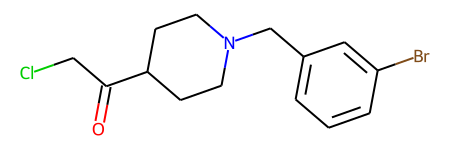

成功生成的高活性分子： O=C(CCl)C1CCN(Cc2cccc(Br)c2)CC1 
Activity（越大药效越好）: 6.8274 
QED（越大类药性越高）: 0.7880 
SA（越小可合成性越高）: 2.0739 
logP（越大疏水性越好）: 3.4690 
------------------------------------------------------------------------------------------------------------


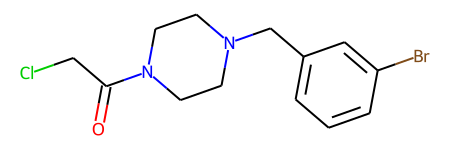

成功生成的高活性分子： O=C(CCl)N1CCN(Cc2cccc(Br)c2)CC1 
Activity（越大药效越好）: 15.7536 
QED（越大类药性越高）: 0.7938 
SA（越小可合成性越高）: 1.9134 
logP（越大疏水性越好）: 2.3321 
------------------------------------------------------------------------------------------------------------


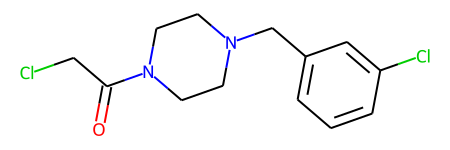

成功生成的高活性分子： O=C(CCl)N1CCN(Cc2cccc(Cl)c2)CC1 
Activity（越大药效越好）: 14.9496 
QED（越大类药性越高）: 0.7959 
SA（越小可合成性越高）: 1.8419 
logP（越大疏水性越好）: 2.2230 
------------------------------------------------------------------------------------------------------------


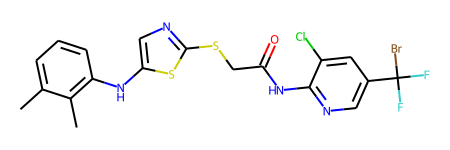

成功生成的高活性分子： Cc1cccc(Nc2cnc(SCC(=O)Nc3ncc(C(F)(F)Br)cc3Cl)s2)c1C 
Activity（越大药效越好）: 23.2317 
QED（越大类药性越高）: 0.2604 
SA（越小可合成性越高）: 2.9987 
logP（越大疏水性越好）: 6.7269 
------------------------------------------------------------------------------------------------------------


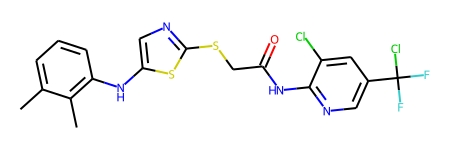

成功生成的高活性分子： Cc1cccc(Nc2cnc(SCC(=O)Nc3ncc(C(F)(F)Cl)cc3Cl)s2)c1C 
Activity（越大药效越好）: 19.4730 
QED（越大类药性越高）: 0.2903 
SA（越小可合成性越高）: 2.9652 
logP（越大疏水性越好）: 6.5708 
------------------------------------------------------------------------------------------------------------


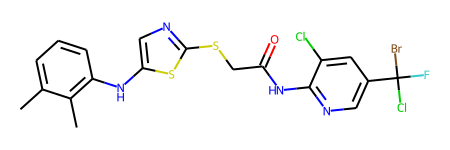

成功生成的高活性分子： Cc1cccc(Nc2cnc(SCC(=O)Nc3ncc(C(F)(Cl)Br)cc3Cl)s2)c1C 
Activity（越大药效越好）: 11.6949 
QED（越大类药性越高）: 0.2452 
SA（越小可合成性越高）: 3.4676 
logP（越大疏水性越好）: 6.9962 
------------------------------------------------------------------------------------------------------------


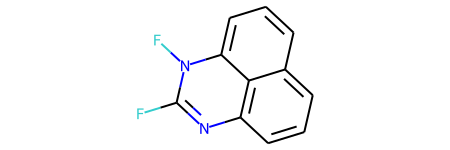

成功生成的高活性分子： FC1=Nc2cccc3cccc(c23)N1F 
Activity（越大药效越好）: 37.0131 
QED（越大类药性越高）: 0.4733 
SA（越小可合成性越高）: 3.0381 
logP（越大疏水性越好）: 3.5013 
------------------------------------------------------------------------------------------------------------


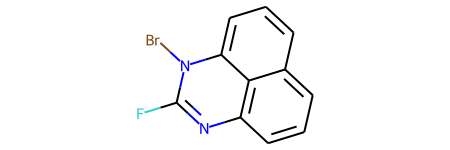

成功生成的高活性分子： FC1=Nc2cccc3cccc(c23)N1Br 
Activity（越大药效越好）: 40.4419 
QED（越大类药性越高）: 0.5202 
SA（越小可合成性越高）: 3.0261 
logP（越大疏水性越好）: 3.9267 
------------------------------------------------------------------------------------------------------------


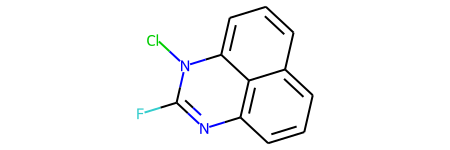

成功生成的高活性分子： FC1=Nc2cccc3cccc(c23)N1Cl 
Activity（越大药效越好）: 36.6710 
QED（越大类药性越高）: 0.4875 
SA（越小可合成性越高）: 3.0090 
logP（越大疏水性越好）: 3.7706 
------------------------------------------------------------------------------------------------------------


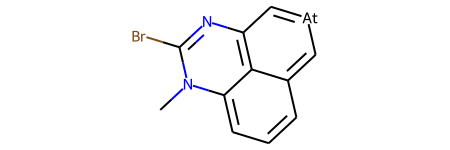

成功生成的高活性分子： CN1C(Br)=NC2=c3c1cccc3=C[At]=C2 
Activity（越大药效越好）: 30.5826 
QED（越大类药性越高）: 0.5218 
SA（越小可合成性越高）: 4.5572 
logP（越大疏水性越好）: 0.6343 
------------------------------------------------------------------------------------------------------------


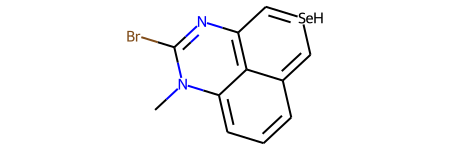

成功生成的高活性分子： CN1C(Br)=NC2=c3c1cccc3=C[SeH]=C2 
Activity（越大药效越好）: 25.7325 
QED（越大类药性越高）: 0.4831 
SA（越小可合成性越高）: 4.5572 
logP（越大疏水性越好）: -0.0142 
------------------------------------------------------------------------------------------------------------


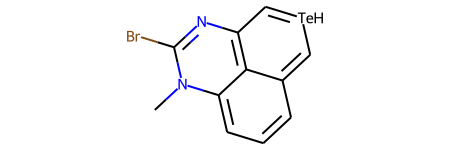

成功生成的高活性分子： CN1C(Br)=NC2=c3c1cccc3=C[TeH]=C2 
Activity（越大药效越好）: 28.2819 
QED（越大类药性越高）: 0.4592 
SA（越小可合成性越高）: 4.5572 
logP（越大疏水性越好）: -0.0142 
------------------------------------------------------------------------------------------------------------


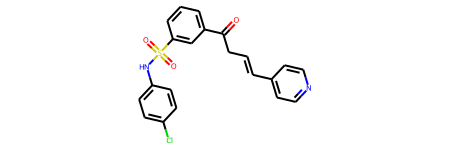

成功生成的高活性分子： O=C(C/C=C/c1ccncc1)c1cccc(S(=O)(=O)Nc2ccc(Cl)cc2)c1 
Activity（越大药效越好）: 59.3723 
QED（越大类药性越高）: 0.5641 
SA（越小可合成性越高）: 2.2694 
logP（越大疏水性越好）: 4.8220 
------------------------------------------------------------------------------------------------------------


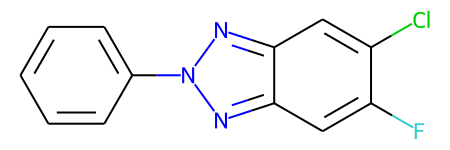

成功生成的高活性分子： Fc1cc2nn(-c3ccccc3)nc2cc1Cl 
Activity（越大药效越好）: 24.8065 
QED（越大类药性越高）: 0.6611 
SA（越小可合成性越高）: 2.0422 
logP（越大疏水性越好）: 3.2130 
------------------------------------------------------------------------------------------------------------


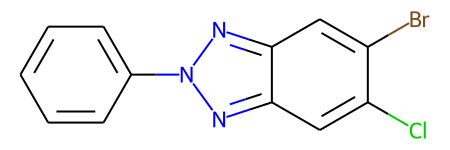

成功生成的高活性分子： Clc1cc2nn(-c3ccccc3)nc2cc1Br 
Activity（越大药效越好）: 26.6475 
QED（越大类药性越高）: 0.6837 
SA（越小可合成性越高）: 2.1646 
logP（越大疏水性越好）: 3.8364 
------------------------------------------------------------------------------------------------------------


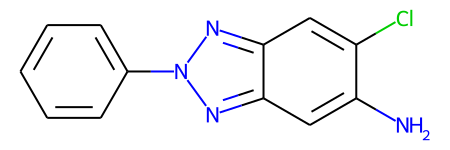

成功生成的高活性分子： Nc1cc2nn(-c3ccccc3)nc2cc1Cl 
Activity（越大药效越好）: 17.2635 
QED（越大类药性越高）: 0.6698 
SA（越小可合成性越高）: 2.1453 
logP（越大疏水性越好）: 2.6561 
------------------------------------------------------------------------------------------------------------


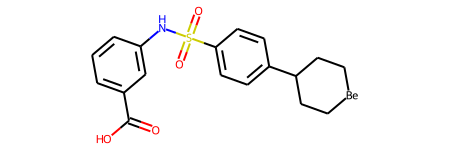

成功生成的高活性分子： O=C(O)c1cccc(NS(=O)(=O)c2ccc(C3CC[Be]CC3)cc2)c1 
Activity（越大药效越好）: 13.3999 
QED（越大类药性越高）: 0.8037 
SA（越小可合成性越高）: 2.8658 
logP（越大疏水性越好）: 3.6038 
------------------------------------------------------------------------------------------------------------


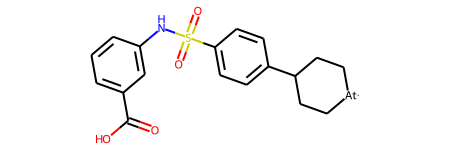

成功生成的高活性分子： O=C(O)c1cccc(NS(=O)(=O)c2ccc(C3CC[At]CC3)cc2)c1 
Activity（越大药效越好）: 15.0815 
QED（越大类药性越高）: 0.5851 
SA（越小可合成性越高）: 2.8658 
logP（越大疏水性越好）: 3.9846 
------------------------------------------------------------------------------------------------------------


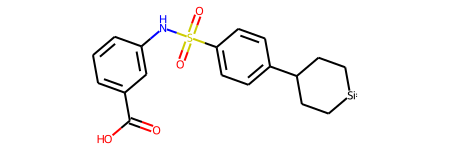

成功生成的高活性分子： O=C(O)c1cccc(NS(=O)(=O)c2ccc(C3CC[Si]CC3)cc2)c1 
Activity（越大药效越好）: 12.0661 
QED（越大类药性越高）: 0.7845 
SA（越小可合成性越高）: 2.8487 
logP（越大疏水性越好）: 3.6038 
------------------------------------------------------------------------------------------------------------


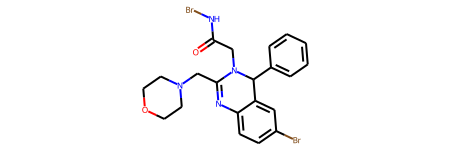

成功生成的高活性分子： O=C(CN1C(CN2CCOCC2)=Nc2ccc(Br)cc2C1c1ccccc1)NBr 
Activity（越大药效越好）: 14.5950 
QED（越大类药性越高）: 0.6102 
SA（越小可合成性越高）: 3.3352 
logP（越大疏水性越好）: 3.6424 
------------------------------------------------------------------------------------------------------------


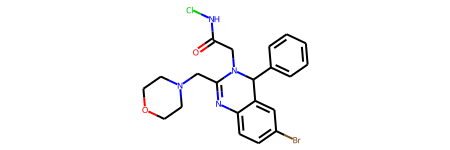

成功生成的高活性分子： O=C(CN1C(CN2CCOCC2)=Nc2ccc(Br)cc2C1c1ccccc1)NCl 
Activity（越大药效越好）: 28.3545 
QED（越大类药性越高）: 0.6700 
SA（越小可合成性越高）: 3.3106 
logP（越大疏水性越好）: 3.4863 
------------------------------------------------------------------------------------------------------------


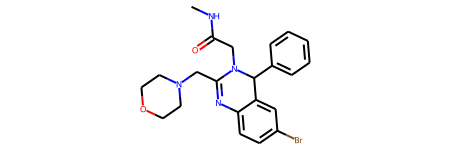

成功生成的高活性分子： CNC(=O)CN1C(CN2CCOCC2)=Nc2ccc(Br)cc2C1c1ccccc1 
Activity（越大药效越好）: 20.4117 
QED（越大类药性越高）: 0.7506 
SA（越小可合成性越高）: 3.1056 
logP（越大疏水性越好）: 2.9623 
------------------------------------------------------------------------------------------------------------


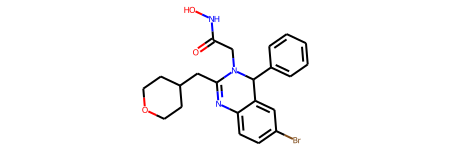

成功生成的高活性分子： O=C(CN1C(CC2CCOCC2)=Nc2ccc(Br)cc2C1c1ccccc1)NO 
Activity（越大药效越好）: 19.7682 
QED（越大类药性越高）: 0.5204 
SA（越小可合成性越高）: 3.2811 
logP（越大疏水性越好）: 4.2062 
------------------------------------------------------------------------------------------------------------


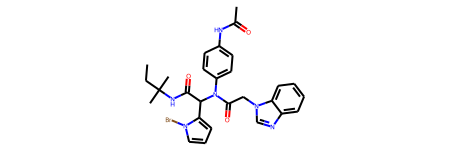

成功生成的高活性分子： CCC(C)(C)NC(=O)C(c1cccn1Br)N(C(=O)Cn1cnc2ccccc21)c1ccc(NC(C)=O)cc1 
Activity（越大药效越好）: 42.9902 
QED（越大类药性越高）: 0.2905 
SA（越小可合成性越高）: 3.4219 
logP（越大疏水性越好）: 5.0335 
------------------------------------------------------------------------------------------------------------


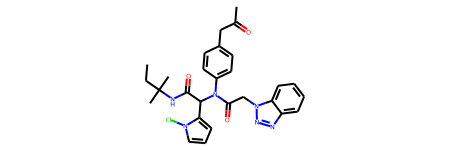

成功生成的高活性分子： CCC(C)(C)NC(=O)C(c1cccn1Cl)N(C(=O)Cn1nnc2ccccc21)c1ccc(CC(C)=O)cc1 
Activity（越大药效越好）: 41.7355 
QED（越大类药性越高）: 0.3238 
SA（越小可合成性越高）: 3.4774 
logP（越大疏水性越好）: 4.4455 
------------------------------------------------------------------------------------------------------------


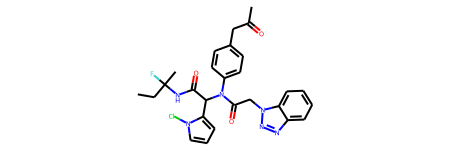

成功生成的高活性分子： CCC(C)(F)NC(=O)C(c1cccn1Cl)N(C(=O)Cn1nnc2ccccc21)c1ccc(CC(C)=O)cc1 
Activity（越大药效越好）: 25.4495 
QED（越大类药性越高）: 0.3024 
SA（越小可合成性越高）: 3.9064 
logP（越大疏水性越好）: 4.3526 
------------------------------------------------------------------------------------------------------------


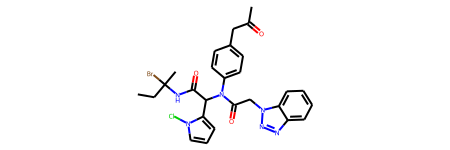

成功生成的高活性分子： CCC(C)(Br)NC(=O)C(c1cccn1Cl)N(C(=O)Cn1nnc2ccccc21)c1ccc(CC(C)=O)cc1 
Activity（越大药效越好）: 26.6804 
QED（越大类药性越高）: 0.2089 
SA（越小可合成性越高）: 3.9594 
logP（越大疏水性越好）: 4.7780 
------------------------------------------------------------------------------------------------------------


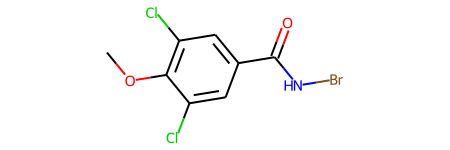

成功生成的高活性分子： COc1c(Cl)cc(C(=O)NBr)cc1Cl 
Activity（越大药效越好）: 14.3961 
QED（越大类药性越高）: 0.8524 
SA（越小可合成性越高）: 2.4692 
logP（越大疏水性越好）: 3.0417 
------------------------------------------------------------------------------------------------------------


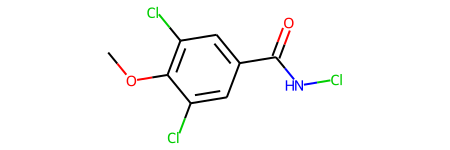

成功生成的高活性分子： COc1c(Cl)cc(C(=O)NCl)cc1Cl 
Activity（越大药效越好）: 21.4964 
QED（越大类药性越高）: 0.8243 
SA（越小可合成性越高）: 2.3366 
logP（越大疏水性越好）: 2.8856 
------------------------------------------------------------------------------------------------------------


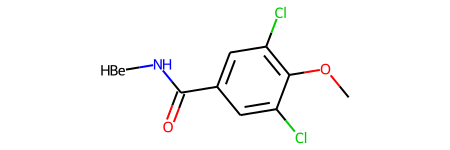

成功生成的高活性分子： [BeH]NC(=O)c1cc(Cl)c(OC)c(Cl)c1 
Activity（越大药效越好）: 18.4498 
QED（越大类药性越高）: 0.7810 
SA（越小可合成性越高）: 2.8004 
logP（越大疏水性越好）: 1.5476 
------------------------------------------------------------------------------------------------------------


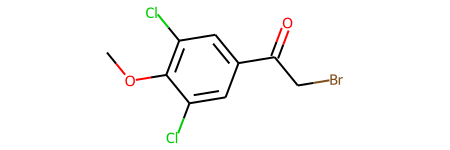

成功生成的高活性分子： COc1c(Cl)cc(C(=O)CBr)cc1Cl 
Activity（越大药效越好）: 35.7174 
QED（越大类药性越高）: 0.6295 
SA（越小可合成性越高）: 2.1900 
logP（越大疏水性越好）: 3.5796 
------------------------------------------------------------------------------------------------------------


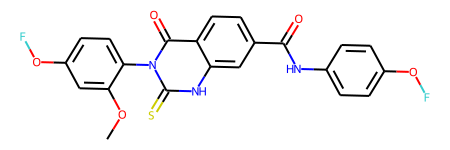

成功生成的高活性分子： COc1cc(OF)ccc1-n1c(=S)[nH]c2cc(C(=O)Nc3ccc(OF)cc3)ccc2c1=O 
Activity（越大药效越好）: 13.1582 
QED（越大类药性越高）: 0.3912 
SA（越小可合成性越高）: 2.7452 
logP（越大疏水性越好）: 4.8358 
------------------------------------------------------------------------------------------------------------


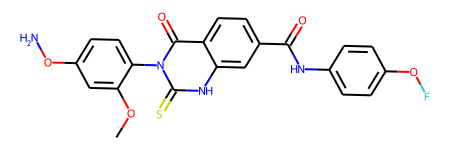

成功生成的高活性分子： COc1cc(ON)ccc1-n1c(=S)[nH]c2cc(C(=O)Nc3ccc(OF)cc3)ccc2c1=O 
Activity（越大药效越好）: 7.0270 
QED（越大类药性越高）: 0.2905 
SA（越小可合成性越高）: 2.7030 
logP（越大疏水性越好）: 3.8250 
------------------------------------------------------------------------------------------------------------


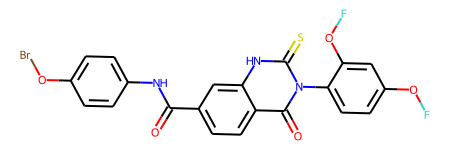

成功生成的高活性分子： O=C(Nc1ccc(OBr)cc1)c1ccc2c(=O)n(-c3ccc(OF)cc3OF)c(=S)[nH]c2c1 
Activity（越大药效越好）: 15.4268 
QED（越大类药性越高）: 0.3157 
SA（越小可合成性越高）: 3.0539 
logP（越大疏水性越好）: 5.5159 
------------------------------------------------------------------------------------------------------------


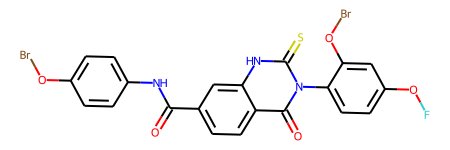

成功生成的高活性分子： O=C(Nc1ccc(OBr)cc1)c1ccc2c(=O)n(-c3ccc(OF)cc3OBr)c(=S)[nH]c2c1 
Activity（越大药效越好）: 18.9832 
QED（越大类药性越高）: 0.2675 
SA（越小可合成性越高）: 3.1049 
logP（越大疏水性越好）: 5.9413 
------------------------------------------------------------------------------------------------------------


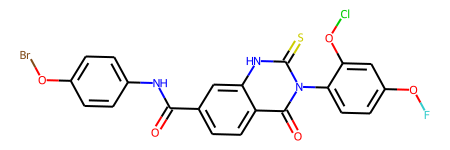

成功生成的高活性分子： O=C(Nc1ccc(OBr)cc1)c1ccc2c(=O)n(-c3ccc(OF)cc3OCl)c(=S)[nH]c2c1 
Activity（越大药效越好）: 7.0548 
QED（越大类药性越高）: 0.2944 
SA（越小可合成性越高）: 3.0417 
logP（越大疏水性越好）: 5.7852 
------------------------------------------------------------------------------------------------------------


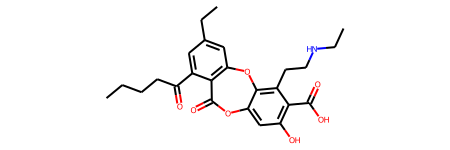

成功生成的高活性分子： CCCCC(=O)c1cc(CC)cc2c1C(=O)Oc1cc(O)c(C(=O)O)c(CCNCC)c1O2 
Activity（越大药效越好）: 31.0210 
QED（越大类药性越高）: 0.2071 
SA（越小可合成性越高）: 3.1157 
logP（越大疏水性越好）: 4.5026 
------------------------------------------------------------------------------------------------------------


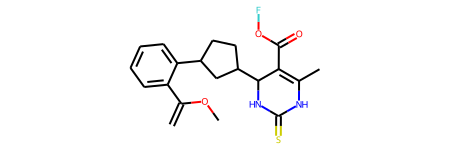

成功生成的高活性分子： C=C(OC)c1ccccc1C1CCC(C2NC(=S)NC(C)=C2C(=O)OF)C1 
Activity（越大药效越好）: 9.7577 
QED（越大类药性越高）: 0.5901 
SA（越小可合成性越高）: 4.1026 
logP（越大疏水性越好）: 3.7354 
------------------------------------------------------------------------------------------------------------


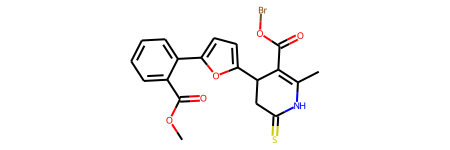

成功生成的高活性分子： COC(=O)c1ccccc1-c1ccc(C2CC(=S)NC(C)=C2C(=O)OBr)o1 
Activity（越大药效越好）: 24.0344 
QED（越大类药性越高）: 0.5510 
SA（越小可合成性越高）: 3.5245 
logP（越大疏水性越好）: 4.2646 
------------------------------------------------------------------------------------------------------------


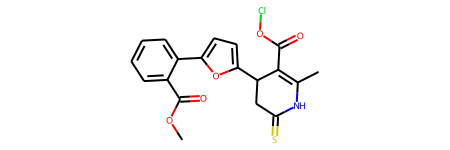

成功生成的高活性分子： COC(=O)c1ccccc1-c1ccc(C2CC(=S)NC(C)=C2C(=O)OCl)o1 
Activity（越大药效越好）: 21.1617 
QED（越大类药性越高）: 0.6054 
SA（越小可合成性越高）: 3.4940 
logP（越大疏水性越好）: 4.1085 
------------------------------------------------------------------------------------------------------------


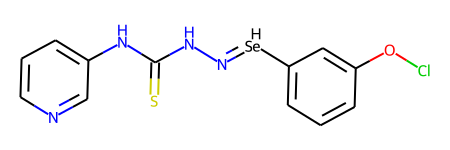

成功生成的高活性分子： S=C(N/N=[SeH]/c1cccc(OCl)c1)Nc1cccnc1 
Activity（越大药效越好）: 30.7734 
QED（越大类药性越高）: 0.4858 
SA（越小可合成性越高）: 3.6116 
logP（越大疏水性越好）: 1.7612 
------------------------------------------------------------------------------------------------------------


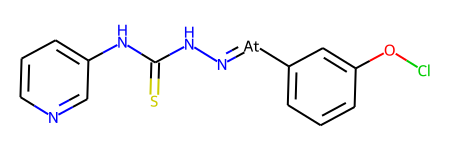

成功生成的高活性分子： S=C(N/N=[At]/c1cccc(OCl)c1)Nc1cccnc1 
Activity（越大药效越好）: 27.8368 
QED（越大类药性越高）: 0.4958 
SA（越小可合成性越高）: 3.6116 
logP（越大疏水性越好）: 2.4097 
------------------------------------------------------------------------------------------------------------


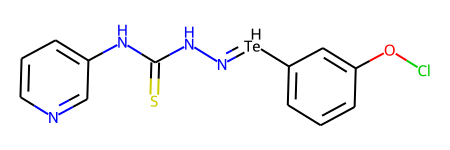

成功生成的高活性分子： S=C(N/N=[TeH]/c1cccc(OCl)c1)Nc1cccnc1 
Activity（越大药效越好）: 29.4693 
QED（越大类药性越高）: 0.4470 
SA（越小可合成性越高）: 3.6116 
logP（越大疏水性越好）: 1.7612 
------------------------------------------------------------------------------------------------------------


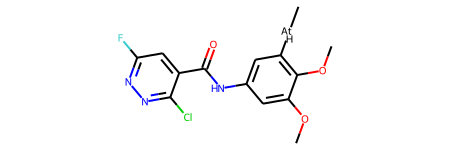

成功生成的高活性分子： COc1cc(NC(=O)c2cc(F)nnc2Cl)cc([AtH]C)c1OC 
Activity（越大药效越好）: 20.1745 
QED（越大类药性越高）: 0.6333 
SA（越小可合成性越高）: 3.3466 
logP（越大疏水性越好）: 2.0293 
------------------------------------------------------------------------------------------------------------


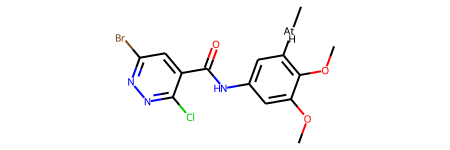

成功生成的高活性分子： COc1cc(NC(=O)c2cc(Br)nnc2Cl)cc([AtH]C)c1OC 
Activity（越大药效越好）: 20.7641 
QED（越大类药性越高）: 0.5743 
SA（越小可合成性越高）: 3.3533 
logP（越大疏水性越好）: 2.6527 
------------------------------------------------------------------------------------------------------------


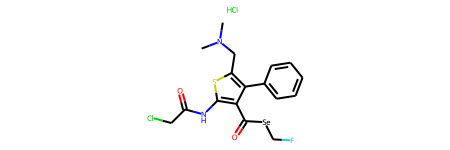

成功生成的高活性分子： CN(C)Cc1sc(NC(=O)CCl)c(C(=O)[Se]CF)c1-c1ccccc1.Cl 
Activity（越大药效越好）: 43.5625 
QED（越大类药性越高）: 0.4579 
SA（越小可合成性越高）: 3.2366 
logP（越大疏水性越好）: 3.8472 
------------------------------------------------------------------------------------------------------------


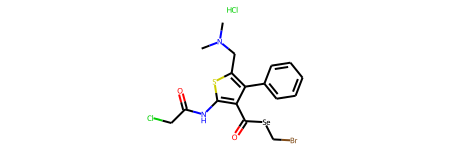

成功生成的高活性分子： CN(C)Cc1sc(NC(=O)CCl)c(C(=O)[Se]CBr)c1-c1ccccc1.Cl 
Activity（越大药效越好）: 44.5520 
QED（越大类药性越高）: 0.3987 
SA（越小可合成性越高）: 3.2397 
logP（越大疏水性越好）: 4.2726 
------------------------------------------------------------------------------------------------------------


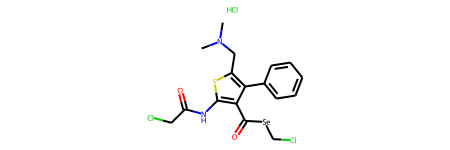

成功生成的高活性分子： CN(C)Cc1sc(NC(=O)CCl)c(C(=O)[Se]CCl)c1-c1ccccc1.Cl 
Activity（越大药效越好）: 52.1611 
QED（越大类药性越高）: 0.4383 
SA（越小可合成性越高）: 3.1888 
logP（越大疏水性越好）: 4.1165 
------------------------------------------------------------------------------------------------------------


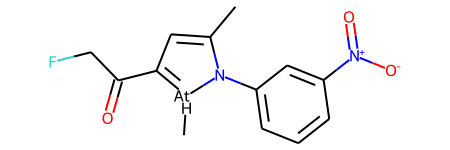

成功生成的高活性分子： CC1=CC(C(=O)CF)=[AtH](C)N1c1cccc([N+](=O)[O-])c1 
Activity（越大药效越好）: 23.6944 
QED（越大类药性越高）: 0.4959 
SA（越小可合成性越高）: 4.1994 
logP（越大疏水性越好）: 2.3457 
------------------------------------------------------------------------------------------------------------


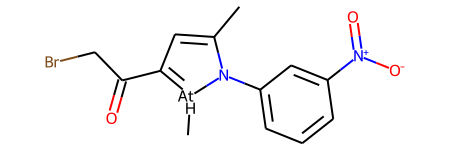

成功生成的高活性分子： CC1=CC(C(=O)CBr)=[AtH](C)N1c1cccc([N+](=O)[O-])c1 
Activity（越大药效越好）: 28.8663 
QED（越大类药性越高）: 0.3378 
SA（越小可合成性越高）: 4.1579 
logP（越大疏水性越好）: 2.7711 
------------------------------------------------------------------------------------------------------------


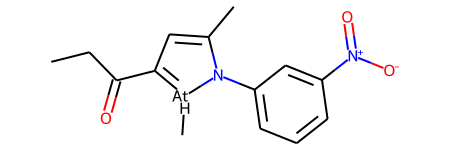

成功生成的高活性分子： CCC(=O)C1=[AtH](C)N(c2cccc([N+](=O)[O-])c2)C(C)=C1 
Activity（越大药效越好）: 27.2596 
QED（越大类药性越高）: 0.5008 
SA（越小可合成性越高）: 4.0253 
logP（越大疏水性越好）: 2.7862 
------------------------------------------------------------------------------------------------------------


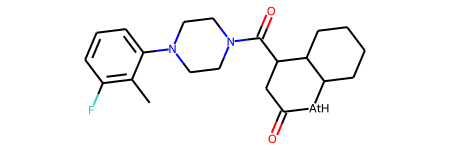

成功生成的高活性分子： Cc1c(F)cccc1N1CCN(C(=O)C2CC(=O)[AtH]C3CCCCC32)CC1 
Activity（越大药效越好）: 5.6227 
QED（越大类药性越高）: 0.5502 
SA（越小可合成性越高）: 4.0757 
logP（越大疏水性越好）: 3.1252 
------------------------------------------------------------------------------------------------------------


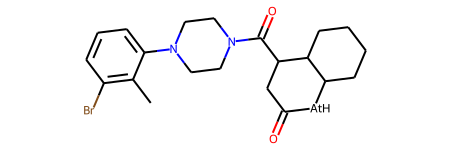

成功生成的高活性分子： Cc1c(Br)cccc1N1CCN(C(=O)C2CC(=O)[AtH]C3CCCCC32)CC1 
Activity（越大药效越好）: 9.2659 
QED（越大类药性越高）: 0.5006 
SA（越小可合成性越高）: 4.1269 
logP（越大疏水性越好）: 3.7486 
------------------------------------------------------------------------------------------------------------


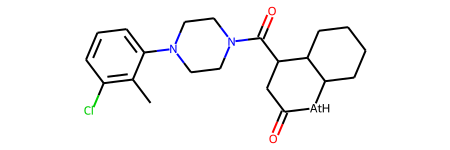

成功生成的高活性分子： Cc1c(Cl)cccc1N1CCN(C(=O)C2CC(=O)[AtH]C3CCCCC32)CC1 
Activity（越大药效越好）: 18.0896 
QED（越大类药性越高）: 0.5324 
SA（越小可合成性越高）: 4.0343 
logP（越大疏水性越好）: 3.6395 
------------------------------------------------------------------------------------------------------------


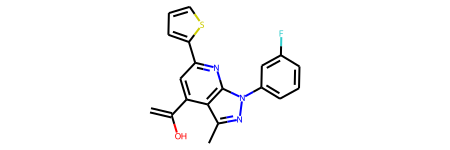

成功生成的高活性分子： C=C(O)c1cc(-c2cccs2)nc2c1c(C)nn2-c1cccc(F)c1 
Activity（越大药效越好）: 17.0803 
QED（越大类药性越高）: 0.5209 
SA（越小可合成性越高）: 2.5279 
logP（越大疏水性越好）: 5.1252 
------------------------------------------------------------------------------------------------------------


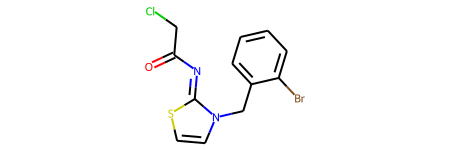

成功生成的高活性分子： O=C(CCl)N=c1sccn1Cc1ccccc1Br 
Activity（越大药效越好）: 37.9642 
QED（越大类药性越高）: 0.7874 
SA（越小可合成性越高）: 2.6051 
logP（越大疏水性越好）: 3.0265 
------------------------------------------------------------------------------------------------------------


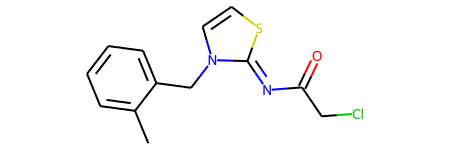

成功生成的高活性分子： Cc1ccccc1Cn1ccsc1=NC(=O)CCl 
Activity（越大药效越好）: 32.2521 
QED（越大类药性越高）: 0.7959 
SA（越小可合成性越高）: 2.4891 
logP（越大疏水性越好）: 2.5724 
------------------------------------------------------------------------------------------------------------


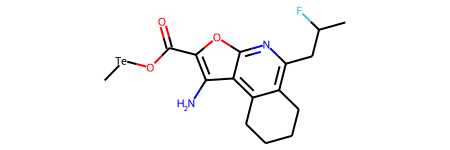

成功生成的高活性分子： C[Te]OC(=O)c1oc2nc(CC(C)F)c3c(c2c1N)CCCC3 
Activity（越大药效越好）: -6.9246 
QED（越大类药性越高）: 0.7497 
SA（越小可合成性越高）: 4.2141 
logP（越大疏水性越好）: 3.0134 
------------------------------------------------------------------------------------------------------------


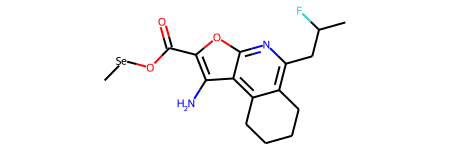

成功生成的高活性分子： C[Se]OC(=O)c1oc2nc(CC(C)F)c3c(c2c1N)CCCC3 
Activity（越大药效越好）: -9.4026 
QED（越大类药性越高）: 0.8190 
SA（越小可合成性越高）: 4.1708 
logP（越大疏水性越好）: 3.0134 
------------------------------------------------------------------------------------------------------------


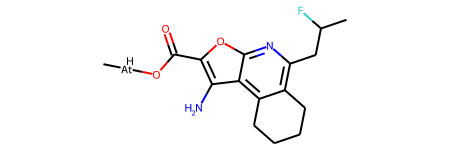

成功生成的高活性分子： C[AtH]OC(=O)c1oc2nc(CC(C)F)c3c(c2c1N)CCCC3 
Activity（越大药效越好）: -10.8100 
QED（越大类药性越高）: 0.6749 
SA（越小可合成性越高）: 4.2932 
logP（越大疏水性越好）: 3.1265 
------------------------------------------------------------------------------------------------------------


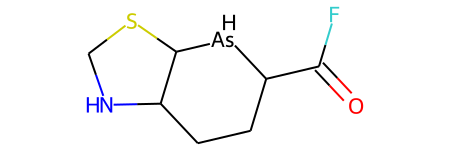

成功生成的高活性分子： O=C(F)C1CCC2NCSC2[AsH]1 
Activity（越大药效越好）: -29.3399 
QED（越大类药性越高）: 0.5430 
SA（越小可合成性越高）: 6.1318 
logP（越大疏水性越好）: 0.4899 
------------------------------------------------------------------------------------------------------------


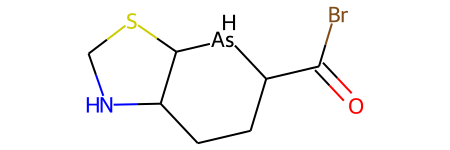

成功生成的高活性分子： O=C(Br)C1CCC2NCSC2[AsH]1 
Activity（越大药效越好）: -19.0022 
QED（越大类药性越高）: 0.5765 
SA（越小可合成性越高）: 6.1596 
logP（越大疏水性越好）: 0.9153 
------------------------------------------------------------------------------------------------------------


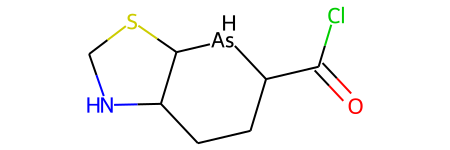

成功生成的高活性分子： O=C(Cl)C1CCC2NCSC2[AsH]1 
Activity（越大药效越好）: -14.3685 
QED（越大类药性越高）: 0.5618 
SA（越小可合成性越高）: 6.0485 
logP（越大疏水性越好）: 0.7592 
------------------------------------------------------------------------------------------------------------


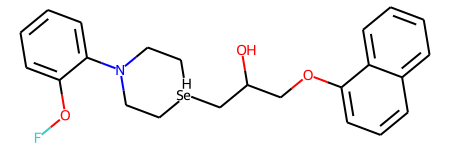

成功生成的高活性分子： OC(COc1cccc2ccccc12)C[SeH]1CCN(c2ccccc2OF)CC1 
Activity（越大药效越好）: 8.2455 
QED（越大类药性越高）: 0.5220 
SA（越小可合成性越高）: 3.7403 
logP（越大疏水性越好）: 4.5901 
------------------------------------------------------------------------------------------------------------


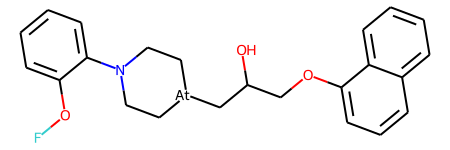

成功生成的高活性分子： OC(COc1cccc2ccccc12)C[At]1CCN(c2ccccc2OF)CC1 
Activity（越大药效越好）: 5.3181 
QED（越大类药性越高）: 0.4080 
SA（越小可合成性越高）: 3.7403 
logP（越大疏水性越好）: 5.2386 
------------------------------------------------------------------------------------------------------------


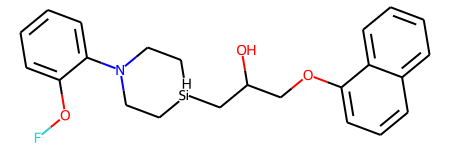

成功生成的高活性分子： OC(COc1cccc2ccccc12)C[SiH]1CCN(c2ccccc2OF)CC1 
Activity（越大药效越好）: 4.7418 
QED（越大类药性越高）: 0.5776 
SA（越小可合成性越高）: 3.5840 
logP（越大疏水性越好）: 4.5901 
------------------------------------------------------------------------------------------------------------


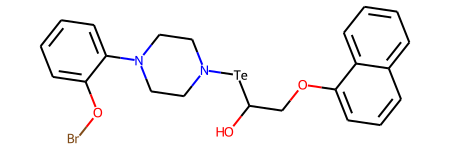

成功生成的高活性分子： OC(COc1cccc2ccccc12)[Te]N1CCN(c2ccccc2OBr)CC1 
Activity（越大药效越好）: 12.4349 
QED（越大类药性越高）: 0.4395 
SA（越小可合成性越高）: 3.5377 
logP（越大疏水性越好）: 3.6671 
------------------------------------------------------------------------------------------------------------


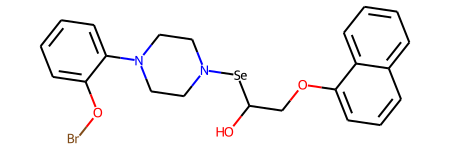

成功生成的高活性分子： OC(COc1cccc2ccccc12)[Se]N1CCN(c2ccccc2OBr)CC1 
Activity（越大药效越好）: 16.0555 
QED（越大类药性越高）: 0.4805 
SA（越小可合成性越高）: 3.4774 
logP（越大疏水性越好）: 3.6671 
------------------------------------------------------------------------------------------------------------


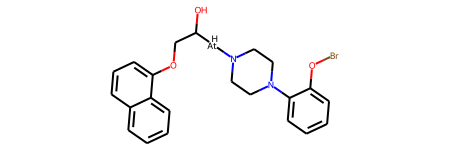

成功生成的高活性分子： OC(COc1cccc2ccccc12)[AtH]N1CCN(c2ccccc2OBr)CC1 
Activity（越大药效越好）: 7.8376 
QED（越大类药性越高）: 0.4209 
SA（越小可合成性越高）: 3.5752 
logP（越大疏水性越好）: 3.7802 
------------------------------------------------------------------------------------------------------------


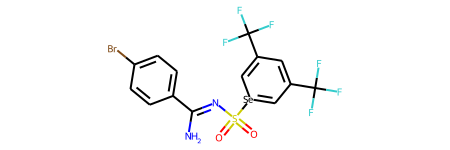

成功生成的高活性分子： N/C(=N\S(=O)(=O)[Se]1=CC(C(F)(F)F)=CC(C(F)(F)F)=C1)c1ccc(Br)cc1 
Activity（越大药效越好）: 8.5743 
QED（越大类药性越高）: 0.2758 
SA（越小可合成性越高）: 4.2207 
logP（越大疏水性越好）: 3.3898 
------------------------------------------------------------------------------------------------------------


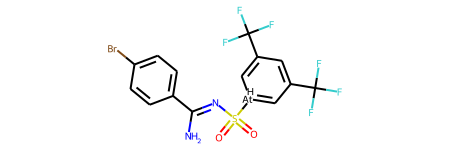

成功生成的高活性分子： N/C(=N\S(=O)(=O)[AtH]1=CC(C(F)(F)F)=CC(C(F)(F)F)=C1)c1ccc(Br)cc1 
Activity（越大药效越好）: 11.0032 
QED（越大类药性越高）: 0.3036 
SA（越小可合成性越高）: 4.2529 
logP（越大疏水性越好）: 3.5029 
------------------------------------------------------------------------------------------------------------


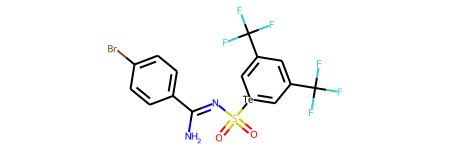

成功生成的高活性分子： N/C(=N\S(=O)(=O)[Te]1=CC(C(F)(F)F)=CC(C(F)(F)F)=C1)c1ccc(Br)cc1 
Activity（越大药效越好）: 8.7808 
QED（越大类药性越高）: 0.2540 
SA（越小可合成性越高）: 3.8361 
logP（越大疏水性越好）: 3.3898 
------------------------------------------------------------------------------------------------------------


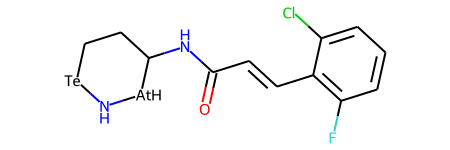

成功生成的高活性分子： O=C(/C=C/c1c(F)cccc1Cl)NC1CC[Te]N[AtH]1 
Activity（越大药效越好）: 11.1966 
QED（越大类药性越高）: 0.4145 
SA（越小可合成性越高）: 4.4651 
logP（越大疏水性越好）: 1.6977 
------------------------------------------------------------------------------------------------------------


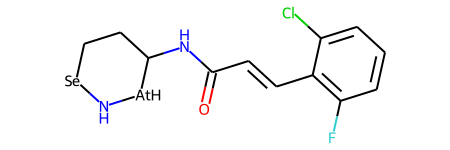

成功生成的高活性分子： O=C(/C=C/c1c(F)cccc1Cl)NC1CC[Se]N[AtH]1 
Activity（越大药效越好）: 9.7867 
QED（越大类药性越高）: 0.4496 
SA（越小可合成性越高）: 4.3920 
logP（越大疏水性越好）: 1.6977 
------------------------------------------------------------------------------------------------------------


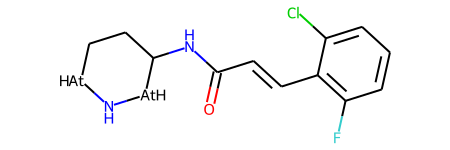

成功生成的高活性分子： O=C(/C=C/c1c(F)cccc1Cl)NC1CC[AtH]N[AtH]1 
Activity（越大药效越好）: 14.8160 
QED（越大类药性越高）: 0.4805 
SA（越小可合成性越高）: 4.5177 
logP（越大疏水性越好）: 1.8108 
------------------------------------------------------------------------------------------------------------


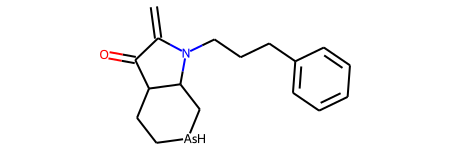

成功生成的高活性分子： C=C1C(=O)C2CC[AsH]CC2N1CCCc1ccccc1 
Activity（越大药效越好）: 14.2173 
QED（越大类药性越高）: 0.6245 
SA（越小可合成性越高）: 4.3600 
logP（越大疏水性越好）: 2.6792 
------------------------------------------------------------------------------------------------------------


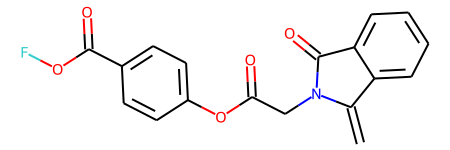

成功生成的高活性分子： C=C1c2ccccc2C(=O)N1CC(=O)Oc1ccc(C(=O)OF)cc1 
Activity（越大药效越好）: 14.1555 
QED（越大类药性越高）: 0.6315 
SA（越小可合成性越高）: 2.4062 
logP（越大疏水性越好）: 2.7600 
------------------------------------------------------------------------------------------------------------


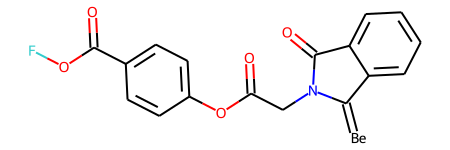

成功生成的高活性分子： [Be]=C1c2ccccc2C(=O)N1CC(=O)Oc1ccc(C(=O)OF)cc1 
Activity（越大药效越好）: 13.0240 
QED（越大类药性越高）: 0.4798 
SA（越小可合成性越高）: 2.8127 
logP（越大疏水性越好）: 1.4358 
------------------------------------------------------------------------------------------------------------


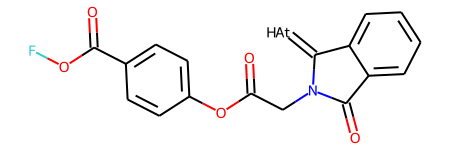

成功生成的高活性分子： O=C(CN1C(=O)c2ccccc2C1=[AtH])Oc1ccc(C(=O)OF)cc1 
Activity（越大药效越好）: 15.7031 
QED（越大类药性越高）: 0.4368 
SA（越小可合成性越高）: 2.8127 
logP（越大疏水性越好）: 1.5489 
------------------------------------------------------------------------------------------------------------


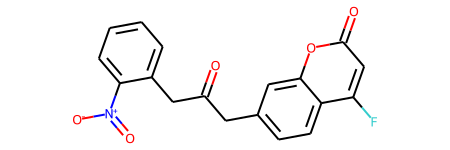

成功生成的高活性分子： O=C(Cc1ccc2c(F)cc(=O)oc2c1)Cc1ccccc1[N+](=O)[O-] 
Activity（越大药效越好）: 27.2954 
QED（越大类药性越高）: 0.4037 
SA（越小可合成性越高）: 2.4106 
logP（越大疏水性越好）: 3.1946 
------------------------------------------------------------------------------------------------------------


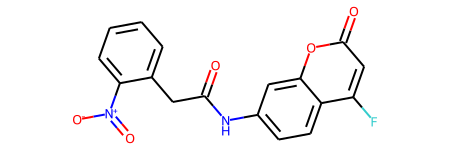

成功生成的高活性分子： O=C(Cc1ccccc1[N+](=O)[O-])Nc1ccc2c(F)cc(=O)oc2c1 
Activity（越大药效越好）: 23.4778 
QED（越大类药性越高）: 0.4459 
SA（越小可合成性越高）: 2.2412 
logP（越大疏水性越好）: 3.0215 
------------------------------------------------------------------------------------------------------------


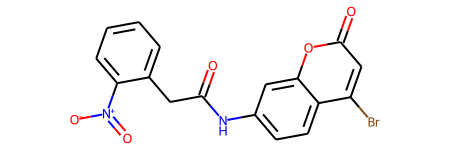

成功生成的高活性分子： O=C(Cc1ccccc1[N+](=O)[O-])Nc1ccc2c(Br)cc(=O)oc2c1 
Activity（越大药效越好）: 27.8009 
QED（越大类药性越高）: 0.4071 
SA（越小可合成性越高）: 2.2996 
logP（越大疏水性越好）: 3.6449 
------------------------------------------------------------------------------------------------------------


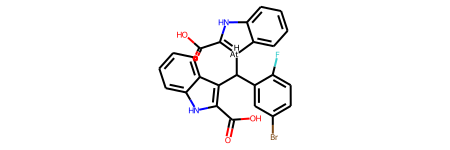

成功生成的高活性分子： O=C(O)C1=[AtH](C(c2cc(Br)ccc2F)c2c(C(=O)O)[nH]c3ccccc23)c2ccccc2N1 
Activity（越大药效越好）: 11.7149 
QED（越大类药性越高）: 0.2499 
SA（越小可合成性越高）: 4.1565 
logP（越大疏水性越好）: 4.1756 
------------------------------------------------------------------------------------------------------------


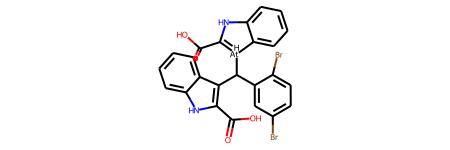

成功生成的高活性分子： O=C(O)C1=[AtH](C(c2cc(Br)ccc2Br)c2c(C(=O)O)[nH]c3ccccc23)c2ccccc2N1 
Activity（越大药效越好）: 15.7161 
QED（越大类药性越高）: 0.2342 
SA（越小可合成性越高）: 4.1923 
logP（越大疏水性越好）: 4.7990 
------------------------------------------------------------------------------------------------------------


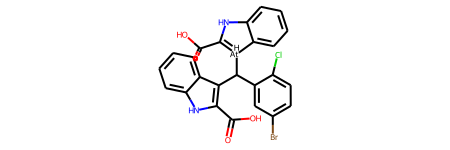

成功生成的高活性分子： O=C(O)C1=[AtH](C(c2cc(Br)ccc2Cl)c2c(C(=O)O)[nH]c3ccccc23)c2ccccc2N1 
Activity（越大药效越好）: 10.8961 
QED（越大类药性越高）: 0.2398 
SA（越小可合成性越高）: 4.1474 
logP（越大疏水性越好）: 4.6899 
------------------------------------------------------------------------------------------------------------


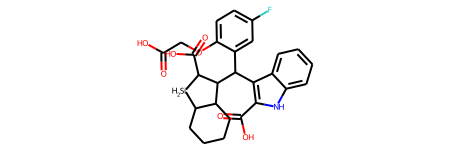

成功生成的高活性分子： O=C(O)COc1ccc(F)cc1C(c1c(C(=O)O)[nH]c2ccccc12)C1C(C(=O)O)[SiH2]C2CCCCC21 
Activity（越大药效越好）: -7.7975 
QED（越大类药性越高）: 0.3228 
SA（越小可合成性越高）: 4.5776 
logP（越大疏水性越好）: 4.2509 
------------------------------------------------------------------------------------------------------------


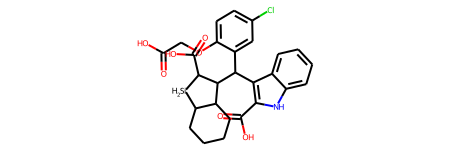

成功生成的高活性分子： O=C(O)COc1ccc(Cl)cc1C(c1c(C(=O)O)[nH]c2ccccc12)C1C(C(=O)O)[SiH2]C2CCCCC21 
Activity（越大药效越好）: 0.2254 
QED（越大类药性越高）: 0.3015 
SA（越小可合成性越高）: 4.5737 
logP（越大疏水性越好）: 4.7652 
------------------------------------------------------------------------------------------------------------


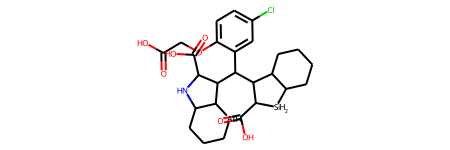

成功生成的高活性分子： O=C(O)COc1ccc(Cl)cc1C(C1C(C(=O)O)[SiH2]C2CCCCC21)C1C(C(=O)O)NC2CCC[AtH]C21 
Activity（越大药效越好）: -27.7178 
QED（越大类药性越高）: 0.2981 
SA（越小可合成性越高）: 5.7659 
logP（越大疏水性越好）: 3.3965 
------------------------------------------------------------------------------------------------------------


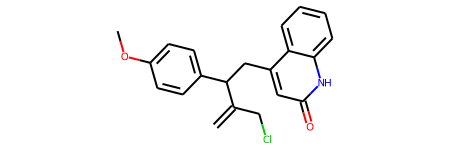

成功生成的高活性分子： C=C(CCl)C(Cc1cc(=O)[nH]c2ccccc12)c1ccc(OC)cc1 
Activity（越大药效越好）: 53.6848 
QED（越大类药性越高）: 0.5171 
SA（越小可合成性越高）: 2.8996 
logP（越大疏水性越好）: 4.6580 
------------------------------------------------------------------------------------------------------------


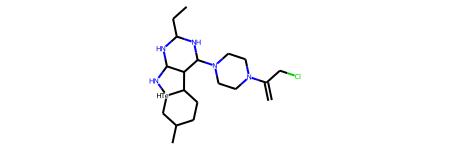

成功生成的高活性分子： C=C(CCl)N1CCN(C2NC(CC)NC3N[TeH]4CC(C)CCC4C32)CC1 
Activity（越大药效越好）: 27.7911 
QED（越大类药性越高）: 0.4077 
SA（越小可合成性越高）: 5.9629 
logP（越大疏水性越好）: 1.6809 
------------------------------------------------------------------------------------------------------------


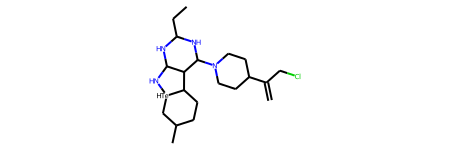

成功生成的高活性分子： C=C(CCl)C1CCN(C2NC(CC)NC3N[TeH]4CC(C)CCC4C32)CC1 
Activity（越大药效越好）: 30.1044 
QED（越大类药性越高）: 0.3182 
SA（越小可合成性越高）: 5.9749 
logP（越大疏水性越好）: 2.8178 
------------------------------------------------------------------------------------------------------------


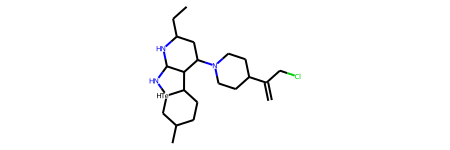

成功生成的高活性分子： C=C(CCl)C1CCN(C2CC(CC)NC3N[TeH]4CC(C)CCC4C32)CC1 
Activity（越大药效越好）: 23.0939 
QED（越大类药性越高）: 0.3539 
SA（越小可合成性越高）: 5.7698 
logP（越大疏水性越好）: 3.7033 
------------------------------------------------------------------------------------------------------------


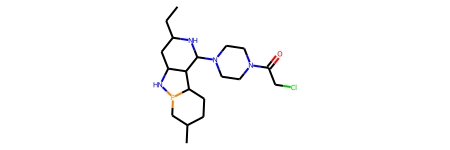

成功生成的高活性分子： CCC1CC2NP3CC(C)CCC3C2C(N2CCN(C(=O)CCl)CC2)N1 
Activity（越大药效越好）: 5.2817 
QED（越大类药性越高）: 0.5632 
SA（越小可合成性越高）: 5.3602 
logP（越大疏水性越好）: 2.2508 
------------------------------------------------------------------------------------------------------------


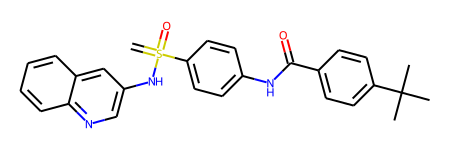

成功生成的高活性分子： C=S(=O)(Nc1cnc2ccccc2c1)c1ccc(NC(=O)c2ccc(C(C)(C)C)cc2)cc1 
Activity（越大药效越好）: 19.3473 
QED（越大类药性越高）: 0.3673 
SA（越小可合成性越高）: 2.8204 
logP（越大疏水性越好）: 5.8870 
------------------------------------------------------------------------------------------------------------


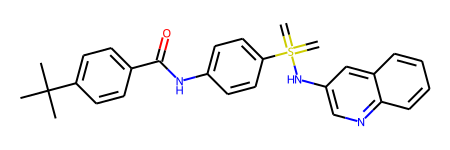

成功生成的高活性分子： C=S(=C)(Nc1cnc2ccccc2c1)c1ccc(NC(=O)c2ccc(C(C)(C)C)cc2)cc1 
Activity（越大药效越好）: 25.6786 
QED（越大类药性越高）: 0.3240 
SA（越小可合成性越高）: 2.4686 
logP（越大疏水性越好）: 6.8392 
------------------------------------------------------------------------------------------------------------


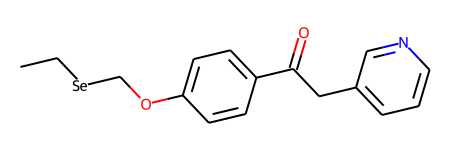

成功生成的高活性分子： CC[Se]COc1ccc(C(=O)Cc2cccnc2)cc1 
Activity（越大药效越好）: 18.4946 
QED（越大类药性越高）: 0.4439 
SA（越小可合成性越高）: 2.5915 
logP（越大疏水性越好）: 2.9857 
------------------------------------------------------------------------------------------------------------


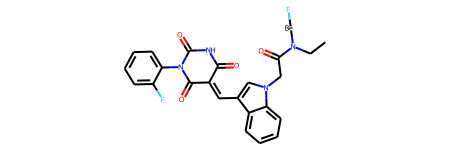

成功生成的高活性分子： CCN([Be]F)C(=O)Cn1cc(/C=C2\C(=O)NC(=O)N(c3ccccc3F)C2=O)c2ccccc21 
Activity（越大药效越好）: 15.7084 
QED（越大类药性越高）: 0.3473 
SA（越小可合成性越高）: 3.1364 
logP（越大疏水性越好）: 2.7990 
------------------------------------------------------------------------------------------------------------


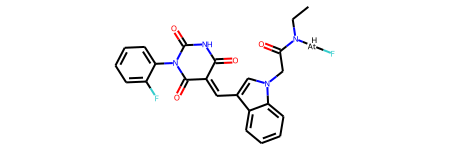

成功生成的高活性分子： CCN([AtH]F)C(=O)Cn1cc(/C=C2\C(=O)NC(=O)N(c3ccccc3F)C2=O)c2ccccc21 
Activity（越大药效越好）: 14.0351 
QED（越大类药性越高）: 0.3248 
SA（越小可合成性越高）: 3.1364 
logP（越大疏水性越好）: 2.9121 
------------------------------------------------------------------------------------------------------------


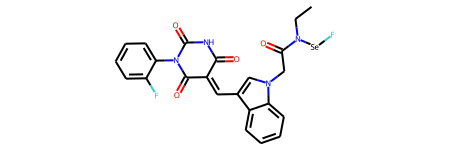

成功生成的高活性分子： CCN([Se]F)C(=O)Cn1cc(/C=C2\C(=O)NC(=O)N(c3ccccc3F)C2=O)c2ccccc21 
Activity（越大药效越好）: 9.7681 
QED（越大类药性越高）: 0.3011 
SA（越小可合成性越高）: 3.0871 
logP（越大疏水性越好）: 2.7990 
------------------------------------------------------------------------------------------------------------


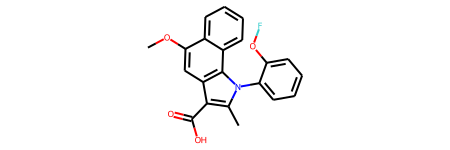

成功生成的高活性分子： COc1cc2c(C(=O)O)c(C)n(-c3ccccc3OF)c2c2ccccc12 
Activity（越大药效越好）: 12.2616 
QED（越大类药性越高）: 0.5489 
SA（越小可合成性越高）: 2.5231 
logP（越大疏水性越好）: 5.0622 
------------------------------------------------------------------------------------------------------------


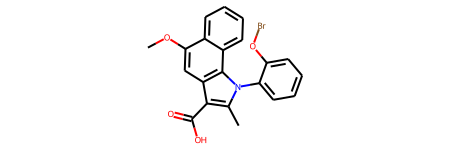

成功生成的高活性分子： COc1cc2c(C(=O)O)c(C)n(-c3ccccc3OBr)c2c2ccccc12 
Activity（越大药效越好）: 17.6660 
QED（越大类药性越高）: 0.4691 
SA（越小可合成性越高）: 2.5855 
logP（越大疏水性越好）: 5.4876 
------------------------------------------------------------------------------------------------------------


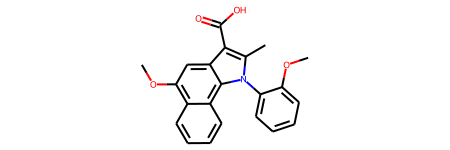

成功生成的高活性分子： COc1ccccc1-n1c(C)c(C(=O)O)c2cc(OC)c3ccccc3c21 
Activity（越大药效越好）: 16.6211 
QED（越大类药性越高）: 0.5667 
SA（越小可合成性越高）: 2.1974 
logP（越大疏水性越好）: 4.8075 
------------------------------------------------------------------------------------------------------------


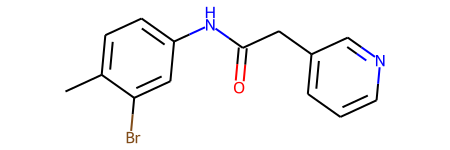

成功生成的高活性分子： Cc1ccc(NC(=O)Cc2cccnc2)cc1Br 
Activity（越大药效越好）: 20.1116 
QED（越大类药性越高）: 0.9448 
SA（越小可合成性越高）: 1.8236 
logP（越大疏水性越好）: 3.3337 
------------------------------------------------------------------------------------------------------------


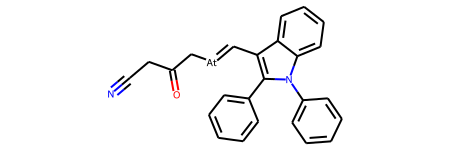

成功生成的高活性分子： N#CCC(=O)C/[At]=C/c1c(-c2ccccc2)n(-c2ccccc2)c2ccccc12 
Activity（越大药效越好）: 8.6379 
QED（越大类药性越高）: 0.3089 
SA（越小可合成性越高）: 2.9688 
logP（越大疏水性越好）: 5.4339 
------------------------------------------------------------------------------------------------------------


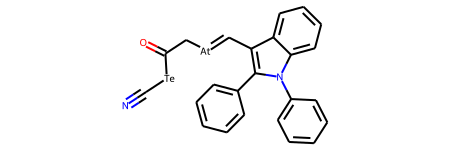

成功生成的高活性分子： N#C[Te]C(=O)C/[At]=C/c1c(-c2ccccc2)n(-c2ccccc2)c2ccccc12 
Activity（越大药效越好）: 9.4299 
QED（越大类药性越高）: 0.2774 
SA（越小可合成性越高）: 3.3193 
logP（越大疏水性越好）: 4.6630 
------------------------------------------------------------------------------------------------------------


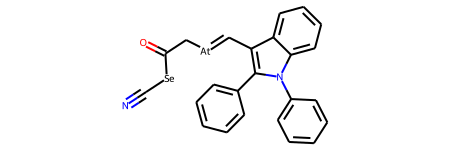

成功生成的高活性分子： N#C[Se]C(=O)C/[At]=C/c1c(-c2ccccc2)n(-c2ccccc2)c2ccccc12 
Activity（越大药效越好）: 8.9446 
QED（越大类药性越高）: 0.2889 
SA（越小可合成性越高）: 3.2386 
logP（越大疏水性越好）: 4.6630 
------------------------------------------------------------------------------------------------------------


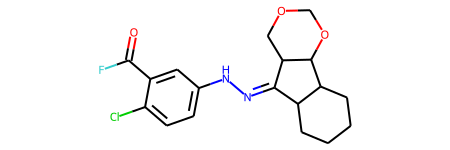

成功生成的高活性分子： O=C(F)c1cc(NN=C2C3CCCCC3C3OCOCC23)ccc1Cl 
Activity（越大药效越好）: 2.0623 
QED（越大类药性越高）: 0.6478 
SA（越小可合成性越高）: 4.2471 
logP（越大疏水性越好）: 4.0267 
------------------------------------------------------------------------------------------------------------


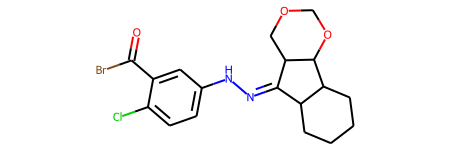

成功生成的高活性分子： O=C(Br)c1cc(NN=C2C3CCCCC3C3OCOCC23)ccc1Cl 
Activity（越大药效越好）: 0.8180 
QED（越大类药性越高）: 0.5717 
SA（越小可合成性越高）: 4.2868 
logP（越大疏水性越好）: 4.4521 
------------------------------------------------------------------------------------------------------------


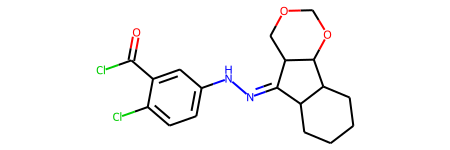

成功生成的高活性分子： O=C(Cl)c1cc(NN=C2C3CCCCC3C3OCOCC23)ccc1Cl 
Activity（越大药效越好）: 5.4483 
QED（越大类药性越高）: 0.6248 
SA（越小可合成性越高）: 4.1764 
logP（越大疏水性越好）: 4.2960 
------------------------------------------------------------------------------------------------------------


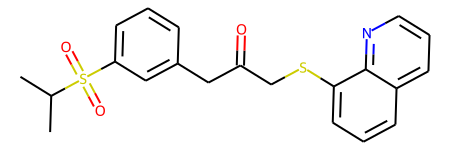

成功生成的高活性分子： CC(C)S(=O)(=O)c1cccc(CC(=O)CSc2cccc3cccnc23)c1 
Activity（越大药效越好）: 5.8401 
QED（越大类药性越高）: 0.5537 
SA（越小可合成性越高）: 2.3959 
logP（越大疏水性越好）: 4.3208 
------------------------------------------------------------------------------------------------------------


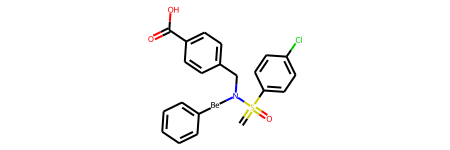

成功生成的高活性分子： C=S(=O)(c1ccc(Cl)cc1)N([Be]c1ccccc1)Cc1ccc(C(=O)O)cc1 
Activity（越大药效越好）: 14.3607 
QED（越大类药性越高）: 0.4807 
SA（越小可合成性越高）: 3.4518 
logP（越大疏水性越好）: 3.4754 
------------------------------------------------------------------------------------------------------------


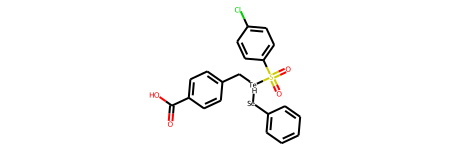

成功生成的高活性分子： O=C(O)c1ccc(C[TeH]([Se]c2ccccc2)S(=O)(=O)c2ccc(Cl)cc2)cc1 
Activity（越大药效越好）: 18.6769 
QED（越大类药性越高）: 0.4271 
SA（越小可合成性越高）: 3.4272 
logP（越大疏水性越好）: 2.8440 
------------------------------------------------------------------------------------------------------------


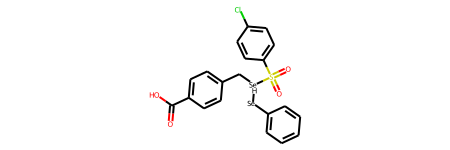

成功生成的高活性分子： O=C(O)c1ccc(C[SeH]([Se]c2ccccc2)S(=O)(=O)c2ccc(Cl)cc2)cc1 
Activity（越大药效越好）: 15.7489 
QED（越大类药性越高）: 0.4630 
SA（越小可合成性越高）: 3.4272 
logP（越大疏水性越好）: 2.8440 
------------------------------------------------------------------------------------------------------------


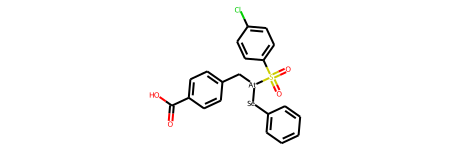

成功生成的高活性分子： O=C(O)c1ccc(C[At]([Se]c2ccccc2)S(=O)(=O)c2ccc(Cl)cc2)cc1 
Activity（越大药效越好）: 11.5776 
QED（越大类药性越高）: 0.3896 
SA（越小可合成性越高）: 3.0104 
logP（越大疏水性越好）: 3.4925 
------------------------------------------------------------------------------------------------------------


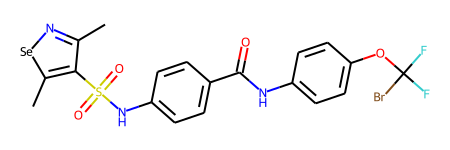

成功生成的高活性分子： Cc1n[se]c(C)c1S(=O)(=O)Nc1ccc(C(=O)Nc2ccc(OC(F)(F)Br)cc2)cc1 
Activity（越大药效越好）: 24.0192 
QED（越大类药性越高）: 0.3244 
SA（越小可合成性越高）: 2.9202 
logP（越大疏水性越好）: 4.1325 
------------------------------------------------------------------------------------------------------------


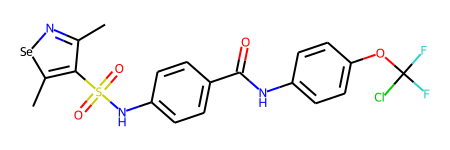

成功生成的高活性分子： Cc1n[se]c(C)c1S(=O)(=O)Nc1ccc(C(=O)Nc2ccc(OC(F)(F)Cl)cc2)cc1 
Activity（越大药效越好）: 21.2237 
QED（越大类药性越高）: 0.3530 
SA（越小可合成性越高）: 2.8529 
logP（越大疏水性越好）: 3.9764 
------------------------------------------------------------------------------------------------------------


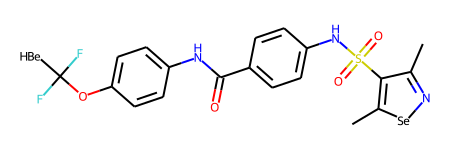

成功生成的高活性分子： [BeH]C(F)(F)Oc1ccc(NC(=O)c2ccc(NS(=O)(=O)c3c(C)n[se]c3C)cc2)cc1 
Activity（越大药效越好）: 15.4078 
QED（越大类药性越高）: 0.4778 
SA（越小可合成性越高）: 3.1270 
logP（越大疏水性越好）: 2.6384 
------------------------------------------------------------------------------------------------------------


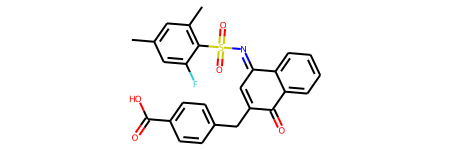

成功生成的高活性分子： Cc1cc(C)c(S(=O)(=O)/N=C2\C=C(Cc3ccc(C(=O)O)cc3)C(=O)c3ccccc32)c(F)c1 
Activity（越大药效越好）: 7.3337 
QED（越大类药性越高）: 0.5749 
SA（越小可合成性越高）: 2.7052 
logP（越大疏水性越好）: 4.6841 
------------------------------------------------------------------------------------------------------------


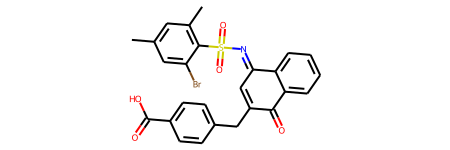

成功生成的高活性分子： Cc1cc(C)c(S(=O)(=O)/N=C2\C=C(Cc3ccc(C(=O)O)cc3)C(=O)c3ccccc32)c(Br)c1 
Activity（越大药效越好）: 9.5586 
QED（越大类药性越高）: 0.4749 
SA（越小可合成性越高）: 2.7294 
logP（越大疏水性越好）: 5.3075 
------------------------------------------------------------------------------------------------------------


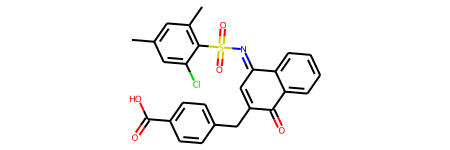

成功生成的高活性分子： Cc1cc(C)c(S(=O)(=O)/N=C2\C=C(Cc3ccc(C(=O)O)cc3)C(=O)c3ccccc32)c(Cl)c1 
Activity（越大药效越好）: 6.2539 
QED（越大类药性越高）: 0.5262 
SA（越小可合成性越高）: 2.7030 
logP（越大疏水性越好）: 5.1984 
------------------------------------------------------------------------------------------------------------


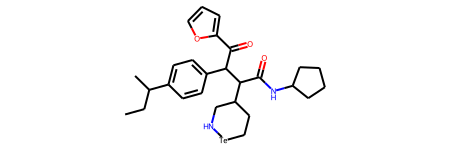

成功生成的高活性分子： CCC(C)c1ccc(C(C(=O)c2ccco2)C(C(=O)NC2CCCC2)C2CC[Te]NC2)cc1 
Activity（越大药效越好）: 8.3805 
QED（越大类药性越高）: 0.3295 
SA（越小可合成性越高）: 4.5045 
logP（越大疏水性越好）: 5.0816 
------------------------------------------------------------------------------------------------------------


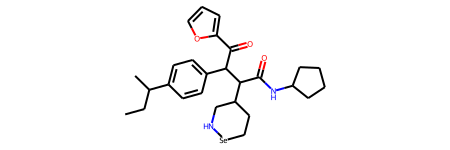

成功生成的高活性分子： CCC(C)c1ccc(C(C(=O)c2ccco2)C(C(=O)NC2CCCC2)C2CC[Se]NC2)cc1 
Activity（越大药效越好）: 11.7230 
QED（越大类药性越高）: 0.3610 
SA（越小可合成性越高）: 4.4629 
logP（越大疏水性越好）: 5.0816 
------------------------------------------------------------------------------------------------------------


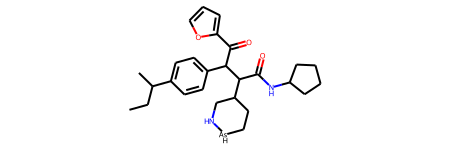

成功生成的高活性分子： CCC(C)c1ccc(C(C(=O)c2ccco2)C(C(=O)NC2CCCC2)C2CC[AsH]NC2)cc1 
Activity（越大药效越好）: 7.4073 
QED（越大类药性越高）: 0.3737 
SA（越小可合成性越高）: 4.6313 
logP（越大疏水性越好）: 4.8139 
------------------------------------------------------------------------------------------------------------


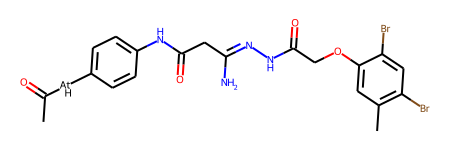

成功生成的高活性分子： CC(=O)[AtH]c1ccc(NC(=O)C/C(N)=N/NC(=O)COc2cc(C)c(Br)cc2Br)cc1 
Activity（越大药效越好）: 18.6594 
QED（越大类药性越高）: 0.2066 
SA（越小可合成性越高）: 3.3180 
logP（越大疏水性越好）: 2.3051 
------------------------------------------------------------------------------------------------------------


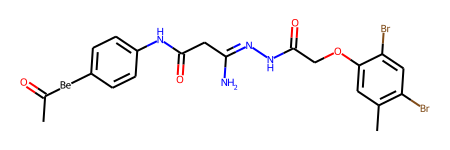

成功生成的高活性分子： CC(=O)[Be]c1ccc(NC(=O)C/C(N)=N/NC(=O)COc2cc(C)c(Br)cc2Br)cc1 
Activity（越大药效越好）: 12.5100 
QED（越大类药性越高）: 0.1917 
SA（越小可合成性越高）: 3.3180 
logP（越大疏水性越好）: 2.1920 
------------------------------------------------------------------------------------------------------------


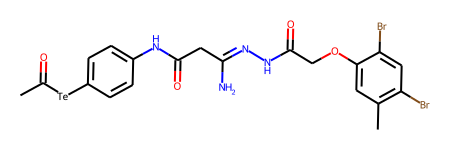

成功生成的高活性分子： CC(=O)[Te]c1ccc(NC(=O)C/C(N)=N/NC(=O)COc2cc(C)c(Br)cc2Br)cc1 
Activity（越大药效越好）: 9.7563 
QED（越大类药性越高）: 0.1639 
SA（越小可合成性越高）: 3.1670 
logP（越大疏水性越好）: 2.1920 
------------------------------------------------------------------------------------------------------------


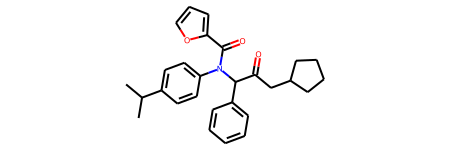

成功生成的高活性分子： CC(C)c1ccc(N(C(=O)c2ccco2)C(C(=O)CC2CCCC2)c2ccccc2)cc1 
Activity（越大药效越好）: 43.9834 
QED（越大类药性越高）: 0.3896 
SA（越小可合成性越高）: 2.8874 
logP（越大疏水性越好）: 6.9405 
------------------------------------------------------------------------------------------------------------


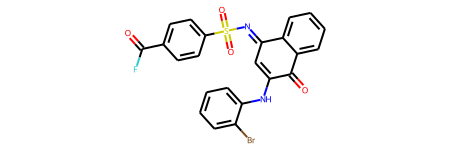

成功生成的高活性分子： O=C(F)c1ccc(S(=O)(=O)/N=C2\C=C(Nc3ccccc3Br)C(=O)c3ccccc32)cc1 
Activity（越大药效越好）: 25.1129 
QED（越大类药性越高）: 0.4889 
SA（越小可合成性越高）: 2.7086 
logP（越大疏水性越好）: 4.9291 
------------------------------------------------------------------------------------------------------------


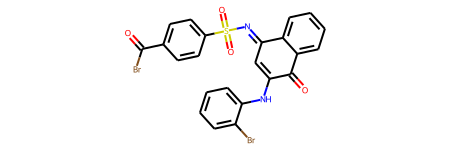

成功生成的高活性分子： O=C(Br)c1ccc(S(=O)(=O)/N=C2\C=C(Nc3ccccc3Br)C(=O)c3ccccc32)cc1 
Activity（越大药效越好）: 26.1245 
QED（越大类药性越高）: 0.4151 
SA（越小可合成性越高）: 2.7015 
logP（越大疏水性越好）: 5.3545 
------------------------------------------------------------------------------------------------------------


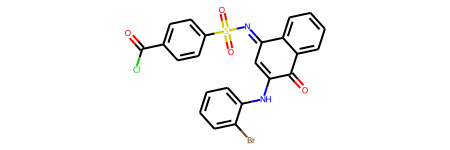

成功生成的高活性分子： O=C(Cl)c1ccc(S(=O)(=O)/N=C2\C=C(Nc3ccccc3Br)C(=O)c3ccccc32)cc1 
Activity（越大药效越好）: 26.4182 
QED（越大类药性越高）: 0.4588 
SA（越小可合成性越高）: 2.6135 
logP（越大疏水性越好）: 5.1984 
------------------------------------------------------------------------------------------------------------


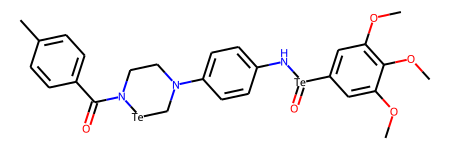

成功生成的高活性分子： COc1cc([Te](=O)Nc2ccc(N3CCN(C(=O)c4ccc(C)cc4)[Te]C3)cc2)cc(OC)c1OC 
Activity（越大药效越好）: 25.3528 
QED（越大类药性越高）: 0.3595 
SA（越小可合成性越高）: 3.6158 
logP（越大疏水性越好）: 2.7977 
------------------------------------------------------------------------------------------------------------


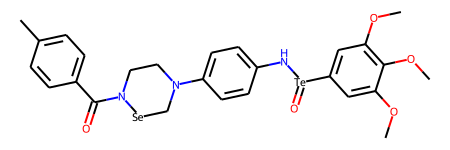

成功生成的高活性分子： COc1cc([Te](=O)Nc2ccc(N3CCN(C(=O)c4ccc(C)cc4)[Se]C3)cc2)cc(OC)c1OC 
Activity（越大药效越好）: 25.0848 
QED（越大类药性越高）: 0.3700 
SA（越小可合成性越高）: 3.5893 
logP（越大疏水性越好）: 2.7977 
------------------------------------------------------------------------------------------------------------


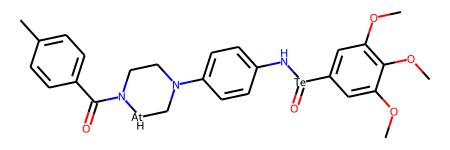

成功生成的高活性分子： COc1cc([Te](=O)Nc2ccc(N3CCN(C(=O)c4ccc(C)cc4)[AtH]C3)cc2)cc(OC)c1OC 
Activity（越大药效越好）: 29.2363 
QED（越大类药性越高）: 0.3517 
SA（越小可合成性越高）: 3.6436 
logP（越大疏水性越好）: 2.9108 
------------------------------------------------------------------------------------------------------------


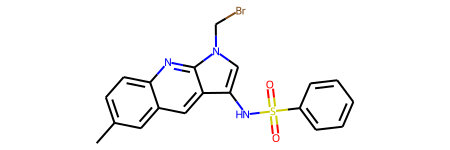

成功生成的高活性分子： Cc1ccc2nc3c(cc2c1)c(NS(=O)(=O)c1ccccc1)cn3CBr 
Activity（越大药效越好）: 16.9397 
QED（越大类药性越高）: 0.4797 
SA（越小可合成性越高）: 2.5306 
logP（越大疏水性越好）: 4.6511 
------------------------------------------------------------------------------------------------------------


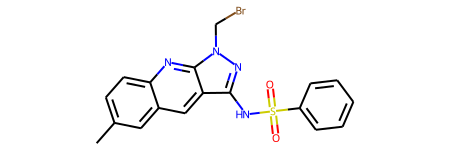

成功生成的高活性分子： Cc1ccc2nc3c(cc2c1)c(NS(=O)(=O)c1ccccc1)nn3CBr 
Activity（越大药效越好）: 16.8481 
QED（越大类药性越高）: 0.4950 
SA（越小可合成性越高）: 2.4981 
logP（越大疏水性越好）: 4.0461 
------------------------------------------------------------------------------------------------------------


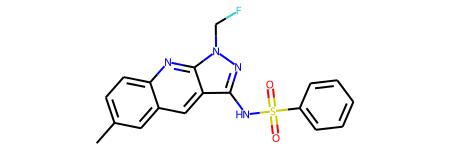

成功生成的高活性分子： Cc1ccc2nc3c(cc2c1)c(NS(=O)(=O)c1ccccc1)nn3CF 
Activity（越大药效越好）: 14.6940 
QED（越大类药性越高）: 0.5952 
SA（越小可合成性越高）: 2.4980 
logP（越大疏水性越好）: 3.6207 
------------------------------------------------------------------------------------------------------------


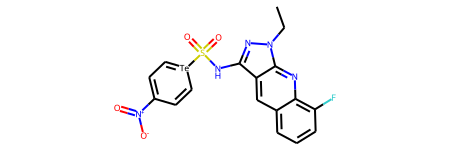

成功生成的高活性分子： CCn1nc(NS(=O)(=O)[Te]2=CC=C([N+](=O)[O-])C=C2)c2cc3cccc(F)c3nc21 
Activity（越大药效越好）: 9.1655 
QED（越大类药性越高）: 0.3064 
SA（越小可合成性越高）: 3.8613 
logP（越大疏水性越好）: 2.1302 
------------------------------------------------------------------------------------------------------------


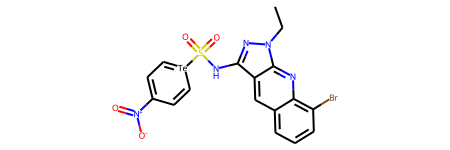

成功生成的高活性分子： CCn1nc(NS(=O)(=O)[Te]2=CC=C([N+](=O)[O-])C=C2)c2cc3cccc(Br)c3nc21 
Activity（越大药效越好）: 11.4327 
QED（越大类药性越高）: 0.2768 
SA（越小可合成性越高）: 3.9187 
logP（越大疏水性越好）: 2.7536 
------------------------------------------------------------------------------------------------------------


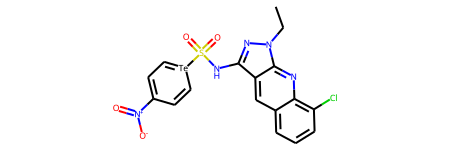

成功生成的高活性分子： CCn1nc(NS(=O)(=O)[Te]2=CC=C([N+](=O)[O-])C=C2)c2cc3cccc(Cl)c3nc21 
Activity（越大药效越好）: 17.5952 
QED（越大类药性越高）: 0.2981 
SA（越小可合成性越高）: 3.8528 
logP（越大疏水性越好）: 2.6445 
------------------------------------------------------------------------------------------------------------


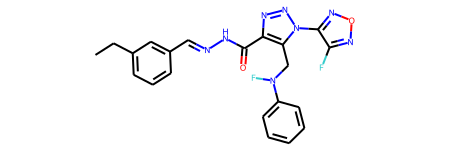

成功生成的高活性分子： CCc1cccc(/C=N/NC(=O)c2nnn(-c3nonc3F)c2CN(F)c2ccccc2)c1 
Activity（越大药效越好）: 14.9321 
QED（越大类药性越高）: 0.2483 
SA（越小可合成性越高）: 3.1750 
logP（越大疏水性越好）: 3.0068 
------------------------------------------------------------------------------------------------------------


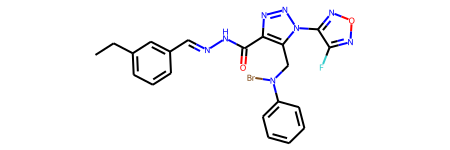

成功生成的高活性分子： CCc1cccc(/C=N/NC(=O)c2nnn(-c3nonc3F)c2CN(Br)c2ccccc2)c1 
Activity（越大药效越好）: 21.0773 
QED（越大类药性越高）: 0.2182 
SA（越小可合成性越高）: 3.1857 
logP（越大疏水性越好）: 3.4322 
------------------------------------------------------------------------------------------------------------


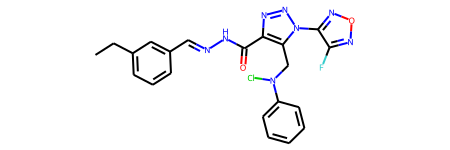

成功生成的高活性分子： CCc1cccc(/C=N/NC(=O)c2nnn(-c3nonc3F)c2CN(Cl)c2ccccc2)c1 
Activity（越大药效越好）: 18.9183 
QED（越大类药性越高）: 0.2396 
SA（越小可合成性越高）: 3.1389 
logP（越大疏水性越好）: 3.2761 
------------------------------------------------------------------------------------------------------------


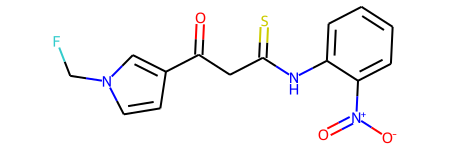

成功生成的高活性分子： O=C(CC(=S)Nc1ccccc1[N+](=O)[O-])c1ccn(CF)c1 
Activity（越大药效越好）: 20.0248 
QED（越大类药性越高）: 0.3820 
SA（越小可合成性越高）: 2.9443 
logP（越大疏水性越好）: 3.3356 
------------------------------------------------------------------------------------------------------------


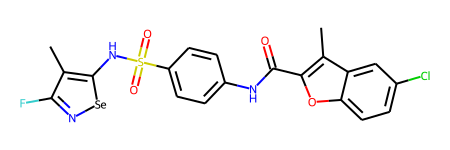

成功生成的高活性分子： Cc1c(F)n[se]c1NS(=O)(=O)c1ccc(NC(=O)c2oc3ccc(Cl)cc3c2C)cc1 
Activity（越大药效越好）: 8.4115 
QED（越大类药性越高）: 0.3766 
SA（越小可合成性越高）: 2.9735 
logP（越大疏水性越好）: 4.3472 
------------------------------------------------------------------------------------------------------------


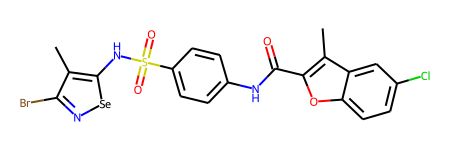

成功生成的高活性分子： Cc1c(Br)n[se]c1NS(=O)(=O)c1ccc(NC(=O)c2oc3ccc(Cl)cc3c2C)cc1 
Activity（越大药效越好）: 8.7229 
QED（越大类药性越高）: 0.3213 
SA（越小可合成性越高）: 2.9896 
logP（越大疏水性越好）: 4.9706 
------------------------------------------------------------------------------------------------------------


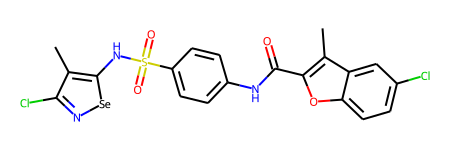

成功生成的高活性分子： Cc1c(Cl)n[se]c1NS(=O)(=O)c1ccc(NC(=O)c2oc3ccc(Cl)cc3c2C)cc1 
Activity（越大药效越好）: 14.2703 
QED（越大类药性越高）: 0.3505 
SA（越小可合成性越高）: 2.9562 
logP（越大疏水性越好）: 4.8615 
------------------------------------------------------------------------------------------------------------


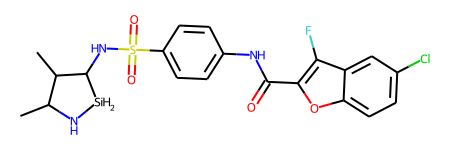

成功生成的高活性分子： CC1N[SiH2]C(NS(=O)(=O)c2ccc(NC(=O)c3oc4ccc(Cl)cc4c3F)cc2)C1C 
Activity（越大药效越好）: -5.7664 
QED（越大类药性越高）: 0.4864 
SA（越小可合成性越高）: 4.1322 
logP（越大疏水性越好）: 2.7936 
------------------------------------------------------------------------------------------------------------


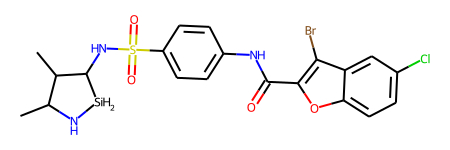

成功生成的高活性分子： CC1N[SiH2]C(NS(=O)(=O)c2ccc(NC(=O)c3oc4ccc(Cl)cc4c3Br)cc2)C1C 
Activity（越大药效越好）: -4.1546 
QED（越大类药性越高）: 0.4291 
SA（越小可合成性越高）: 4.1186 
logP（越大疏水性越好）: 3.4170 
------------------------------------------------------------------------------------------------------------


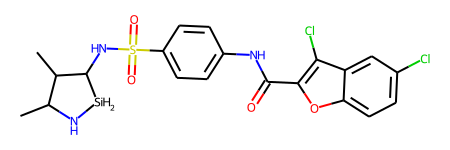

成功生成的高活性分子： CC1N[SiH2]C(NS(=O)(=O)c2ccc(NC(=O)c3oc4ccc(Cl)cc4c3Cl)cc2)C1C 
Activity（越大药效越好）: -0.7075 
QED（越大类药性越高）: 0.4690 
SA（越小可合成性越高）: 4.1085 
logP（越大疏水性越好）: 3.3079 
------------------------------------------------------------------------------------------------------------


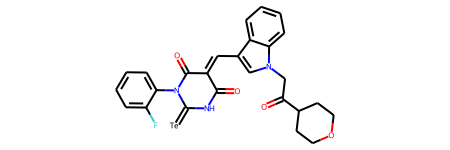

成功生成的高活性分子： O=C1NC(=[Te])N(c2ccccc2F)C(=O)/C1=C/c1cn(CC(=O)C2CCOCC2)c2ccccc12 
Activity（越大药效越好）: 11.7662 
QED（越大类药性越高）: 0.2832 
SA（越小可合成性越高）: 3.0763 
logP（越大疏水性越好）: 2.5784 
------------------------------------------------------------------------------------------------------------


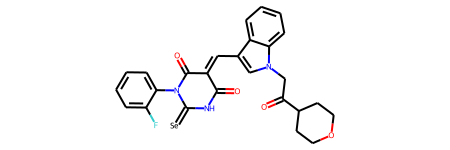

成功生成的高活性分子： O=C1NC(=[Se])N(c2ccccc2F)C(=O)/C1=C/c1cn(CC(=O)C2CCOCC2)c2ccccc12 
Activity（越大药效越好）: 11.3532 
QED（越大类药性越高）: 0.3079 
SA（越小可合成性越高）: 3.0382 
logP（越大疏水性越好）: 2.5784 
------------------------------------------------------------------------------------------------------------


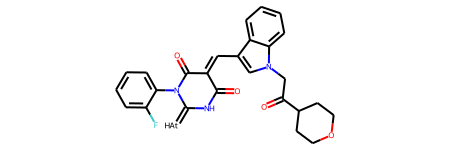

成功生成的高活性分子： O=C1NC(=[AtH])N(c2ccccc2F)C(=O)/C1=C/c1cn(CC(=O)C2CCOCC2)c2ccccc12 
Activity（越大药效越好）: 9.0985 
QED（越大类药性越高）: 0.3349 
SA（越小可合成性越高）: 3.1009 
logP（越大疏水性越好）: 2.6915 
------------------------------------------------------------------------------------------------------------


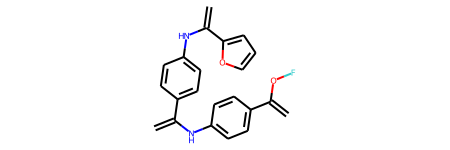

成功生成的高活性分子： C=C(Nc1ccc(C(=C)OF)cc1)c1ccc(NC(=C)c2ccco2)cc1 
Activity（越大药效越好）: 17.0304 
QED（越大类药性越高）: 0.4605 
SA（越小可合成性越高）: 2.8552 
logP（越大疏水性越好）: 6.3170 
------------------------------------------------------------------------------------------------------------


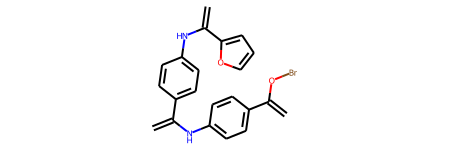

成功生成的高活性分子： C=C(Nc1ccc(C(=C)OBr)cc1)c1ccc(NC(=C)c2ccco2)cc1 
Activity（越大药效越好）: 16.7255 
QED（越大类药性越高）: 0.3940 
SA（越小可合成性越高）: 2.8768 
logP（越大疏水性越好）: 6.7424 
------------------------------------------------------------------------------------------------------------


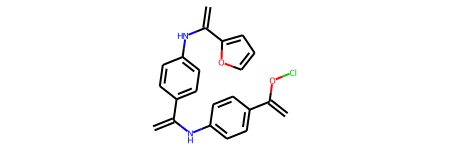

成功生成的高活性分子： C=C(Nc1ccc(C(=C)OCl)cc1)c1ccc(NC(=C)c2ccco2)cc1 
Activity（越大药效越好）: 15.5721 
QED（越大类药性越高）: 0.4340 
SA（越小可合成性越高）: 2.8493 
logP（越大疏水性越好）: 6.5863 
------------------------------------------------------------------------------------------------------------


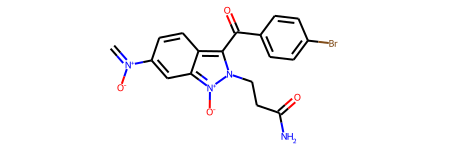

成功生成的高活性分子： C=[N+]([O-])c1ccc2c(C(=O)c3ccc(Br)cc3)n(CCC(N)=O)[n+]([O-])c2c1 
Activity（越大药效越好）: 40.2798 
QED（越大类药性越高）: 0.2111 
SA（越小可合成性越高）: 3.3451 
logP（越大疏水性越好）: 1.9860 
------------------------------------------------------------------------------------------------------------


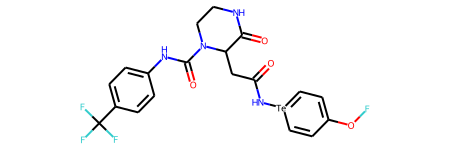

成功生成的高活性分子： O=C(CC1C(=O)NCCN1C(=O)Nc1ccc(C(F)(F)F)cc1)N[Te]1=CC=C(OF)C=C1 
Activity（越大药效越好）: 27.4182 
QED（越大类药性越高）: 0.3721 
SA（越小可合成性越高）: 4.2080 
logP（越大疏水性越好）: 1.8134 
------------------------------------------------------------------------------------------------------------


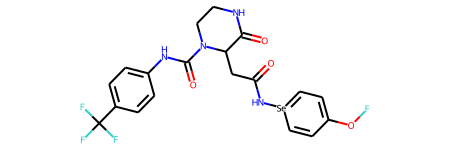

成功生成的高活性分子： O=C(CC1C(=O)NCCN1C(=O)Nc1ccc(C(F)(F)F)cc1)N[Se]1=CC=C(OF)C=C1 
Activity（越大药效越好）: 25.9758 
QED（越大类药性越高）: 0.4069 
SA（越小可合成性越高）: 4.4261 
logP（越大疏水性越好）: 1.8134 
------------------------------------------------------------------------------------------------------------


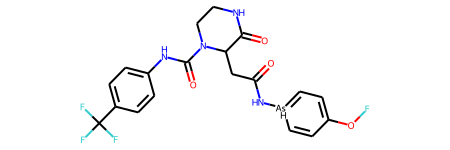

成功生成的高活性分子： O=C(CC1C(=O)NCCN1C(=O)Nc1ccc(C(F)(F)F)cc1)N[AsH]1=CC=C(OF)C=C1 
Activity（越大药效越好）: 23.7269 
QED（越大类药性越高）: 0.4072 
SA（越小可合成性越高）: 4.4518 
logP（越大疏水性越好）: 1.5457 
------------------------------------------------------------------------------------------------------------


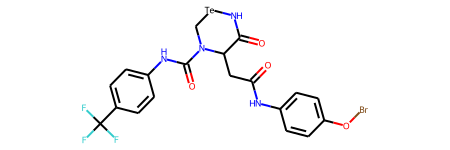

成功生成的高活性分子： O=C(CC1C(=O)N[Te]CN1C(=O)Nc1ccc(C(F)(F)F)cc1)Nc1ccc(OBr)cc1 
Activity（越大药效越好）: 36.3956 
QED（越大类药性越高）: 0.4428 
SA（越小可合成性越高）: 3.6372 
logP（越大疏水性越好）: 3.3319 
------------------------------------------------------------------------------------------------------------


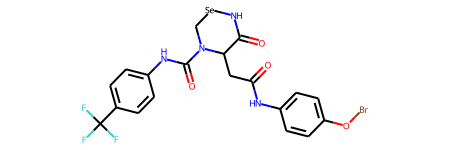

成功生成的高活性分子： O=C(CC1C(=O)N[Se]CN1C(=O)Nc1ccc(C(F)(F)F)cc1)Nc1ccc(OBr)cc1 
Activity（越大药效越好）: 36.4387 
QED（越大类药性越高）: 0.4732 
SA（越小可合成性越高）: 3.5933 
logP（越大疏水性越好）: 3.3319 
------------------------------------------------------------------------------------------------------------


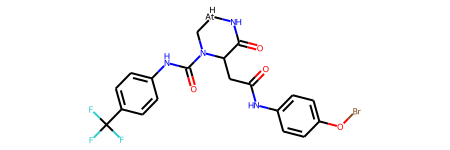

成功生成的高活性分子： O=C(CC1C(=O)N[AtH]CN1C(=O)Nc1ccc(C(F)(F)F)cc1)Nc1ccc(OBr)cc1 
Activity（越大药效越好）: 35.0766 
QED（越大类药性越高）: 0.4430 
SA（越小可合成性越高）: 3.6691 
logP（越大疏水性越好）: 3.4450 
------------------------------------------------------------------------------------------------------------


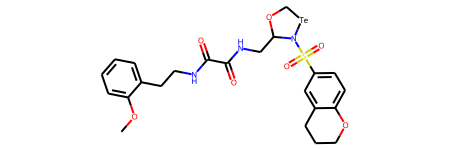

成功生成的高活性分子： COc1ccccc1CCNC(=O)C(=O)NCC1OC[Te]N1S(=O)(=O)c1ccc2c(c1)CCCO2 
Activity（越大药效越好）: 6.9157 
QED（越大类药性越高）: 0.3255 
SA（越小可合成性越高）: 3.6389 
logP（越大疏水性越好）: 0.4190 
------------------------------------------------------------------------------------------------------------


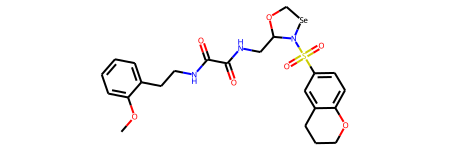

成功生成的高活性分子： COc1ccccc1CCNC(=O)C(=O)NCC1OC[Se]N1S(=O)(=O)c1ccc2c(c1)CCCO2 
Activity（越大药效越好）: 12.9414 
QED（越大类药性越高）: 0.3497 
SA（越小可合成性越高）: 3.6240 
logP（越大疏水性越好）: 0.4190 
------------------------------------------------------------------------------------------------------------


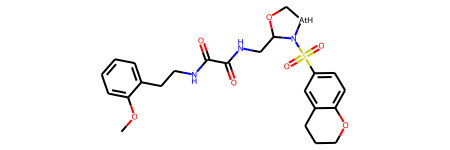

成功生成的高活性分子： COc1ccccc1CCNC(=O)C(=O)NCC1OC[AtH]N1S(=O)(=O)c1ccc2c(c1)CCCO2 
Activity（越大药效越好）: 7.3251 
QED（越大类药性越高）: 0.3859 
SA（越小可合成性越高）: 3.6673 
logP（越大疏水性越好）: 0.5321 
------------------------------------------------------------------------------------------------------------


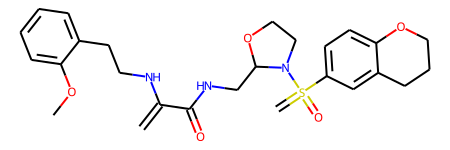

成功生成的高活性分子： C=C(NCCc1ccccc1OC)C(=O)NCC1OCCN1S(=C)(=O)c1ccc2c(c1)CCCO2 
Activity（越大药效越好）: 7.2679 
QED（越大类药性越高）: 0.3847 
SA（越小可合成性越高）: 3.8427 
logP（越大疏水性越好）: 2.1310 
------------------------------------------------------------------------------------------------------------


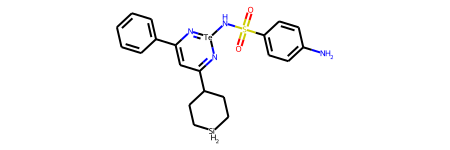

成功生成的高活性分子： Nc1ccc(S(=O)(=O)N[Te]2=NC(c3ccccc3)=CC(C3CC[SiH2]CC3)=N2)cc1 
Activity（越大药效越好）: 22.0056 
QED（越大类药性越高）: 0.4514 
SA（越小可合成性越高）: 4.0117 
logP（越大疏水性越好）: 2.7117 
------------------------------------------------------------------------------------------------------------


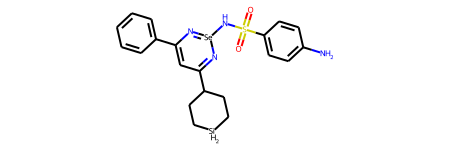

成功生成的高活性分子： Nc1ccc(S(=O)(=O)N[Se]2=NC(c3ccccc3)=CC(C3CC[SiH2]CC3)=N2)cc1 
Activity（越大药效越好）: 21.2763 
QED（越大类药性越高）: 0.4973 
SA（越小可合成性越高）: 4.4013 
logP（越大疏水性越好）: 2.7117 
------------------------------------------------------------------------------------------------------------


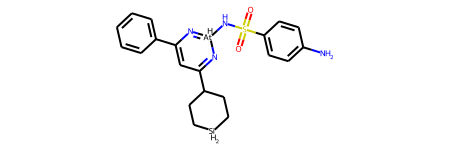

成功生成的高活性分子： Nc1ccc(S(=O)(=O)N[AtH]2=NC(c3ccccc3)=CC(C3CC[SiH2]CC3)=N2)cc1 
Activity（越大药效越好）: 23.8632 
QED（越大类药性越高）: 0.3964 
SA（越小可合成性越高）: 4.4285 
logP（越大疏水性越好）: 2.8248 
------------------------------------------------------------------------------------------------------------


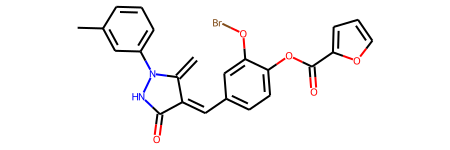

成功生成的高活性分子： C=c1/c(=C\c2ccc(OC(=O)c3ccco3)c(OBr)c2)c(=O)[nH]n1-c1cccc(C)c1 
Activity（越大药效越好）: 27.3727 
QED（越大类药性越高）: 0.3497 
SA（越小可合成性越高）: 3.1741 
logP（越大疏水性越好）: 3.2140 
------------------------------------------------------------------------------------------------------------


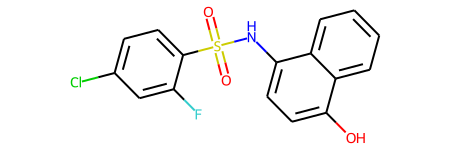

成功生成的高活性分子： O=S(=O)(Nc1ccc(O)c2ccccc12)c1ccc(Cl)cc1F 
Activity（越大药效越好）: 17.8539 
QED（越大类药性越高）: 0.6969 
SA（越小可合成性越高）: 1.9989 
logP（越大疏水性越好）: 4.1387 
------------------------------------------------------------------------------------------------------------


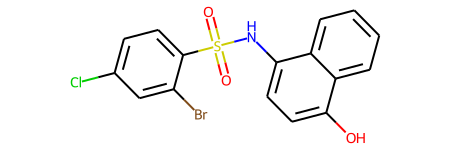

成功生成的高活性分子： O=S(=O)(Nc1ccc(O)c2ccccc12)c1ccc(Cl)cc1Br 
Activity（越大药效越好）: 23.6258 
QED（越大类药性越高）: 0.6094 
SA（越小可合成性越高）: 2.0459 
logP（越大疏水性越好）: 4.7621 
------------------------------------------------------------------------------------------------------------


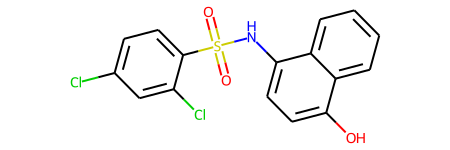

成功生成的高活性分子： O=S(=O)(Nc1ccc(O)c2ccccc12)c1ccc(Cl)cc1Cl 
Activity（越大药效越好）: 23.6387 
QED（越大类药性越高）: 0.6615 
SA（越小可合成性越高）: 1.9701 
logP（越大疏水性越好）: 4.6530 
------------------------------------------------------------------------------------------------------------


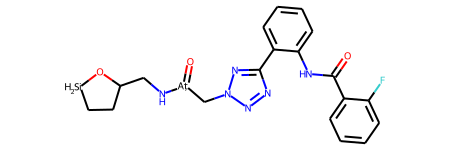

成功生成的高活性分子： O=C(Nc1ccccc1-c1nnn(C[At](=O)NCC2CC[SiH2]O2)n1)c1ccccc1F 
Activity（越大药效越好）: 22.4506 
QED（越大类药性越高）: 0.3599 
SA（越小可合成性越高）: 4.1749 
logP（越大疏水性越好）: 1.4508 
------------------------------------------------------------------------------------------------------------


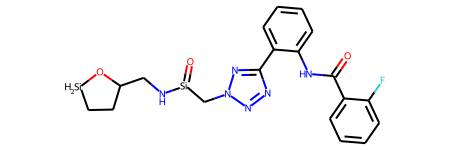

成功生成的高活性分子： O=C(Nc1ccccc1-c1nnn(C[Si](=O)NCC2CC[SiH2]O2)n1)c1ccccc1F 
Activity（越大药效越好）: 10.8207 
QED（越大类药性越高）: 0.4879 
SA（越小可合成性越高）: 4.0498 
logP（越大疏水性越好）: 1.0700 
------------------------------------------------------------------------------------------------------------


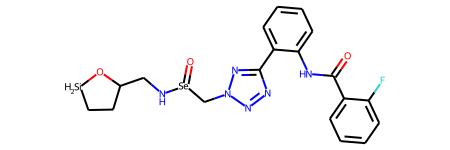

成功生成的高活性分子： O=C(Nc1ccccc1-c1nnn(C[Se](=O)NCC2CC[SiH2]O2)n1)c1ccccc1F 
Activity（越大药效越好）: 12.8835 
QED（越大类药性越高）: 0.4391 
SA（越小可合成性越高）: 4.3541 
logP（越大疏水性越好）: 1.0700 
------------------------------------------------------------------------------------------------------------


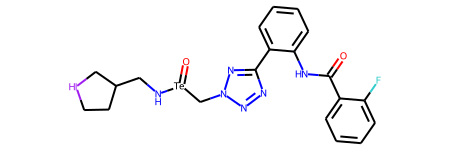

成功生成的高活性分子： O=C(Nc1ccccc1-c1nnn(C[Te](=O)NCC2CC[IH]C2)n1)c1ccccc1F 
Activity（越大药效越好）: 20.4531 
QED（越大类药性越高）: 0.2207 
SA（越小可合成性越高）: 4.2525 
logP（越大疏水性越好）: 2.5019 
------------------------------------------------------------------------------------------------------------


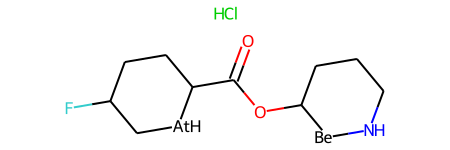

成功生成的高活性分子： Cl.O=C(OC1[Be]NCCC1)C1CCC(F)C[AtH]1 
Activity（越大药效越好）: 13.0907 
QED（越大类药性越高）: 0.5038 
SA（越小可合成性越高）: 6.2443 
logP（越大疏水性越好）: 1.4361 
------------------------------------------------------------------------------------------------------------


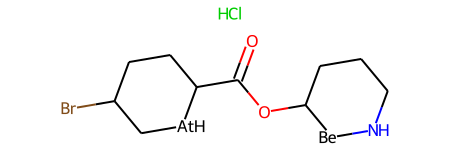

成功生成的高活性分子： Cl.O=C(OC1[Be]NCCC1)C1CCC(Br)C[AtH]1 
Activity（越大药效越好）: 12.9170 
QED（越大类药性越高）: 0.3448 
SA（越小可合成性越高）: 6.2868 
logP（越大疏水性越好）: 1.8615 
------------------------------------------------------------------------------------------------------------


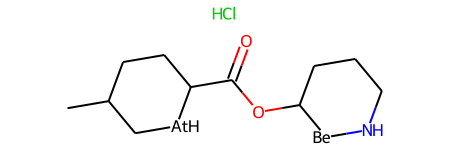

成功生成的高活性分子： CC1CCC(C(=O)OC2[Be]NCCC2)[AtH]C1.Cl 
Activity（越大药效越好）: 14.0451 
QED（越大类药性越高）: 0.5112 
SA（越小可合成性越高）: 6.0759 
logP（越大疏水性越好）: 1.7341 
------------------------------------------------------------------------------------------------------------


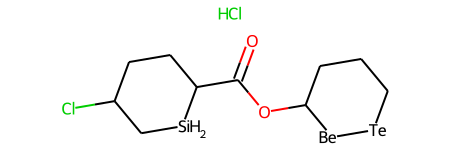

成功生成的高活性分子： Cl.O=C(OC1[Be][Te]CCC1)C1CCC(Cl)C[SiH2]1 
Activity（越大药效越好）: 13.7388 
QED（越大类药性越高）: 0.3961 
SA（越小可合成性越高）: 6.5716 
logP（越大疏水性越好）: 1.5898 
------------------------------------------------------------------------------------------------------------


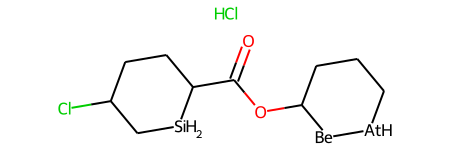

成功生成的高活性分子： Cl.O=C(OC1[Be][AtH]CCC1)C1CCC(Cl)C[SiH2]1 
Activity（越大药效越好）: 27.3595 
QED（越大类药性越高）: 0.3357 
SA（越小可合成性越高）: 6.6320 
logP（越大疏水性越好）: 1.7029 
------------------------------------------------------------------------------------------------------------


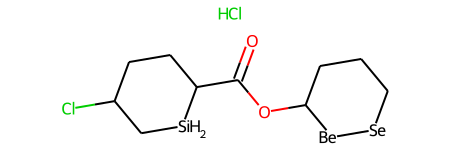

成功生成的高活性分子： Cl.O=C(OC1[Be][Se]CCC1)C1CCC(Cl)C[SiH2]1 
Activity（越大药效越好）: 17.3915 
QED（越大类药性越高）: 0.4264 
SA（越小可合成性越高）: 6.4875 
logP（越大疏水性越好）: 1.5898 
------------------------------------------------------------------------------------------------------------


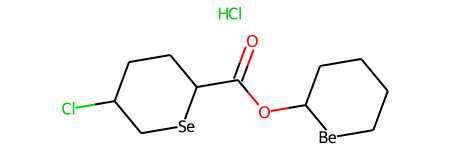

成功生成的高活性分子： Cl.O=C(OC1[Be]CCCC1)C1CCC(Cl)C[Se]1 
Activity（越大药效越好）: 17.9912 
QED（越大类药性越高）: 0.4386 
SA（越小可合成性越高）: 5.9658 
logP（越大疏水性越好）: 2.8961 
------------------------------------------------------------------------------------------------------------


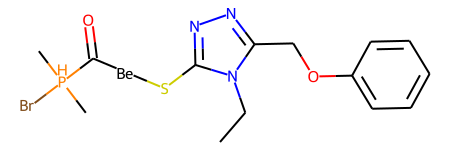

成功生成的高活性分子： CCn1c(COc2ccccc2)nnc1S[Be]C(=O)[PH](C)(C)Br 
Activity（越大药效越好）: 20.8305 
QED（越大类药性越高）: 0.4834 
SA（越小可合成性越高）: 3.6231 
logP（越大疏水性越好）: 4.0277 
------------------------------------------------------------------------------------------------------------


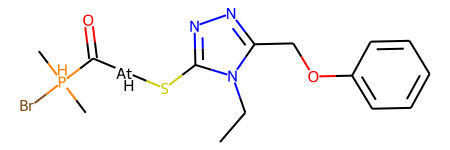

成功生成的高活性分子： CCn1c(COc2ccccc2)nnc1S[AtH]C(=O)[PH](C)(C)Br 
Activity（越大药效越好）: 13.1000 
QED（越大类药性越高）: 0.4186 
SA（越小可合成性越高）: 3.6231 
logP（越大疏水性越好）: 4.1408 
------------------------------------------------------------------------------------------------------------


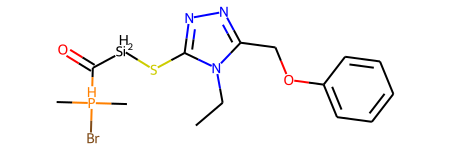

成功生成的高活性分子： CCn1c(COc2ccccc2)nnc1S[SiH2]C(=O)[PH](C)(C)Br 
Activity（越大药效越好）: 12.6515 
QED（越大类药性越高）: 0.4704 
SA（越小可合成性越高）: 3.5490 
logP（越大疏水性越好）: 3.4923 
------------------------------------------------------------------------------------------------------------


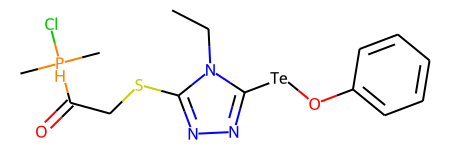

成功生成的高活性分子： CCn1c(SCC(=O)[PH](C)(C)Cl)nnc1[Te]Oc1ccccc1 
Activity（越大药效越好）: 22.5234 
QED（越大类药性越高）: 0.3254 
SA（越小可合成性越高）: 4.0392 
logP（越大疏水性越好）: 2.4035 
------------------------------------------------------------------------------------------------------------


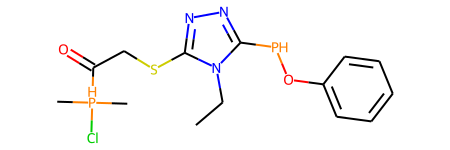

成功生成的高活性分子： CCn1c(POc2ccccc2)nnc1SCC(=O)[PH](C)(C)Cl 
Activity（越大药效越好）: 19.4350 
QED（越大类药性越高）: 0.5098 
SA（越小可合成性越高）: 4.2975 
logP（越大疏水性越好）: 3.3778 
------------------------------------------------------------------------------------------------------------


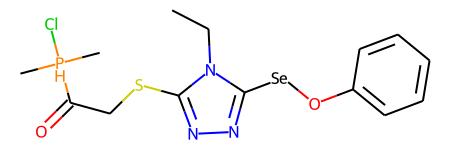

成功生成的高活性分子： CCn1c(SCC(=O)[PH](C)(C)Cl)nnc1[Se]Oc1ccccc1 
Activity（越大药效越好）: 18.7982 
QED（越大类药性越高）: 0.3598 
SA（越小可合成性越高）: 3.9903 
logP（越大疏水性越好）: 2.4035 
------------------------------------------------------------------------------------------------------------


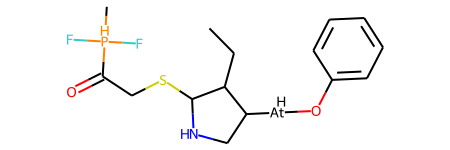

成功生成的高活性分子： CCC1C(SCC(=O)[PH](C)(F)F)NCC1[AtH]Oc1ccccc1 
Activity（越大药效越好）: -30.3627 
QED（越大类药性越高）: 0.4894 
SA（越小可合成性越高）: 5.4634 
logP（越大疏水性越好）: 3.9502 
------------------------------------------------------------------------------------------------------------


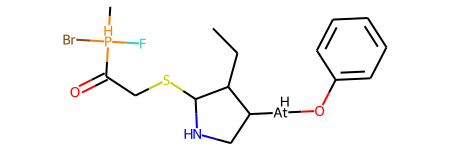

成功生成的高活性分子： CCC1C(SCC(=O)[PH](C)(F)Br)NCC1[AtH]Oc1ccccc1 
Activity（越大药效越好）: -31.6817 
QED（越大类药性越高）: 0.4383 
SA（越小可合成性越高）: 5.4733 
logP（越大疏水性越好）: 4.3756 
------------------------------------------------------------------------------------------------------------


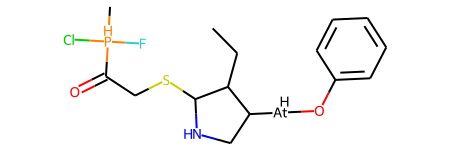

成功生成的高活性分子： CCC1C(SCC(=O)[PH](C)(F)Cl)NCC1[AtH]Oc1ccccc1 
Activity（越大药效越好）: -31.1155 
QED（越大类药性越高）: 0.4708 
SA（越小可合成性越高）: 5.4634 
logP（越大疏水性越好）: 4.2195 
------------------------------------------------------------------------------------------------------------


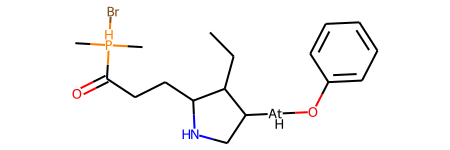

成功生成的高活性分子： CCC1C(CCC(=O)[PH](C)(C)Br)NCC1[AtH]Oc1ccccc1 
Activity（越大药效越好）: -12.7189 
QED（越大类药性越高）: 0.4558 
SA（越小可合成性越高）: 5.2831 
logP（越大疏水性越好）: 4.2104 
------------------------------------------------------------------------------------------------------------


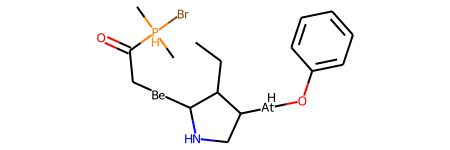

成功生成的高活性分子： CCC1C([Be]CC(=O)[PH](C)(C)Br)NCC1[AtH]Oc1ccccc1 
Activity（越大药效越好）: -9.7608 
QED（越大类药性越高）: 0.3704 
SA（越小可合成性越高）: 5.8494 
logP（越大疏水性越好）: 3.5102 
------------------------------------------------------------------------------------------------------------


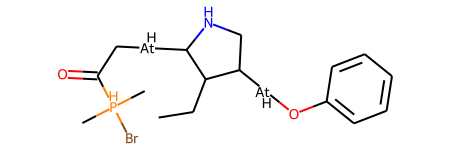

成功生成的高活性分子： CCC1C([AtH]Oc2ccccc2)CNC1[AtH]CC(=O)[PH](C)(C)Br 
Activity（越大药效越好）: -6.3660 
QED（越大类药性越高）: 0.4095 
SA（越小可合成性越高）: 5.8494 
logP（越大疏水性越好）: 3.6233 
------------------------------------------------------------------------------------------------------------


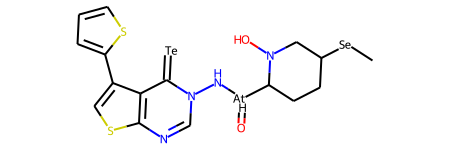

成功生成的高活性分子： C[Se]C1CCC([AtH](=O)Nn2cnc3scc(-c4cccs4)c3c2=[Te])N(O)C1 
Activity（越大药效越好）: 3.6882 
QED（越大类药性越高）: 0.3906 
SA（越小可合成性越高）: 5.5299 
logP（越大疏水性越好）: 3.0357 
------------------------------------------------------------------------------------------------------------


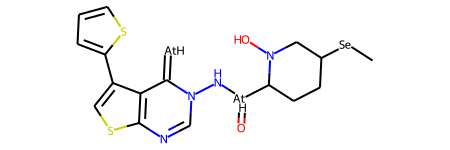

成功生成的高活性分子： C[Se]C1CCC([AtH](=O)Nn2cnc3scc(-c4cccs4)c3c2=[AtH])N(O)C1 
Activity（越大药效越好）: 2.5311 
QED（越大类药性越高）: 0.3868 
SA（越小可合成性越高）: 5.5619 
logP（越大疏水性越好）: 3.1488 
------------------------------------------------------------------------------------------------------------


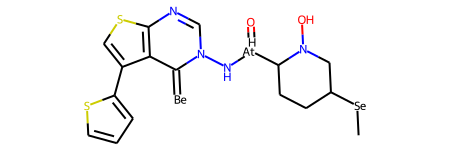

成功生成的高活性分子： [Be]=C1c2c(-c3cccs3)csc2N=CN1N[AtH](=O)C1CCC([Se]C)CN1O 
Activity（越大药效越好）: 33.5144 
QED（越大类药性越高）: 0.4831 
SA（越小可合成性越高）: 5.9595 
logP（越大疏水性越好）: 2.5685 
------------------------------------------------------------------------------------------------------------


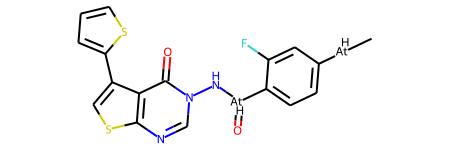

成功生成的高活性分子： C[AtH]c1ccc([AtH](=O)Nn2cnc3scc(-c4cccs4)c3c2=O)c(F)c1 
Activity（越大药效越好）: 17.0555 
QED（越大类药性越高）: 0.3375 
SA（越小可合成性越高）: 4.6926 
logP（越大疏水性越好）: 2.2988 
------------------------------------------------------------------------------------------------------------


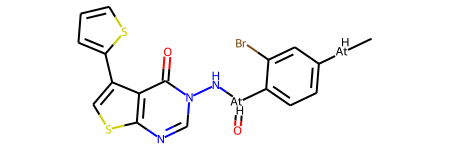

成功生成的高活性分子： C[AtH]c1ccc([AtH](=O)Nn2cnc3scc(-c4cccs4)c3c2=O)c(Br)c1 
Activity（越大药效越好）: 24.0826 
QED（越大类药性越高）: 0.3361 
SA（越小可合成性越高）: 4.7161 
logP（越大疏水性越好）: 2.9222 
------------------------------------------------------------------------------------------------------------


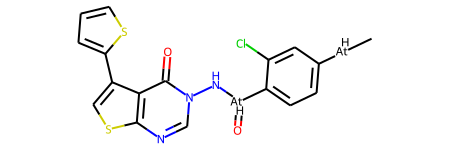

成功生成的高活性分子： C[AtH]c1ccc([AtH](=O)Nn2cnc3scc(-c4cccs4)c3c2=O)c(Cl)c1 
Activity（越大药效越好）: 15.0877 
QED（越大类药性越高）: 0.3375 
SA（越小可合成性越高）: 4.6879 
logP（越大疏水性越好）: 2.8131 
------------------------------------------------------------------------------------------------------------


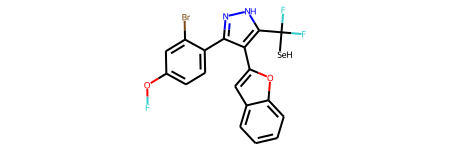

成功生成的高活性分子： FOc1ccc(-c2n[nH]c(C(F)(F)[SeH])c2-c2cc3ccccc3o2)c(Br)c1 
Activity（越大药效越好）: 15.0304 
QED（越大类药性越高）: 0.3773 
SA（越小可合成性越高）: 3.3502 
logP（越大疏水性越好）: 5.4658 
------------------------------------------------------------------------------------------------------------


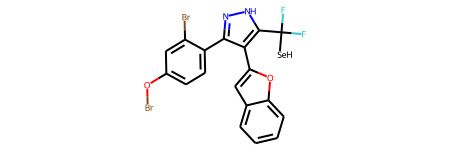

成功生成的高活性分子： FC(F)([SeH])c1[nH]nc(-c2ccc(OBr)cc2Br)c1-c1cc2ccccc2o1 
Activity（越大药效越好）: 17.0215 
QED（越大类药性越高）: 0.3156 
SA（越小可合成性越高）: 3.4285 
logP（越大疏水性越好）: 5.8912 
------------------------------------------------------------------------------------------------------------


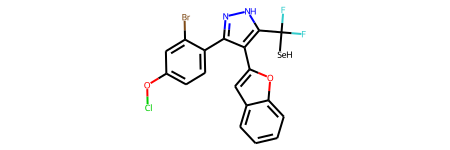

成功生成的高活性分子： FC(F)([SeH])c1[nH]nc(-c2ccc(OCl)cc2Br)c1-c1cc2ccccc2o1 
Activity（越大药效越好）: 9.3867 
QED（越大类药性越高）: 0.3510 
SA（越小可合成性越高）: 3.3462 
logP（越大疏水性越好）: 5.7351 
------------------------------------------------------------------------------------------------------------


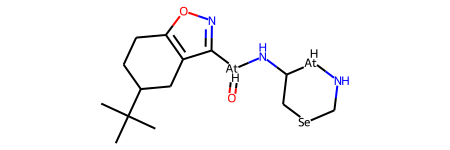

成功生成的高活性分子： CC(C)(C)C1CCc2onc([AtH](=O)NC3C[Se]CN[AtH]3)c2C1 
Activity（越大药效越好）: 44.8679 
QED（越大类药性越高）: 0.4371 
SA（越小可合成性越高）: 6.0980 
logP（越大疏水性越好）: 0.3956 
------------------------------------------------------------------------------------------------------------


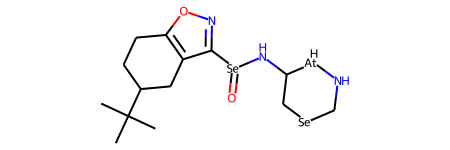

成功生成的高活性分子： CC(C)(C)C1CCc2onc([Se](=O)NC3C[Se]CN[AtH]3)c2C1 
Activity（越大药效越好）: 27.8934 
QED（越大类药性越高）: 0.4687 
SA（越小可合成性越高）: 6.0040 
logP（越大疏水性越好）: 0.2825 
------------------------------------------------------------------------------------------------------------


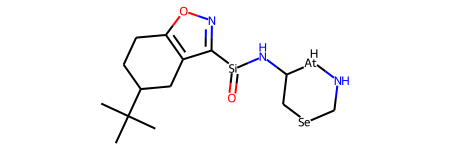

成功生成的高活性分子： CC(C)(C)C1CCc2onc([Si](=O)NC3C[Se]CN[AtH]3)c2C1 
Activity（越大药效越好）: 26.0464 
QED（越大类药性越高）: 0.5014 
SA（越小可合成性越高）: 5.7762 
logP（越大疏水性越好）: 0.2825 
------------------------------------------------------------------------------------------------------------


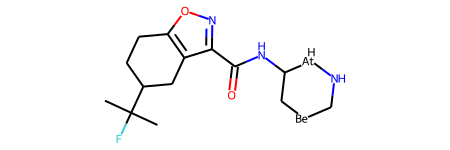

成功生成的高活性分子： CC(C)(F)C1CCc2onc(C(=O)NC3C[Be]CN[AtH]3)c2C1 
Activity（越大药效越好）: 17.0022 
QED（越大类药性越高）: 0.6073 
SA（越小可合成性越高）: 5.3666 
logP（越大疏水性越好）: 0.9990 
------------------------------------------------------------------------------------------------------------


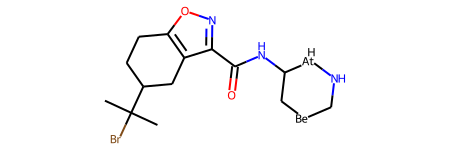

成功生成的高活性分子： CC(C)(Br)C1CCc2onc(C(=O)NC3C[Be]CN[AtH]3)c2C1 
Activity（越大药效越好）: 18.5903 
QED（越大类药性越高）: 0.4327 
SA（越小可合成性越高）: 5.4182 
logP（越大疏水性越好）: 1.4244 
------------------------------------------------------------------------------------------------------------


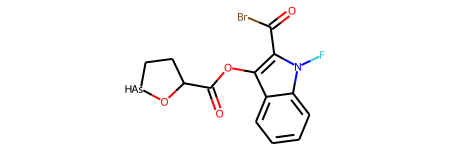

成功生成的高活性分子： O=C(Br)c1c(OC(=O)C2CC[AsH]O2)c2ccccc2n1F 
Activity（越大药效越好）: 21.4775 
QED（越大类药性越高）: 0.4367 
SA（越小可合成性越高）: 4.7407 
logP（越大疏水性越好）: 2.3731 
------------------------------------------------------------------------------------------------------------


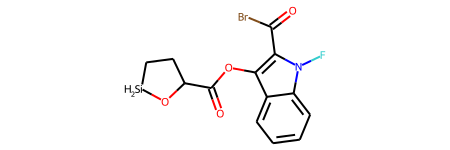

成功生成的高活性分子： O=C(Br)c1c(OC(=O)C2CC[SiH2]O2)c2ccccc2n1F 
Activity（越大药效越好）: 20.2621 
QED（越大类药性越高）: 0.4706 
SA（越小可合成性越高）: 4.3831 
logP（越大疏水性越好）: 2.1054 
------------------------------------------------------------------------------------------------------------


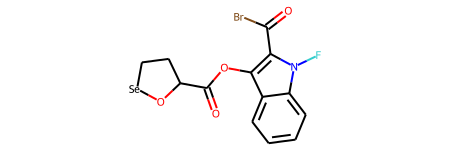

成功生成的高活性分子： O=C(Br)c1c(OC(=O)C2CC[Se]O2)c2ccccc2n1F 
Activity（越大药效越好）: 16.4029 
QED（越大类药性越高）: 0.4348 
SA（越小可合成性越高）: 4.4023 
logP（越大疏水性越好）: 2.6408 
------------------------------------------------------------------------------------------------------------


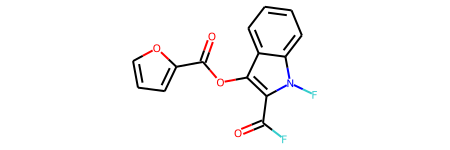

成功生成的高活性分子： O=C(Oc1c(C(=O)F)n(F)c2ccccc12)c1ccco1 
Activity（越大药效越好）: 32.4855 
QED（越大类药性越高）: 0.5485 
SA（越小可合成性越高）: 2.8837 
logP（越大疏水性越好）: 3.2958 
------------------------------------------------------------------------------------------------------------


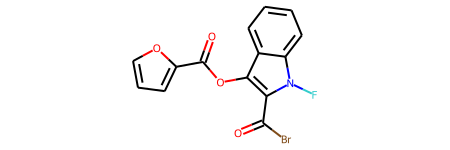

成功生成的高活性分子： O=C(Oc1c(C(=O)Br)n(F)c2ccccc12)c1ccco1 
Activity（越大药效越好）: 32.0074 
QED（越大类药性越高）: 0.5325 
SA（越小可合成性越高）: 2.9045 
logP（越大疏水性越好）: 3.7212 
------------------------------------------------------------------------------------------------------------


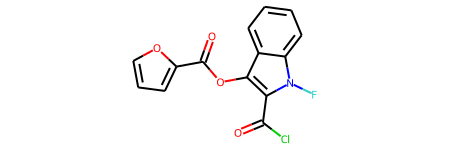

成功生成的高活性分子： O=C(Oc1c(C(=O)Cl)n(F)c2ccccc12)c1ccco1 
Activity（越大药效越好）: 28.2881 
QED（越大类药性越高）: 0.5480 
SA（越小可合成性越高）: 2.8066 
logP（越大疏水性越好）: 3.5651 
------------------------------------------------------------------------------------------------------------


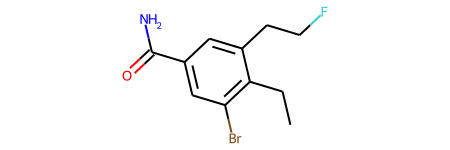

成功生成的高活性分子： CCc1c(Br)cc(C(N)=O)cc1CCF 
Activity（越大药效越好）: 4.7502 
QED（越大类药性越高）: 0.9006 
SA（越小可合成性越高）: 2.6749 
logP（越大疏水性越好）: 2.6224 
------------------------------------------------------------------------------------------------------------


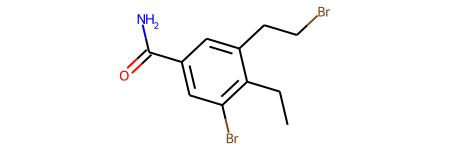

成功生成的高活性分子： CCc1c(Br)cc(C(N)=O)cc1CCBr 
Activity（越大药效越好）: 11.6353 
QED（越大类药性越高）: 0.8448 
SA（越小可合成性越高）: 2.6258 
logP（越大疏水性越好）: 3.0478 
------------------------------------------------------------------------------------------------------------


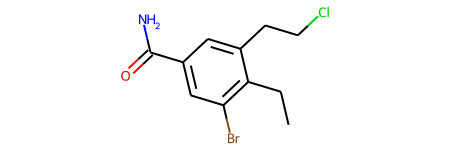

成功生成的高活性分子： CCc1c(Br)cc(C(N)=O)cc1CCCl 
Activity（越大药效越好）: 7.1525 
QED（越大类药性越高）: 0.8514 
SA（越小可合成性越高）: 2.5687 
logP（越大疏水性越好）: 2.8917 
------------------------------------------------------------------------------------------------------------


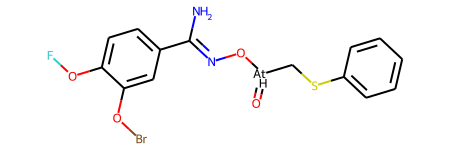

成功生成的高活性分子： N/C(=N\O[AtH](=O)CSc1ccccc1)c1ccc(OF)c(OBr)c1 
Activity（越大药效越好）: 35.0180 
QED（越大类药性越高）: 0.2119 
SA（越小可合成性越高）: 4.2741 
logP（越大疏水性越好）: 3.6388 
------------------------------------------------------------------------------------------------------------


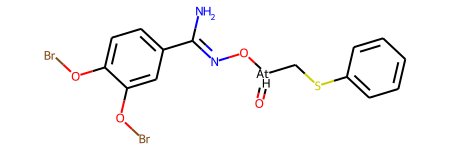

成功生成的高活性分子： N/C(=N\O[AtH](=O)CSc1ccccc1)c1ccc(OBr)c(OBr)c1 
Activity（越大药效越好）: 39.8731 
QED（越大类药性越高）: 0.1970 
SA（越小可合成性越高）: 4.3438 
logP（越大疏水性越好）: 4.0642 
------------------------------------------------------------------------------------------------------------


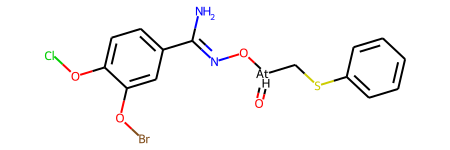

成功生成的高活性分子： N/C(=N\O[AtH](=O)CSc1ccccc1)c1ccc(OCl)c(OBr)c1 
Activity（越大药效越好）: 34.5149 
QED（越大类药性越高）: 0.2063 
SA（越小可合成性越高）: 4.2574 
logP（越大疏水性越好）: 3.9081 
------------------------------------------------------------------------------------------------------------


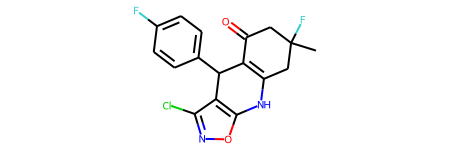

成功生成的高活性分子： CC1(F)CC(=O)C2=C(C1)Nc1onc(Cl)c1C2c1ccc(F)cc1 
Activity（越大药效越好）: 16.6321 
QED（越大类药性越高）: 0.8294 
SA（越小可合成性越高）: 4.0591 
logP（越大疏水性越好）: 4.3697 
------------------------------------------------------------------------------------------------------------


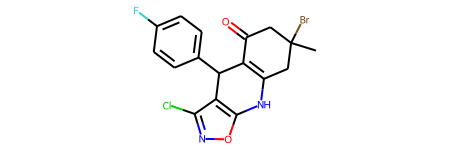

成功生成的高活性分子： CC1(Br)CC(=O)C2=C(C1)Nc1onc(Cl)c1C2c1ccc(F)cc1 
Activity（越大药效越好）: 22.3035 
QED（越大类药性越高）: 0.6853 
SA（越小可合成性越高）: 4.0992 
logP（越大疏水性越好）: 4.7951 
------------------------------------------------------------------------------------------------------------


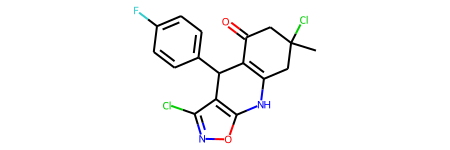

成功生成的高活性分子： CC1(Cl)CC(=O)C2=C(C1)Nc1onc(Cl)c1C2c1ccc(F)cc1 
Activity（越大药效越好）: 17.6832 
QED（越大类药性越高）: 0.7465 
SA（越小可合成性越高）: 4.0705 
logP（越大疏水性越好）: 4.6390 
------------------------------------------------------------------------------------------------------------


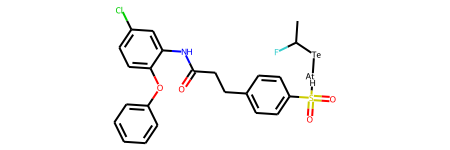

成功生成的高活性分子： CC(F)[Te][AtH]S(=O)(=O)c1ccc(CCC(=O)Nc2cc(Cl)ccc2Oc2ccccc2)cc1 
Activity（越大药效越好）: -5.4214 
QED（越大类药性越高）: 0.2888 
SA（越小可合成性越高）: 3.3041 
logP（越大疏水性越好）: 5.1443 
------------------------------------------------------------------------------------------------------------


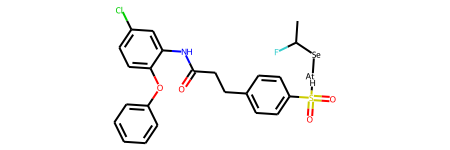

成功生成的高活性分子： CC(F)[Se][AtH]S(=O)(=O)c1ccc(CCC(=O)Nc2cc(Cl)ccc2Oc2ccccc2)cc1 
Activity（越大药效越好）: 3.7595 
QED（越大类药性越高）: 0.2917 
SA（越小可合成性越高）: 3.2880 
logP（越大疏水性越好）: 5.1443 
------------------------------------------------------------------------------------------------------------


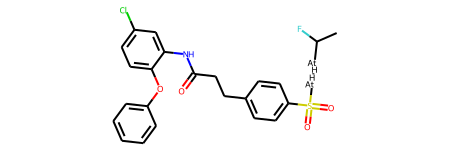

成功生成的高活性分子： CC(F)[AtH][AtH]S(=O)(=O)c1ccc(CCC(=O)Nc2cc(Cl)ccc2Oc2ccccc2)cc1 
Activity（越大药效越好）: -4.8458 
QED（越大类药性越高）: 0.3023 
SA（越小可合成性越高）: 3.3384 
logP（越大疏水性越好）: 5.2574 
------------------------------------------------------------------------------------------------------------


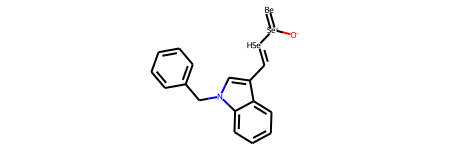

成功生成的高活性分子： [Be]=[Se+]([O-])/[SeH]=C/c1cn(Cc2ccccc2)c2ccccc12 
Activity（越大药效越好）: 20.6032 
QED（越大类药性越高）: 0.5926 
SA（越小可合成性越高）: 3.6883 
logP（越大疏水性越好）: 0.7901 
------------------------------------------------------------------------------------------------------------


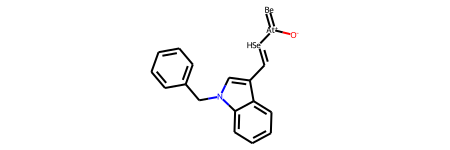

成功生成的高活性分子： [Be]=[At+]([O-])/[SeH]=C/c1cn(Cc2ccccc2)c2ccccc12 
Activity（越大药效越好）: 9.8271 
QED（越大类药性越高）: 0.4627 
SA（越小可合成性越高）: 3.2982 
logP（越大疏水性越好）: 1.1709 
------------------------------------------------------------------------------------------------------------


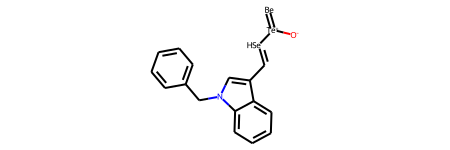

成功生成的高活性分子： [Be]=[Te+]([O-])/[SeH]=C/c1cn(Cc2ccccc2)c2ccccc12 
Activity（越大药效越好）: 17.9272 
QED（越大类药性越高）: 0.5391 
SA（越小可合成性越高）: 3.2675 
logP（越大疏水性越好）: 0.7901 
------------------------------------------------------------------------------------------------------------


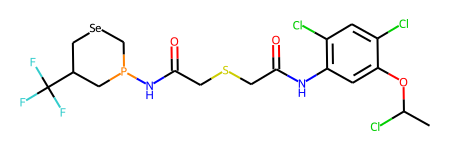

成功生成的高活性分子： CC(Cl)Oc1cc(NC(=O)CSCC(=O)NP2C[Se]CC(C(F)(F)F)C2)c(Cl)cc1Cl 
Activity（越大药效越好）: 29.0705 
QED（越大类药性越高）: 0.2366 
SA（越小可合成性越高）: 4.7658 
logP（越大疏水性越好）: 5.4139 
------------------------------------------------------------------------------------------------------------


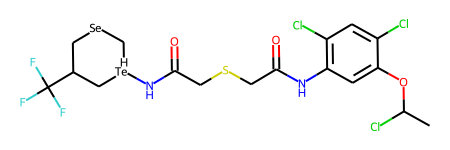

成功生成的高活性分子： CC(Cl)Oc1cc(NC(=O)CSCC(=O)N[TeH]2C[Se]CC(C(F)(F)F)C2)c(Cl)cc1Cl 
Activity（越大药效越好）: 46.3882 
QED（越大类药性越高）: 0.3039 
SA（越小可合成性越高）: 4.8472 
logP（越大疏水性越好）: 4.7408 
------------------------------------------------------------------------------------------------------------


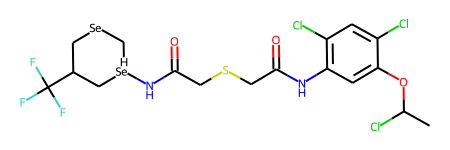

成功生成的高活性分子： CC(Cl)Oc1cc(NC(=O)CSCC(=O)N[SeH]2C[Se]CC(C(F)(F)F)C2)c(Cl)cc1Cl 
Activity（越大药效越好）: 42.9654 
QED（越大类药性越高）: 0.3146 
SA（越小可合成性越高）: 4.8472 
logP（越大疏水性越好）: 4.7408 
------------------------------------------------------------------------------------------------------------


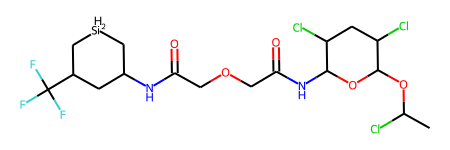

成功生成的高活性分子： CC(Cl)OC1OC(NC(=O)COCC(=O)NC2C[SiH2]CC(C(F)(F)F)C2)C(Cl)CC1Cl 
Activity（越大药效越好）: 29.1458 
QED（越大类药性越高）: 0.3715 
SA（越小可合成性越高）: 5.5394 
logP（越大疏水性越好）: 2.0803 
------------------------------------------------------------------------------------------------------------


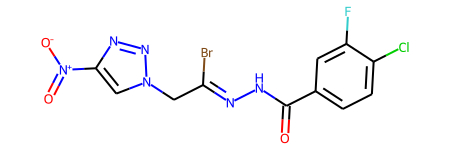

成功生成的高活性分子： O=C(N/N=C(\Br)Cn1cc([N+](=O)[O-])nn1)c1ccc(Cl)c(F)c1 
Activity（越大药效越好）: 19.2126 
QED（越大类药性越高）: 0.4646 
SA（越小可合成性越高）: 3.1246 
logP（越大疏水性越好）: 2.1172 
------------------------------------------------------------------------------------------------------------


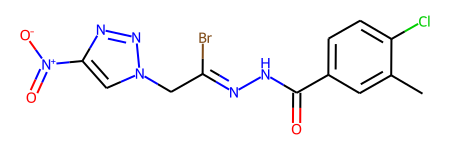

成功生成的高活性分子： Cc1cc(C(=O)N/N=C(\Br)Cn2cc([N+](=O)[O-])nn2)ccc1Cl 
Activity（越大药效越好）: 21.2144 
QED（越大类药性越高）: 0.4687 
SA（越小可合成性越高）: 3.0762 
logP（越大疏水性越好）: 2.2865 
------------------------------------------------------------------------------------------------------------


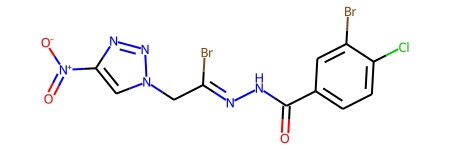

成功生成的高活性分子： O=C(N/N=C(\Br)Cn1cc([N+](=O)[O-])nn1)c1ccc(Cl)c(Br)c1 
Activity（越大药效越好）: 27.0710 
QED（越大类药性越高）: 0.4134 
SA（越小可合成性越高）: 3.2139 
logP（越大疏水性越好）: 2.7406 
------------------------------------------------------------------------------------------------------------


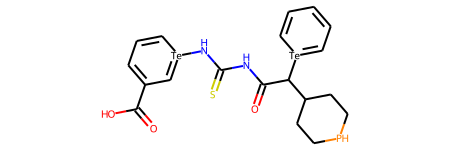

成功生成的高活性分子： O=C(O)C1=CC=C[Te](NC(=S)NC(=O)C(C2CCPCC2)[Te]2=CC=CC=C2)=C1 
Activity（越大药效越好）: 10.5659 
QED（越大类药性越高）: 0.2402 
SA（越小可合成性越高）: 6.0021 
logP（越大疏水性越好）: 1.4751 
------------------------------------------------------------------------------------------------------------


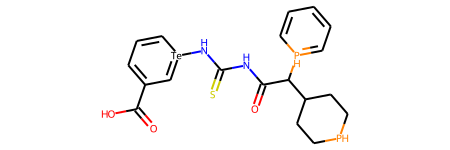

成功生成的高活性分子： O=C(O)C1=CC=C[Te](NC(=S)NC(=O)C(C2CCPCC2)[PH]2=CC=CC=C2)=C1 
Activity（越大药效越好）: -5.5134 
QED（越大类药性越高）: 0.2779 
SA（越小可合成性越高）: 6.2308 
logP（越大疏水性越好）: 2.0295 
------------------------------------------------------------------------------------------------------------


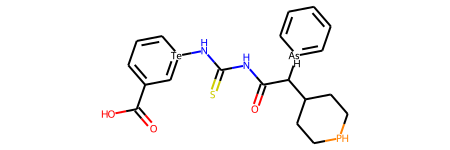

成功生成的高活性分子： O=C(O)C1=CC=C[Te](NC(=S)NC(=O)C(C2CCPCC2)[AsH]2=CC=CC=C2)=C1 
Activity（越大药效越好）: 9.6449 
QED（越大类药性越高）: 0.2539 
SA（越小可合成性越高）: 6.2459 
logP（越大疏水性越好）: 1.2074 
------------------------------------------------------------------------------------------------------------


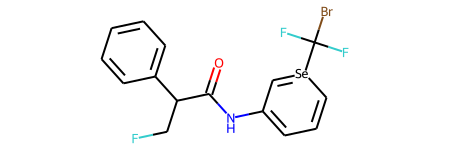

成功生成的高活性分子： O=C(NC1=CC=C[Se](C(F)(F)Br)=C1)C(CF)c1ccccc1 
Activity（越大药效越好）: 11.8088 
QED（越大类药性越高）: 0.5544 
SA（越小可合成性越高）: 4.4937 
logP（越大疏水性越好）: 3.2544 
------------------------------------------------------------------------------------------------------------


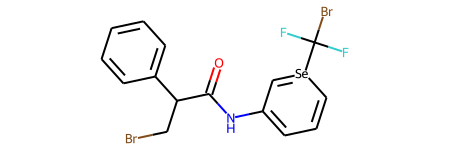

成功生成的高活性分子： O=C(NC1=CC=C[Se](C(F)(F)Br)=C1)C(CBr)c1ccccc1 
Activity（越大药效越好）: 15.3033 
QED（越大类药性越高）: 0.4858 
SA（越小可合成性越高）: 4.4900 
logP（越大疏水性越好）: 3.6798 
------------------------------------------------------------------------------------------------------------


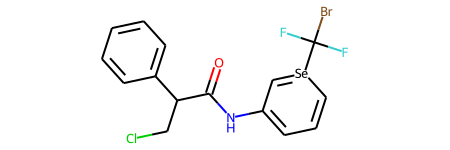

成功生成的高活性分子： O=C(NC1=CC=C[Se](C(F)(F)Br)=C1)C(CCl)c1ccccc1 
Activity（越大药效越好）: 27.5567 
QED（越大类药性越高）: 0.5343 
SA（越小可合成性越高）: 4.4432 
logP（越大疏水性越好）: 3.5237 
------------------------------------------------------------------------------------------------------------


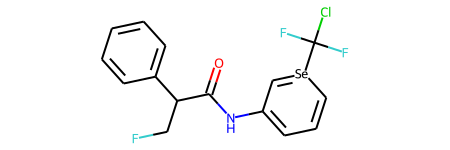

成功生成的高活性分子： O=C(NC1=CC=C[Se](C(F)(F)Cl)=C1)C(CF)c1ccccc1 
Activity（越大药效越好）: 8.1646 
QED（越大类药性越高）: 0.6034 
SA（越小可合成性越高）: 4.4658 
logP（越大疏水性越好）: 3.0983 
------------------------------------------------------------------------------------------------------------


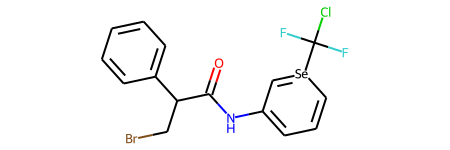

成功生成的高活性分子： O=C(NC1=CC=C[Se](C(F)(F)Cl)=C1)C(CBr)c1ccccc1 
Activity（越大药效越好）: 11.0103 
QED（越大类药性越高）: 0.5343 
SA（越小可合成性越高）: 4.4621 
logP（越大疏水性越好）: 3.5237 
------------------------------------------------------------------------------------------------------------


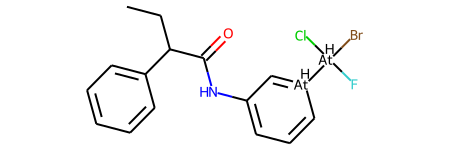

成功生成的高活性分子： CCC(C(=O)NC1=CC=C[AtH]([AtH](F)(Cl)Br)=C1)c1ccccc1 
Activity（越大药效越好）: 17.7592 
QED（越大类药性越高）: 0.4815 
SA（越小可合成性越高）: 4.7285 
logP（越大疏水性越好）: 4.0147 
------------------------------------------------------------------------------------------------------------


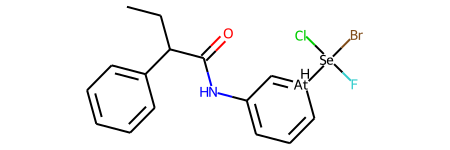

成功生成的高活性分子： CCC(C(=O)NC1=CC=C[AtH]([Se](F)(Cl)Br)=C1)c1ccccc1 
Activity（越大药效越好）: 14.6695 
QED（越大类药性越高）: 0.4821 
SA（越小可合成性越高）: 4.8007 
logP（越大疏水性越好）: 3.9016 
------------------------------------------------------------------------------------------------------------


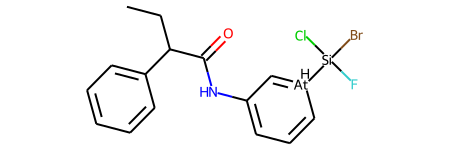

成功生成的高活性分子： CCC(C(=O)NC1=CC=C[AtH]([Si](F)(Cl)Br)=C1)c1ccccc1 
Activity（越大药效越好）: -2.7334 
QED（越大类药性越高）: 0.4041 
SA（越小可合成性越高）: 4.6076 
logP（越大疏水性越好）: 3.9016 
------------------------------------------------------------------------------------------------------------


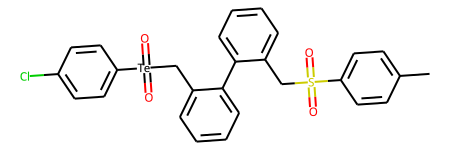

成功生成的高活性分子： Cc1ccc(S(=O)(=O)Cc2ccccc2-c2ccccc2C[Te](=O)(=O)c2ccc(Cl)cc2)cc1 
Activity（越大药效越好）: 16.6449 
QED（越大类药性越高）: 0.2578 
SA（越小可合成性越高）: 3.0319 
logP（越大疏水性越好）: 5.5814 
------------------------------------------------------------------------------------------------------------


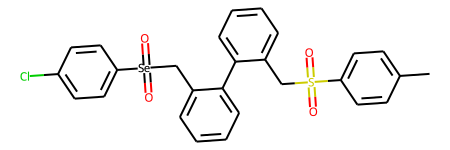

成功生成的高活性分子： Cc1ccc(S(=O)(=O)Cc2ccccc2-c2ccccc2C[Se](=O)(=O)c2ccc(Cl)cc2)cc1 
Activity（越大药效越好）: 20.8855 
QED（越大类药性越高）: 0.2782 
SA（越小可合成性越高）: 2.8994 
logP（越大疏水性越好）: 5.5814 
------------------------------------------------------------------------------------------------------------


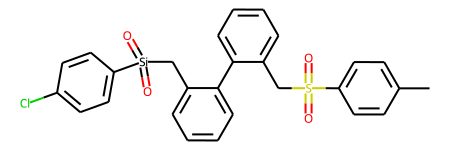

成功生成的高活性分子： Cc1ccc(S(=O)(=O)Cc2ccccc2-c2ccccc2C[Si](=O)(=O)c2ccc(Cl)cc2)cc1 
Activity（越大药效越好）: 14.1953 
QED（越大类药性越高）: 0.3067 
SA（越小可合成性越高）: 2.7651 
logP（越大疏水性越好）: 5.5814 
------------------------------------------------------------------------------------------------------------


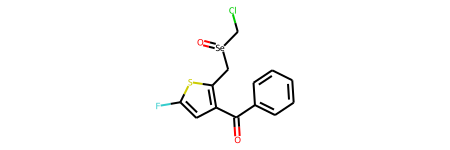

成功生成的高活性分子： O=C(c1ccccc1)c1cc(F)sc1C[Se](=O)CCl 
Activity（越大药效越好）: 9.8576 
QED（越大类药性越高）: 0.4634 
SA（越小可合成性越高）: 3.8123 
logP（越大疏水性越好）: 3.3999 
------------------------------------------------------------------------------------------------------------


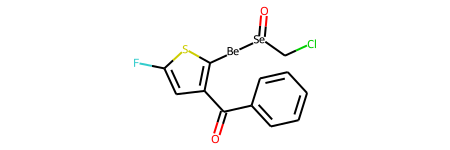

成功生成的高活性分子： O=C(c1ccccc1)c1cc(F)sc1[Be][Se](=O)CCl 
Activity（越大药效越好）: 14.0105 
QED（越大类药性越高）: 0.4661 
SA（越小可合成性越高）: 4.1533 
logP（越大疏水性越好）: 2.1444 
------------------------------------------------------------------------------------------------------------


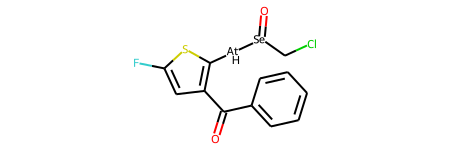

成功生成的高活性分子： O=C(c1ccccc1)c1cc(F)sc1[AtH][Se](=O)CCl 
Activity（越大药效越好）: 5.8902 
QED（越大类药性越高）: 0.3197 
SA（越小可合成性越高）: 4.1533 
logP（越大疏水性越好）: 2.2575 
------------------------------------------------------------------------------------------------------------


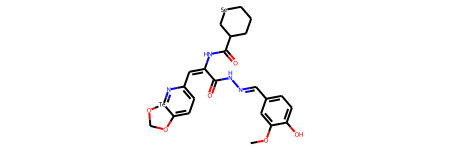

成功生成的高活性分子： COc1cc(/C=N/NC(=O)/C(=C\C2=CC=C3OCO[Te]3=N2)NC(=O)C2CCC[Se]C2)ccc1O 
Activity（越大药效越好）: 11.8665 
QED（越大类药性越高）: 0.1796 
SA（越小可合成性越高）: 4.8421 
logP（越大疏水性越好）: 1.8835 
------------------------------------------------------------------------------------------------------------


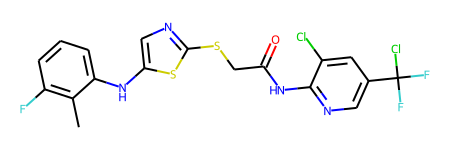

成功生成的高活性分子： Cc1c(F)cccc1Nc1cnc(SCC(=O)Nc2ncc(C(F)(F)Cl)cc2Cl)s1 
Activity（越大药效越好）: 16.6855 
QED（越大类药性越高）: 0.2946 
SA（越小可合成性越高）: 3.0233 
logP（越大疏水性越好）: 6.4015 
------------------------------------------------------------------------------------------------------------


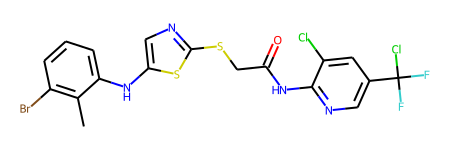

成功生成的高活性分子： Cc1c(Br)cccc1Nc1cnc(SCC(=O)Nc2ncc(C(F)(F)Cl)cc2Cl)s1 
Activity（越大药效越好）: 20.2578 
QED（越大类药性越高）: 0.2428 
SA（越小可合成性越高）: 3.0872 
logP（越大疏水性越好）: 7.0249 
------------------------------------------------------------------------------------------------------------


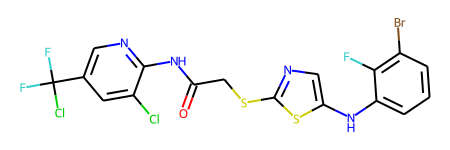

成功生成的高活性分子： O=C(CSc1ncc(Nc2cccc(Br)c2F)s1)Nc1ncc(C(F)(F)Cl)cc1Cl 
Activity（越大药效越好）: 18.6025 
QED（越大类药性越高）: 0.2453 
SA（越小可合成性越高）: 3.1565 
logP（越大疏水性越好）: 6.8556 
------------------------------------------------------------------------------------------------------------


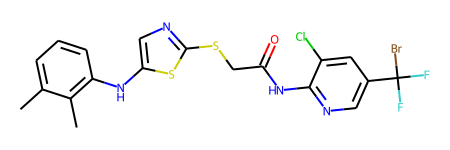

成功生成的高活性分子： Cc1cccc(Nc2cnc(SCC(=O)Nc3ncc(C(F)(F)Br)cc3Cl)s2)c1C 
Activity（越大药效越好）: 22.9114 
QED（越大类药性越高）: 0.2604 
SA（越小可合成性越高）: 2.9987 
logP（越大疏水性越好）: 6.7269 
------------------------------------------------------------------------------------------------------------


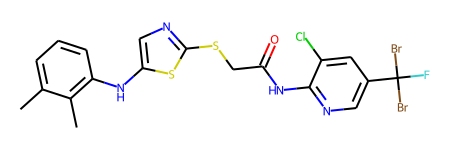

成功生成的高活性分子： Cc1cccc(Nc2cnc(SCC(=O)Nc3ncc(C(F)(Br)Br)cc3Cl)s2)c1C 
Activity（越大药效越好）: 23.8796 
QED（越大类药性越高）: 0.2247 
SA（越小可合成性越高）: 3.0713 
logP（越大疏水性越好）: 7.1523 
------------------------------------------------------------------------------------------------------------


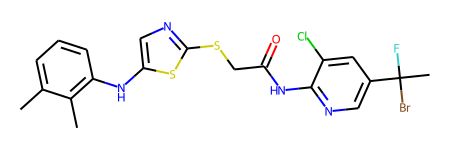

成功生成的高活性分子： Cc1cccc(Nc2cnc(SCC(=O)Nc3ncc(C(C)(F)Br)cc3Cl)s2)c1C 
Activity（越大药效越好）: 19.4612 
QED（越大类药性越高）: 0.2596 
SA（越小可合成性越高）: 3.4296 
logP（越大疏水性越好）: 6.8198 
------------------------------------------------------------------------------------------------------------


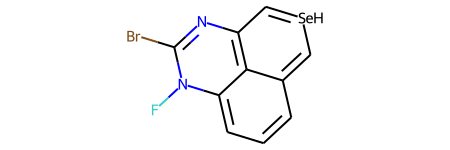

成功生成的高活性分子： FN1C(Br)=NC2=c3c1cccc3=C[SeH]=C2 
Activity（越大药效越好）: 33.2101 
QED（越大类药性越高）: 0.3777 
SA（越小可合成性越高）: 4.8104 
logP（越大疏水性越好）: 0.2405 
------------------------------------------------------------------------------------------------------------


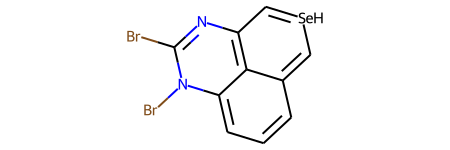

成功生成的高活性分子： BrC1=NC2=c3c(cccc3=C[SeH]=C2)N1Br 
Activity（越大药效越好）: 36.2450 
QED（越大类药性越高）: 0.3597 
SA（越小可合成性越高）: 4.7984 
logP（越大疏水性越好）: 0.6659 
------------------------------------------------------------------------------------------------------------


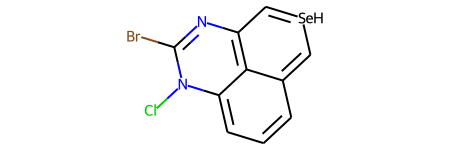

成功生成的高活性分子： ClN1C(Br)=NC2=c3c1cccc3=C[SeH]=C2 
Activity（越大药效越好）: 35.0600 
QED（越大类药性越高）: 0.3790 
SA（越小可合成性越高）: 4.7813 
logP（越大疏水性越好）: 0.5098 
------------------------------------------------------------------------------------------------------------


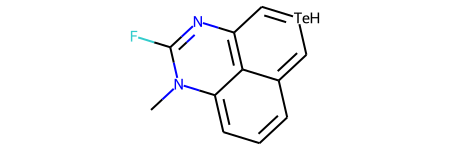

成功生成的高活性分子： CN1C(F)=NC2=c3c1cccc3=C[TeH]=C2 
Activity（越大药效越好）: 24.4937 
QED（越大类药性越高）: 0.4681 
SA（越小可合成性越高）: 4.5692 
logP（越大疏水性越好）: -0.4396 
------------------------------------------------------------------------------------------------------------


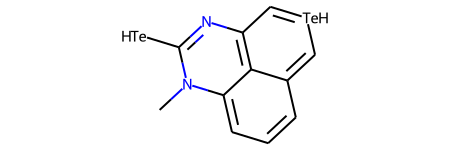

成功生成的高活性分子： CN1C([TeH])=NC2=c3c1cccc3=C[TeH]=C2 
Activity（越大药效越好）: 22.5756 
QED（越大类药性越高）: 0.4621 
SA（越小可合成性越高）: 4.9307 
logP（越大疏水性越好）: -1.5083 
------------------------------------------------------------------------------------------------------------


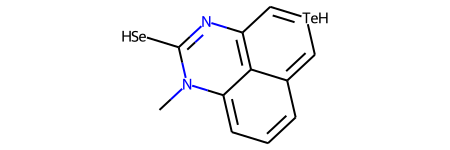

成功生成的高活性分子： CN1C([SeH])=NC2=c3c1cccc3=C[TeH]=C2 
Activity（越大药效越好）: 24.1935 
QED（越大类药性越高）: 0.5029 
SA（越小可合成性越高）: 4.8832 
logP（越大疏水性越好）: -1.5083 
------------------------------------------------------------------------------------------------------------


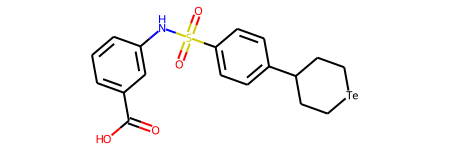

成功生成的高活性分子： O=C(O)c1cccc(NS(=O)(=O)c2ccc(C3CC[Te]CC3)cc2)c1 
Activity（越大药效越好）: 13.2197 
QED（越大类药性越高）: 0.6511 
SA（越小可合成性越高）: 2.8029 
logP（越大疏水性越好）: 3.6038 
------------------------------------------------------------------------------------------------------------


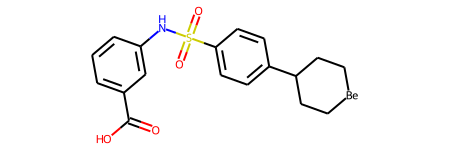

成功生成的高活性分子： O=C(O)c1cccc(NS(=O)(=O)c2ccc(C3CC[Be]CC3)cc2)c1 
Activity（越大药效越好）: 11.4052 
QED（越大类药性越高）: 0.8037 
SA（越小可合成性越高）: 2.8658 
logP（越大疏水性越好）: 3.6038 
------------------------------------------------------------------------------------------------------------


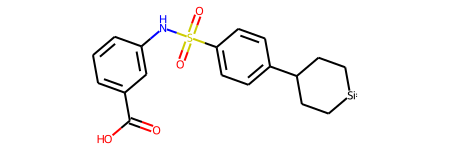

成功生成的高活性分子： O=C(O)c1cccc(NS(=O)(=O)c2ccc(C3CC[Si]CC3)cc2)c1 
Activity（越大药效越好）: 10.9144 
QED（越大类药性越高）: 0.7845 
SA（越小可合成性越高）: 2.8487 
logP（越大疏水性越好）: 3.6038 
------------------------------------------------------------------------------------------------------------


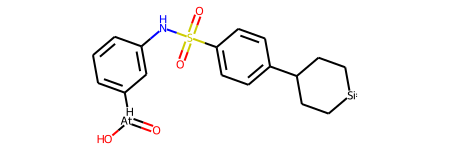

成功生成的高活性分子： O=[AtH](O)c1cccc(NS(=O)(=O)c2ccc(C3CC[Si]CC3)cc2)c1 
Activity（越大药效越好）: 27.6648 
QED（越大类药性越高）: 0.5385 
SA（越小可合成性越高）: 4.2393 
logP（越大疏水性越好）: 2.1367 
------------------------------------------------------------------------------------------------------------


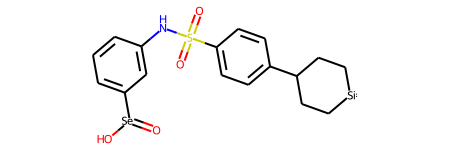

成功生成的高活性分子： O=[Se](O)c1cccc(NS(=O)(=O)c2ccc(C3CC[Si]CC3)cc2)c1 
Activity（越大药效越好）: 0.7590 
QED（越大类药性越高）: 0.6973 
SA（越小可合成性越高）: 4.0417 
logP（越大疏水性越好）: 2.0236 
------------------------------------------------------------------------------------------------------------


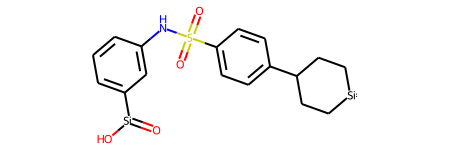

成功生成的高活性分子： O=[Si](O)c1cccc(NS(=O)(=O)c2ccc(C3CC[Si]CC3)cc2)c1 
Activity（越大药效越好）: 21.9482 
QED（越大类药性越高）: 0.7666 
SA（越小可合成性越高）: 3.5541 
logP（越大疏水性越好）: 2.0236 
------------------------------------------------------------------------------------------------------------


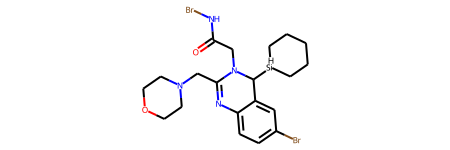

成功生成的高活性分子： O=C(CN1C(CN2CCOCC2)=Nc2ccc(Br)cc2C1[SiH]1CCCCC1)NBr 
Activity（越大药效越好）: 15.1582 
QED（越大类药性越高）: 0.4556 
SA（越小可合成性越高）: 4.2706 
logP（越大疏水性越好）: 3.5443 
------------------------------------------------------------------------------------------------------------


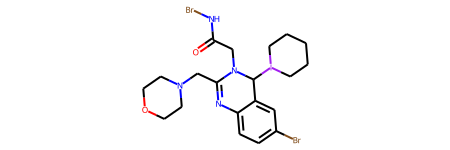

成功生成的高活性分子： O=C(CN1C(CN2CCOCC2)=Nc2ccc(Br)cc2C1I1CCCCC1)NBr 
Activity（越大药效越好）: 6.3081 
QED（越大类药性越高）: 0.2263 
SA（越小可合成性越高）: 4.4335 
logP（越大疏水性越好）: 4.2419 
------------------------------------------------------------------------------------------------------------


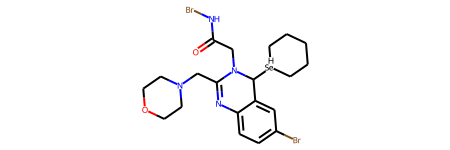

成功生成的高活性分子： O=C(CN1C(CN2CCOCC2)=Nc2ccc(Br)cc2C1[SeH]1CCCCC1)NBr 
Activity（越大药效越好）: 10.1904 
QED（越大类药性越高）: 0.4186 
SA（越小可合成性越高）: 4.4335 
logP（越大疏水性越好）: 3.5443 
------------------------------------------------------------------------------------------------------------


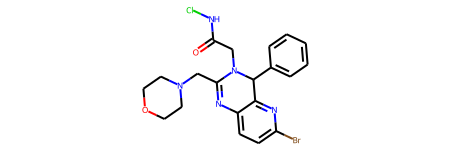

成功生成的高活性分子： O=C(CN1C(CN2CCOCC2)=Nc2ccc(Br)nc2C1c1ccccc1)NCl 
Activity（越大药效越好）: 15.3397 
QED（越大类药性越高）: 0.5286 
SA（越小可合成性越高）: 3.5950 
logP（越大疏水性越好）: 2.8813 
------------------------------------------------------------------------------------------------------------


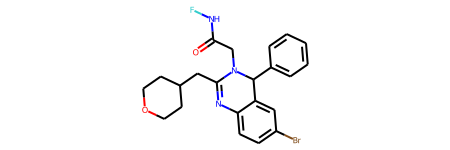

成功生成的高活性分子： O=C(CN1C(CC2CCOCC2)=Nc2ccc(Br)cc2C1c1ccccc1)NF 
Activity（越大药效越好）: 14.1706 
QED（越大类药性越高）: 0.6586 
SA（越小可合成性越高）: 3.4574 
logP（越大疏水性越好）: 4.7015 
------------------------------------------------------------------------------------------------------------


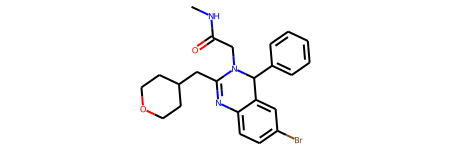

成功生成的高活性分子： CNC(=O)CN1C(CC2CCOCC2)=Nc2ccc(Br)cc2C1c1ccccc1 
Activity（越大药效越好）: 23.5884 
QED（越大类药性越高）: 0.7238 
SA（越小可合成性越高）: 3.2157 
logP（越大疏水性越好）: 4.4468 
------------------------------------------------------------------------------------------------------------


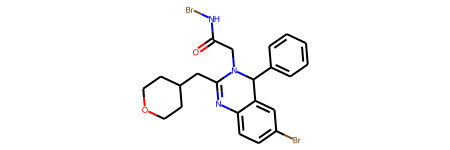

成功生成的高活性分子： O=C(CN1C(CC2CCOCC2)=Nc2ccc(Br)cc2C1c1ccccc1)NBr 
Activity（越大药效越好）: 17.8817 
QED（越大类药性越高）: 0.5560 
SA（越小可合成性越高）: 3.4453 
logP（越大疏水性越好）: 5.1269 
------------------------------------------------------------------------------------------------------------


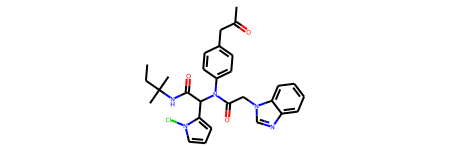

成功生成的高活性分子： CCC(C)(C)NC(=O)C(c1cccn1Cl)N(C(=O)Cn1cnc2ccccc21)c1ccc(CC(C)=O)cc1 
Activity（越大药效越好）: 37.9148 
QED（越大类药性越高）: 0.3087 
SA（越小可合成性越高）: 3.4761 
logP（越大疏水性越好）: 5.0505 
------------------------------------------------------------------------------------------------------------


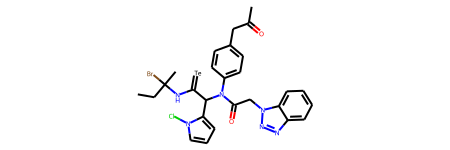

成功生成的高活性分子： CCC(C)(Br)NC(=[Te])C(c1cccn1Cl)N(C(=O)Cn1nnc2ccccc21)c1ccc(CC(C)=O)cc1 
Activity（越大药效越好）: 27.4099 
QED（越大类药性越高）: 0.1404 
SA（越小可合成性越高）: 4.2447 
logP（越大疏水性越好）: 4.5498 
------------------------------------------------------------------------------------------------------------


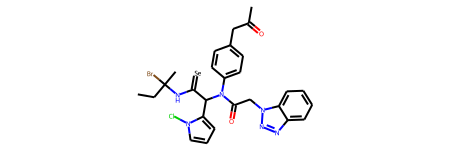

成功生成的高活性分子： CCC(C)(Br)NC(=[Se])C(c1cccn1Cl)N(C(=O)Cn1nnc2ccccc21)c1ccc(CC(C)=O)cc1 
Activity（越大药效越好）: 28.2979 
QED（越大类药性越高）: 0.1449 
SA（越小可合成性越高）: 4.2201 
logP（越大疏水性越好）: 4.5498 
------------------------------------------------------------------------------------------------------------


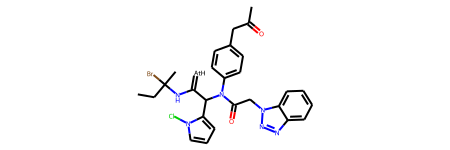

成功生成的高活性分子： CCC(C)(Br)NC(=[AtH])C(c1cccn1Cl)N(C(=O)Cn1nnc2ccccc21)c1ccc(CC(C)=O)cc1 
Activity（越大药效越好）: 27.4732 
QED（越大类药性越高）: 0.1766 
SA（越小可合成性越高）: 4.2793 
logP（越大疏水性越好）: 4.6629 
------------------------------------------------------------------------------------------------------------


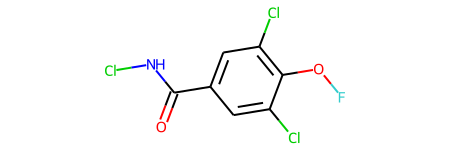

成功生成的高活性分子： O=C(NCl)c1cc(Cl)c(OF)c(Cl)c1 
Activity（越大药效越好）: 21.5065 
QED（越大类药性越高）: 0.8277 
SA（越小可合成性越高）: 2.9551 
logP（越大疏水性越好）: 3.1403 
------------------------------------------------------------------------------------------------------------


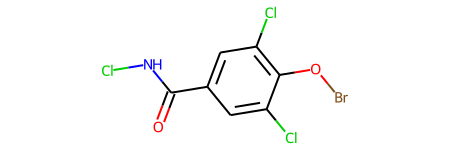

成功生成的高活性分子： O=C(NCl)c1cc(Cl)c(OBr)c(Cl)c1 
Activity（越大药效越好）: 27.8824 
QED（越大类药性越高）: 0.8465 
SA（越小可合成性越高）: 3.0506 
logP（越大疏水性越好）: 3.5657 
------------------------------------------------------------------------------------------------------------


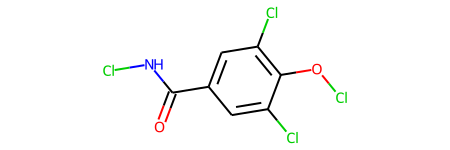

成功生成的高活性分子： O=C(NCl)c1cc(Cl)c(OCl)c(Cl)c1 
Activity（越大药效越好）: 18.4081 
QED（越大类药性越高）: 0.8397 
SA（越小可合成性越高）: 2.9142 
logP（越大疏水性越好）: 3.4096 
------------------------------------------------------------------------------------------------------------


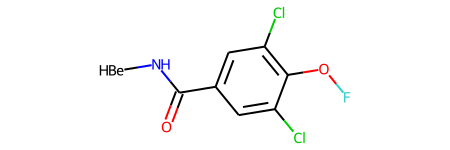

成功生成的高活性分子： [BeH]NC(=O)c1cc(Cl)c(OF)c(Cl)c1 
Activity（越大药效越好）: 19.0525 
QED（越大类药性越高）: 0.7906 
SA（越小可合成性越高）: 3.4189 
logP（越大疏水性越好）: 1.8023 
------------------------------------------------------------------------------------------------------------


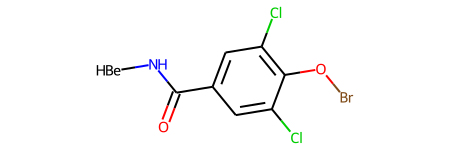

成功生成的高活性分子： [BeH]NC(=O)c1cc(Cl)c(OBr)c(Cl)c1 
Activity（越大药效越好）: 21.5121 
QED（越大类药性越高）: 0.8494 
SA（越小可合成性越高）: 3.5144 
logP（越大疏水性越好）: 2.2277 
------------------------------------------------------------------------------------------------------------


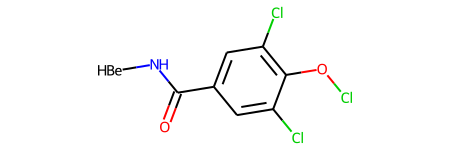

成功生成的高活性分子： [BeH]NC(=O)c1cc(Cl)c(OCl)c(Cl)c1 
Activity（越大药效越好）: 13.4533 
QED（越大类药性越高）: 0.8150 
SA（越小可合成性越高）: 3.3780 
logP（越大疏水性越好）: 2.0716 
------------------------------------------------------------------------------------------------------------


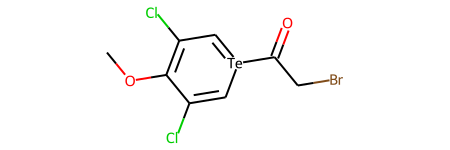

成功生成的高活性分子： COC1=C(Cl)C=[Te](C(=O)CBr)C=C1Cl 
Activity（越大药效越好）: 26.7664 
QED（越大类药性越高）: 0.5236 
SA（越小可合成性越高）: 4.7537 
logP（越大疏水性越好）: 2.1406 
------------------------------------------------------------------------------------------------------------


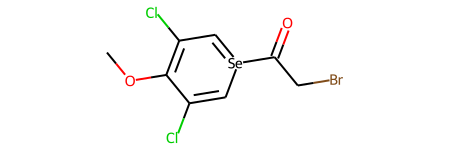

成功生成的高活性分子： COC1=C(Cl)C=[Se](C(=O)CBr)C=C1Cl 
Activity（越大药效越好）: 27.8415 
QED（越大类药性越高）: 0.5663 
SA（越小可合成性越高）: 5.1087 
logP（越大疏水性越好）: 2.1406 
------------------------------------------------------------------------------------------------------------


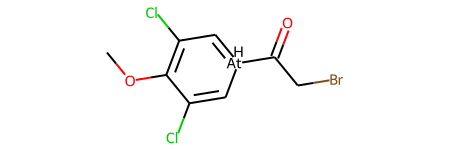

成功生成的高活性分子： COC1=C(Cl)C=[AtH](C(=O)CBr)C=C1Cl 
Activity（越大药效越好）: 29.9948 
QED（越大类药性越高）: 0.5604 
SA（越小可合成性越高）: 5.1706 
logP（越大疏水性越好）: 2.2537 
------------------------------------------------------------------------------------------------------------


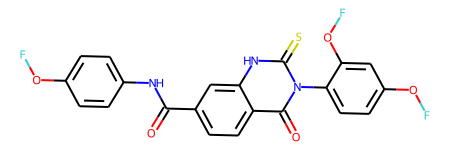

成功生成的高活性分子： O=C(Nc1ccc(OF)cc1)c1ccc2c(=O)n(-c3ccc(OF)cc3OF)c(=S)[nH]c2c1 
Activity（越大药效越好）: 11.3454 
QED（越大类药性越高）: 0.3775 
SA（越小可合成性越高）: 3.0029 
logP（越大疏水性越好）: 5.0905 
------------------------------------------------------------------------------------------------------------


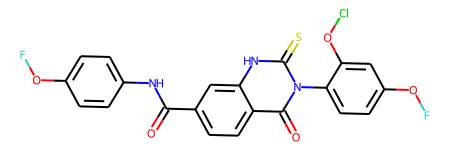

成功生成的高活性分子： O=C(Nc1ccc(OF)cc1)c1ccc2c(=O)n(-c3ccc(OF)cc3OCl)c(=S)[nH]c2c1 
Activity（越大药效越好）: 6.3657 
QED（越大类药性越高）: 0.3526 
SA（越小可合成性越高）: 2.9907 
logP（越大疏水性越好）: 5.3598 
------------------------------------------------------------------------------------------------------------


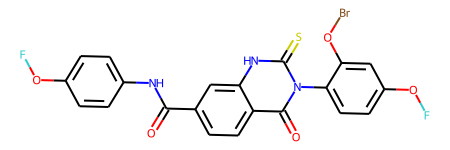

成功生成的高活性分子： O=C(Nc1ccc(OF)cc1)c1ccc2c(=O)n(-c3ccc(OF)cc3OBr)c(=S)[nH]c2c1 
Activity（越大药效越好）: 14.3767 
QED（越大类药性越高）: 0.3157 
SA（越小可合成性越高）: 3.0539 
logP（越大疏水性越好）: 5.5159 
------------------------------------------------------------------------------------------------------------


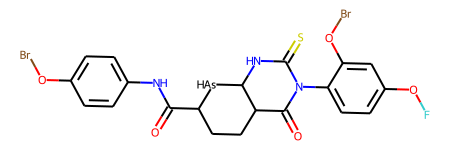

成功生成的高活性分子： O=C(Nc1ccc(OBr)cc1)C1CCC2C(=O)N(c3ccc(OF)cc3OBr)C(=S)NC2[AsH]1 
Activity（越大药效越好）: 6.6098 
QED（越大类药性越高）: 0.3546 
SA（越小可合成性越高）: 5.0260 
logP（越大疏水性越好）: 4.1482 
------------------------------------------------------------------------------------------------------------


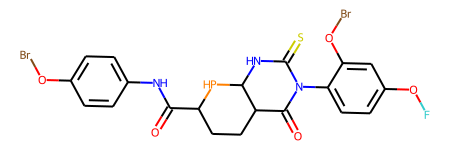

成功生成的高活性分子： O=C(Nc1ccc(OBr)cc1)C1CCC2C(=O)N(c3ccc(OF)cc3OBr)C(=S)NC2P1 
Activity（越大药效越好）: -3.9947 
QED（越大类药性越高）: 0.3482 
SA（越小可合成性越高）: 4.9678 
logP（越大疏水性越好）: 4.9703 
------------------------------------------------------------------------------------------------------------


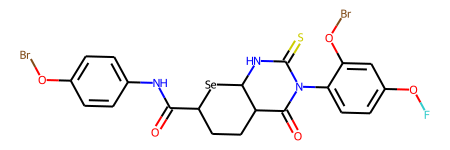

成功生成的高活性分子： O=C(Nc1ccc(OBr)cc1)C1CCC2C(=O)N(c3ccc(OF)cc3OBr)C(=S)NC2[Se]1 
Activity（越大药效越好）: 17.5627 
QED（越大类药性越高）: 0.3486 
SA（越小可合成性越高）: 4.8233 
logP（越大疏水性越好）: 4.4159 
------------------------------------------------------------------------------------------------------------


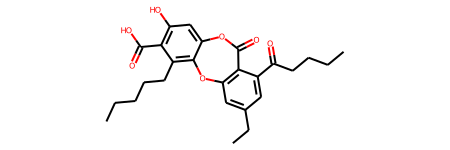

成功生成的高活性分子： CCCCCc1c2c(cc(O)c1C(=O)O)OC(=O)c1c(cc(CC)cc1C(=O)CCCC)O2 
Activity（越大药效越好）: 12.6925 
QED（越大类药性越高）: 0.1936 
SA（越小可合成性越高）: 3.0238 
logP（越大疏水性越好）: 6.0833 
------------------------------------------------------------------------------------------------------------


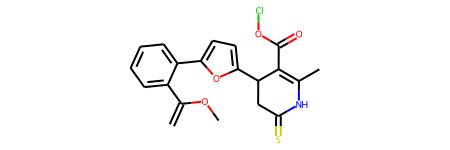

成功生成的高活性分子： C=C(OC)c1ccccc1-c1ccc(C2CC(=S)NC(C)=C2C(=O)OCl)o1 
Activity（越大药效越好）: 20.3165 
QED（越大类药性越高）: 0.5633 
SA（越小可合成性越高）: 3.7959 
logP（越大疏水性越好）: 4.9390 
------------------------------------------------------------------------------------------------------------


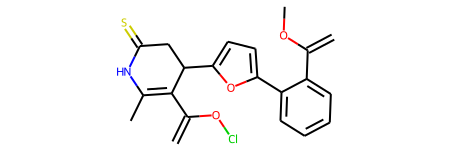

成功生成的高活性分子： C=C(OCl)C1=C(C)NC(=S)CC1c1ccc(-c2ccccc2C(=C)OC)o1 
Activity（越大药效越好）: 22.6457 
QED（越大类药性越高）: 0.4799 
SA（越小可合成性越高）: 3.9868 
logP（越大疏水性越好）: 5.9261 
------------------------------------------------------------------------------------------------------------


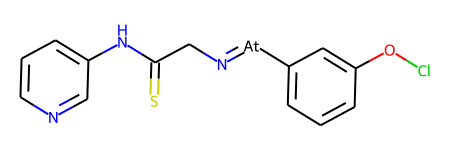

成功生成的高活性分子： S=C(C/N=[At]/c1cccc(OCl)c1)Nc1cccnc1 
Activity（越大药效越好）: 17.4355 
QED（越大类药性越高）: 0.6390 
SA（越小可合成性越高）: 3.8444 
logP（越大疏水性越好）: 2.9476 
------------------------------------------------------------------------------------------------------------


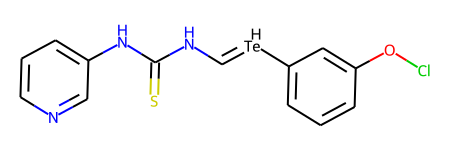

成功生成的高活性分子： S=C(N/C=[TeH]/c1cccc(OCl)c1)Nc1cccnc1 
Activity（越大药效越好）: 28.1389 
QED（越大类药性越高）: 0.5779 
SA（越小可合成性越高）: 3.6910 
logP（越大疏水性越好）: 1.4223 
------------------------------------------------------------------------------------------------------------


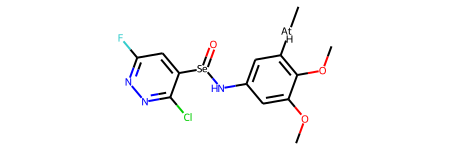

成功生成的高活性分子： COc1cc(N[Se](=O)c2cc(F)nnc2Cl)cc([AtH]C)c1OC 
Activity（越大药效越好）: 10.4468 
QED（越大类药性越高）: 0.4977 
SA（越小可合成性越高）: 4.7905 
logP（越大疏水性越好）: 1.0148 
------------------------------------------------------------------------------------------------------------


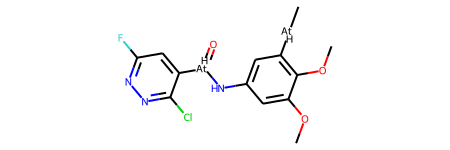

成功生成的高活性分子： COc1cc(N[AtH](=O)c2cc(F)nnc2Cl)cc([AtH]C)c1OC 
Activity（越大药效越好）: 20.3057 
QED（越大类药性越高）: 0.4805 
SA（越小可合成性越高）: 4.9022 
logP（越大疏水性越好）: 1.1279 
------------------------------------------------------------------------------------------------------------


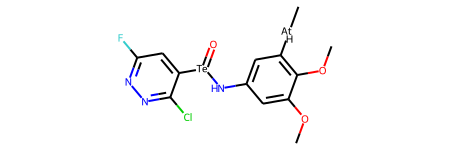

成功生成的高活性分子： COc1cc(N[Te](=O)c2cc(F)nnc2Cl)cc([AtH]C)c1OC 
Activity（越大药效越好）: 15.8524 
QED（越大类药性越高）: 0.4707 
SA（越小可合成性越高）: 4.4853 
logP（越大疏水性越好）: 1.0148 
------------------------------------------------------------------------------------------------------------


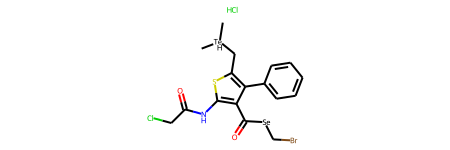

成功生成的高活性分子： C[TeH](C)Cc1sc(NC(=O)CCl)c(C(=O)[Se]CBr)c1-c1ccccc1.Cl 
Activity（越大药效越好）: 38.9454 
QED（越大类药性越高）: 0.3280 
SA（越小可合成性越高）: 3.8999 
logP（越大疏水性越好）: 4.7794 
------------------------------------------------------------------------------------------------------------


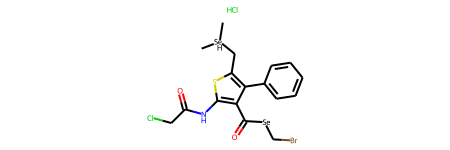

成功生成的高活性分子： C[SeH](C)Cc1sc(NC(=O)CCl)c(C(=O)[Se]CBr)c1-c1ccccc1.Cl 
Activity（越大药效越好）: 42.4808 
QED（越大类药性越高）: 0.3456 
SA（越小可合成性越高）: 3.8999 
logP（越大疏水性越好）: 4.7794 
------------------------------------------------------------------------------------------------------------


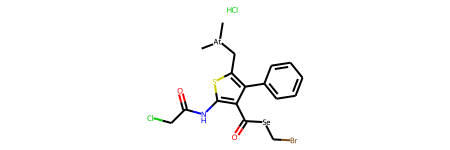

成功生成的高活性分子： C[At](C)Cc1sc(NC(=O)CCl)c(C(=O)[Se]CBr)c1-c1ccccc1.Cl 
Activity（越大药效越好）: 41.7047 
QED（越大类药性越高）: 0.2904 
SA（越小可合成性越高）: 3.8999 
logP（越大疏水性越好）: 5.4279 
------------------------------------------------------------------------------------------------------------


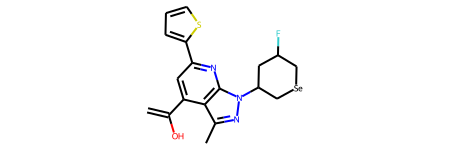

成功生成的高活性分子： C=C(O)c1cc(-c2cccs2)nc2c1c(C)nn2C1C[Se]CC(F)C1 
Activity（越大药效越好）: 32.4206 
QED（越大类药性越高）: 0.4864 
SA（越小可合成性越高）: 4.2950 
logP（越大疏水性越好）: 4.8206 
------------------------------------------------------------------------------------------------------------


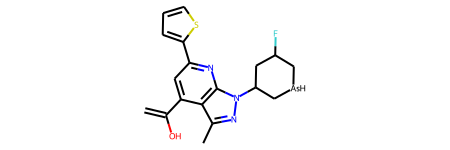

成功生成的高活性分子： C=C(O)c1cc(-c2cccs2)nc2c1c(C)nn2C1C[AsH]CC(F)C1 
Activity（越大药效越好）: 26.4941 
QED（越大类药性越高）: 0.5006 
SA（越小可合成性越高）: 4.6083 
logP（越大疏水性越好）: 4.5529 
------------------------------------------------------------------------------------------------------------


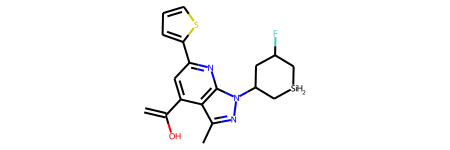

成功生成的高活性分子： C=C(O)c1cc(-c2cccs2)nc2c1c(C)nn2C1C[SiH2]CC(F)C1 
Activity（越大药效越好）: 33.9887 
QED（越大类药性越高）: 0.5505 
SA（越小可合成性越高）: 4.3749 
logP（越大疏水性越好）: 4.2852 
------------------------------------------------------------------------------------------------------------


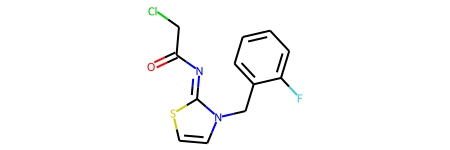

成功生成的高活性分子： O=C(CCl)N=c1sccn1Cc1ccccc1F 
Activity（越大药效越好）: 31.3174 
QED（越大类药性越高）: 0.7972 
SA（越小可合成性越高）: 2.5112 
logP（越大疏水性越好）: 2.4031 
------------------------------------------------------------------------------------------------------------


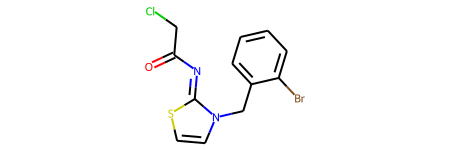

成功生成的高活性分子： O=C(CCl)N=c1sccn1Cc1ccccc1Br 
Activity（越大药效越好）: 37.5131 
QED（越大类药性越高）: 0.7874 
SA（越小可合成性越高）: 2.6051 
logP（越大疏水性越好）: 3.0265 
------------------------------------------------------------------------------------------------------------


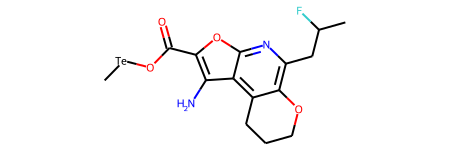

成功生成的高活性分子： C[Te]OC(=O)c1oc2nc(CC(C)F)c3c(c2c1N)CCCO3 
Activity（越大药效越好）: -10.5664 
QED（越大类药性越高）: 0.7421 
SA（越小可合成性越高）: 4.4691 
logP（越大疏水性越好）: 2.4596 
------------------------------------------------------------------------------------------------------------


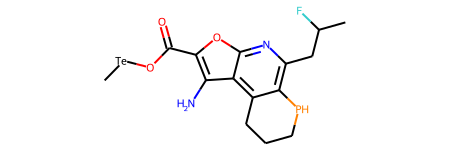

成功生成的高活性分子： C[Te]OC(=O)c1oc2nc(CC(C)F)c3c(c2c1N)CCCP3 
Activity（越大药效越好）: -9.9802 
QED（越大类药性越高）: 0.5702 
SA（越小可合成性越高）: 5.3139 
logP（越大疏水性越好）: 2.3846 
------------------------------------------------------------------------------------------------------------


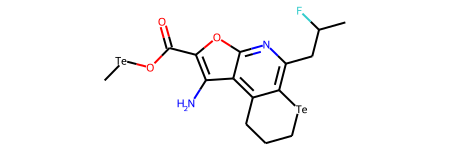

成功生成的高活性分子： C[Te]OC(=O)c1oc2nc(CC(C)F)c3c(c2c1N)CCC[Te]3 
Activity（越大药效越好）: -10.6428 
QED（越大类药性越高）: 0.5917 
SA（越小可合成性越高）: 5.1262 
logP（越大疏水性越好）: 1.8286 
------------------------------------------------------------------------------------------------------------


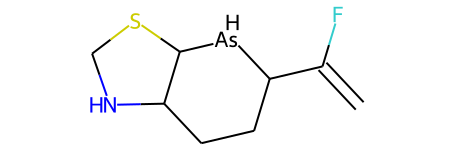

成功生成的高活性分子： C=C(F)C1CCC2NCSC2[AsH]1 
Activity（越大药效越好）: -30.6925 
QED（越大类药性越高）: 0.7063 
SA（越小可合成性越高）: 6.2757 
logP（越大疏水性越好）: 1.4770 
------------------------------------------------------------------------------------------------------------


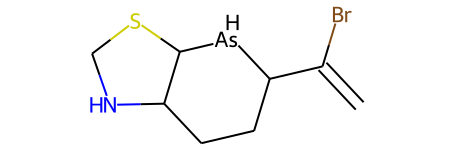

成功生成的高活性分子： C=C(Br)C1CCC2NCSC2[AsH]1 
Activity（越大药效越好）: -23.9194 
QED（越大类药性越高）: 0.7426 
SA（越小可合成性越高）: 6.3390 
logP（越大疏水性越好）: 1.9024 
------------------------------------------------------------------------------------------------------------


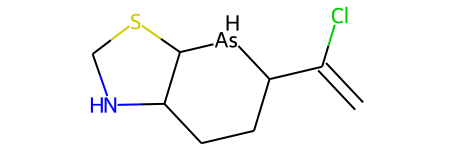

成功生成的高活性分子： C=C(Cl)C1CCC2NCSC2[AsH]1 
Activity（越大药效越好）: -16.0841 
QED（越大类药性越高）: 0.7252 
SA（越小可合成性越高）: 6.2585 
logP（越大疏水性越好）: 1.7463 
------------------------------------------------------------------------------------------------------------


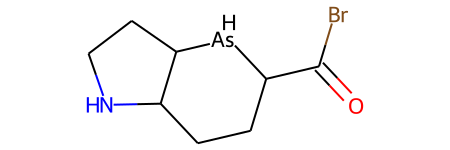

成功生成的高活性分子： O=C(Br)C1CCC2NCCC2[AsH]1 
Activity（越大药效越好）: -13.6772 
QED（越大类药性越高）: 0.5790 
SA（越小可合成性越高）: 5.6850 
logP（越大疏水性越好）: 1.0771 
------------------------------------------------------------------------------------------------------------


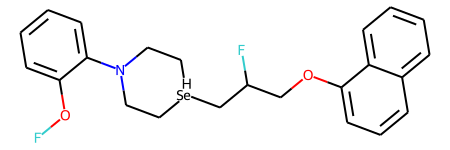

成功生成的高活性分子： FOc1ccccc1N1CC[SeH](CC(F)COc2cccc3ccccc23)CC1 
Activity（越大药效越好）: 19.9474 
QED（越大类药性越高）: 0.4272 
SA（越小可合成性越高）: 3.8153 
logP（越大疏水性越好）: 5.5673 
------------------------------------------------------------------------------------------------------------


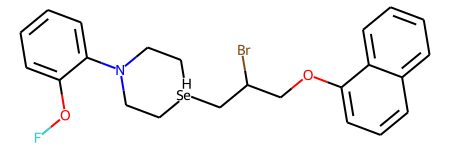

成功生成的高活性分子： FOc1ccccc1N1CC[SeH](CC(Br)COc2cccc3ccccc23)CC1 
Activity（越大药效越好）: 19.1824 
QED（越大类药性越高）: 0.2795 
SA（越小可合成性越高）: 3.8595 
logP（越大疏水性越好）: 5.9927 
------------------------------------------------------------------------------------------------------------


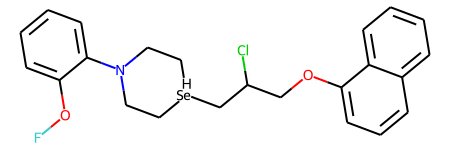

成功生成的高活性分子： FOc1ccccc1N1CC[SeH](CC(Cl)COc2cccc3ccccc23)CC1 
Activity（越大药效越好）: 39.4089 
QED（越大类药性越高）: 0.3133 
SA（越小可合成性越高）: 3.8612 
logP（越大疏水性越好）: 5.8366 
------------------------------------------------------------------------------------------------------------


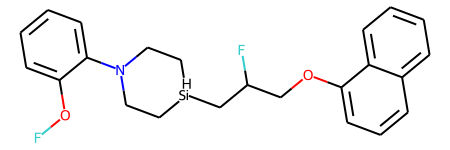

成功生成的高活性分子： FOc1ccccc1N1CC[SiH](CC(F)COc2cccc3ccccc23)CC1 
Activity（越大药效越好）: 18.8655 
QED（越大类药性越高）: 0.4730 
SA（越小可合成性越高）: 3.6590 
logP（越大疏水性越好）: 5.5673 
------------------------------------------------------------------------------------------------------------


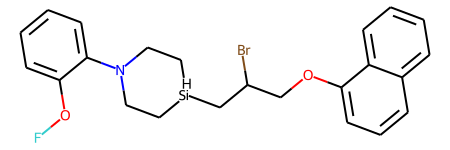

成功生成的高活性分子： FOc1ccccc1N1CC[SiH](CC(Br)COc2cccc3ccccc23)CC1 
Activity（越大药效越好）: 15.0162 
QED（越大类药性越高）: 0.3101 
SA（越小可合成性越高）: 3.7032 
logP（越大疏水性越好）: 5.9927 
------------------------------------------------------------------------------------------------------------


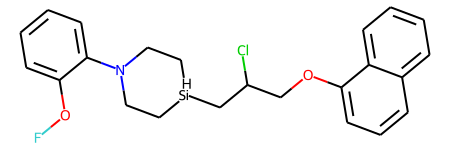

成功生成的高活性分子： FOc1ccccc1N1CC[SiH](CC(Cl)COc2cccc3ccccc23)CC1 
Activity（越大药效越好）: 34.9235 
QED（越大类药性越高）: 0.3477 
SA（越小可合成性越高）: 3.7049 
logP（越大疏水性越好）: 5.8366 
------------------------------------------------------------------------------------------------------------


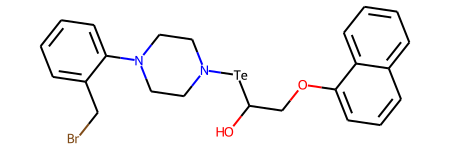

成功生成的高活性分子： OC(COc1cccc2ccccc12)[Te]N1CCN(c2ccccc2CBr)CC1 
Activity（越大药效越好）: 7.5962 
QED（越大类药性越高）: 0.3468 
SA（越小可合成性越高）: 3.3854 
logP（越大疏水性越好）: 3.8733 
------------------------------------------------------------------------------------------------------------


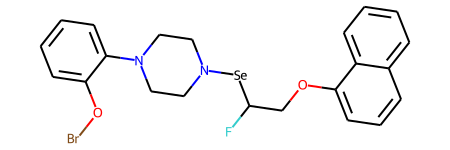

成功生成的高活性分子： FC(COc1cccc2ccccc12)[Se]N1CCN(c2ccccc2OBr)CC1 
Activity（越大药效越好）: 23.0513 
QED（越大类药性越高）: 0.4209 
SA（越小可合成性越高）: 3.4887 
logP（越大疏水性越好）: 4.6443 
------------------------------------------------------------------------------------------------------------


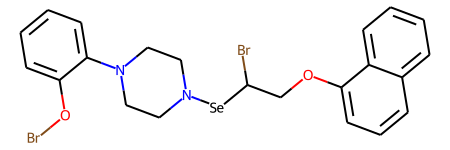

成功生成的高活性分子： BrOc1ccccc1N1CCN([Se]C(Br)COc2cccc3ccccc23)CC1 
Activity（越大药效越好）: 21.5252 
QED（越大类药性越高）: 0.2860 
SA（越小可合成性越高）: 3.5083 
logP（越大疏水性越好）: 5.0697 
------------------------------------------------------------------------------------------------------------


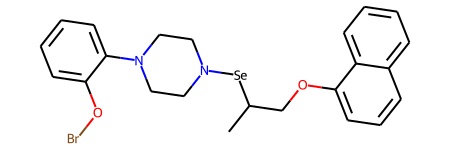

成功生成的高活性分子： CC(COc1cccc2ccccc12)[Se]N1CCN(c2ccccc2OBr)CC1 
Activity（越大药效越好）: 23.6409 
QED（越大类药性越高）: 0.4025 
SA（越小可合成性越高）: 3.4417 
logP（越大疏水性越好）: 5.1571 
------------------------------------------------------------------------------------------------------------


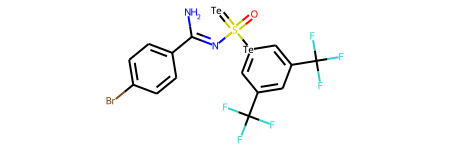

成功生成的高活性分子： N/C(=N\S(=O)(=[Te])[Te]1=CC(C(F)(F)F)=CC(C(F)(F)F)=C1)c1ccc(Br)cc1 
Activity（越大药效越好）: 4.7093 
QED（越大类药性越高）: 0.2278 
SA（越小可合成性越高）: 4.4657 
logP（越大疏水性越好）: 3.3429 
------------------------------------------------------------------------------------------------------------


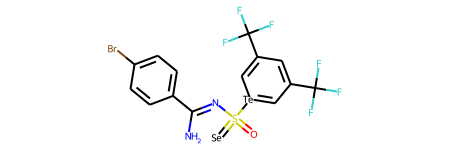

成功生成的高活性分子： N/C(=N\S(=O)(=[Se])[Te]1=CC(C(F)(F)F)=CC(C(F)(F)F)=C1)c1ccc(Br)cc1 
Activity（越大药效越好）: 5.3479 
QED（越大类药性越高）: 0.2358 
SA（越小可合成性越高）: 4.4467 
logP（越大疏水性越好）: 3.3429 
------------------------------------------------------------------------------------------------------------


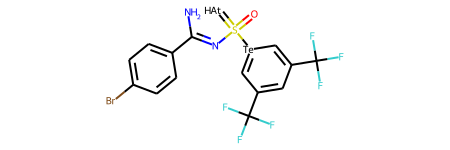

成功生成的高活性分子： N/C(=N\S(=O)(=[AtH])[Te]1=CC(C(F)(F)F)=CC(C(F)(F)F)=C1)c1ccc(Br)cc1 
Activity（越大药效越好）: 0.2135 
QED（越大类药性越高）: 0.2214 
SA（越小可合成性越高）: 4.5004 
logP（越大疏水性越好）: 3.4560 
------------------------------------------------------------------------------------------------------------


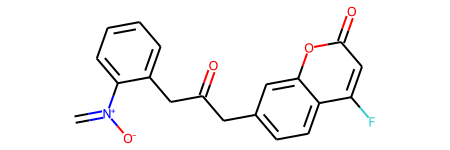

成功生成的高活性分子： C=[N+]([O-])c1ccccc1CC(=O)Cc1ccc2c(F)cc(=O)oc2c1 
Activity（越大药效越好）: 24.2652 
QED（越大类药性越高）: 0.2353 
SA（越小可合成性越高）: 2.7767 
logP（越大疏水性越好）: 3.1288 
------------------------------------------------------------------------------------------------------------


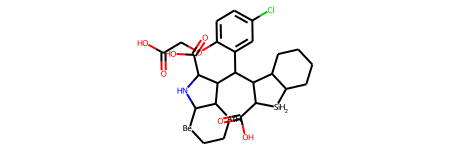

成功生成的高活性分子： O=C(O)COc1ccc(Cl)cc1C(C1C(C(=O)O)[SiH2]C2CCCCC21)C1C(C(=O)O)NC2[Be]CC[AtH]C21 
Activity（越大药效越好）: -34.3674 
QED（越大类药性越高）: 0.2995 
SA（越小可合成性越高）: 6.1386 
logP（越大疏水性越好）: 2.6963 
------------------------------------------------------------------------------------------------------------


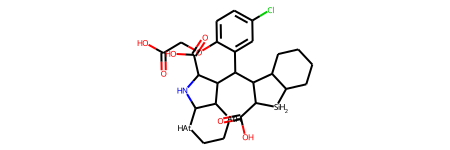

成功生成的高活性分子： O=C(O)COc1ccc(Cl)cc1C(C1C(C(=O)O)[SiH2]C2CCCCC21)C1C(C(=O)O)NC2[AtH]CC[AtH]C21 
Activity（越大药效越好）: -35.2053 
QED（越大类药性越高）: 0.2932 
SA（越小可合成性越高）: 6.1386 
logP（越大疏水性越好）: 2.8094 
------------------------------------------------------------------------------------------------------------


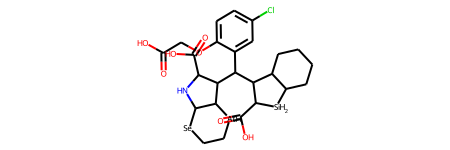

成功生成的高活性分子： O=C(O)COc1ccc(Cl)cc1C(C1C(C(=O)O)[SiH2]C2CCCCC21)C1C(C(=O)O)NC2[Se]CC[AtH]C21 
Activity（越大药效越好）: -31.7748 
QED（越大类药性越高）: 0.2952 
SA（越小可合成性越高）: 6.0513 
logP（越大疏水性越好）: 2.6963 
------------------------------------------------------------------------------------------------------------


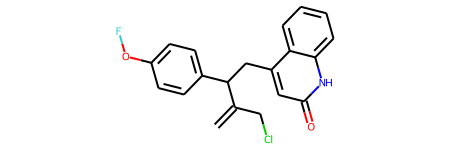

成功生成的高活性分子： C=C(CCl)C(Cc1cc(=O)[nH]c2ccccc12)c1ccc(OF)cc1 
Activity（越大药效越好）: 49.9057 
QED（越大类药性越高）: 0.5026 
SA（越小可合成性越高）: 3.2685 
logP（越大疏水性越好）: 4.9127 
------------------------------------------------------------------------------------------------------------


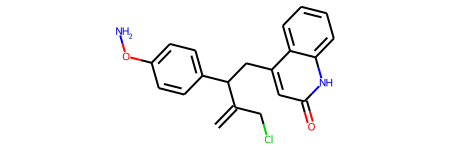

成功生成的高活性分子： C=C(CCl)C(Cc1cc(=O)[nH]c2ccccc12)c1ccc(ON)cc1 
Activity（越大药效越好）: 43.4615 
QED（越大类药性越高）: 0.4005 
SA（越小可合成性越高）: 3.2097 
logP（越大疏水性越好）: 3.9019 
------------------------------------------------------------------------------------------------------------


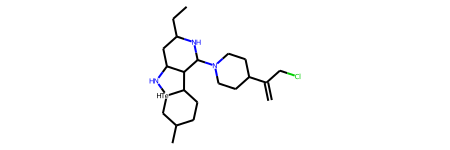

成功生成的高活性分子： C=C(CCl)C1CCN(C2NC(CC)CC3N[TeH]4CC(C)CCC4C32)CC1 
Activity（越大药效越好）: 22.8101 
QED（越大类药性越高）: 0.3539 
SA（越小可合成性越高）: 5.8151 
logP（越大疏水性越好）: 3.7033 
------------------------------------------------------------------------------------------------------------


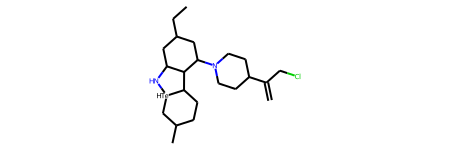

成功生成的高活性分子： C=C(CCl)C1CCN(C2CC(CC)CC3N[TeH]4CC(C)CCC4C32)CC1 
Activity（越大药效越好）: 10.0751 
QED（越大类药性越高）: 0.3434 
SA（越小可合成性越高）: 5.5910 
logP（越大疏水性越好）: 4.7939 
------------------------------------------------------------------------------------------------------------


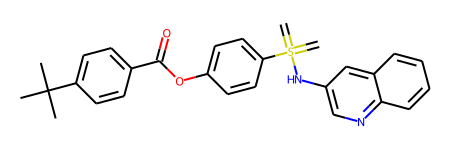

成功生成的高活性分子： C=S(=C)(Nc1cnc2ccccc2c1)c1ccc(OC(=O)c2ccc(C(C)(C)C)cc2)cc1 
Activity（越大药效越好）: 14.6708 
QED（越大类药性越高）: 0.2037 
SA（越小可合成性越高）: 2.5427 
logP（越大疏水性越好）: 6.8061 
------------------------------------------------------------------------------------------------------------


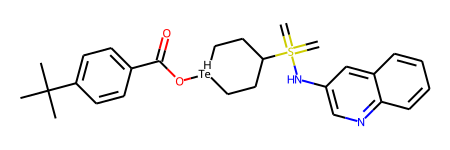

成功生成的高活性分子： C=S(=C)(Nc1cnc2ccccc2c1)C1CC[TeH](OC(=O)c2ccc(C(C)(C)C)cc2)CC1 
Activity（越大药效越好）: 21.1138 
QED（越大类药性越高）: 0.2867 
SA（越小可合成性越高）: 3.6436 
logP（越大疏水性越好）: 6.2710 
------------------------------------------------------------------------------------------------------------


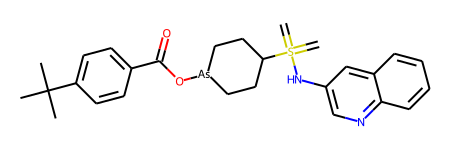

成功生成的高活性分子： C=S(=C)(Nc1cnc2ccccc2c1)C1CC[As](OC(=O)c2ccc(C(C)(C)C)cc2)CC1 
Activity（越大药效越好）: 18.7750 
QED（越大类药性越高）: 0.3043 
SA（越小可合成性越高）: 3.6202 
logP（越大疏水性越好）: 6.5387 
------------------------------------------------------------------------------------------------------------


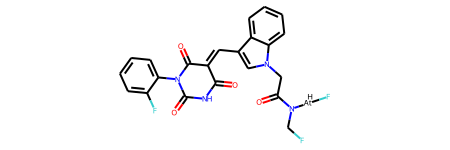

成功生成的高活性分子： O=C1NC(=O)N(c2ccccc2F)C(=O)/C1=C/c1cn(CC(=O)N(CF)[AtH]F)c2ccccc12 
Activity（越大药效越好）: 23.6210 
QED（越大类药性越高）: 0.2490 
SA（越小可合成性越高）: 3.2354 
logP（越大疏水性越好）: 2.8192 
------------------------------------------------------------------------------------------------------------


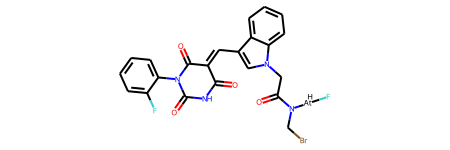

成功生成的高活性分子： O=C1NC(=O)N(c2ccccc2F)C(=O)/C1=C/c1cn(CC(=O)N(CBr)[AtH]F)c2ccccc12 
Activity（越大药效越好）: 16.7587 
QED（越大类药性越高）: 0.1829 
SA（越小可合成性越高）: 3.2445 
logP（越大疏水性越好）: 3.2446 
------------------------------------------------------------------------------------------------------------


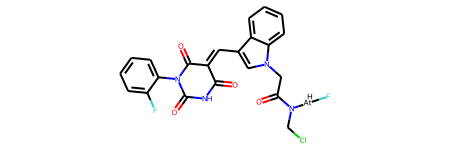

成功生成的高活性分子： O=C1NC(=O)N(c2ccccc2F)C(=O)/C1=C/c1cn(CC(=O)N(CCl)[AtH]F)c2ccccc12 
Activity（越大药效越好）: 27.2146 
QED（越大类药性越高）: 0.1873 
SA（越小可合成性越高）: 3.2179 
logP（越大疏水性越好）: 3.0885 
------------------------------------------------------------------------------------------------------------


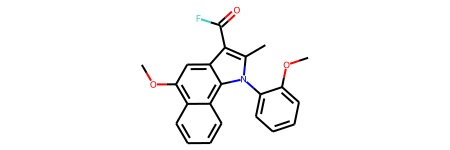

成功生成的高活性分子： COc1ccccc1-n1c(C)c(C(=O)F)c2cc(OC)c3ccccc3c21 
Activity（越大药效越好）: 21.6198 
QED（越大类药性越高）: 0.4669 
SA（越小可合成性越高）: 2.3881 
logP（越大疏水性越好）: 5.2190 
------------------------------------------------------------------------------------------------------------


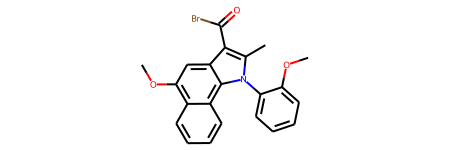

成功生成的高活性分子： COc1ccccc1-n1c(C)c(C(=O)Br)c2cc(OC)c3ccccc3c21 
Activity（越大药效越好）: 19.4752 
QED（越大类药性越高）: 0.3981 
SA（越小可合成性越高）: 2.4289 
logP（越大疏水性越好）: 5.6444 
------------------------------------------------------------------------------------------------------------


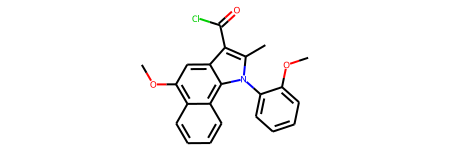

成功生成的高活性分子： COc1ccccc1-n1c(C)c(C(=O)Cl)c2cc(OC)c3ccccc3c21 
Activity（越大药效越好）: 14.4827 
QED（越大类药性越高）: 0.4401 
SA（越小可合成性越高）: 2.3375 
logP（越大疏水性越好）: 5.4883 
------------------------------------------------------------------------------------------------------------


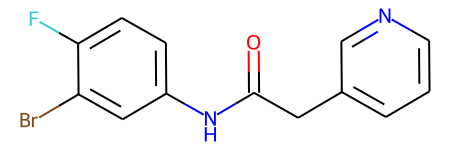

成功生成的高活性分子： O=C(Cc1cccnc1)Nc1ccc(F)c(Br)c1 
Activity（越大药效越好）: 20.7176 
QED（越大类药性越高）: 0.9461 
SA（越小可合成性越高）: 1.8498 
logP（越大疏水性越好）: 3.1644 
------------------------------------------------------------------------------------------------------------


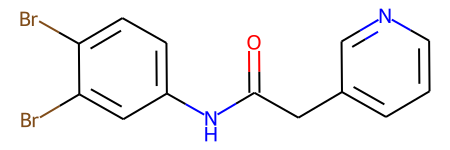

成功生成的高活性分子： O=C(Cc1cccnc1)Nc1ccc(Br)c(Br)c1 
Activity（越大药效越好）: 27.8934 
QED（越大类药性越高）: 0.8938 
SA（越小可合成性越高）: 1.9521 
logP（越大疏水性越好）: 3.7878 
------------------------------------------------------------------------------------------------------------


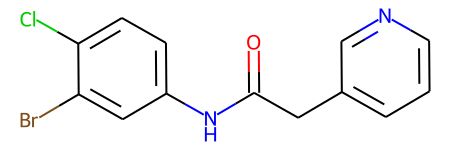

成功生成的高活性分子： O=C(Cc1cccnc1)Nc1ccc(Cl)c(Br)c1 
Activity（越大药效越好）: 25.8340 
QED（越大类药性越高）: 0.9351 
SA（越小可合成性越高）: 1.8990 
logP（越大疏水性越好）: 3.6787 
------------------------------------------------------------------------------------------------------------


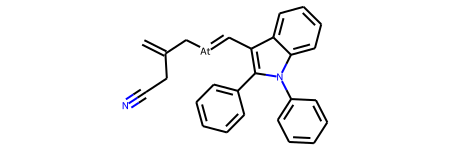

成功生成的高活性分子： C=C(CC#N)C/[At]=C/c1c(-c2ccccc2)n(-c2ccccc2)c2ccccc12 
Activity（越大药效越好）: 5.1653 
QED（越大类药性越高）: 0.2458 
SA（越小可合成性越高）: 3.0688 
logP（越大疏水性越好）: 6.4210 
------------------------------------------------------------------------------------------------------------


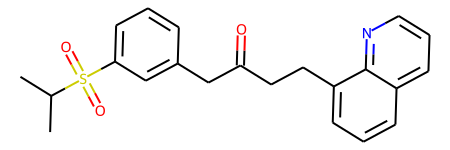

成功生成的高活性分子： CC(C)S(=O)(=O)c1cccc(CC(=O)CCc2cccc3cccnc23)c1 
Activity（越大药效越好）: 1.1736 
QED（越大类药性越高）: 0.6163 
SA（越小可合成性越高）: 2.3018 
logP（越大疏水性越好）: 4.1613 
------------------------------------------------------------------------------------------------------------


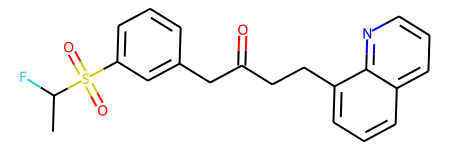

成功生成的高活性分子： CC(F)S(=O)(=O)c1cccc(CC(=O)CCc2cccc3cccnc23)c1 
Activity（越大药效越好）: -8.8985 
QED（越大类药性越高）: 0.6150 
SA（越小可合成性越高）: 2.9353 
logP（越大疏水性越好）: 4.0684 
------------------------------------------------------------------------------------------------------------


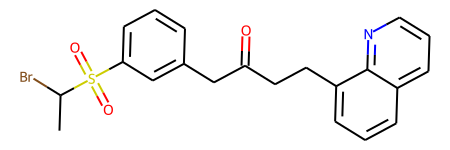

成功生成的高活性分子： CC(Br)S(=O)(=O)c1cccc(CC(=O)CCc2cccc3cccnc23)c1 
Activity（越大药效越好）: -6.1579 
QED（越大类药性越高）: 0.5019 
SA（越小可合成性越高）: 2.9572 
logP（越大疏水性越好）: 4.4938 
------------------------------------------------------------------------------------------------------------


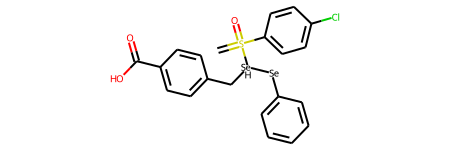

成功生成的高活性分子： C=S(=O)(c1ccc(Cl)cc1)[SeH](Cc1ccc(C(=O)O)cc1)[Se]c1ccccc1 
Activity（越大药效越好）: 10.0425 
QED（越大类药性越高）: 0.3674 
SA（越小可合成性越高）: 3.7628 
logP（越大疏水性越好）: 3.1456 
------------------------------------------------------------------------------------------------------------


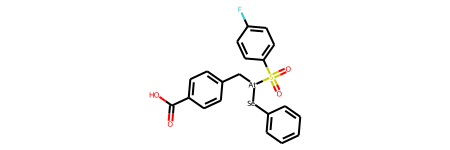

成功生成的高活性分子： O=C(O)c1ccc(C[At]([Se]c2ccccc2)S(=O)(=O)c2ccc(F)cc2)cc1 
Activity（越大药效越好）: 6.2402 
QED（越大类药性越高）: 0.3964 
SA（越小可合成性越高）: 3.0149 
logP（越大疏水性越好）: 2.9782 
------------------------------------------------------------------------------------------------------------


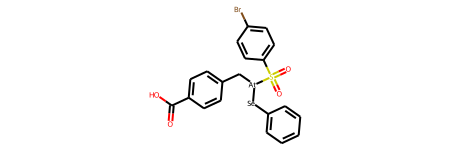

成功生成的高活性分子： O=C(O)c1ccc(C[At]([Se]c2ccccc2)S(=O)(=O)c2ccc(Br)cc2)cc1 
Activity（越大药效越好）: 14.1731 
QED（越大类药性越高）: 0.3794 
SA（越小可合成性越高）: 3.0574 
logP（越大疏水性越好）: 3.6016 
------------------------------------------------------------------------------------------------------------


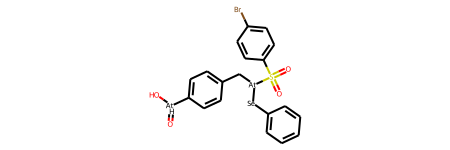

成功生成的高活性分子： O=[AtH](O)c1ccc(C[At]([Se]c2ccccc2)S(=O)(=O)c2ccc(Br)cc2)cc1 
Activity（越大药效越好）: 25.3577 
QED（越大类药性越高）: 0.3697 
SA（越小可合成性越高）: 4.3757 
logP（越大疏水性越好）: 2.1345 
------------------------------------------------------------------------------------------------------------


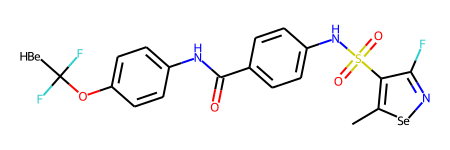

成功生成的高活性分子： [BeH]C(F)(F)Oc1ccc(NC(=O)c2ccc(NS(=O)(=O)c3c(F)n[se]c3C)cc2)cc1 
Activity（越大药效越好）: 17.1674 
QED（越大类药性越高）: 0.4736 
SA（越小可合成性越高）: 3.1713 
logP（越大疏水性越好）: 2.4691 
------------------------------------------------------------------------------------------------------------


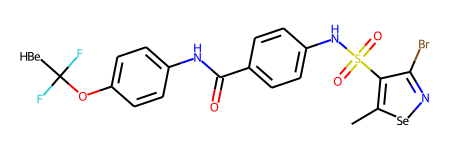

成功生成的高活性分子： [BeH]C(F)(F)Oc1ccc(NC(=O)c2ccc(NS(=O)(=O)c3c(Br)n[se]c3C)cc2)cc1 
Activity（越大药效越好）: 20.1010 
QED（越大类药性越高）: 0.4234 
SA（越小可合成性越高）: 3.1876 
logP（越大疏水性越好）: 3.0925 
------------------------------------------------------------------------------------------------------------


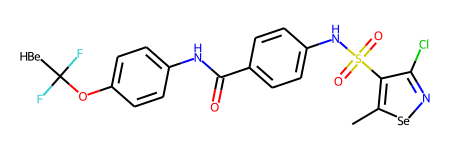

成功生成的高活性分子： [BeH]C(F)(F)Oc1ccc(NC(=O)c2ccc(NS(=O)(=O)c3c(Cl)n[se]c3C)cc2)cc1 
Activity（越大药效越好）: 29.5306 
QED（越大类药性越高）: 0.4588 
SA（越小可合成性越高）: 3.1538 
logP（越大疏水性越好）: 2.9834 
------------------------------------------------------------------------------------------------------------


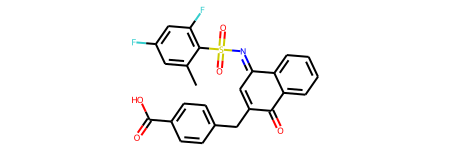

成功生成的高活性分子： Cc1cc(F)cc(F)c1S(=O)(=O)/N=C1\C=C(Cc2ccc(C(=O)O)cc2)C(=O)c2ccccc21 
Activity（越大药效越好）: 5.5000 
QED（越大类药性越高）: 0.5778 
SA（越小可合成性越高）: 2.7259 
logP（越大疏水性越好）: 4.5148 
------------------------------------------------------------------------------------------------------------


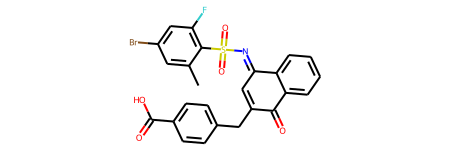

成功生成的高活性分子： Cc1cc(Br)cc(F)c1S(=O)(=O)/N=C1\C=C(Cc2ccc(C(=O)O)cc2)C(=O)c2ccccc21 
Activity（越大药效越好）: 12.2552 
QED（越大类药性越高）: 0.4816 
SA（越小可合成性越高）: 2.7596 
logP（越大疏水性越好）: 5.1382 
------------------------------------------------------------------------------------------------------------


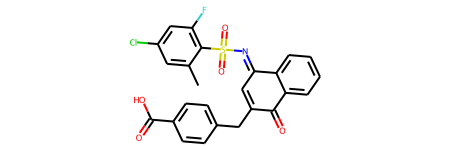

成功生成的高活性分子： Cc1cc(Cl)cc(F)c1S(=O)(=O)/N=C1\C=C(Cc2ccc(C(=O)O)cc2)C(=O)c2ccccc21 
Activity（越大药效越好）: 8.4857 
QED（越大类药性越高）: 0.5325 
SA（越小可合成性越高）: 2.7344 
logP（越大疏水性越好）: 5.0291 
------------------------------------------------------------------------------------------------------------


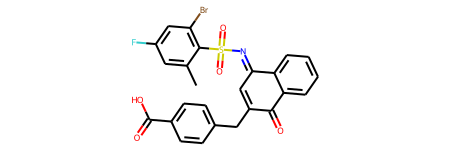

成功生成的高活性分子： Cc1cc(F)cc(Br)c1S(=O)(=O)/N=C1\C=C(Cc2ccc(C(=O)O)cc2)C(=O)c2ccccc21 
Activity（越大药效越好）: 10.2342 
QED（越大类药性越高）: 0.4816 
SA（越小可合成性越高）: 2.7612 
logP（越大疏水性越好）: 5.1382 
------------------------------------------------------------------------------------------------------------


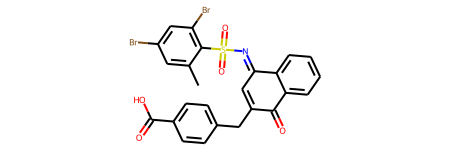

成功生成的高活性分子： Cc1cc(Br)cc(Br)c1S(=O)(=O)/N=C1\C=C(Cc2ccc(C(=O)O)cc2)C(=O)c2ccccc21 
Activity（越大药效越好）: 16.1546 
QED（越大类药性越高）: 0.4000 
SA（越小可合成性越高）: 2.7826 
logP（越大疏水性越好）: 5.7616 
------------------------------------------------------------------------------------------------------------


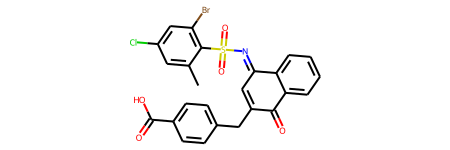

成功生成的高活性分子： Cc1cc(Cl)cc(Br)c1S(=O)(=O)/N=C1\C=C(Cc2ccc(C(=O)O)cc2)C(=O)c2ccccc21 
Activity（越大药效越好）: 15.4098 
QED（越大类药性越高）: 0.4359 
SA（越小可合成性越高）: 2.7609 
logP（越大疏水性越好）: 5.6525 
------------------------------------------------------------------------------------------------------------


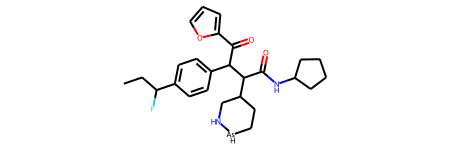

成功生成的高活性分子： CCC(F)c1ccc(C(C(=O)c2ccco2)C(C(=O)NC2CCCC2)C2CC[AsH]NC2)cc1 
Activity（越大药效越好）: 4.2071 
QED（越大类药性越高）: 0.3739 
SA（越小可合成性越高）: 4.8146 
logP（越大疏水性越好）: 4.7210 
------------------------------------------------------------------------------------------------------------


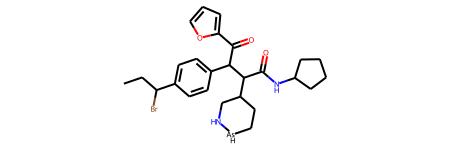

成功生成的高活性分子： CCC(Br)c1ccc(C(C(=O)c2ccco2)C(C(=O)NC2CCCC2)C2CC[AsH]NC2)cc1 
Activity（越大药效越好）: -0.0340 
QED（越大类药性越高）: 0.2460 
SA（越小可合成性越高）: 4.7762 
logP（越大疏水性越好）: 5.1464 
------------------------------------------------------------------------------------------------------------


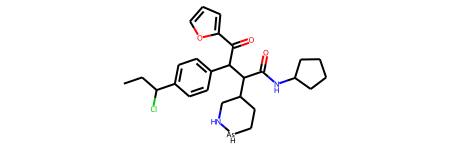

成功生成的高活性分子： CCC(Cl)c1ccc(C(C(=O)c2ccco2)C(C(=O)NC2CCCC2)C2CC[AsH]NC2)cc1 
Activity（越大药效越好）: 20.1553 
QED（越大类药性越高）: 0.2711 
SA（越小可合成性越高）: 4.7668 
logP（越大疏水性越好）: 4.9903 
------------------------------------------------------------------------------------------------------------


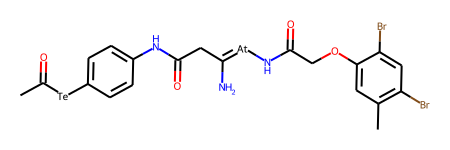

成功生成的高活性分子： CC(=O)[Te]c1ccc(NC(=O)C/C(N)=[At]/NC(=O)COc2cc(C)c(Br)cc2Br)cc1 
Activity（越大药效越好）: 7.7827 
QED（越大类药性越高）: 0.3350 
SA（越小可合成性越高）: 3.6820 
logP（越大疏水性越好）: 2.0084 
------------------------------------------------------------------------------------------------------------


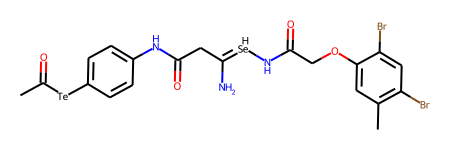

成功生成的高活性分子： CC(=O)[Te]c1ccc(NC(=O)C/C(N)=[SeH]/NC(=O)COc2cc(C)c(Br)cc2Br)cc1 
Activity（越大药效越好）: 5.7513 
QED（越大类药性越高）: 0.3378 
SA（越小可合成性越高）: 3.6820 
logP（越大疏水性越好）: 1.3599 
------------------------------------------------------------------------------------------------------------


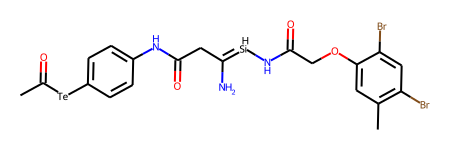

成功生成的高活性分子： CC(=O)[Te]c1ccc(NC(=O)C/C(N)=[SiH]/NC(=O)COc2cc(C)c(Br)cc2Br)cc1 
Activity（越大药效越好）: 5.8414 
QED（越大类药性越高）: 0.3466 
SA（越小可合成性越高）: 3.6600 
logP（越大疏水性越好）: 1.3599 
------------------------------------------------------------------------------------------------------------


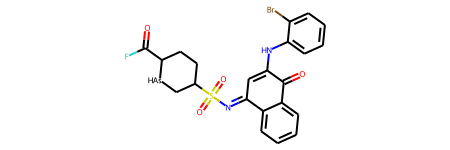

成功生成的高活性分子： O=C1C(Nc2ccccc2Br)=C/C(=N\S(=O)(=O)C2CCC(C(=O)F)[AsH]C2)c2ccccc21 
Activity（越大药效越好）: -3.0541 
QED（越大类药性越高）: 0.4251 
SA（越小可合成性越高）: 4.5281 
logP（越大疏水性越好）: 4.0621 
------------------------------------------------------------------------------------------------------------


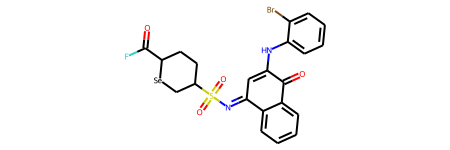

成功生成的高活性分子： O=C1C(Nc2ccccc2Br)=C/C(=N\S(=O)(=O)C2CCC(C(=O)F)[Se]C2)c2ccccc21 
Activity（越大药效越好）: 5.9143 
QED（越大类药性越高）: 0.4177 
SA（越小可合成性越高）: 4.2635 
logP（越大疏水性越好）: 4.3298 
------------------------------------------------------------------------------------------------------------


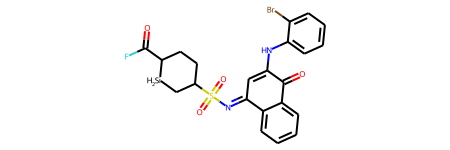

成功生成的高活性分子： O=C1C(Nc2ccccc2Br)=C/C(=N\S(=O)(=O)C2CCC(C(=O)F)[SiH2]C2)c2ccccc21 
Activity（越大药效越好）: 1.2606 
QED（越大类药性越高）: 0.4648 
SA（越小可合成性越高）: 4.3301 
logP（越大疏水性越好）: 3.7944 
------------------------------------------------------------------------------------------------------------


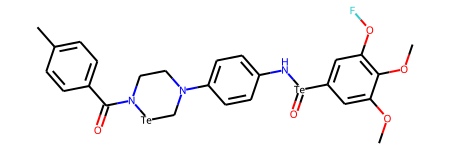

成功生成的高活性分子： COc1cc([Te](=O)Nc2ccc(N3CCN(C(=O)c4ccc(C)cc4)[Te]C3)cc2)cc(OF)c1OC 
Activity（越大药效越好）: 22.2031 
QED（越大类药性越高）: 0.3587 
SA（越小可合成性越高）: 3.8653 
logP（越大疏水性越好）: 3.0524 
------------------------------------------------------------------------------------------------------------


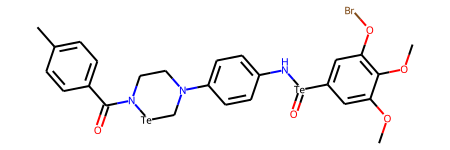

成功生成的高活性分子： COc1cc([Te](=O)Nc2ccc(N3CCN(C(=O)c4ccc(C)cc4)[Te]C3)cc2)cc(OBr)c1OC 
Activity（越大药效越好）: 24.5074 
QED（越大类药性越高）: 0.3512 
SA（越小可合成性越高）: 3.9118 
logP（越大疏水性越好）: 3.4778 
------------------------------------------------------------------------------------------------------------


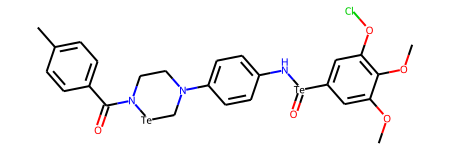

成功生成的高活性分子： COc1cc([Te](=O)Nc2ccc(N3CCN(C(=O)c4ccc(C)cc4)[Te]C3)cc2)cc(OCl)c1OC 
Activity（越大药效越好）: 16.8504 
QED（越大类药性越高）: 0.3558 
SA（越小可合成性越高）: 3.8542 
logP（越大疏水性越好）: 3.3217 
------------------------------------------------------------------------------------------------------------


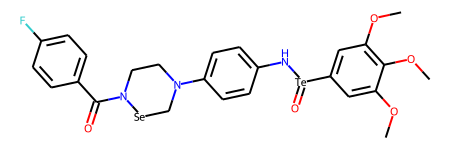

成功生成的高活性分子： COc1cc([Te](=O)Nc2ccc(N3CCN(C(=O)c4ccc(F)cc4)[Se]C3)cc2)cc(OC)c1OC 
Activity（越大药效越好）: 22.7080 
QED（越大类药性越高）: 0.3688 
SA（越小可合成性越高）: 3.6024 
logP（越大疏水性越好）: 2.6284 
------------------------------------------------------------------------------------------------------------


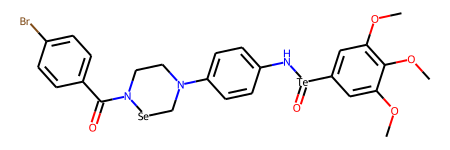

成功生成的高活性分子： COc1cc([Te](=O)Nc2ccc(N3CCN(C(=O)c4ccc(Br)cc4)[Se]C3)cc2)cc(OC)c1OC 
Activity（越大药效越好）: 25.3041 
QED（越大类药性越高）: 0.3566 
SA（越小可合成性越高）: 3.6353 
logP（越大疏水性越好）: 3.2518 
------------------------------------------------------------------------------------------------------------


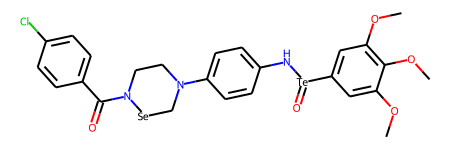

成功生成的高活性分子： COc1cc([Te](=O)Nc2ccc(N3CCN(C(=O)c4ccc(Cl)cc4)[Se]C3)cc2)cc(OC)c1OC 
Activity（越大药效越好）: 29.9671 
QED（越大类药性越高）: 0.3645 
SA（越小可合成性越高）: 3.5989 
logP（越大疏水性越好）: 3.1427 
------------------------------------------------------------------------------------------------------------


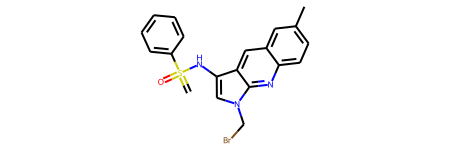

成功生成的高活性分子： C=S(=O)(Nc1cn(CBr)c2nc3ccc(C)cc3cc12)c1ccccc1 
Activity（越大药效越好）: 13.5494 
QED（越大类药性越高）: 0.3693 
SA（越小可合成性越高）: 3.3748 
logP（越大疏水性越好）: 4.9527 
------------------------------------------------------------------------------------------------------------


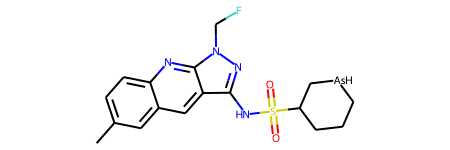

成功生成的高活性分子： Cc1ccc2nc3c(cc2c1)c(NS(=O)(=O)C1CCC[AsH]C1)nn3CF 
Activity（越大药效越好）: 2.1768 
QED（越大类药性越高）: 0.6358 
SA（越小可合成性越高）: 4.4002 
logP（越大疏水性越好）: 2.9971 
------------------------------------------------------------------------------------------------------------


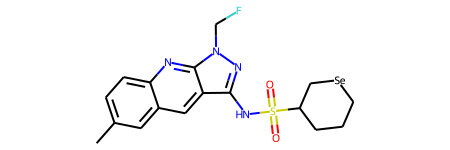

成功生成的高活性分子： Cc1ccc2nc3c(cc2c1)c(NS(=O)(=O)C1CCC[Se]C1)nn3CF 
Activity（越大药效越好）: 7.1634 
QED（越大类药性越高）: 0.6310 
SA（越小可合成性越高）: 4.0105 
logP（越大疏水性越好）: 3.2648 
------------------------------------------------------------------------------------------------------------


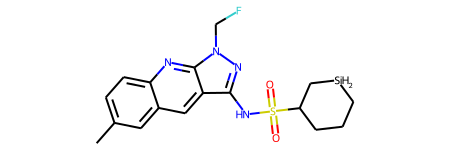

成功生成的高活性分子： Cc1ccc2nc3c(cc2c1)c(NS(=O)(=O)C1CCC[SiH2]C1)nn3CF 
Activity（越大药效越好）: 3.5477 
QED（越大类药性越高）: 0.6928 
SA（越小可合成性越高）: 4.0675 
logP（越大疏水性越好）: 2.7294 
------------------------------------------------------------------------------------------------------------


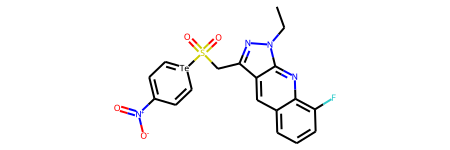

成功生成的高活性分子： CCn1nc(CS(=O)(=O)[Te]2=CC=C([N+](=O)[O-])C=C2)c2cc3cccc(F)c3nc21 
Activity（越大药效越好）: 5.6406 
QED（越大类药性越高）: 0.2850 
SA（越小可合成性越高）: 3.9112 
logP（越大疏水性越好）: 2.3033 
------------------------------------------------------------------------------------------------------------


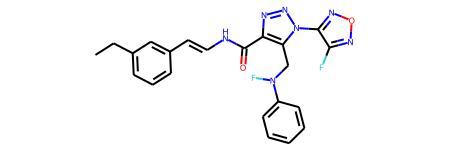

成功生成的高活性分子： CCc1cccc(/C=C/NC(=O)c2nnn(-c3nonc3F)c2CN(F)c2ccccc2)c1 
Activity（越大药效越好）: 16.8850 
QED（越大类药性越高）: 0.4082 
SA（越小可合成性越高）: 3.3682 
logP（越大疏水性越好）: 3.6436 
------------------------------------------------------------------------------------------------------------


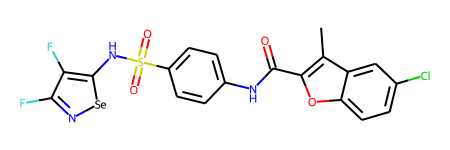

成功生成的高活性分子： Cc1c(C(=O)Nc2ccc(S(=O)(=O)Nc3[se]nc(F)c3F)cc2)oc2ccc(Cl)cc12 
Activity（越大药效越好）: 8.8183 
QED（越大类药性越高）: 0.3771 
SA（越小可合成性越高）: 2.9987 
logP（越大疏水性越好）: 4.1779 
------------------------------------------------------------------------------------------------------------


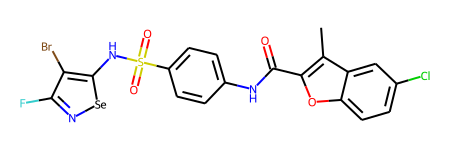

成功生成的高活性分子： Cc1c(C(=O)Nc2ccc(S(=O)(=O)Nc3[se]nc(F)c3Br)cc2)oc2ccc(Cl)cc12 
Activity（越大药效越好）: 6.9816 
QED（越大类药性越高）: 0.3249 
SA（越小可合成性越高）: 3.0181 
logP（越大疏水性越好）: 4.8013 
------------------------------------------------------------------------------------------------------------


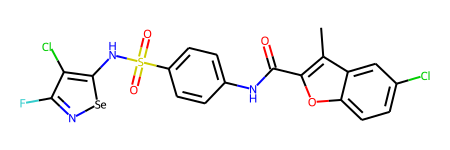

成功生成的高活性分子： Cc1c(C(=O)Nc2ccc(S(=O)(=O)Nc3[se]nc(F)c3Cl)cc2)oc2ccc(Cl)cc12 
Activity（越大药效越好）: 12.0964 
QED（越大类药性越高）: 0.3534 
SA（越小可合成性越高）: 2.9955 
logP（越大疏水性越好）: 4.6922 
------------------------------------------------------------------------------------------------------------


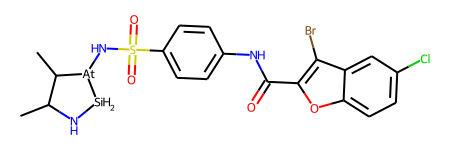

成功生成的高活性分子： CC1N[SiH2][At](NS(=O)(=O)c2ccc(NC(=O)c3oc4ccc(Cl)cc4c3Br)cc2)C1C 
Activity（越大药效越好）: 13.8791 
QED（越大类药性越高）: 0.3471 
SA（越小可合成性越高）: 4.2536 
logP（越大疏水性越好）: 3.7139 
------------------------------------------------------------------------------------------------------------


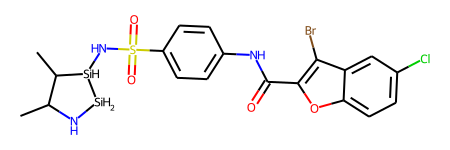

成功生成的高活性分子： CC1N[SiH2][SiH](NS(=O)(=O)c2ccc(NC(=O)c3oc4ccc(Cl)cc4c3Br)cc2)C1C 
Activity（越大药效越好）: -2.1910 
QED（越大类药性越高）: 0.4181 
SA（越小可合成性越高）: 4.3867 
logP（越大疏水性越好）: 3.0654 
------------------------------------------------------------------------------------------------------------


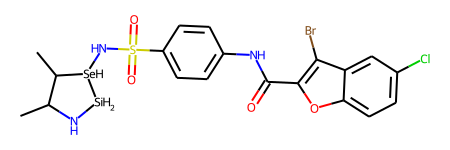

成功生成的高活性分子： CC1N[SiH2][SeH](NS(=O)(=O)c2ccc(NC(=O)c3oc4ccc(Cl)cc4c3Br)cc2)C1C 
Activity（越大药效越好）: 6.2866 
QED（越大类药性越高）: 0.3865 
SA（越小可合成性越高）: 4.4266 
logP（越大疏水性越好）: 3.0654 
------------------------------------------------------------------------------------------------------------


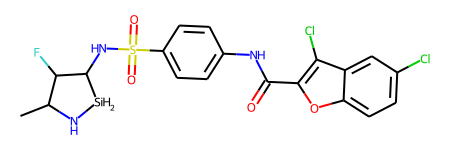

成功生成的高活性分子： CC1N[SiH2]C(NS(=O)(=O)c2ccc(NC(=O)c3oc4ccc(Cl)cc4c3Cl)cc2)C1F 
Activity（越大药效越好）: -10.3048 
QED（越大类药性越高）: 0.4662 
SA（越小可合成性越高）: 4.1648 
logP（越大疏水性越好）: 3.0099 
------------------------------------------------------------------------------------------------------------


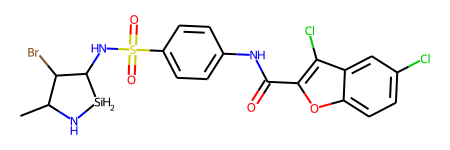

成功生成的高活性分子： CC1N[SiH2]C(NS(=O)(=O)c2ccc(NC(=O)c3oc4ccc(Cl)cc4c3Cl)cc2)C1Br 
Activity（越大药效越好）: -1.8015 
QED（越大类药性越高）: 0.3266 
SA（越小可合成性越高）: 4.1781 
logP（越大疏水性越好）: 3.4353 
------------------------------------------------------------------------------------------------------------


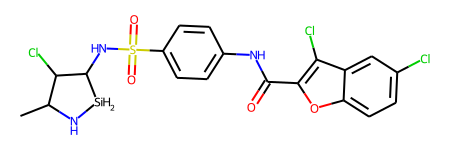

成功生成的高活性分子： CC1N[SiH2]C(NS(=O)(=O)c2ccc(NC(=O)c3oc4ccc(Cl)cc4c3Cl)cc2)C1Cl 
Activity（越大药效越好）: 8.7843 
QED（越大类药性越高）: 0.3555 
SA（越小可合成性越高）: 4.1710 
logP（越大疏水性越好）: 3.2792 
------------------------------------------------------------------------------------------------------------


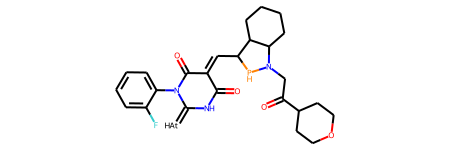

成功生成的高活性分子： O=C1NC(=[AtH])N(c2ccccc2F)C(=O)/C1=C/C1PN(CC(=O)C2CCOCC2)C2CCCCC12 
Activity（越大药效越好）: -22.9946 
QED（越大类药性越高）: 0.2912 
SA（越小可合成性越高）: 4.8782 
logP（越大疏水性越好）: 2.4161 
------------------------------------------------------------------------------------------------------------


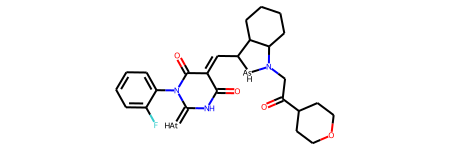

成功生成的高活性分子： O=C1NC(=[AtH])N(c2ccccc2F)C(=O)/C1=C/C1[AsH]N(CC(=O)C2CCOCC2)C2CCCCC12 
Activity（越大药效越好）: -19.9761 
QED（越大类药性越高）: 0.2824 
SA（越小可合成性越高）: 4.9016 
logP（越大疏水性越好）: 1.5940 
------------------------------------------------------------------------------------------------------------


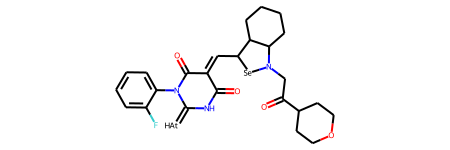

成功生成的高活性分子： O=C1NC(=[AtH])N(c2ccccc2F)C(=O)/C1=C/C1[Se]N(CC(=O)C2CCOCC2)C2CCCCC12 
Activity（越大药效越好）: -17.3793 
QED（越大类药性越高）: 0.2836 
SA（越小可合成性越高）: 4.7363 
logP（越大疏水性越好）: 1.8617 
------------------------------------------------------------------------------------------------------------


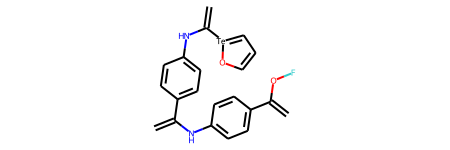

成功生成的高活性分子： C=C(Nc1ccc(C(=C)OF)cc1)c1ccc(NC(=C)[Te]2=CC=CO2)cc1 
Activity（越大药效越好）: 25.1007 
QED（越大类药性越高）: 0.4134 
SA（越小可合成性越高）: 3.7924 
logP（越大疏水性越好）: 5.0253 
------------------------------------------------------------------------------------------------------------


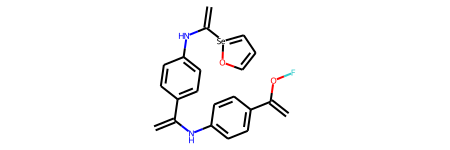

成功生成的高活性分子： C=C(Nc1ccc(C(=C)OF)cc1)c1ccc(NC(=C)[Se]2=CC=CO2)cc1 
Activity（越大药效越好）: 25.6747 
QED（越大类药性越高）: 0.4567 
SA（越小可合成性越高）: 4.1795 
logP（越大疏水性越好）: 5.0253 
------------------------------------------------------------------------------------------------------------


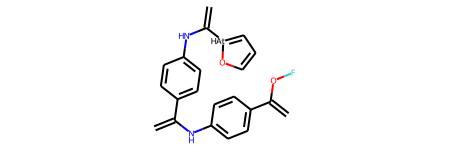

成功生成的高活性分子： C=C(Nc1ccc(C(=C)OF)cc1)c1ccc(NC(=C)[AtH]2=CC=CO2)cc1 
Activity（越大药效越好）: 39.8953 
QED（越大类药性越高）: 0.4387 
SA（越小可合成性越高）: 4.2092 
logP（越大疏水性越好）: 5.1384 
------------------------------------------------------------------------------------------------------------


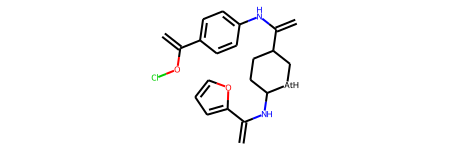

成功生成的高活性分子： C=C(OCl)c1ccc(NC(=C)C2CCC(NC(=C)c3ccco3)[AtH]C2)cc1 
Activity（越大药效越好）: 2.6516 
QED（越大类药性越高）: 0.4000 
SA（越小可合成性越高）: 4.5983 
logP（越大疏水性越好）: 5.5785 
------------------------------------------------------------------------------------------------------------


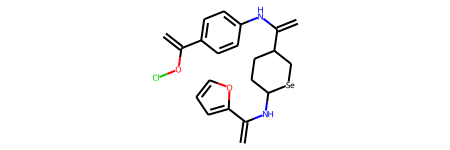

成功生成的高活性分子： C=C(OCl)c1ccc(NC(=C)C2CCC(NC(=C)c3ccco3)[Se]C2)cc1 
Activity（越大药效越好）: 9.7853 
QED（越大类药性越高）: 0.4145 
SA（越小可合成性越高）: 4.4912 
logP（越大疏水性越好）: 5.4654 
------------------------------------------------------------------------------------------------------------


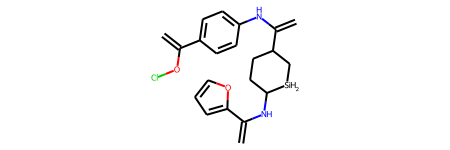

成功生成的高活性分子： C=C(OCl)c1ccc(NC(=C)C2CCC(NC(=C)c3ccco3)[SiH2]C2)cc1 
Activity（越大药效越好）: 0.5634 
QED（越大类药性越高）: 0.4868 
SA（越小可合成性越高）: 4.5534 
logP（越大疏水性越好）: 4.9300 
------------------------------------------------------------------------------------------------------------


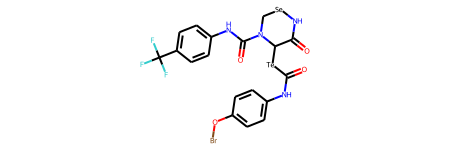

成功生成的高活性分子： O=C(Nc1ccc(OBr)cc1)[Te]C1C(=O)N[Se]CN1C(=O)Nc1ccc(C(F)(F)F)cc1 
Activity（越大药效越好）: 39.2314 
QED（越大类药性越高）: 0.4196 
SA（越小可合成性越高）: 4.1534 
logP（越大疏水性越好）: 3.1969 
------------------------------------------------------------------------------------------------------------


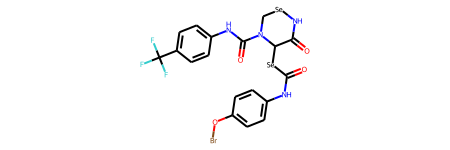

成功生成的高活性分子： O=C(Nc1ccc(OBr)cc1)[Se]C1C(=O)N[Se]CN1C(=O)Nc1ccc(C(F)(F)F)cc1 
Activity（越大药效越好）: 39.4581 
QED（越大类药性越高）: 0.4357 
SA（越小可合成性越高）: 4.1366 
logP（越大疏水性越好）: 3.1969 
------------------------------------------------------------------------------------------------------------


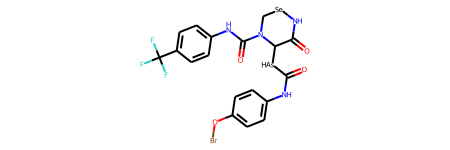

成功生成的高活性分子： O=C(Nc1ccc(OBr)cc1)[AsH]C1C(=O)N[Se]CN1C(=O)Nc1ccc(C(F)(F)F)cc1 
Activity（越大药效越好）: 34.0452 
QED（越大类药性越高）: 0.4376 
SA（越小可合成性越高）: 4.4195 
logP（越大疏水性越好）: 2.9292 
------------------------------------------------------------------------------------------------------------


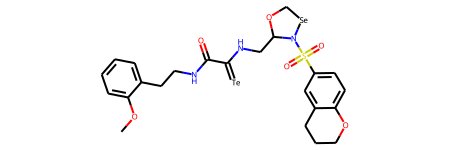

成功生成的高活性分子： COc1ccccc1CCNC(=O)C(=[Te])NCC1OC[Se]N1S(=O)(=O)c1ccc2c(c1)CCCO2 
Activity（越大药效越好）: 10.7271 
QED（越大类药性越高）: 0.3459 
SA（越小可合成性越高）: 3.9983 
logP（越大疏水性越好）: 0.1908 
------------------------------------------------------------------------------------------------------------


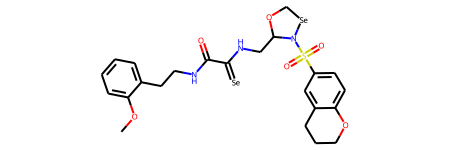

成功生成的高活性分子： COc1ccccc1CCNC(=O)C(=[Se])NCC1OC[Se]N1S(=O)(=O)c1ccc2c(c1)CCCO2 
Activity（越大药效越好）: 7.8795 
QED（越大类药性越高）: 0.3612 
SA（越小可合成性越高）: 3.9723 
logP（越大疏水性越好）: 0.1908 
------------------------------------------------------------------------------------------------------------


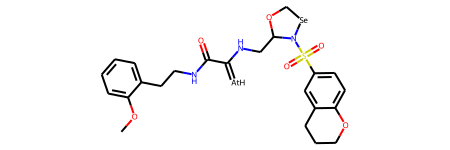

成功生成的高活性分子： COc1ccccc1CCNC(=O)C(=[AtH])NCC1OC[Se]N1S(=O)(=O)c1ccc2c(c1)CCCO2 
Activity（越大药效越好）: 9.7881 
QED（越大类药性越高）: 0.3362 
SA（越小可合成性越高）: 4.0350 
logP（越大疏水性越好）: 0.3039 
------------------------------------------------------------------------------------------------------------


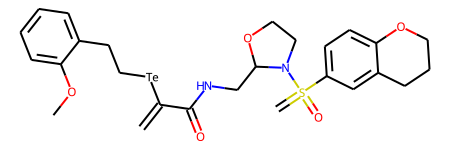

成功生成的高活性分子： C=C([Te]CCc1ccccc1OC)C(=O)NCC1OCCN1S(=C)(=O)c1ccc2c(c1)CCCO2 
Activity（越大药效越好）: -2.6487 
QED（越大类药性越高）: 0.2540 
SA（越小可合成性越高）: 4.1924 
logP（越大疏水性越好）: 2.6639 
------------------------------------------------------------------------------------------------------------


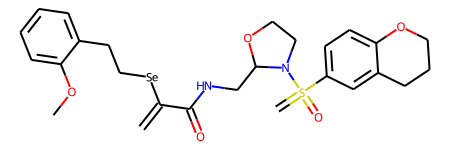

成功生成的高活性分子： C=C([Se]CCc1ccccc1OC)C(=O)NCC1OCCN1S(=C)(=O)c1ccc2c(c1)CCCO2 
Activity（越大药效越好）: -1.2876 
QED（越大类药性越高）: 0.2735 
SA（越小可合成性越高）: 4.1416 
logP（越大疏水性越好）: 2.6639 
------------------------------------------------------------------------------------------------------------


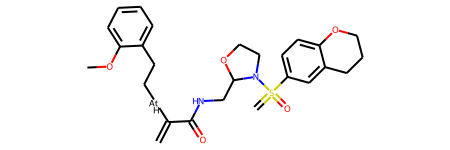

成功生成的高活性分子： C=C([AtH]CCc1ccccc1OC)C(=O)NCC1OCCN1S(=C)(=O)c1ccc2c(c1)CCCO2 
Activity（越大药效越好）: 2.5322 
QED（越大类药性越高）: 0.3061 
SA（越小可合成性越高）: 4.2623 
logP（越大疏水性越好）: 2.7770 
------------------------------------------------------------------------------------------------------------


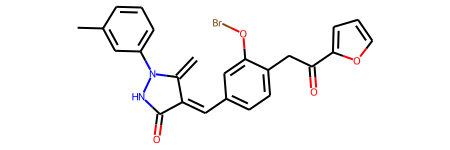

成功生成的高活性分子： C=c1/c(=C\c2ccc(CC(=O)c3ccco3)c(OBr)c2)c(=O)[nH]n1-c1cccc(C)c1 
Activity（越大药效越好）: 41.9419 
QED（越大类药性越高）: 0.4304 
SA（越小可合成性越高）: 3.2405 
logP（越大疏水性越好）: 3.4202 
------------------------------------------------------------------------------------------------------------


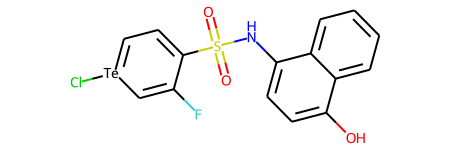

成功生成的高活性分子： O=S(=O)(Nc1ccc(O)c2ccccc12)C1=CC=[Te](Cl)C=C1F 
Activity（越大药效越好）: 23.8168 
QED（越大类药性越高）: 0.5386 
SA（越小可合成性越高）: 3.4752 
logP（越大疏水性越好）: 3.1914 
------------------------------------------------------------------------------------------------------------


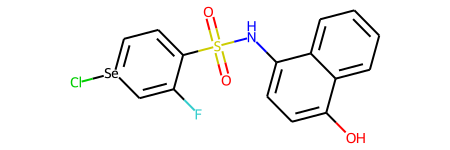

成功生成的高活性分子： O=S(=O)(Nc1ccc(O)c2ccccc12)C1=CC=[Se](Cl)C=C1F 
Activity（越大药效越好）: 32.3511 
QED（越大类药性越高）: 0.5941 
SA（越小可合成性越高）: 3.8562 
logP（越大疏水性越好）: 3.1914 
------------------------------------------------------------------------------------------------------------


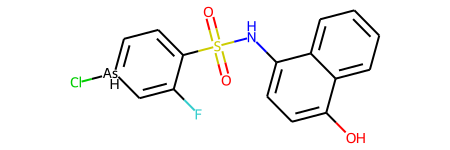

成功生成的高活性分子： O=S(=O)(Nc1ccc(O)c2ccccc12)C1=CC=[AsH](Cl)C=C1F 
Activity（越大药效越好）: 42.8036 
QED（越大类药性越高）: 0.5982 
SA（越小可合成性越高）: 3.8920 
logP（越大疏水性越好）: 2.9237 
------------------------------------------------------------------------------------------------------------


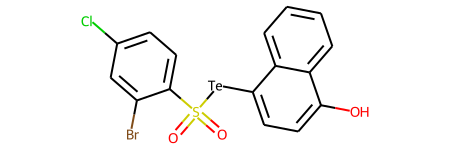

成功生成的高活性分子： O=S(=O)([Te]c1ccc(O)c2ccccc12)c1ccc(Cl)cc1Br 
Activity（越大药效越好）: 28.3628 
QED（越大类药性越高）: 0.5316 
SA（越小可合成性越高）: 2.9594 
logP（越大疏水性越好）: 3.6797 
------------------------------------------------------------------------------------------------------------


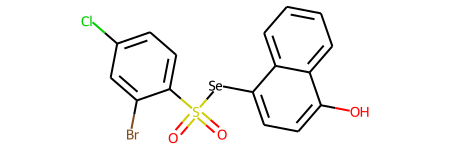

成功生成的高活性分子： O=S(=O)([Se]c1ccc(O)c2ccccc12)c1ccc(Cl)cc1Br 
Activity（越大药效越好）: 21.6944 
QED（越大类药性越高）: 0.5871 
SA（越小可合成性越高）: 2.8997 
logP（越大疏水性越好）: 3.6797 
------------------------------------------------------------------------------------------------------------


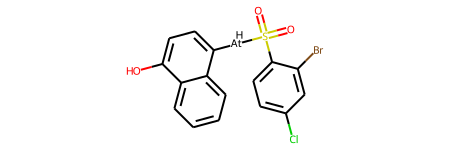

成功生成的高活性分子： O=S(=O)([AtH]c1ccc(O)c2ccccc12)c1ccc(Cl)cc1Br 
Activity（越大药效越好）: 24.4216 
QED（越大类药性越高）: 0.4928 
SA（越小可合成性越高）: 3.0450 
logP（越大疏水性越好）: 3.7928 
------------------------------------------------------------------------------------------------------------


In [200]:
generated_df = pd.DataFrame([])
generated_df['smiles'] = generated_smiles
generated_df = add_canonical_smiles(generated_df)
generated_df = generated_df.reset_index(drop=True)
feature_dicts = save_smiles_dicts(generated_df['cano_smiles'],filename)
x_atom, x_bonds, x_atom_index, x_bond_index, x_mask, smiles_to_rdkit_list = get_smiles_array(generated_df['cano_smiles'],feature_dicts)
x_atom = torch.Tensor(x_atom)
x_bonds = torch.Tensor(x_bonds)
x_bond_index = torch.cuda.LongTensor(x_bond_index)
mol_feature = model(torch.Tensor(x_atom),torch.Tensor(x_bonds),torch.cuda.LongTensor(x_atom_index),torch.cuda.LongTensor(x_bond_index),torch.Tensor(x_mask))
eps_adv, d_adv, vat_loss, mol_prediction = perturb_feature(mol_feature, amodel, alpha=1, lamda=10**-learning_rate)
mol_prediction = np.array(mol_prediction.detach().cpu())
test_predict_scores = ((100-15)*(mol_prediction+5)/10+15)
generated_df['Predicted_Activity_Score'] = test_predict_scores
generated_df['QED'] = QED_scores
generated_df['SA'] = SA_scores
generated_df['logP'] = logP_scores
generated_df.to_csv(path_or_buf='./result/'+file1+'_generated_molecules.csv')
print(len(test_predict),len(generated_mols))
G_SMILES_Dict = {generated_mols[i]: [QED_scores[i], SA_scores[i], logP_scores[i]] for i in range(len(generated_mols))}
for i, mol in enumerate(generated_mols):
    index = generated_mols.index(mol)
    display(mol)
    print('成功生成的高活性分子：',Chem.MolToSmiles(mol),
          '\nActivity（越大药效越好）: %.4f'%test_predict_scores[index],
         '\nQED（越大类药性越高）: %.4f'%G_SMILES_Dict[mol][0],
          '\nSA（越小可合成性越高）: %.4f'%G_SMILES_Dict[mol][1],
          '\nlogP（越大疏水性越好）: %.4f'%G_SMILES_Dict[mol][2],
         '\n------------------------------------------------------------------------------------------------------------')

In [ ]:
# print('target_file:',train_filename)
# print('inactive_file:',test_filename)
# np.savez('./result/G_AFSE_'+file1, epoch_list, train_f_list, train_d_list, 
#          train_predict_list, train_y_list, val_f_list, val_d_list, val_predict_list, val_y_list, test_f_list, 
#          test_d_list, test_predict_list, test_y_list)
# sim_space = np.load('./result/G_AFSE_'+file1+".npz")
# print(sim_space['arr_10'].shape)

In [ ]:
# 只重构原子符号
# 不训练测试集